In [1]:
import sys, os
import json, pickle
import matplotlib.pyplot as plt
import matplotlib as mpl
import numpy as np
import pandas as pd
import time as pytimec
import statsmodels.tsa.stattools as tsa
import statsmodels.stats.weightstats as wst
import ruptures as rpt
sys.path.append('../..')
import InsanallyLabEphysTools as ilep
from scipy.stats import gaussian_kde, sem, ttest_ind, ttest_rel, norm, mannwhitneyu, linregress, wilcoxon, sem, normaltest
from tqdm import tqdm
from types import SimpleNamespace
from sklearn import linear_model
from sklearn.model_selection import KFold
import seaborn as sns
import traceback
from itertools import product
import pingouin as pg
from brokenaxes import brokenaxes

plt.rcParams['legend.fontsize'] = 'small'
plt.rcParams['axes.labelsize'] = 'medium'
plt.rcParams['axes.formatter.limits'] = [-2,3]
plt.rcParams['axes.formatter.use_mathtext'] = True
plt.rcParams['axes.spines.top'] = False
plt.rcParams['axes.spines.right'] = False
plt.rcParams['xtick.direction'] = 'in'
plt.rcParams['ytick.direction'] = 'in'
plt.rcParams['figure.dpi'] = '150'

#Set global font parameters
plt.rcParams['font.family'] = 'sans-serif'
plt.rcParams['font.sans-serif'] = 'Arial'
#Set font type to TrueType for compatibility
plt.rcParams['pdf.fonttype'] = 42
plt.rcParams['ps.fonttype'] = 42

TARGET_COLOR = '#ff3654'
NONTARGET_COLOR = '#5776ff'

CR_COLOR = '#808080'
NCR_COLOR = '#FF767C'
CNO_COLOR = '#00BFFF'
SWITCH_COLOR = '#B07A3B'
LIGHT_LASER=  '#8CB1F3'
LASER_COLOR = '#3375E9'
GOOD_GREY = '#969696'
GOOD_GREEN = '#32A852'
NCR_CR_cmap = mpl.colors.LinearSegmentedColormap.from_list('NCR-CR color map', [NCR_COLOR, CR_COLOR], N=1000)
#PHASE_COLORS = ['#DEB9E0','#B78AB9','#906D92','#ABC5E8','#869BB7','#5E6C80']#V1
PHASE_COLORS = ['#E2CAE3','#C27AC5','#764979','#B9D3F7','#5181C2','#3C557A']#V2

#retroanimals = ['PB_86','BS_86','PB_92','BS_92','BS_100','BS_103','BS_111','BS_119','BS_123','BS_128','BS_131','BS_139','BS_163','BS_165']
did_learn_animals = ['BS_92','BS_103','BS_111','BS_179']
did_not_learn_animals = ['BS_86','BS_119','BS_123','BS_128','BS_131','BS_163','BS_174']#['BS_86','BS_100','BS_119','BS_123','BS_128','BS_131','BS_163','BS_174']
no_cloudy_animals = ['BS_119','BS_131','BS_139','BS_191']#Not including 111 since it learned
indeterminate_animals = ['BS_139','BS_165','BS_191','BS_192']

ephys_animals = ['BS_40','BS_41','BS_42','BS_49','BS_50','BS_51','BS_56','BS_59','BS_67','BS_70','BS_72','BS_87','BS_108','DS_15','DS_19']
sham_1_animals = ['AE_267','AO_273','AE_312']
sham_2_animals = ['AE_287']#301
# opsin_control_animals = ['AE_267','AO_273','AO_274','AE_287']
# opsin_control_animals = ephys_animals
#opsin_control_animals = np.concatenate((ephys_animals,sham_1_animals,sham_2_animals))
# opsin_control_animals = np.concatenate((sham_1_animals,sham_2_animals))

opsin_control_animals = np.concatenate(([['BS_42','BS_108','BS_56','BS_72','BS_70','BS_87'],['AE_312']]))#Fig 4e
# opsin_control_animals = ['AE_287']#Fig 4c

# opsin_control_animals = ['AE_312']


all_opsin_animals = np.concatenate((did_learn_animals,did_not_learn_animals,indeterminate_animals))

#act_directory = 'D:\\Analysis_Cache_archived_Oct_27_2022'
#act_directory = 'D:\\Opsin_Cache'
act_directory = 'D:\\Analysis_Cache'
ops_directory = 'D:\\Opsin_Cache'
beh_directory = 'P:\\Behavioor'

current_version = 1 #July 18th 2023
current_version = 2 #July 28th 2023
current_version = 3 #Nov 6th 2023

stim25sdecodingfilename = 'D:\\stimdecoding_25s.csv'
passivedecodingfilename = 'D:\\stimdecoding_25s_passive.csv'
choicedecodingfilename = 'D:\\choicedecoding.csv'
# opsindecodingfilename = 'D:\\stimdecoding_25s_opsin.csv'
opsinondecodingfilename = 'D:\\stimdecoding_25s_opsin_on.csv'

stdfont = 14
stdyfrac = 0.06

In [2]:
animals = did_not_learn_animals

In [3]:
animalBehaviors = ilep.getAllBehavior(beh_directory)

Fetching files for BS_51
Fetching files for BS_52
Fetching files for BS_56
Fetching files for BS_59
Fetching files for BS_61
Fetching files for BS_86
Fetching files for BS_92
Fetching files for BS_100
Fetching files for BS_103
Fetching files for BS_111
Fetching files for BS_119
Fetching files for BS_123
Fetching files for BS_128
Fetching files for BS_131
Fetching files for BS_139
Fetching files for BS_163
Fetching files for BS_165
Fetching files for BS_174
Fetching files for BS_179
Fetching files for BS_191
Fetching files for BS_192
Fetching files for BS_33
Fetching files for BS_67
Fetching files for BS_73
Fetching files for BS_78
Fetching files for BS_108
Fetching files for BS_40
Fetching files for BS_41
Fetching files for BS_42
Fetching files for BS_49
Fetching files for BS_50
Fetching files for BS_70
Fetching files for BS_72
Fetching files for BS_83
Fetching files for BS_85
Fetching files for BS_87
Fetching files for BS_95
Fetching files for BS_113
Fetching files for DS_15
Fetching 

C:\Users\insan\anaconda3\envs\EphysPlotting\lib\site-packages\outdated\utils.py:14: OutdatedPackageWarning: The package pingouin is out of date. Your version is 0.5.2, the latest is 0.5.4.
Set the environment variable OUTDATED_IGNORE=1 to disable these warnings.
  return warn(


Fetching files for DS_19
Fetching files for DS_22
Fetching files for DS_23
Fetching files for DS_24
Fetching files for DS_27
Fetching files for DS_28
Fetching files for DS_13
Fetching files for BS_173
Fetching files for BS_175
Fetching files for BS_187
Fetching files for BS_188
Fetching files for BS_213
Fetching files for BS_214
Fetching files for TH_217
Fetching files for AE_235
Fetching files for AE_236
Fetching files for TH_237
Fetching files for AE_252
Fetching files for AE_254
Fetching files for AE_238
Fetching files for AE_239
Fetching files for AE_240
Fetching files for AE_267
Fetching files for AO_273
Fetching files for AO_274
Fetching files for AE_287
Fetching files for AE_301
Fetching files for AE_312
P:\Behavioor\BS_61\behavior\BS_61_42v2_reversal.txt: No columns to parse from file
P:\Behavioor\BS_103\behavior\BS_103_11v4_opto.txt: No columns to parse from file
Error loading P:\Behavioor\BS_123\behavior\BS_123_18v1_opto.txt: No columns to parse from file
P:\Behavioor\BS_123\

../..\InsanallyLabEphysTools\behavior.py:94: RuntimeWarning: invalid value encountered in long_scalars
  pc = (hit+creject)/(hit+miss+falarm+creject)
../..\InsanallyLabEphysTools\behavior.py:94: RuntimeWarning: invalid value encountered in long_scalars
  pc = (hit+creject)/(hit+miss+falarm+creject)
../..\InsanallyLabEphysTools\behavior.py:94: RuntimeWarning: invalid value encountered in long_scalars
  pc = (hit+creject)/(hit+miss+falarm+creject)
../..\InsanallyLabEphysTools\behavior.py:94: RuntimeWarning: invalid value encountered in long_scalars
  pc = (hit+creject)/(hit+miss+falarm+creject)
../..\InsanallyLabEphysTools\behavior.py:94: RuntimeWarning: invalid value encountered in long_scalars
  pc = (hit+creject)/(hit+miss+falarm+creject)
../..\InsanallyLabEphysTools\behavior.py:94: RuntimeWarning: invalid value encountered in long_scalars
  pc = (hit+creject)/(hit+miss+falarm+creject)
../..\InsanallyLabEphysTools\behavior.py:94: RuntimeWarning: invalid value encountered in long_scala

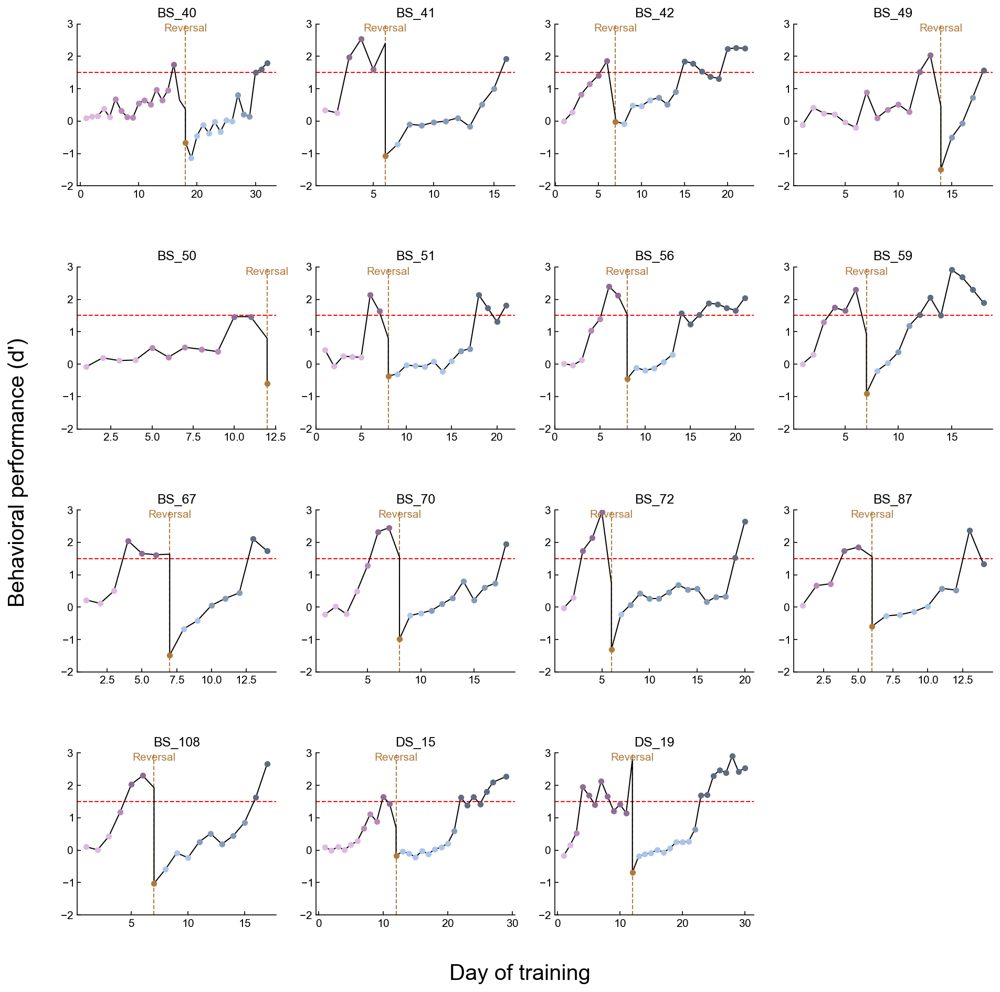

posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values


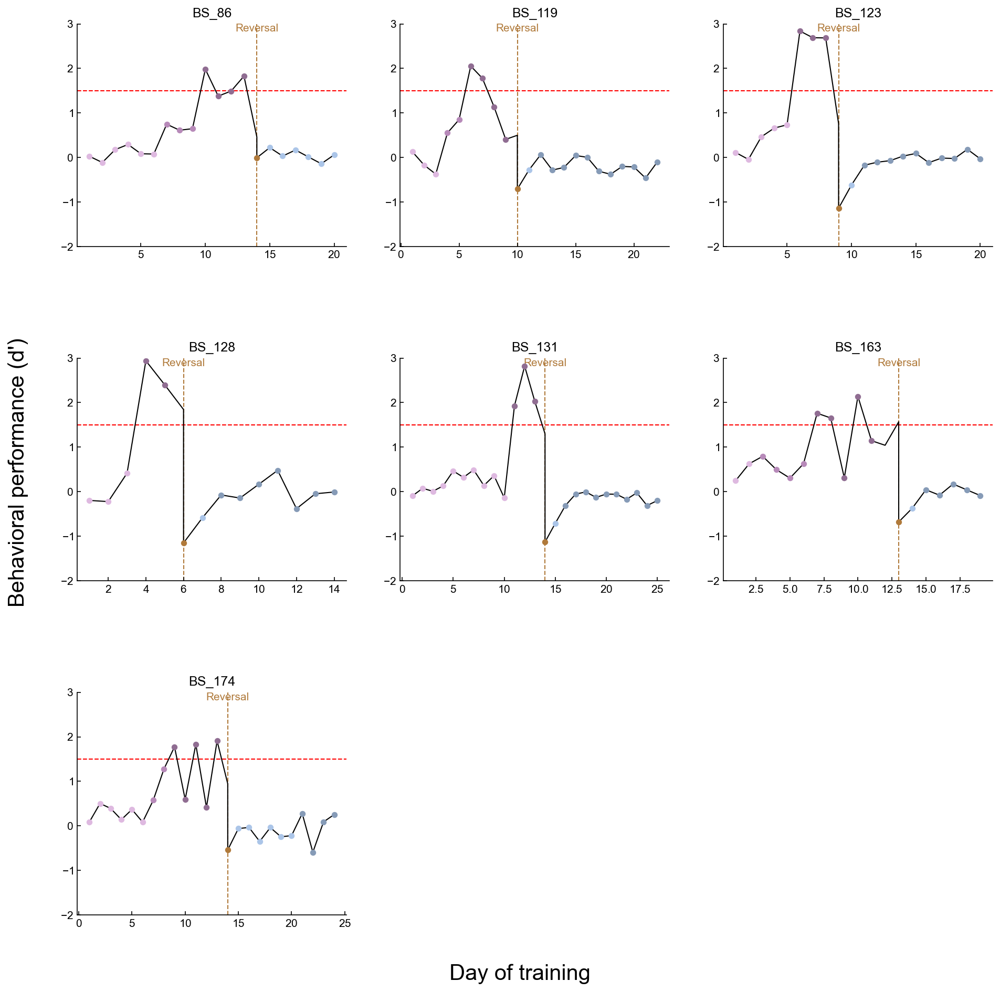

posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values


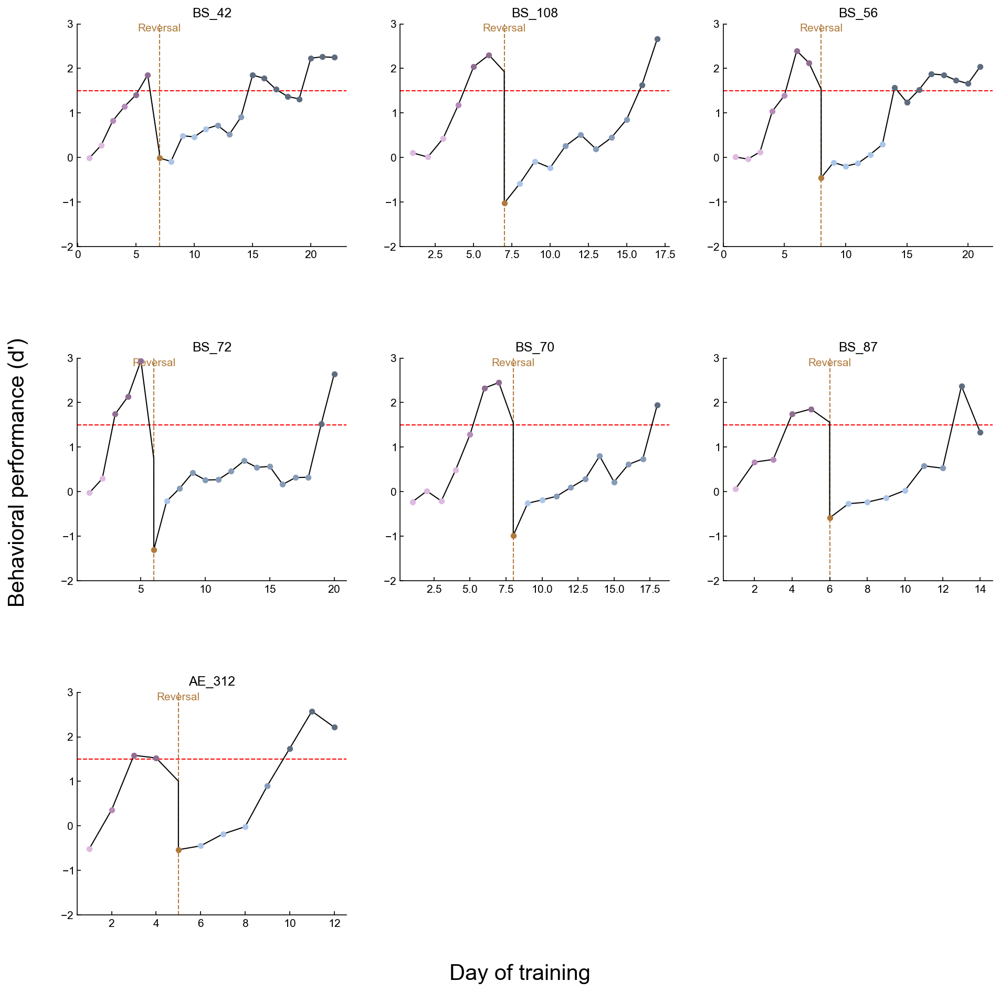

In [4]:
learning_phases,_,_ = ilep.calculateLearningPhasesV2(ephys_animals,animalBehaviors,plot=True,noTrim=False)
learning_phases2,_,_ = ilep.calculateLearningPhasesV2(did_not_learn_animals,animalBehaviors,plot=True,noTrim=False,noTrimPost=True)
# learning_phasesx,_,_ = ilep.calculateLearningPhasesV2(['BS_111'],animalBehaviors,plot=True,noTrim=False,noTrimPost=True)
learning_phases3,_,_ = ilep.calculateLearningPhasesV2(opsin_control_animals,animalBehaviors,plot=True,noTrim=False)
for d in learning_phases2:
    learning_phases[d] = learning_phases2[d]
for d in learning_phases3:
    learning_phases[d] = learning_phases3[d]

In [5]:
EnumSessionOps = []
EnumClustOps = []
sessions = os.listdir(ops_directory)
for session in tqdm(sessions):
    
    if session in ['BS_174_5_opto_AC.pickle']:     #This session excluded due to excessive gliosis (prevented recording the two days prior. Retired immediately after)
        continue
    
    sessionfile = ilep.loadSessionCached(ops_directory,session)
    
    if sessionfile.meta.region != 'AC':
        continue
    if sessionfile.meta.task not in ['opto nonreversal','opto switch','opto reversal']:
        continue
        
    if sessionfile.meta.animal not in did_not_learn_animals:
        continue
        
    if hasattr(animalBehaviors[sessionfile.meta.animal],'cloudiness') and sessionfile.meta.day_of_training >= animalBehaviors[sessionfile.meta.animal].cloudiness:
        continue
    
    for clust in sessionfile.clusters.good:
        EnumSessionOps.append(session)
        EnumClustOps.append(clust)

100%|██████████| 167/167 [00:02<00:00, 58.65it/s]


In [6]:
EILphasesOps = np.full_like(EnumSessionOps,np.nan)
error_animals = []

for idx,session in enumerate(tqdm(EnumSessionOps)):
    
    sessionfile = ilep.loadSessionCached(ops_directory,session)
    
    try:
        animal = sessionfile.meta.animal
        day = sessionfile.meta.day_of_training
        
        day_after_reversal = day - animalBehaviors[animal].reversal
            
        if sessionfile.meta.task in ['switch','opto switch','tuning switch']:
            EILphasesOps[idx] = 'switch'

        elif sessionfile.meta.task in ['nonreversal','opto nonreversal','tuning nonreversal'] and day in learning_phases[animal].pre_early_days:
            EILphasesOps[idx] = 'pre early'
        elif sessionfile.meta.task in ['nonreversal','opto nonreversal','tuning nonreversal']  and day in learning_phases[animal].pre_late_days:
            EILphasesOps[idx] = 'pre late'
        elif sessionfile.meta.task in ['nonreversal','opto nonreversal','tuning nonreversal'] and day in learning_phases[animal].pre_expert_days:
            EILphasesOps[idx] = 'pre expert'

        elif sessionfile.meta.task in ['reversal','opto reversal','tuning reversal']  and day_after_reversal <= 4:
            EILphasesOps[idx] = 'post early'
        elif sessionfile.meta.task in ['reversal','opto reversal','tuning reversal']  and day_after_reversal <= 7:
            EILphasesOps[idx] = 'post late'
        elif sessionfile.meta.task in ['reversal','opto reversal','tuning reversal']  and day_after_reversal > 7:
            EILphasesOps[idx] = 'post expert'
    except Exception as e:
        #print(ilep.generateDateString(sessionfile))
        error_animals.append(sessionfile.meta.animal)
        pass
                             
error_animals = np.unique(error_animals)
print('errors for: '+str(error_animals))

100%|██████████| 850/850 [00:24<00:00, 34.59it/s] 

errors for: []


In [7]:
EnumSessionControl = []
EnumClustControl = []
sessions1 = os.listdir(act_directory)
sessions2 = os.listdir(ops_directory)
sessions = np.concatenate((sessions1,sessions2))
for session in tqdm(sessions):
    sessionfile = ilep.loadSessionCached([act_directory,ops_directory],session)
    
    if sessionfile.meta.region != 'AC':
        continue
    if sessionfile.meta.task not in ['nonreversal','switch','reversal','opto control nonreversal','opto control switch','opto control reversal']:
        continue
        
    if sessionfile.meta.animal not in opsin_control_animals:
        continue
    
    for clust in sessionfile.clusters.good:
        EnumSessionControl.append(session)
        EnumClustControl.append(clust)

100%|██████████| 907/907 [00:11<00:00, 76.96it/s] 


In [8]:
EILphasesControl = np.full_like(EnumSessionControl,np.nan)
error_animals = []

for idx,session in enumerate(tqdm(EnumSessionControl)):
    sessionfile = ilep.loadSessionCached([act_directory,ops_directory],session)
    
    try:
        animal = sessionfile.meta.animal
        day = sessionfile.meta.day_of_training
        
        if sessionfile.meta.task in ['switch','opto switch','tuning switch','opto control switch']:
            EILphasesControl[idx] = 'switch'

        elif sessionfile.meta.task in ['nonreversal','opto nonreversal','opto control nonreversal','tuning nonreversal'] and day in learning_phases[animal].pre_early_days:
            EILphasesControl[idx] = 'pre early'
        elif sessionfile.meta.task in ['nonreversal','opto nonreversal','opto control nonreversal','tuning nonreversal']  and day in learning_phases[animal].pre_late_days:
            EILphasesControl[idx] = 'pre late'
        elif sessionfile.meta.task in ['nonreversal','opto nonreversal','opto control nonreversal','tuning nonreversal'] and day in learning_phases[animal].pre_expert_days:
            EILphasesControl[idx] = 'pre expert'

        elif sessionfile.meta.task in ['reversal','opto reversal','opto control reversal','tuning reversal']  and day in learning_phases[animal].post_early_days:
            EILphasesControl[idx] = 'post early'
        elif sessionfile.meta.task in ['reversal','opto reversal','opto control reversal','tuning reversal']  and day in learning_phases[animal].post_late_days:
            EILphasesControl[idx] = 'post late'
        elif sessionfile.meta.task in ['reversal','opto reversal','opto control reversal','tuning reversal']  and day in learning_phases[animal].post_expert_days:
            EILphasesControl[idx] = 'post expert'
    except Exception as e:
        #print(ilep.generateDateString(sessionfile))
        error_animals.append(sessionfile.meta.animal)
        raise e
        pass
                             
error_animals = np.unique(error_animals)
print('errors for: '+str(error_animals))

100%|██████████| 832/832 [00:13<00:00, 62.23it/s] 

errors for: []


In [9]:
print(len(EnumSessionControl))

832


In [10]:
opsin_control_animals

array(['BS_42', 'BS_108', 'BS_56', 'BS_72', 'BS_70', 'BS_87', 'AE_312'],
      dtype='<U6')

In [11]:
145-94

51

# Load Decoding Data

In [12]:
stim_25s_df = pd.read_csv(stim25sdecodingfilename)
passive_df = pd.read_csv(passivedecodingfilename)
choice_df = pd.read_csv(choicedecodingfilename)
# opsin_df = pd.read_csv(opsindecodingfilename)
opsinon_df = pd.read_csv(opsinondecodingfilename)
dec_df = pd.concat([stim_25s_df,choice_df,passive_df,opsinon_df])

def getDataPoint(df,session,clust,categories,column):
    df = df[df['session']==session]
    df = df[df['clust']==clust]
    df = df[df['categories']==categories]
    val = list(df[column])
    if len(val) == 1:
        return val[0]
    elif len(val) <= 0:
        return np.nan
    else:
        raise Exception('Incorrent length. Duplicate values')
        
stim_acc = []
stim_acc_s = []
choice_acc_s = []
pval_stim_s = []
for idx,(session,clust) in tqdm(enumerate(zip(EnumSessionOps,EnumClustOps))):
    stim_accuracy = getDataPoint(dec_df,session,clust,'stimulus_on','weighted_accuracy')
    pvalue_stim_s = getDataPoint(dec_df,session,clust,'stimulus_on','pval_synthetic_control')
    stim_acc.append(stim_accuracy)
    pval_stim_s.append(pvalue_stim_s)
stim_acc = np.array(stim_acc)
pval_stim_s = np.array(pval_stim_s)

def get_TE_mask(acc,pval_s,pval_c):
    low_decoders = np.less(acc,0.5)
    low_accuracies = acc[low_decoders]
    low_magnitudes = np.absolute(low_accuracies-0.5)

    low_magnitudes = np.sort(low_magnitudes)
    task_encoder_threshold = 0.5+low_magnitudes[int(0.95 * len(low_magnitudes))]
    print('Task encoder threshold: '+str(task_encoder_threshold))

    is_finite = np.isfinite(acc)
    is_valid_pval = np.less(pval_s,0.05) #np.less(pval_c,0.05))
    is_TE = np.greater_equal(acc,task_encoder_threshold)
    is_TE = np.logical_and(is_TE,is_finite)
    is_TE = np.logical_and(is_TE,is_valid_pval)
    return is_TE,task_encoder_threshold

is_TE_Ops,task_encoder_threshold_Ops = get_TE_mask(stim_acc,pval_stim_s,None)

850it [00:02, 403.13it/s]

Task encoder threshold: 0.5855125094850949


In [13]:
FRmod_preearly_Ops = []
FRmod_prelate_Ops = []
FRmod_preexpert_Ops = []
FRmod_postearly_Ops = []
FRmod_postlate_Ops = []
FRmod_postexpert_Ops = []

FRmod_preearly_Ops_On = []
FRmod_prelate_Ops_On = []
FRmod_preexpert_Ops_On = []
FRmod_postearly_Ops_On = []
FRmod_postlate_Ops_On = []
FRmod_postexpert_Ops_On = []

FRmod_preearly_Ops_Off = []
FRmod_prelate_Ops_Off = []
FRmod_preexpert_Ops_Off = []
FRmod_postearly_Ops_Off = []
FRmod_postlate_Ops_Off = []
FRmod_postexpert_Ops_Off = []

FRmod_preearly_Ops_On_target = []
FRmod_prelate_Ops_On_target = []
FRmod_preexpert_Ops_On_target = []
FRmod_postearly_Ops_On_target = []
FRmod_postlate_Ops_On_target = []
FRmod_postexpert_Ops_On_target = []

FRmod_preearly_Ops_Off_target = []
FRmod_prelate_Ops_Off_target = []
FRmod_preexpert_Ops_Off_target = []
FRmod_postearly_Ops_Off_target = []
FRmod_postlate_Ops_Off_target = []
FRmod_postexpert_Ops_Off_target = []

FRmod_preearly_Ops_On_nontarget = []
FRmod_prelate_Ops_On_nontarget = []
FRmod_preexpert_Ops_On_nontarget = []
FRmod_postearly_Ops_On_nontarget = []
FRmod_postlate_Ops_On_nontarget = []
FRmod_postexpert_Ops_On_nontarget = []

FRmod_preearly_Ops_Off_nontarget = []
FRmod_prelate_Ops_Off_nontarget = []
FRmod_preexpert_Ops_Off_nontarget = []
FRmod_postearly_Ops_Off_nontarget = []
FRmod_postlate_Ops_Off_nontarget = []
FRmod_postexpert_Ops_Off_nontarget = []

latency_preearly_Ops_On = []
latency_prelate_Ops_On = []
latency_preexpert_Ops_On = []
latency_postearly_Ops_On = []
latency_postlate_Ops_On = []
latency_postexpert_Ops_On = []

latency_pearly_Ops_Off = []
latency_prelate_Ops_Off = []
latency_preexpert_Ops_Off = []
latency_postearly_Ops_Off = []
latency_postlate_Ops_Off = []
latency_postexpert_Ops_Off = []

preearly_animals_Ops = []
prelate_animals_Ops = []
preexpert_animals_Ops = []
postearly_animals_Ops = []
postlate_animals_Ops = []
postexpert_animals_Ops = []

cellstouseFR = 'all cells'
#cellstouseFR = 'task encoders'

for idx,(session,clust) in tqdm(enumerate(zip(EnumSessionOps,EnumClustOps))):
    sessionfile = ilep.loadSessionCached(ops_directory,session)
    
    #Currently not active as tuning curve animals have not been decoded
    if cellstouseFR == 'task encoders':
        if not np.isfinite(accuracies[idx]) or pvals[idx] > 0.05 or accuracies[idx] < task_encoder_threshold:
            continue
    
    if EILphasesOps[idx] not in ['pre expert','post expert'] and sessionfile.meta.animal in ['DS_15','DS_19']:
        continue
        
    try:
        FRmod = sessionfile.responsiveness[clust]['all_trials'].FRmodulation
        FRmod_On = sessionfile.responsiveness[clust]['laser_on'].FRmodulation
        FRmod_Off = sessionfile.responsiveness[clust]['laser_off'].FRmodulation
        FRmod_On_target = sessionfile.responsiveness[clust]['laser_on_target'].FRmodulation
        FRmod_Off_target = sessionfile.responsiveness[clust]['laser_off_target'].FRmodulation
        FRmod_On_nontarget = sessionfile.responsiveness[clust]['laser_on_nontarget'].FRmodulation
        FRmod_Off_nontarget = sessionfile.responsiveness[clust]['laser_off_nontarget'].FRmodulation
        latency_On = ilep.calculate_latency(sessionfile,clust,cond='on')
        latency_Off = ilep.calculate_latency(sessionfile,clust,cond='off')
    except Exception as e:
        FRmod = np.nan
        FRmod_On = np.nan
        FRmod_Off = np.nan
        FRmod_On_target = np.nan
        FRmod_Off_target = np.nan
        FRmod_On_nontarget = np.nan
        FRmod_Off_nontarget = np.nan
        latency_On = np.nan
        latency_Off = np.nan
        
    if EILphasesOps[idx] == 'pre early':
        FRmod_preearly_Ops.append(FRmod)
        FRmod_preearly_Ops_On.append(FRmod_On)
        FRmod_preearly_Ops_Off.append(FRmod_Off)
        FRmod_preearly_Ops_On_target.append(FRmod_On_target)
        FRmod_preearly_Ops_Off_target.append(FRmod_Off_target)
        FRmod_preearly_Ops_On_nontarget.append(FRmod_On_nontarget)
        FRmod_preearly_Ops_Off_nontarget.append(FRmod_Off_nontarget)
        preearly_animals_Ops.append(sessionfile.meta.animal)
        latency_preearly_Ops_On.append(latency_On)
        latency_preearly_Ops_Off.append(latency_Off)
    elif EILphasesOps[idx] == 'pre late':
        FRmod_prelate_Ops.append(FRmod)
        FRmod_prelate_Ops_On.append(FRmod_On)
        FRmod_prelate_Ops_Off.append(FRmod_Off)
        FRmod_prelate_Ops_On_target.append(FRmod_On_target)
        FRmod_prelate_Ops_Off_target.append(FRmod_Off_target)
        FRmod_prelate_Ops_On_nontarget.append(FRmod_On_nontarget)
        FRmod_prelate_Ops_Off_nontarget.append(FRmod_Off_nontarget)
        prelate_animals_Ops.append(sessionfile.meta.animal)
        latency_prelate_Ops_On.append(latency_On)
        latency_prelate_Ops_Off.append(latency_Off)
    elif EILphasesOps[idx] == 'pre expert':
        FRmod_preexpert_Ops.append(FRmod)
        FRmod_preexpert_Ops_On.append(FRmod_On)
        FRmod_preexpert_Ops_Off.append(FRmod_Off)
        FRmod_preexpert_Ops_On_target.append(FRmod_On_target)
        FRmod_preexpert_Ops_Off_target.append(FRmod_Off_target)
        FRmod_preexpert_Ops_On_nontarget.append(FRmod_On_nontarget)
        FRmod_preexpert_Ops_Off_nontarget.append(FRmod_Off_nontarget)
        preexpert_animals_Ops.append(sessionfile.meta.animal)
        latency_preexpert_Ops_On.append(latency_On)
        latency_preexpert_Ops_Off.append(latency_Off)
    elif EILphasesOps[idx] == 'post early':
        FRmod_postearly_Ops.append(FRmod)
        FRmod_postearly_Ops_On.append(FRmod_On)
        FRmod_postearly_Ops_Off.append(FRmod_Off)
        FRmod_postearly_Ops_On_target.append(FRmod_On_target)
        FRmod_postearly_Ops_Off_target.append(FRmod_Off_target)
        FRmod_postearly_Ops_On_nontarget.append(FRmod_On_nontarget)
        FRmod_postearly_Ops_Off_nontarget.append(FRmod_Off_nontarget)
        postearly_animals_Ops.append(sessionfile.meta.animal)
        latency_postearly_Ops_On.append(latency_On)
        latency_postearly_Ops_Off.append(latency_Off)
    elif EILphasesOps[idx] == 'post late':
        FRmod_postlate_Ops.append(FRmod)
        FRmod_postlate_Ops_On.append(FRmod_On)
        FRmod_postlate_Ops_Off.append(FRmod_Off)
        FRmod_postlate_Ops_On_target.append(FRmod_On_target)
        FRmod_postlate_Ops_Off_target.append(FRmod_Off_target)
        FRmod_postlate_Ops_On_nontarget.append(FRmod_On_nontarget)
        FRmod_postlate_Ops_Off_nontarget.append(FRmod_Off_nontarget)
        postlate_animals_Ops.append(sessionfile.meta.animal)
        latency_postlate_Ops_On.append(latency_On)
        latency_postlate_Ops_Off.append(latency_Off)
    elif EILphasesOps[idx] == 'post expert':
        FRmod_postexpert_Ops.append(FRmod)
        FRmod_postexpert_Ops_On.append(FRmod_On)
        FRmod_postexpert_Ops_Off.append(FRmod_Off)
        FRmod_postexpert_Ops_On_target.append(FRmod_On_target)
        FRmod_postexpert_Ops_Off_target.append(FRmod_Off_target)
        FRmod_postexpert_Ops_On_nontarget.append(FRmod_On_nontarget)
        FRmod_postexpert_Ops_Off_nontarget.append(FRmod_Off_nontarget)
        postexpert_animals_Ops.append(sessionfile.meta.animal)
        latency_postexpert_Ops_On.append(latency_On)
        latency_postexpert_Ops_Off.append(latency_Off)

FRmod_preearly_Ops = np.array(FRmod_preearly_Ops)
FRmod_prelate_Ops = np.array(FRmod_prelate_Ops)
FRmod_preexpert_Ops = np.array(FRmod_preexpert_Ops)
FRmod_postearly_Ops = np.array(FRmod_postearly_Ops)
FRmod_postlate_Ops = np.array(FRmod_postlate_Ops)
FRmod_postexpert_Ops = np.array(FRmod_postexpert_Ops)

850it [03:22,  4.20it/s]


In [14]:
FRmod_preearly_Control = []
FRmod_prelate_Control = []
FRmod_preexpert_Control = []
FRmod_postearly_Control = []
FRmod_postlate_Control = []
FRmod_postexpert_Control = []

preearly_animals_Control = []
prelate_animals_Control = []
preexpert_animals_Control = []
postearly_animals_Control = []
postlate_animals_Control = []
postexpert_animals_Control = []

cellstouseFR = 'all cells'
#cellstouseFR = 'task encoders'

for idx,(session,clust) in tqdm(enumerate(zip(EnumSessionControl,EnumClustControl))):
    sessionfile = ilep.loadSessionCached([act_directory,ops_directory],session)
#     sessionfile = ilep.loadSessionCached(ops_directory,session)
    
    #Currently not active as tuning curve animals have not been decoded
    if cellstouseFR == 'task encoders':
        if not np.isfinite(accuracies[idx]) or pvals[idx] > 0.05 or accuracies[idx] < task_encoder_threshold:
            continue
    
    if EILphasesControl[idx] not in ['pre expert','post expert'] and sessionfile.meta.animal in ['DS_15','DS_19']:
        continue
        
    try:
        FRmod = sessionfile.responsiveness[clust]['all_trials'].FRmodulation
    except Exception as e:
        FRmod = np.nan
        
    if EILphasesControl[idx] == 'pre early':
        FRmod_preearly_Control.append(FRmod)
        preearly_animals_Control.append(sessionfile.meta.animal)
    elif EILphasesControl[idx] == 'pre late':
        FRmod_prelate_Control.append(FRmod)
        prelate_animals_Control.append(sessionfile.meta.animal)
    elif EILphasesControl[idx] == 'pre expert':
        FRmod_preexpert_Control.append(FRmod)
        preexpert_animals_Control.append(sessionfile.meta.animal)
    elif EILphasesControl[idx] == 'post early':
        FRmod_postearly_Control.append(FRmod)
        postearly_animals_Control.append(sessionfile.meta.animal)
    elif EILphasesControl[idx] == 'post late':
        FRmod_postlate_Control.append(FRmod)
        postlate_animals_Control.append(sessionfile.meta.animal)
    elif EILphasesControl[idx] == 'post expert':
        FRmod_postexpert_Control.append(FRmod)
        postexpert_animals_Control.append(sessionfile.meta.animal)

FRmod_preearly_Control = np.array(FRmod_preearly_Control)
FRmod_prelate_Control = np.array(FRmod_prelate_Control)
FRmod_preexpert_Control = np.array(FRmod_preexpert_Control)
FRmod_postearly_Control = np.array(FRmod_postearly_Control)
FRmod_postlate_Control = np.array(FRmod_postlate_Control)
FRmod_postexpert_Control = np.array(FRmod_postexpert_Control)

832it [00:12, 66.03it/s] 


### Laser Controls

In [52]:
FRmod_preearly_Control = []
FRmod_prelate_Control = []
FRmod_preexpert_Control = []
FRmod_postearly_Control = []
FRmod_postlate_Control = []
FRmod_postexpert_Control = []

FRmod_preearly_Control_on = []
FRmod_prelate_Control_on = []
FRmod_preexpert_Control_on = []
FRmod_postearly_Control_on = []
FRmod_postlate_Control_on = []
FRmod_postexpert_Control_on = []

FRmod_preearly_Control_off = []
FRmod_prelate_Control_off = []
FRmod_preexpert_Control_off = []
FRmod_postearly_Control_off = []
FRmod_postlate_Control_off = []
FRmod_postexpert_Control_off = []

Depth_preearly_Control = []
Depth_prelate_Control = []
Depth_preexpert_Control = []
Depth_postearly_Control = []
Depth_postlate_Control = []
Depth_postexpert_Control = []

preearly_animals_Control = []
prelate_animals_Control = []
preexpert_animals_Control = []
postearly_animals_Control = []
postlate_animals_Control = []
postexpert_animals_Control = []

cellstouseFR = 'all cells'
#cellstouseFR = 'task encoders'

for idx,(session,clust) in tqdm(enumerate(zip(EnumSessionControl,EnumClustControl))):
    sessionfile = ilep.loadSessionCached(ops_directory,session)
    
    if session == 'AE_287_2_opto_control_AC.pickle' and clust in [47,80,297,309]:
        continue
    if session == 'AE_287_3_opto_control_AC.pickle' and clust in [16,17,99,214,248]:
        continue
    if session == 'AE_287_4_opto_control_AC.pickle' and clust in [28,98]:
        continue
    if session == 'AE_287_8_opto_control_AC.pickle' and clust in [35,149]:
        continue
    if session == 'AE_287_9_opto_control_AC.pickle' and clust in [84]:
        continue
    if session == 'AE_287_10_opto_control_AC.pickle' and clust in [38]:
        continue
    
    
    
    
    
    
    if sessionfile.responsiveness[clust]['laser_on'].FRmodulation - sessionfile.responsiveness[clust]['laser_off'].FRmodulation >= 5:
        print(f"{session} clust {clust}")
        continue
    
    #Currently not active as tuning curve animals have not been decoded
    if cellstouseFR == 'task encoders':
        if not np.isfinite(accuracies[idx]) or pvals[idx] > 0.05 or accuracies[idx] < task_encoder_threshold:
            continue
    
    if EILphasesControl[idx] not in ['pre expert','post expert'] and sessionfile.meta.animal in ['DS_15','DS_19']:
        continue
        
    try:
        FRmod = sessionfile.responsiveness[clust]['all_trials'].FRmodulation
        FRmod_on = sessionfile.responsiveness[clust]['laser_on'].FRmodulation
        FRmod_off = sessionfile.responsiveness[clust]['laser_off'].FRmodulation
        if len(sessionfile.responsiveness[clust]['laser_on'].trials) < 30:
            FRmod_on = np.nan
        if len(sessionfile.responsiveness[clust]['laser_off'].trials) < 30:
            FRmod_off = np.nan
    except Exception as e:
        FRmod = np.nan
        FRmod_on = np.nan
        FRmod_off = np.nan
        print(e)
    depth = sessionfile.clusters.depth[clust]
    if depth > 2000:
        print(session)
        
    if EILphasesControl[idx] == 'pre early':
        FRmod_preearly_Control.append(FRmod)
        FRmod_preearly_Control_on.append(FRmod_on)
        FRmod_preearly_Control_off.append(FRmod_off)
        Depth_preearly_Control.append(depth)
        preearly_animals_Control.append(sessionfile.meta.animal)
    elif EILphasesControl[idx] == 'pre late':
        FRmod_prelate_Control.append(FRmod)
        FRmod_prelate_Control_on.append(FRmod_on)
        FRmod_prelate_Control_off.append(FRmod_off)
        Depth_prelate_Control.append(depth)
        prelate_animals_Control.append(sessionfile.meta.animal)
    elif EILphasesControl[idx] == 'pre expert':
        FRmod_preexpert_Control.append(FRmod)
        FRmod_preexpert_Control_on.append(FRmod_on)
        FRmod_preexpert_Control_off.append(FRmod_off)
        Depth_preexpert_Control.append(depth)
        preexpert_animals_Control.append(sessionfile.meta.animal)
    elif EILphasesControl[idx] == 'post early':
        FRmod_postearly_Control.append(FRmod)
        FRmod_postearly_Control_on.append(FRmod_on)
        FRmod_postearly_Control_off.append(FRmod_off)
        Depth_postearly_Control.append(depth)
        postearly_animals_Control.append(sessionfile.meta.animal)
    elif EILphasesControl[idx] == 'post late':
        FRmod_postlate_Control.append(FRmod)
        FRmod_postlate_Control_on.append(FRmod_on)
        FRmod_postlate_Control_off.append(FRmod_off)
        Depth_postlate_Control.append(depth)
        postlate_animals_Control.append(sessionfile.meta.animal)
    elif EILphasesControl[idx] == 'post expert':
        FRmod_postexpert_Control.append(FRmod)
        FRmod_postexpert_Control_on.append(FRmod_on)
        FRmod_postexpert_Control_off.append(FRmod_off)
        Depth_postexpert_Control.append(depth)
        postexpert_animals_Control.append(sessionfile.meta.animal)

FRmod_preearly_Control = np.array(FRmod_preearly_Control)
FRmod_prelate_Control = np.array(FRmod_prelate_Control)
FRmod_preexpert_Control = np.array(FRmod_preexpert_Control)
FRmod_postearly_Control = np.array(FRmod_postearly_Control)
FRmod_postlate_Control = np.array(FRmod_postlate_Control)
FRmod_postexpert_Control = np.array(FRmod_postexpert_Control)

FRmod_preearly_Control_on = np.array(FRmod_preearly_Control_on)
FRmod_prelate_Control_on = np.array(FRmod_prelate_Control_on)
FRmod_preexpert_Control_on = np.array(FRmod_preexpert_Control_on)
FRmod_postearly_Control_on = np.array(FRmod_postearly_Control_on)
FRmod_postlate_Control_on = np.array(FRmod_postlate_Control_on)
FRmod_postexpert_Control_on = np.array(FRmod_postexpert_Control_on)

FRmod_preearly_Control_off = np.array(FRmod_preearly_Control_off)
FRmod_prelate_Control_off = np.array(FRmod_prelate_Control_off)
FRmod_preexpert_Control_off = np.array(FRmod_preexpert_Control_off)
FRmod_postearly_Control_off = np.array(FRmod_postearly_Control_off)
FRmod_postlate_Control_off = np.array(FRmod_postlate_Control_off)
FRmod_postexpert_Control_off = np.array(FRmod_postexpert_Control_off)

Depth_preearly_Control = np.array(Depth_preearly_Control)
Depth_prelate_Control = np.array(Depth_prelate_Control)
Depth_preexpert_Control = np.array(Depth_preexpert_Control)
Depth_postearly_Control = np.array(Depth_postearly_Control)
Depth_postlate_Control = np.array(Depth_postlate_Control)
Depth_postexpert_Control = np.array(Depth_postexpert_Control)

9it [00:00, 81.80it/s]

AE_287_10_opto_control_AC.pickle clust 10
AE_287_10_opto_control_AC.pickle clust 37


18it [00:00, 50.15it/s]

AE_287_10_opto_control_AC.pickle clust 74


48it [00:01, 34.47it/s]

AE_287_2_opto_control_AC.pickle clust 307


120it [00:04, 33.41it/s]

AE_287_4_opto_control_AC.pickle clust 17


214it [00:08, 24.96it/s]

AE_287_7_opto_control_AC.pickle clust 3


268it [00:10, 37.63it/s]

AE_287_8_opto_control_AC.pickle clust 180


288it [00:10, 26.99it/s]


In [15]:
5

5

## Opson with Control

C:\Users\insan\anaconda3\envs\EphysPlotting\lib\site-packages\numpy\core\fromnumeric.py:3440: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
C:\Users\insan\anaconda3\envs\EphysPlotting\lib\site-packages\numpy\core\_methods.py:189: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)


IndexError: index -1 is out of bounds for axis 0 with size 0

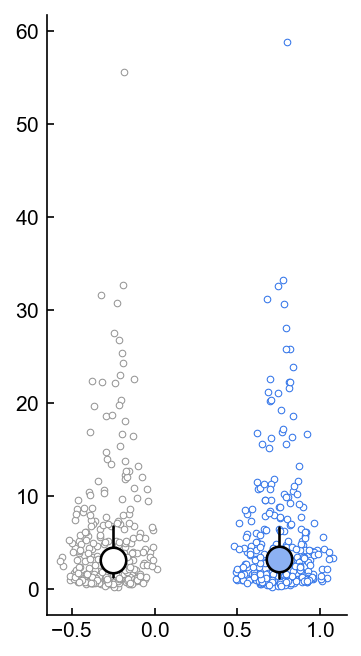

In [16]:
def add_axis_size(fig, ax_w, ax_h, left, bottom):
    fig_w, fig_h = fig.get_size_inches()
    ax = fig.add_axes([left/fig_w, bottom/fig_h, ax_w/fig_w, ax_h/fig_h])
    return ax

def make_axis_size(ax_w, ax_h, left=.3, bottom=.3, right=0, top=0):
    fig_w = (ax_w + left + right) * 1.05
    fig_h = (ax_h + bottom + top) * 1.05
    fig = plt.figure(figsize=(fig_w, fig_h))
    ax = add_axis_size(fig, ax_w, ax_h, left, bottom)
    return fig, ax

fig,ax = make_axis_size(2, 4, left=.3, bottom=.3, right=0, top=0)
switch_offset = 0.25
size=10

################################################################################################################

data_on = np.concatenate([FRmod_postearly_Ops_On,FRmod_postlate_Ops_On,FRmod_postexpert_Ops_On])
data_off = np.concatenate([FRmod_postearly_Ops_Off,FRmod_postlate_Ops_Off,FRmod_postexpert_Ops_Off])
data_control_on = np.concatenate([FRmod_postearly_Control_on,FRmod_postlate_Control_on,FRmod_postexpert_Control_on])
data_control_off = np.concatenate([FRmod_postearly_Control_off,FRmod_postlate_Control_off,FRmod_postexpert_Control_off])
labels = ['OFF','ON','OFF','ON']
numCon = 4

wid = 0.75
widsc = wid/1.75#*1.125


X = np.ones_like(data_control_off)*0-switch_offset
_,Y = ilep.violin(X,data_control_off,width=wid,minjitter=0.075)
X,_ = ilep.violin(X,np.log10(data_control_off),width=wid,minjitter=0.075)
#X += widsc
ax.scatter(X, Y, s=size, ec=GOOD_GREY,fc='white', lw=0.5,zorder=-10,label='Laser ON')

X = np.ones_like(data_control_on)*1-switch_offset
_,Y = ilep.violin(X,data_control_on,width=wid,minjitter=0.075)
X,_ = ilep.violin(X,np.log10(data_control_on),width=wid,minjitter=0.075)
#X += widsc
ax.scatter(X, Y, s=size, ec=LASER_COLOR,fc='white', lw=0.5,zorder=-10,label='Laser ON')

X = np.ones_like(data_off)*2+switch_offset
_,Y = ilep.violin(X,data_off,width=wid,minjitter=0.075)
X,_ = ilep.violin(X,np.log10(data_off),width=wid,minjitter=0.075)
#X -= widsc
ax.scatter(X, Y, s=size, c=GOOD_GREY, lw=0.5,zorder=-10,label='Laser OFF')

X = np.ones_like(data_on)*3+switch_offset
_,Y = ilep.violin(X,data_on,width=wid,minjitter=0.075)
X,_ = ilep.violin(X,np.log10(data_on),width=wid,minjitter=0.075)
#X += widsc
ax.scatter(X, Y, s=size, c=LASER_COLOR, lw=0.5,zorder=-10,label='Laser ON')



######################################

FRmod_baseline_median = 3.5
column = data_control_off
column = ilep.rmnan(column)
percentCR = np.nanmean(np.greater(column,FRmod_baseline_median))*100
eye_color= 'white'#NCR_CR_cmap((percentCR-40)/20)
border_color = 'k'#eye_color

summary_size=150
summary_width=1.25

Q1, median, Q3 = (np.percentile(column, q) for q in [25, 50, 75])
ax.scatter([0-switch_offset], [median], ec=border_color,fc=eye_color, s=summary_size,lw=summary_width, zorder=10)
ax.plot([0-switch_offset,0-switch_offset], [Q1, Q3], c=border_color, lw=summary_width, zorder=9, solid_capstyle='round')

FRmod_baseline_median = 3.5
column = data_control_on
column = ilep.rmnan(column)
percentCR = np.nanmean(np.greater(column,FRmod_baseline_median))*100
eye_color= LIGHT_LASER#NCR_CR_cmap((percentCR-40)/20)
border_color = 'k'#eye_color

summary_size=150
summary_width=1.25

Q1, median, Q3 = (np.percentile(column, q) for q in [25, 50, 75])
ax.scatter([1-switch_offset], [median], ec=border_color,fc=eye_color, s=summary_size,lw=summary_width, zorder=10)
ax.plot([1-switch_offset,1-switch_offset], [Q1, Q3], c=border_color, lw=summary_width, zorder=9, solid_capstyle='round')



FRmod_baseline_median = 3.5
column = data_off
column = ilep.rmnan(column)
percentCR = np.nanmean(np.greater(column,FRmod_baseline_median))*100
eye_color= GOOD_GREY#NCR_CR_cmap((percentCR-40)/20)
border_color = 'k'#eye_color

summary_size=150
summary_width=1.25

Q1, median, Q3 = (np.percentile(column, q) for q in [25, 50, 75])
ax.scatter([2+switch_offset], [median], ec=border_color,fc=eye_color, s=summary_size,lw=summary_width, zorder=10)
ax.plot([2+switch_offset,2+switch_offset], [Q1, Q3], c=border_color, lw=summary_width, zorder=9, solid_capstyle='round')


column = data_on
column = ilep.rmnan(column)
percentCR = np.nanmean(np.greater(column,FRmod_baseline_median))*100
eye_color= LIGHT_LASER#NCR_CR_cmap((percentCR-40)/20)
border_color = 'k'#eye_color

summary_size=150
summary_width=1.25

Q1, median, Q3 = (np.percentile(column, q) for q in [25, 50, 75])
ax.scatter([3+switch_offset], [median], ec=border_color,fc=eye_color, s=summary_size,lw=summary_width, zorder=10)
ax.plot([3+switch_offset,3+switch_offset], [Q1, Q3], c=border_color, lw=summary_width, zorder=9, solid_capstyle='round')

################################################################################################################

labels = ['OFF','ON','OFF','ON']

ax.set_ylim([0,100])
ylab = ax.set_ylabel('Firing rate modulation (spikes/s)')

ax.set_yscale('log',subs=[])
ax.set_ylim([0.1,100])
ax.set_yticks([0.1,1,10,100])
ax.set_yticklabels(['0.1','1','10','100'])
ylab = ax.set_ylabel('Firing rate modulation(spikes/s)')

ax.set_xlim([-0.75-switch_offset,3.75+switch_offset])
ax.set_xticks([0-switch_offset,1-switch_offset,2+switch_offset,3+switch_offset])
ax.set_xticklabels(labels)
ax.set_xlim(ax.get_xlim())
ax.tick_params(direction='in', length=6, width=1)

for item in ([ax.title, ax.xaxis.label, ax.yaxis.label] +
    ax.get_xticklabels() + ax.get_yticklabels()):
    item.set_fontsize(stdfont)
for item in (ax.get_xticklabels()):
    item.set_fontsize(stdfont*0.9)
    pass

xtick_pos_pre = 0.5-switch_offset#ax.get_xticks()[1]
xtick_pos_post = 2.5+switch_offset#ax.get_xticks()[4]
Yval = ilep.getPrePostLabelYval(ax.get_ylim(),Yfrac=-2*stdyfrac,log=True)
t1 = ax.text(xtick_pos_pre, Yval, 'Sham', ha='center', va='bottom', fontsize=stdfont,color='k')
t2 = ax.text(xtick_pos_post, Yval, 'Opto', ha='center', va='bottom',  fontsize=stdfont,color='k')
ax.annotate('', xy=(0.055, -stdyfrac), xycoords='axes fraction', xytext=(0.42, -stdyfrac),arrowprops=dict(arrowstyle='-', color='black'))
ax.annotate('', xy=(0.555, -stdyfrac), xycoords='axes fraction', xytext=(0.92, -stdyfrac),arrowprops=dict(arrowstyle='-', color='black'))

### Log
# Y = 10**np.mean(np.log10(ax.get_ylim()))
# t = ax.text(2.5,Y,'Reversal',rotation=90,fontsize=stdfont,color=SWITCH_COLOR,horizontalalignment='center',verticalalignment='center')
# ax.plot([2.5]*2,[ax.get_ylim()[0],Y*0.45],lw=1,color=SWITCH_COLOR)
# ax.plot([2.5]*2,[ax.get_ylim()[1],Y/0.45],lw=1,color=SWITCH_COLOR)

### Linear
# Y = np.mean(ax.get_ylim())
# t = ax.text(2.5,Y,'Reversal',rotation=90,fontsize=stdfont,color=SWITCH_COLOR,horizontalalignment='center',verticalalignment='center')
# ax.plot([2.5]*2,[ax.get_ylim()[0],Y-np.ptp(ax.get_ylim())*0.125],lw=1,color=SWITCH_COLOR)
# ax.plot([2.5]*2,[ax.get_ylim()[1],Y+np.ptp(ax.get_ylim())*0.125],lw=1,color=SWITCH_COLOR)

artists = [ylab,t1,t2]
fig.savefig(os.path.join('D:\\\\Figures','Manuscript Figures','AC Opsin modulation on off and controls V'+str(current_version)+'.pdf'),transparent=False,facecolor="white",dpi=400, bbox_extra_artists=(artists), bbox_inches='tight')

In [17]:
wilcoxon(data_on,data_off)

WilcoxonResult(statistic=53142.0, pvalue=7.207131709970501e-13)

In [18]:
wilcoxon(data_control_on,data_control_off)

WilcoxonResult(statistic=16490.0, pvalue=0.26799000997571687)

In [19]:
len(data_on)

570

In [20]:
len(data_control_on)

267

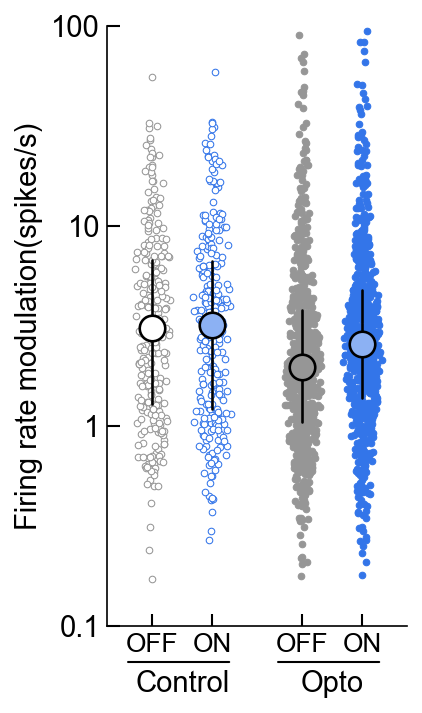

In [494]:
def add_axis_size(fig, ax_w, ax_h, left, bottom):
    fig_w, fig_h = fig.get_size_inches()
    ax = fig.add_axes([left/fig_w, bottom/fig_h, ax_w/fig_w, ax_h/fig_h])
    return ax

def make_axis_size(ax_w, ax_h, left=.3, bottom=.3, right=0, top=0):
    fig_w = (ax_w + left + right) * 1.05
    fig_h = (ax_h + bottom + top) * 1.05
    fig = plt.figure(figsize=(fig_w, fig_h))
    ax = add_axis_size(fig, ax_w, ax_h, left, bottom)
    return fig, ax

fig,ax = make_axis_size(2, 4, left=.3, bottom=.3, right=0, top=0)
switch_offset = 0.25
size=10

################################################################################################################

data_on = np.concatenate([FRmod_postearly_Ops_On,FRmod_postlate_Ops_On,FRmod_postexpert_Ops_On])
data_off = np.concatenate([FRmod_postearly_Ops_Off,FRmod_postlate_Ops_Off,FRmod_postexpert_Ops_Off])
data_control_on = np.concatenate([FRmod_postearly_Control_on,FRmod_postlate_Control_on,FRmod_postexpert_Control_on])
data_control_off = np.concatenate([FRmod_postearly_Control_off,FRmod_postlate_Control_off,FRmod_postexpert_Control_off])
labels = ['OFF','ON','OFF','ON']
numCon = 4

wid = 0.75
widsc = wid/1.75#*1.125


X = np.ones_like(data_control_off)*0-switch_offset
_,Y = ilep.violin(X,data_control_off,width=wid,minjitter=0.075)
X,_ = ilep.violin(X,np.log10(data_control_off),width=wid,minjitter=0.075)
#X += widsc
ax.scatter(X, Y, s=size, ec=GOOD_GREY,fc='white', lw=0.5,zorder=-10,label='Laser ON')

X = np.ones_like(data_control_on)*1-switch_offset
_,Y = ilep.violin(X,data_control_on,width=wid,minjitter=0.075)
X,_ = ilep.violin(X,np.log10(data_control_on),width=wid,minjitter=0.075)
#X += widsc
ax.scatter(X, Y, s=size, ec=LASER_COLOR,fc='white', lw=0.5,zorder=-10,label='Laser ON')

X = np.ones_like(data_off)*2+switch_offset
_,Y = ilep.violin(X,data_off,width=wid,minjitter=0.075)
X,_ = ilep.violin(X,np.log10(data_off),width=wid,minjitter=0.075)
#X -= widsc
ax.scatter(X, Y, s=size, c=GOOD_GREY, lw=0.5,zorder=-10,label='Laser OFF')

X = np.ones_like(data_on)*3+switch_offset
_,Y = ilep.violin(X,data_on,width=wid,minjitter=0.075)
X,_ = ilep.violin(X,np.log10(data_on),width=wid,minjitter=0.075)
#X += widsc
ax.scatter(X, Y, s=size, c=LASER_COLOR, lw=0.5,zorder=-10,label='Laser ON')



######################################

FRmod_baseline_median = 3.5
column = data_control_off
column = ilep.rmnan(column)
percentCR = np.nanmean(np.greater(column,FRmod_baseline_median))*100
eye_color= 'white'#NCR_CR_cmap((percentCR-40)/20)
border_color = 'k'#eye_color

summary_size=150
summary_width=1.25

Q1, median, Q3 = (np.percentile(column, q) for q in [25, 50, 75])
# median = np.mean(column)
# Q1 = np.mean(column) - sem(column)
# Q3 = np.mean(column) + sem(column)
ax.scatter([0-switch_offset], [median], ec=border_color,fc=eye_color, s=summary_size,lw=summary_width, zorder=10)
ax.plot([0-switch_offset,0-switch_offset], [Q1, Q3], c=border_color, lw=summary_width, zorder=9, solid_capstyle='round')

FRmod_baseline_median = 3.5
column = data_control_on
column = ilep.rmnan(column)
percentCR = np.nanmean(np.greater(column,FRmod_baseline_median))*100
eye_color= LIGHT_LASER#NCR_CR_cmap((percentCR-40)/20)
border_color = 'k'#eye_color

summary_size=150
summary_width=1.25

Q1, median, Q3 = (np.percentile(column, q) for q in [25, 50, 75])
# median = np.mean(column)
# Q1 = np.mean(column) - sem(column)
# Q3 = np.mean(column) + sem(column)
ax.scatter([1-switch_offset], [median], ec=border_color,fc=eye_color, s=summary_size,lw=summary_width, zorder=10)
ax.plot([1-switch_offset,1-switch_offset], [Q1, Q3], c=border_color, lw=summary_width, zorder=9, solid_capstyle='round')



FRmod_baseline_median = 3.5
column = data_off
column = ilep.rmnan(column)
percentCR = np.nanmean(np.greater(column,FRmod_baseline_median))*100
eye_color= GOOD_GREY#NCR_CR_cmap((percentCR-40)/20)
border_color = 'k'#eye_color

summary_size=150
summary_width=1.25

Q1, median, Q3 = (np.percentile(column, q) for q in [25, 50, 75])
# median = np.mean(column)
# Q1 = np.mean(column) - sem(column)
# Q3 = np.mean(column) + sem(column)
# print(Q1)
# print(Q3)
ax.scatter([2+switch_offset], [median], ec=border_color,fc=eye_color, s=summary_size,lw=summary_width, zorder=10)
ax.plot([2+switch_offset,2+switch_offset], [Q1, Q3], c=border_color, lw=summary_width, zorder=9, solid_capstyle='round')


column = data_on
column = ilep.rmnan(column)
percentCR = np.nanmean(np.greater(column,FRmod_baseline_median))*100
eye_color= LIGHT_LASER#NCR_CR_cmap((percentCR-40)/20)
border_color = 'k'#eye_color

summary_size=150
summary_width=1.25

Q1, median, Q3 = (np.percentile(column, q) for q in [25, 50, 75])
# median = np.mean(column)
# Q1 = np.mean(column) - sem(column)
# Q3 = np.mean(column) + sem(column)
ax.scatter([3+switch_offset], [median], ec=border_color,fc=eye_color, s=summary_size,lw=summary_width, zorder=10)
ax.plot([3+switch_offset,3+switch_offset], [Q1, Q3], c=border_color, lw=summary_width, zorder=9, solid_capstyle='round')

################################################################################################################

labels = ['OFF','ON','OFF','ON']

ax.set_ylim([0,100])
ylab = ax.set_ylabel('Firing rate modulation (spikes/s)')

ax.set_yscale('log',subs=[])
ax.set_ylim([0.1,100])
ax.set_yticks([0.1,1,10,100])
ax.set_yticklabels(['0.1','1','10','100'])
ylab = ax.set_ylabel('Firing rate modulation(spikes/s)')

ax.set_xlim([-0.75-switch_offset,3.75+switch_offset])
ax.set_xticks([0-switch_offset,1-switch_offset,2+switch_offset,3+switch_offset])
ax.set_xticklabels(labels)
ax.set_xlim(ax.get_xlim())
ax.tick_params(direction='in', length=6, width=1)

for item in ([ax.title, ax.xaxis.label, ax.yaxis.label] +
    ax.get_xticklabels() + ax.get_yticklabels()):
    item.set_fontsize(stdfont)
for item in (ax.get_xticklabels()):
    item.set_fontsize(stdfont*0.9)
    pass

xtick_pos_pre = 0.5-switch_offset#ax.get_xticks()[1]
xtick_pos_post = 2.5+switch_offset#ax.get_xticks()[4]
Yval = ilep.getPrePostLabelYval(ax.get_ylim(),Yfrac=-2*stdyfrac,log=True)
t1 = ax.text(xtick_pos_pre, Yval, 'Control', ha='center', va='bottom', fontsize=stdfont,color='k')
t2 = ax.text(xtick_pos_post, Yval, 'Opto', ha='center', va='bottom',  fontsize=stdfont,color='k')
ax.annotate('', xy=(0.055, -stdyfrac), xycoords='axes fraction', xytext=(0.42, -stdyfrac),arrowprops=dict(arrowstyle='-', color='black'))
ax.annotate('', xy=(0.555, -stdyfrac), xycoords='axes fraction', xytext=(0.92, -stdyfrac),arrowprops=dict(arrowstyle='-', color='black'))

### Log
# Y = 10**np.mean(np.log10(ax.get_ylim()))
# t = ax.text(2.5,Y,'Reversal',rotation=90,fontsize=stdfont,color=SWITCH_COLOR,horizontalalignment='center',verticalalignment='center')
# ax.plot([2.5]*2,[ax.get_ylim()[0],Y*0.45],lw=1,color=SWITCH_COLOR)
# ax.plot([2.5]*2,[ax.get_ylim()[1],Y/0.45],lw=1,color=SWITCH_COLOR)

### Linear
# Y = np.mean(ax.get_ylim())
# t = ax.text(2.5,Y,'Reversal',rotation=90,fontsize=stdfont,color=SWITCH_COLOR,horizontalalignment='center',verticalalignment='center')
# ax.plot([2.5]*2,[ax.get_ylim()[0],Y-np.ptp(ax.get_ylim())*0.125],lw=1,color=SWITCH_COLOR)
# ax.plot([2.5]*2,[ax.get_ylim()[1],Y+np.ptp(ax.get_ylim())*0.125],lw=1,color=SWITCH_COLOR)

artists = [ylab,t1,t2]
fig.savefig(os.path.join('D:\\\\Figures','Manuscript Figures','AC Opsin mean modulation on off and controls V'+str(current_version)+'.pdf'),transparent=False,facecolor="white",dpi=400, bbox_extra_artists=(artists), bbox_inches='tight')

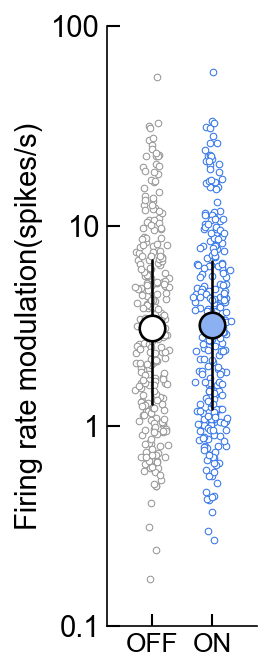

In [19]:
def add_axis_size(fig, ax_w, ax_h, left, bottom):
    fig_w, fig_h = fig.get_size_inches()
    ax = fig.add_axes([left/fig_w, bottom/fig_h, ax_w/fig_w, ax_h/fig_h])
    return ax

def make_axis_size(ax_w, ax_h, left=.3, bottom=.3, right=0, top=0):
    fig_w = (ax_w + left + right) * 1.05
    fig_h = (ax_h + bottom + top) * 1.05
    fig = plt.figure(figsize=(fig_w, fig_h))
    ax = add_axis_size(fig, ax_w, ax_h, left, bottom)
    return fig, ax

fig,ax = make_axis_size(1, 4, left=.3, bottom=.3, right=0, top=0)
switch_offset = 0#0.25
size=10

################################################################################################################

data_on = np.concatenate([FRmod_postearly_Ops_On,FRmod_postlate_Ops_On,FRmod_postexpert_Ops_On])
data_off = np.concatenate([FRmod_postearly_Ops_Off,FRmod_postlate_Ops_Off,FRmod_postexpert_Ops_Off])
data_control_on = np.concatenate([FRmod_postearly_Control_on,FRmod_postlate_Control_on,FRmod_postexpert_Control_on])
data_control_off = np.concatenate([FRmod_postearly_Control_off,FRmod_postlate_Control_off,FRmod_postexpert_Control_off])
labels = ['OFF','ON','OFF','ON']
numCon = 4

wid = 0.75
widsc = wid/1.75#*1.125


X = np.ones_like(data_control_off)*0-switch_offset
_,Y = ilep.violin(X,data_control_off,width=wid,minjitter=0.075)
X,_ = ilep.violin(X,np.log10(data_control_off),width=wid,minjitter=0.075)
#X += widsc
ax.scatter(X, Y, s=size, ec=GOOD_GREY,fc='white', lw=0.5,zorder=-10,label='Laser ON')

X = np.ones_like(data_control_on)*1-switch_offset
_,Y = ilep.violin(X,data_control_on,width=wid,minjitter=0.075)
X,_ = ilep.violin(X,np.log10(data_control_on),width=wid,minjitter=0.075)
#X += widsc
ax.scatter(X, Y, s=size, ec=LASER_COLOR,fc='white', lw=0.5,zorder=-10,label='Laser ON')

# X = np.ones_like(data_off)*2+switch_offset
# _,Y = ilep.violin(X,data_off,width=wid,minjitter=0.075)
# X,_ = ilep.violin(X,np.log10(data_off),width=wid,minjitter=0.075)
# #X -= widsc
# ax.scatter(X, Y, s=size, c=GOOD_GREY, lw=0.5,zorder=-10,label='Laser OFF')

# X = np.ones_like(data_on)*3+switch_offset
# _,Y = ilep.violin(X,data_on,width=wid,minjitter=0.075)
# X,_ = ilep.violin(X,np.log10(data_on),width=wid,minjitter=0.075)
# #X += widsc
# ax.scatter(X, Y, s=size, c=LASER_COLOR, lw=0.5,zorder=-10,label='Laser ON')



######################################

FRmod_baseline_median = 3.5
column = data_control_off
column = ilep.rmnan(column)
percentCR = np.nanmean(np.greater(column,FRmod_baseline_median))*100
eye_color= 'white'#NCR_CR_cmap((percentCR-40)/20)
border_color = 'k'#eye_color

summary_size=150
summary_width=1.25

Q1, median, Q3 = (np.percentile(column, q) for q in [25, 50, 75])
ax.scatter([0-switch_offset], [median], ec=border_color,fc=eye_color, s=summary_size,lw=summary_width, zorder=10)
ax.plot([0-switch_offset,0-switch_offset], [Q1, Q3], c=border_color, lw=summary_width, zorder=9, solid_capstyle='round')

FRmod_baseline_median = 3.5
column = data_control_on
column = ilep.rmnan(column)
percentCR = np.nanmean(np.greater(column,FRmod_baseline_median))*100
eye_color= LIGHT_LASER#NCR_CR_cmap((percentCR-40)/20)
border_color = 'k'#eye_color

summary_size=150
summary_width=1.25

Q1, median, Q3 = (np.percentile(column, q) for q in [25, 50, 75])
ax.scatter([1-switch_offset], [median], ec=border_color,fc=eye_color, s=summary_size,lw=summary_width, zorder=10)
ax.plot([1-switch_offset,1-switch_offset], [Q1, Q3], c=border_color, lw=summary_width, zorder=9, solid_capstyle='round')



# FRmod_baseline_median = 3.5
# column = data_off
# column = ilep.rmnan(column)
# percentCR = np.nanmean(np.greater(column,FRmod_baseline_median))*100
# eye_color= GOOD_GREY#NCR_CR_cmap((percentCR-40)/20)
# border_color = 'k'#eye_color

# summary_size=150
# summary_width=1.25

# Q1, median, Q3 = (np.percentile(column, q) for q in [25, 50, 75])
# ax.scatter([2+switch_offset], [median], ec=border_color,fc=eye_color, s=summary_size,lw=summary_width, zorder=10)
# ax.plot([2+switch_offset,2+switch_offset], [Q1, Q3], c=border_color, lw=summary_width, zorder=9, solid_capstyle='round')


# column = data_on
# column = ilep.rmnan(column)
# percentCR = np.nanmean(np.greater(column,FRmod_baseline_median))*100
# eye_color= LIGHT_LASER#NCR_CR_cmap((percentCR-40)/20)
# border_color = 'k'#eye_color

# summary_size=150
# summary_width=1.25

# Q1, median, Q3 = (np.percentile(column, q) for q in [25, 50, 75])
# ax.scatter([3+switch_offset], [median], ec=border_color,fc=eye_color, s=summary_size,lw=summary_width, zorder=10)
# ax.plot([3+switch_offset,3+switch_offset], [Q1, Q3], c=border_color, lw=summary_width, zorder=9, solid_capstyle='round')

################################################################################################################

labels = ['OFF','ON']

ax.set_ylim([0,100])
ylab = ax.set_ylabel('Firing rate modulation (spikes/s)')

ax.set_yscale('log',subs=[])
ax.set_ylim([0.1,100])
ax.set_yticks([0.1,1,10,100])
ax.set_yticklabels(['0.1','1','10','100'])
ylab = ax.set_ylabel('Firing rate modulation(spikes/s)')

ax.set_xlim([-0.75-switch_offset,1.75+switch_offset])
ax.set_xticks([0-switch_offset,1-switch_offset])
ax.set_xticklabels(labels)
ax.set_xlim(ax.get_xlim())
ax.tick_params(direction='in', length=6, width=1)

for item in ([ax.title, ax.xaxis.label, ax.yaxis.label] +
    ax.get_xticklabels() + ax.get_yticklabels()):
    item.set_fontsize(stdfont)
for item in (ax.get_xticklabels()):
    item.set_fontsize(stdfont*0.9)
    pass

# xtick_pos_pre = 0.5-switch_offset#ax.get_xticks()[1]
# xtick_pos_post = 2.5+switch_offset#ax.get_xticks()[4]
# Yval = ilep.getPrePostLabelYval(ax.get_ylim(),Yfrac=-2*stdyfrac,log=True)
# t1 = ax.text(xtick_pos_pre, Yval, 'Sham', ha='center', va='bottom', fontsize=stdfont,color='k')
# t2 = ax.text(xtick_pos_post, Yval, 'Opto', ha='center', va='bottom',  fontsize=stdfont,color='k')
# ax.annotate('', xy=(0.055, -stdyfrac), xycoords='axes fraction', xytext=(0.42, -stdyfrac),arrowprops=dict(arrowstyle='-', color='black'))
# ax.annotate('', xy=(0.555, -stdyfrac), xycoords='axes fraction', xytext=(0.92, -stdyfrac),arrowprops=dict(arrowstyle='-', color='black'))

### Log
# Y = 10**np.mean(np.log10(ax.get_ylim()))
# t = ax.text(2.5,Y,'Reversal',rotation=90,fontsize=stdfont,color=SWITCH_COLOR,horizontalalignment='center',verticalalignment='center')
# ax.plot([2.5]*2,[ax.get_ylim()[0],Y*0.45],lw=1,color=SWITCH_COLOR)
# ax.plot([2.5]*2,[ax.get_ylim()[1],Y/0.45],lw=1,color=SWITCH_COLOR)

### Linear
# Y = np.mean(ax.get_ylim())
# t = ax.text(2.5,Y,'Reversal',rotation=90,fontsize=stdfont,color=SWITCH_COLOR,horizontalalignment='center',verticalalignment='center')
# ax.plot([2.5]*2,[ax.get_ylim()[0],Y-np.ptp(ax.get_ylim())*0.125],lw=1,color=SWITCH_COLOR)
# ax.plot([2.5]*2,[ax.get_ylim()[1],Y+np.ptp(ax.get_ylim())*0.125],lw=1,color=SWITCH_COLOR)

artists = [ylab]#,t1,t2]
# fig.savefig(os.path.join('D:\\\\Figures','Manuscript Figures','AC Opsin modulation on off sham only V'+str(current_version)+'.pdf'),transparent=False,facecolor="white",dpi=400, bbox_extra_artists=(artists), bbox_inches='tight')

In [20]:
wilcoxon(data_control_on,data_control_off)

WilcoxonResult(statistic=16490.0, pvalue=0.26799000997571687)

In [21]:
len(data_control_on)

267

In [22]:
len(data_control_off)

267

In [23]:
np.sum(np.isfinite(data_control_on))

267

# Style 2

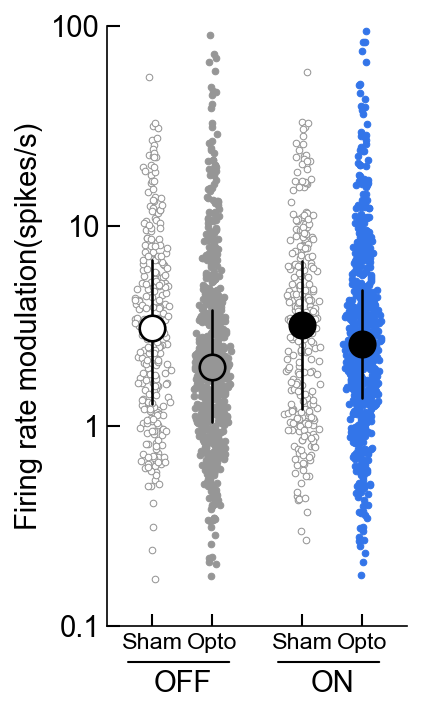

In [21]:
def add_axis_size(fig, ax_w, ax_h, left, bottom):
    fig_w, fig_h = fig.get_size_inches()
    ax = fig.add_axes([left/fig_w, bottom/fig_h, ax_w/fig_w, ax_h/fig_h])
    return ax

def make_axis_size(ax_w, ax_h, left=.3, bottom=.3, right=0, top=0):
    fig_w = (ax_w + left + right) * 1.05
    fig_h = (ax_h + bottom + top) * 1.05
    fig = plt.figure(figsize=(fig_w, fig_h))
    ax = add_axis_size(fig, ax_w, ax_h, left, bottom)
    return fig, ax

fig,ax = make_axis_size(2, 4, left=.3, bottom=.3, right=0, top=0)
switch_offset = 0.25
size=10

################################################################################################################

data_on = np.concatenate([FRmod_postearly_Ops_On,FRmod_postlate_Ops_On,FRmod_postexpert_Ops_On])
data_off = np.concatenate([FRmod_postearly_Ops_Off,FRmod_postlate_Ops_Off,FRmod_postexpert_Ops_Off])
data_control_on = np.concatenate([FRmod_postearly_Control_on,FRmod_postlate_Control_on,FRmod_postexpert_Control_on])
data_control_off = np.concatenate([FRmod_postearly_Control_off,FRmod_postlate_Control_off,FRmod_postexpert_Control_off])
labels = ['OFF','ON','OFF','ON']
numCon = 4

wid = 0.75
widsc = wid/1.75#*1.125


X = np.ones_like(data_control_off)*0-switch_offset
_,Y = ilep.violin(X,data_control_off,width=wid,minjitter=0.075)
X,_ = ilep.violin(X,np.log10(data_control_off),width=wid,minjitter=0.075)
#X += widsc
ax.scatter(X, Y, s=size, ec=GOOD_GREY,fc='white', lw=0.5,zorder=-10,label='Laser ON')

X = np.ones_like(data_off)*1-switch_offset
_,Y = ilep.violin(X,data_off,width=wid,minjitter=0.075)
X,_ = ilep.violin(X,np.log10(data_off),width=wid,minjitter=0.075)
#X -= widsc
ax.scatter(X, Y, s=size, c=GOOD_GREY, lw=0.5,zorder=-10,label='Laser OFF')

X = np.ones_like(data_control_on)*2+switch_offset
_,Y = ilep.violin(X,data_control_on,width=wid,minjitter=0.075)
X,_ = ilep.violin(X,np.log10(data_control_on),width=wid,minjitter=0.075)
#X += widsc
ax.scatter(X, Y, s=size, ec=GOOD_GREY,fc='white', lw=0.5,zorder=-10,label='Laser ON')

X = np.ones_like(data_on)*3+switch_offset
_,Y = ilep.violin(X,data_on,width=wid,minjitter=0.075)
X,_ = ilep.violin(X,np.log10(data_on),width=wid,minjitter=0.075)
#X += widsc
ax.scatter(X, Y, s=size, c=LASER_COLOR, lw=0.5,zorder=-10,label='Laser ON')



######################################

FRmod_baseline_median = 3.5
column = data_control_off
column = ilep.rmnan(column)
percentCR = np.nanmean(np.greater(column,FRmod_baseline_median))*100
eye_color= 'white'#NCR_CR_cmap((percentCR-40)/20)
border_color = 'k'#eye_color

summary_size=150
summary_width=1.25

Q1, median, Q3 = (np.percentile(column, q) for q in [25, 50, 75])
ax.scatter([0-switch_offset], [median], ec=border_color,fc=eye_color, s=summary_size,lw=summary_width, zorder=10)
ax.plot([0-switch_offset,0-switch_offset], [Q1, Q3], c=border_color, lw=summary_width, zorder=9, solid_capstyle='round')

FRmod_baseline_median = 3.5
column = data_off
column = ilep.rmnan(column)
percentCR = np.nanmean(np.greater(column,FRmod_baseline_median))*100
eye_color= GOOD_GREY#NCR_CR_cmap((percentCR-40)/20)
border_color = 'k'#eye_color

summary_size=150
summary_width=1.25

Q1, median, Q3 = (np.percentile(column, q) for q in [25, 50, 75])
ax.scatter([1-switch_offset], [median], ec=border_color,fc=eye_color, s=summary_size,lw=summary_width, zorder=10)
ax.plot([1-switch_offset,1-switch_offset], [Q1, Q3], c=border_color, lw=summary_width, zorder=9, solid_capstyle='round')



FRmod_baseline_median = 3.5
column = data_control_on
column = ilep.rmnan(column)
percentCR = np.nanmean(np.greater(column,FRmod_baseline_median))*100
eye_color= 'k'#NCR_CR_cmap((percentCR-40)/20)
border_color = 'k'#eye_color

summary_size=150
summary_width=1.25

Q1, median, Q3 = (np.percentile(column, q) for q in [25, 50, 75])
ax.scatter([2+switch_offset], [median], ec=border_color,fc=eye_color, s=summary_size,lw=summary_width, zorder=10)
ax.plot([2+switch_offset,2+switch_offset], [Q1, Q3], c=border_color, lw=summary_width, zorder=9, solid_capstyle='round')

column = data_on
column = ilep.rmnan(column)
percentCR = np.nanmean(np.greater(column,FRmod_baseline_median))*100
eye_color= 'k'#NCR_CR_cmap((percentCR-40)/20)
border_color = 'k'#eye_color

summary_size=150
summary_width=1.25

Q1, median, Q3 = (np.percentile(column, q) for q in [25, 50, 75])
ax.scatter([3+switch_offset], [median], ec=border_color,fc=eye_color, s=summary_size,lw=summary_width, zorder=10)
ax.plot([3+switch_offset,3+switch_offset], [Q1, Q3], c=border_color, lw=summary_width, zorder=9, solid_capstyle='round')

################################################################################################################

labels = ['Sham','Opto','Sham','Opto']

ax.set_ylim([0,100])
ylab = ax.set_ylabel('Firing rate modulation (spikes/s)')

ax.set_yscale('log',subs=[])
ax.set_ylim([0.1,100])
ax.set_yticks([0.1,1,10,100])
ax.set_yticklabels(['0.1','1','10','100'])
ylab = ax.set_ylabel('Firing rate modulation(spikes/s)')

ax.set_xlim([-0.75-switch_offset,3.75+switch_offset])
ax.set_xticks([0-switch_offset,1-switch_offset,2+switch_offset,3+switch_offset])
ax.set_xticklabels(labels)
ax.set_xlim(ax.get_xlim())
ax.tick_params(direction='in', length=6, width=1)

for item in ([ax.title, ax.xaxis.label, ax.yaxis.label] +
    ax.get_xticklabels() + ax.get_yticklabels()):
    item.set_fontsize(stdfont)
for item in (ax.get_xticklabels()):
    item.set_fontsize(stdfont*0.8)
    pass

xtick_pos_pre = 0.5-switch_offset#ax.get_xticks()[1]
xtick_pos_post = 2.5+switch_offset#ax.get_xticks()[4]
Yval = ilep.getPrePostLabelYval(ax.get_ylim(),Yfrac=-2*stdyfrac,log=True)
t1 = ax.text(xtick_pos_pre, Yval, 'OFF', ha='center', va='bottom', fontsize=stdfont,color='k')
t2 = ax.text(xtick_pos_post, Yval, 'ON', ha='center', va='bottom',  fontsize=stdfont,color='k')
ax.annotate('', xy=(0.055, -stdyfrac), xycoords='axes fraction', xytext=(0.42, -stdyfrac),arrowprops=dict(arrowstyle='-', color='black'))
ax.annotate('', xy=(0.555, -stdyfrac), xycoords='axes fraction', xytext=(0.92, -stdyfrac),arrowprops=dict(arrowstyle='-', color='black'))

### Log
# Y = 10**np.mean(np.log10(ax.get_ylim()))
# t = ax.text(2.5,Y,'Reversal',rotation=90,fontsize=stdfont,color=SWITCH_COLOR,horizontalalignment='center',verticalalignment='center')
# ax.plot([2.5]*2,[ax.get_ylim()[0],Y*0.45],lw=1,color=SWITCH_COLOR)
# ax.plot([2.5]*2,[ax.get_ylim()[1],Y/0.45],lw=1,color=SWITCH_COLOR)

### Linear
# Y = np.mean(ax.get_ylim())
# t = ax.text(2.5,Y,'Reversal',rotation=90,fontsize=stdfont,color=SWITCH_COLOR,horizontalalignment='center',verticalalignment='center')
# ax.plot([2.5]*2,[ax.get_ylim()[0],Y-np.ptp(ax.get_ylim())*0.125],lw=1,color=SWITCH_COLOR)
# ax.plot([2.5]*2,[ax.get_ylim()[1],Y+np.ptp(ax.get_ylim())*0.125],lw=1,color=SWITCH_COLOR)

artists = [ylab,t1,t2]
fig.savefig(os.path.join('D:\\\\Figures','Manuscript Figures','AC Opsin modulation on off and controls style 2 V'+str(current_version)+'.pdf'),transparent=False,facecolor="white",dpi=400, bbox_extra_artists=(artists), bbox_inches='tight')

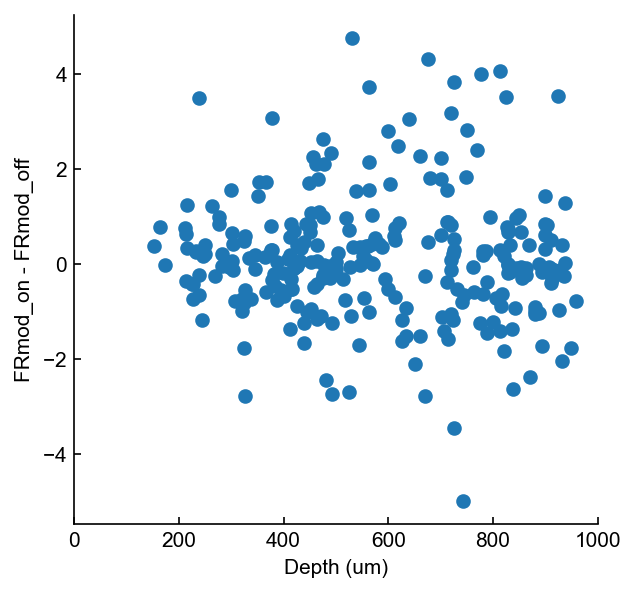

In [160]:
on = np.array(np.r_[FRmod_preearly_Control_on,FRmod_prelate_Control_on,FRmod_preexpert_Control_on,FRmod_postearly_Control_on,FRmod_postlate_Control_on,FRmod_postexpert_Control_on,])
off = np.array(np.r_[FRmod_preearly_Control_off,FRmod_prelate_Control_off,FRmod_preexpert_Control_off,FRmod_postearly_Control_off,FRmod_postlate_Control_off,FRmod_postexpert_Control_off,])
depth = np.array(np.r_[Depth_preearly_Control,Depth_prelate_Control,Depth_preexpert_Control,Depth_postearly_Control,Depth_postlate_Control,Depth_postexpert_Control,])

fig, ax = plt.subplots(figsize=(4.5,4.5))
ax.scatter(depth,on-off)

ax.set_xticks([0,200,400,600,800,1000])
ax.set_xticklabels([str(s) for s in [0,200,400,600,800,1000]])
ax.set_xlabel('Depth (um)')
ax.set_ylabel('FRmod_on - FRmod_off')

fig.savefig('D:\\TempFigures\\OpsinControl FRMod vs Depth.png')

baseline = 3.5


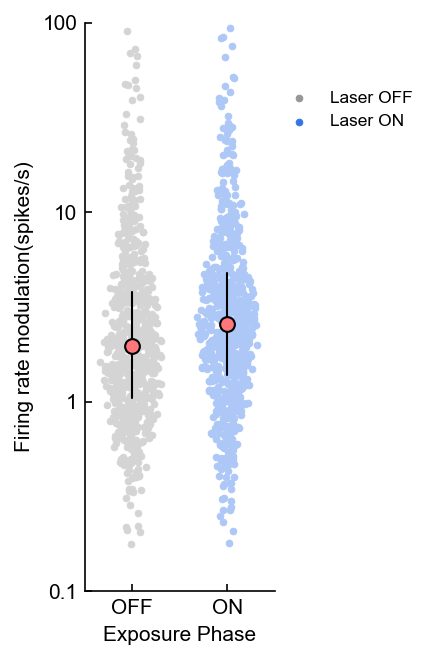

In [158]:
#Firing rate modulation graphs
size=10

FRmod_baseline_median = 3.5#np.median(FRmod_preearly)
print('baseline = '+str(FRmod_baseline_median))

fig, ax = plt.subplots(figsize=(3,4.5))
data_on = np.concatenate([FRmod_postearly_Ops_On,FRmod_postlate_Ops_On,FRmod_postexpert_Ops_On])
data_off = np.concatenate([FRmod_postearly_Ops_Off,FRmod_postlate_Ops_Off,FRmod_postexpert_Ops_Off])
data_control = np.concatenate([FRmod_postearly_Control,FRmod_postlate_Control,FRmod_postexpert_Control])
labels = ['OFF','ON']
numCon = 2

wid = 0.75
widsc = wid/1.75#*1.125



# X = np.ones_like(data_control)*0
# _,Y = ilep.violin(X,data_control,width=wid,minjitter=0.075)
# X,_ = ilep.violin(X,np.log10(data_control),width=wid,minjitter=0.075)
# ax.scatter(X, Y, s=size, c='k', lw=0.5,zorder=-10,label='Control')

X = np.ones_like(data_off)*0
_,Y = ilep.violin(X,data_off,width=wid,minjitter=0.075)
X,_ = ilep.violin(X,np.log10(data_off),width=wid,minjitter=0.075)
#X -= widsc
ax.scatter(X, Y, s=size, c=GOOD_GREY, lw=0.5,zorder=-10,label='Laser OFF')

X = np.ones_like(data_on)*1
_,Y = ilep.violin(X,data_on,width=wid,minjitter=0.075)
X,_ = ilep.violin(X,np.log10(data_on),width=wid,minjitter=0.075)
#X += widsc
ax.scatter(X, Y, s=size, c=LASER_COLOR, lw=0.5,zorder=-10,label='Laser ON')

# mn = 3.5
# spread = 2.5
# colors = NCR_CR_cmap( (Y-(mn-spread/2))/ (spread) )

ax.set_yscale('log',subs=[])



# #Plot summary
# column = data_control
# column = ilep.rmnan(column)
# percentCR = np.nanmean(np.greater(column,FRmod_baseline_median))*100
# eye_color= NCR_CR_cmap((percentCR-40)/20)
# border_color = 'k'#eye_color

# summary_size=50
# summary_width=1

# Q1, median, Q3 = (np.percentile(column, q) for q in [25, 50, 75])
# ax.scatter([0], [median], ec=border_color,fc=eye_color, s=summary_size,lw=summary_width, zorder=10)
# ax.plot([0,0], [Q1, Q3], c=border_color, lw=summary_width, zorder=9, solid_capstyle='round')
    
    
column = data_off
column = ilep.rmnan(column)
percentCR = np.nanmean(np.greater(column,FRmod_baseline_median))*100
eye_color= NCR_CR_cmap((percentCR-40)/20)
border_color = 'k'#eye_color

summary_size=50
summary_width=1

Q1, median, Q3 = (np.percentile(column, q) for q in [25, 50, 75])
ax.scatter([0], [median], ec=border_color,fc=eye_color, s=summary_size,lw=summary_width, zorder=10)
ax.plot([0,0], [Q1, Q3], c=border_color, lw=summary_width, zorder=9, solid_capstyle='round')


column = data_on
column = ilep.rmnan(column)
percentCR = np.nanmean(np.greater(column,FRmod_baseline_median))*100
eye_color= NCR_CR_cmap((percentCR-40)/20)
border_color = 'k'#eye_color

summary_size=50
summary_width=1

Q1, median, Q3 = (np.percentile(column, q) for q in [25, 50, 75])
ax.scatter([1], [median], ec=border_color,fc=eye_color, s=summary_size,lw=summary_width, zorder=10)
ax.plot([1,1], [Q1, Q3], c=border_color, lw=summary_width, zorder=9, solid_capstyle='round')






    
    
    
#Connected lines
# medians = [np.nanmedian(d) for d in data]
# ax.plot([0,1,2],medians[0:3],linestyle='--',color=GOOD_GREY,lw=1)
# ax.plot([3,4,5],medians[3:6],linestyle='--',color=GOOD_GREY,lw=1)

ax.set_ylim([0.1,100])
ax.set_yticks([0.1,1,10,100])
ax.set_yticklabels(['0.1','1','10','100'])
ax.set_ylabel('Firing rate modulation(spikes/s)')

ax.set_xlim([-0.5,1.5])
ax.set_xticks(range(numCon))
ax.set_xticklabels(labels)
ax.set_xlim(ax.get_xlim())
ax.set_xlabel('Exposure Phase')

ax.legend(frameon=False,loc=(1,0.8))

ax.fill_between(ax.get_xlim(),[ax.get_ylim()[0]]*2,[ax.get_ylim()[1]]*2,color='white',alpha=0.6,zorder=-5)

# xtick_pos_pre = ax.get_xticks()[1]
# xtick_pos_post = ax.get_xticks()[4]
# ax.text(xtick_pos_pre, 0.054188468134356925, 'Pre-rev', ha='center', va='top', fontsize=12,color='k')
# ax.text(xtick_pos_post, 0.054188468134356925, 'Post-rev', ha='center', va='top',  fontsize=12,color='k')
# ax.annotate('', xy=(0.03, -0.07), xycoords='axes fraction', xytext=(0.49, -0.07),arrowprops=dict(arrowstyle='-', color='k'))
# ax.annotate('', xy=(0.53, -0.07), xycoords='axes fraction', xytext=(0.99, -0.07),arrowprops=dict(arrowstyle='-', color='k'))

plt.tight_layout()
fig.savefig(os.path.join('D:\\\\Figures','Manuscript Figures','AC Opsin modulation control on off V'+str(current_version)+'.pdf'),transparent=False,facecolor="white")

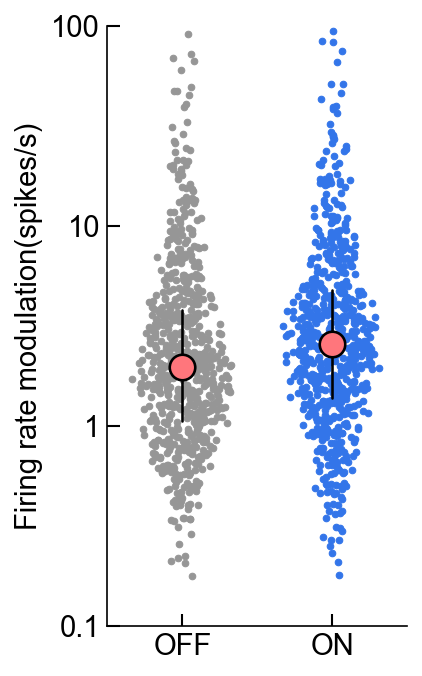

In [350]:
def add_axis_size(fig, ax_w, ax_h, left, bottom):
    fig_w, fig_h = fig.get_size_inches()
    ax = fig.add_axes([left/fig_w, bottom/fig_h, ax_w/fig_w, ax_h/fig_h])
    return ax

def make_axis_size(ax_w, ax_h, left=.3, bottom=.3, right=0, top=0):
    fig_w = (ax_w + left + right) * 1.05
    fig_h = (ax_h + bottom + top) * 1.05
    fig = plt.figure(figsize=(fig_w, fig_h))
    ax = add_axis_size(fig, ax_w, ax_h, left, bottom)
    return fig, ax

fig,ax = make_axis_size(2, 4, left=.3, bottom=.3, right=0, top=0)
switch_offset = 0.25
size=10

################################################################################################################

data_on = np.concatenate([FRmod_postearly_Ops_On,FRmod_postlate_Ops_On,FRmod_postexpert_Ops_On])
data_off = np.concatenate([FRmod_postearly_Ops_Off,FRmod_postlate_Ops_Off,FRmod_postexpert_Ops_Off])
data_control = np.concatenate([FRmod_postearly_Control,FRmod_postlate_Control,FRmod_postexpert_Control])
labels = ['OFF','ON']
numCon = 2

wid = 0.75
widsc = wid/1.75#*1.125

X = np.ones_like(data_off)*0
_,Y = ilep.violin(X,data_off,width=wid,minjitter=0.075)
X,_ = ilep.violin(X,np.log10(data_off),width=wid,minjitter=0.075)
#X -= widsc
ax.scatter(X, Y, s=size, c=GOOD_GREY, lw=0.5,zorder=-10,label='Laser OFF')

X = np.ones_like(data_on)*1
_,Y = ilep.violin(X,data_on,width=wid,minjitter=0.075)
X,_ = ilep.violin(X,np.log10(data_on),width=wid,minjitter=0.075)
#X += widsc
ax.scatter(X, Y, s=size, c=LASER_COLOR, lw=0.5,zorder=-10,label='Laser ON')


######################################

FRmod_baseline_median = 3.5
column = data_off
column = ilep.rmnan(column)
percentCR = np.nanmean(np.greater(column,FRmod_baseline_median))*100
eye_color= NCR_CR_cmap((percentCR-40)/20)
border_color = 'k'#eye_color

summary_size=150
summary_width=1.25

Q1, median, Q3 = (np.percentile(column, q) for q in [25, 50, 75])
ax.scatter([0], [median], ec=border_color,fc=eye_color, s=summary_size,lw=summary_width, zorder=10)
ax.plot([0,0], [Q1, Q3], c=border_color, lw=summary_width, zorder=9, solid_capstyle='round')


column = data_on
column = ilep.rmnan(column)
percentCR = np.nanmean(np.greater(column,FRmod_baseline_median))*100
eye_color= NCR_CR_cmap((percentCR-40)/20)
border_color = 'k'#eye_color

summary_size=150
summary_width=1.25

Q1, median, Q3 = (np.percentile(column, q) for q in [25, 50, 75])
ax.scatter([1], [median], ec=border_color,fc=eye_color, s=summary_size,lw=summary_width, zorder=10)
ax.plot([1,1], [Q1, Q3], c=border_color, lw=summary_width, zorder=9, solid_capstyle='round')

################################################################################################################

labels = ['OFF','ON']

ax.set_ylim([0,100])
ylab = ax.set_ylabel('Firing rate modulation (spikes/s)')

ax.set_yscale('log',subs=[])
ax.set_ylim([0.1,100])
ax.set_yticks([0.1,1,10,100])
ax.set_yticklabels(['0.1','1','10','100'])
ylab = ax.set_ylabel('Firing rate modulation(spikes/s)')

ax.set_xlim([-0.5,1.5])
ax.set_xticks(range(numCon))
ax.set_xticklabels(labels)
ax.set_xlim(ax.get_xlim())
ax.tick_params(direction='in', length=6, width=1)

for item in ([ax.title, ax.xaxis.label, ax.yaxis.label] +
    ax.get_xticklabels() + ax.get_yticklabels()):
    item.set_fontsize(stdfont)
# for item in (ax.get_xticklabels()):
#     item.set_fontsize(stdfont*0.9)
#     pass

### Log
# Y = 10**np.mean(np.log10(ax.get_ylim()))
# t = ax.text(2.5,Y,'Reversal',rotation=90,fontsize=stdfont,color=SWITCH_COLOR,horizontalalignment='center',verticalalignment='center')
# ax.plot([2.5]*2,[ax.get_ylim()[0],Y*0.45],lw=1,color=SWITCH_COLOR)
# ax.plot([2.5]*2,[ax.get_ylim()[1],Y/0.45],lw=1,color=SWITCH_COLOR)

### Linear
# Y = np.mean(ax.get_ylim())
# t = ax.text(2.5,Y,'Reversal',rotation=90,fontsize=stdfont,color=SWITCH_COLOR,horizontalalignment='center',verticalalignment='center')
# ax.plot([2.5]*2,[ax.get_ylim()[0],Y-np.ptp(ax.get_ylim())*0.125],lw=1,color=SWITCH_COLOR)
# ax.plot([2.5]*2,[ax.get_ylim()[1],Y+np.ptp(ax.get_ylim())*0.125],lw=1,color=SWITCH_COLOR)

artists = [ylab]
fig.savefig(os.path.join('D:\\\\Figures','Manuscript Figures','AC Opsin modulation on off V'+str(current_version)+'.pdf'),transparent=False,facecolor="white",dpi=400, bbox_extra_artists=(artists), bbox_inches='tight')

In [351]:
print(mannwhitneyu(ilep.rmnan(data_control),ilep.rmnan(data_on)).pvalue)
print(mannwhitneyu(ilep.rmnan(data_control),ilep.rmnan(data_off)).pvalue)
print(mannwhitneyu(ilep.rmnan(data_on),ilep.rmnan(data_off)).pvalue)

0.6563033230384514
7.27073624921821e-07
2.213890675850009e-06


baseline = 3.5


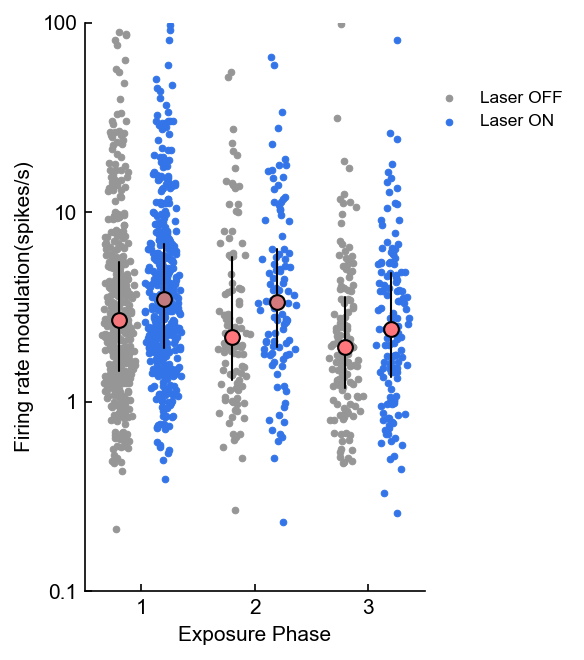

In [83]:
#Firing rate modulation graphs
size=10

FRmod_baseline_median = 3.5#np.median(FRmod_preearly)
print('baseline = '+str(FRmod_baseline_median))

fig, ax = plt.subplots(figsize=(4,4.5))
data = [FRmod_postearly_Ops,FRmod_postlate_Ops,FRmod_postexpert_Ops]
data_control = [FRmod_postearly_Control,FRmod_postlate_Control,FRmod_postexpert_Control]
data_on = [FRmod_postearly_Ops_On,FRmod_postlate_Ops_On,FRmod_postexpert_Ops_On]
data_off = [FRmod_postearly_Ops_Off,FRmod_postlate_Ops_Off,FRmod_postexpert_Ops_Off]
labels = ['1','2','3']
numCon = len(data)

wid = 0.35
widsc = wid/1.75#*1.125

# X = [np.ones(len(l))*idx for idx,l in enumerate(data_control)]
# _,Y = ilep.violin(np.concatenate(X),np.concatenate(data_control),width=wid,minjitter=0.075)
# X,_ = ilep.violin(np.concatenate(X),np.log10(np.concatenate(data_control)),width=wid,minjitter=0.075)
# X -= wid*2.25
# ax.scatter(X, Y, s=size, c='k', lw=0.5,zorder=-10,label='Control')

X = [np.ones(len(l))*idx for idx,l in enumerate(data_off)]
_,Y = ilep.violin(np.concatenate(X),np.concatenate(data_off),width=wid,minjitter=0.075)
X,_ = ilep.violin(np.concatenate(X),np.log10(np.concatenate(data_off)),width=wid,minjitter=0.075)
X -= widsc
ax.scatter(X, Y, s=size, c=GOOD_GREY, lw=0.5,zorder=-10,label='Laser OFF')

X = [np.ones(len(l))*idx for idx,l in enumerate(data_on)]
_,Y = ilep.violin(np.concatenate(X),np.concatenate(data_on),width=wid,minjitter=0.075)
X,_ = ilep.violin(np.concatenate(X),np.log10(np.concatenate(data_on)),width=wid,minjitter=0.075)
X += widsc
ax.scatter(X, Y, s=size, c=LASER_COLOR, lw=0.5,zorder=-10,label='Laser ON')

# mn = 3.5
# spread = 2.5
# colors = NCR_CR_cmap( (Y-(mn-spread/2))/ (spread) )

ax.set_yscale('log',subs=[])

#Plot summary
for idx,column in enumerate(data_off):
    column = ilep.rmnan(column)
    percentCR = np.nanmean(np.greater(column,FRmod_baseline_median))*100
    eye_color= NCR_CR_cmap((percentCR-40)/20)
    border_color = 'k'#eye_color
    
    summary_size=50
    summary_width=1
    
    Q1, median, Q3 = (np.percentile(column, q) for q in [25, 50, 75])
    ax.scatter([idx-widsc], [median], ec=border_color,fc=eye_color, s=summary_size,lw=summary_width, zorder=10)
    ax.plot([idx-widsc, idx-widsc], [Q1, Q3], c=border_color, lw=summary_width, zorder=9, solid_capstyle='round')
    
for idx,column in enumerate(data_on):
    column = ilep.rmnan(column)
    percentCR = np.nanmean(np.greater(column,FRmod_baseline_median))*100
    eye_color= NCR_CR_cmap((percentCR-40)/20)
    border_color = 'k'#eye_color
    
    summary_size=50
    summary_width=1
    
    Q1, median, Q3 = (np.percentile(column, q) for q in [25, 50, 75])
    ax.scatter([idx+widsc], [median], ec=border_color,fc=eye_color, s=summary_size,lw=summary_width, zorder=10)
    ax.plot([idx+widsc, idx+widsc], [Q1, Q3], c=border_color, lw=summary_width, zorder=9, solid_capstyle='round')
    
    
    
#Connected lines
# medians = [np.nanmedian(d) for d in data]
# ax.plot([0,1,2],medians[0:3],linestyle='--',color=GOOD_GREY,lw=1)
# ax.plot([3,4,5],medians[3:6],linestyle='--',color=GOOD_GREY,lw=1)

ax.set_ylim([0.1,100])
ax.set_yticks([0.1,1,10,100])
ax.set_yticklabels(['0.1','1','10','100'])
ax.set_ylabel('Firing rate modulation(spikes/s)')

ax.set_xlim([-0.5,2.5])
ax.set_xticks(range(numCon))
ax.set_xticklabels(labels)
ax.set_xlim(ax.get_xlim())
ax.set_xlabel('Exposure Phase')

ax.legend(frameon=False,loc=(1,0.8))

# xtick_pos_pre = ax.get_xticks()[1]
# xtick_pos_post = ax.get_xticks()[4]
# ax.text(xtick_pos_pre, 0.054188468134356925, 'Pre-rev', ha='center', va='top', fontsize=12,color='k')
# ax.text(xtick_pos_post, 0.054188468134356925, 'Post-rev', ha='center', va='top',  fontsize=12,color='k')
# ax.annotate('', xy=(0.03, -0.07), xycoords='axes fraction', xytext=(0.49, -0.07),arrowprops=dict(arrowstyle='-', color='k'))
# ax.annotate('', xy=(0.53, -0.07), xycoords='axes fraction', xytext=(0.99, -0.07),arrowprops=dict(arrowstyle='-', color='k'))

plt.tight_layout()
fig.savefig(os.path.join('D:\\\\Figures','Manuscript Figures','AC Opsin FRmodulation all cells over learning V'+str(current_version)+'.pdf'),transparent=False,facecolor="white")

In [36]:
phase = len(FRmod_postearly_Ops_Off)*["late_on"] + len(FRmod_postlate_Ops_Off)*["late_off"] \
    + len(FRmod_postearly_Ops_On)*["late_off"] + len(FRmod_postlate_Ops_On)*["late_on"] \
    + len(FRmod_postearly_Ops_Off)*["expert_on"] + len(FRmod_postexpert_Ops_Off)*["expert_off"] \
    + len(FRmod_postearly_Ops_On)*["expert_off"] + len(FRmod_postexpert_Ops_On)*["expert_on"] \

context = len(FRmod_postearly_Ops_Off)*["baseline"] + len(FRmod_postlate_Ops_Off)*["experimental"] \
    + len(FRmod_postearly_Ops_On)*["baseline"] + len(FRmod_postlate_Ops_On)*["experimental"] \
    + len(FRmod_postearly_Ops_Off)*["baseline"] + len(FRmod_postexpert_Ops_Off)*["experimental"] \
    + len(FRmod_postearly_Ops_On)*["baseline"] + len(FRmod_postexpert_Ops_On)*["experimental"] \

mod = (np.concatenate([FRmod_postearly_Ops_Off, FRmod_postlate_Ops_Off,
    FRmod_postearly_Ops_On, FRmod_postlate_Ops_On,
    FRmod_postearly_Ops_Off, FRmod_postexpert_Ops_Off,                   
    FRmod_postearly_Ops_On, FRmod_postexpert_Ops_On]))

df = pd.DataFrame({"phase": phase, "context": context, "FR_mod": mod})


### Anova ###
anova = pg.anova(data=df, dv='FR_mod', between=['phase','context'], detailed=True)
print(anova)
print()

### Create and print results ###
pairwise_mwu = pg.pairwise_tests(data=df, dv='FR_mod', between=['phase','context'], padjust="fdr_bh", parametric=False, )
print(pairwise_mwu[pairwise_mwu["Contrast"] == "phase * context"][["phase","A", "B", "p-unc", "p-corr", "hedges"]])

            Source             SS      DF           MS         F     p-unc  \
0            phase     229.837411     3.0    76.612470  0.580745  0.627651   
1          context    1259.625817     1.0  1259.625817  9.548331  0.002027   
2  phase * context     661.615948     3.0   220.538649  1.671747  0.171021   
3         Residual  287324.051788  2178.0   131.921052       NaN       NaN   

        np2  
0  0.000799  
1  0.004365  
2  0.002297  
3       NaN  

         phase         A             B         p-unc        p-corr    hedges
7   expert_off  baseline  experimental  5.203916e-10  2.081566e-09  0.284490
8    expert_on  baseline  experimental  8.899012e-02  8.899012e-02  0.176079
9     late_off  baseline  experimental  3.863893e-04  7.727786e-04  0.169630
10     late_on  baseline  experimental  4.349885e-02  5.799846e-02 -0.032244


In [37]:
phase = len(FRmod_postearly_Ops_Off)*["early"] + len(FRmod_postearly_Ops_On)*["early"] \
    + len(FRmod_postlate_Ops_Off)*["late"] + len(FRmod_postlate_Ops_On)*["late"] \
    + len(FRmod_postexpert_Ops_Off)*["expert"] + len(FRmod_postexpert_Ops_On)*["expert"] \

context = len(FRmod_postearly_Ops_Off)*["OFF"] + len(FRmod_postearly_Ops_On)*["ON"] \
    + len(FRmod_postlate_Ops_Off)*["OFF"] + len(FRmod_postlate_Ops_On)*["ON"] \
    + len(FRmod_postexpert_Ops_Off)*["OFF"] + len(FRmod_postexpert_Ops_On)*["ON"] \

mod = (np.concatenate([FRmod_postearly_Ops_Off, FRmod_postearly_Ops_On,
    FRmod_postlate_Ops_Off, FRmod_postlate_Ops_On,
    FRmod_postexpert_Ops_Off, FRmod_postexpert_Ops_On]))

df = pd.DataFrame({"phase": phase, "context": context, "FR_mod": mod})


### Anova ###
anova = pg.anova(data=df, dv='FR_mod', between=['phase','context'], detailed=True)
print(anova)
print()

### Create and print results ###
pairwise_mwu = pg.pairwise_tests(data=df, dv='FR_mod', between=['phase','context'], padjust="fdr_bh", parametric=False, )
print(pairwise_mwu[pairwise_mwu["Contrast"] == "phase * context"][["phase","A", "B", "p-unc", "p-corr", "hedges"]])

            Source             SS      DF          MS         F     p-unc  \
0            phase    1452.256560     2.0  726.128280  5.948321  0.002680   
1          context     294.846475     1.0  294.846475  2.415333  0.120391   
2  phase * context      24.306812     2.0   12.153406  0.099559  0.905244   
3         Residual  162112.693092  1328.0  122.072811       NaN       NaN   

        np2  
0  0.008879  
1  0.001815  
2  0.000150  
3       NaN  

    phase    A   B     p-unc    p-corr    hedges
4   early  OFF  ON  0.000843  0.002530 -0.076482
5  expert  OFF  ON  0.086482  0.086482 -0.066617
6    late  OFF  ON  0.006465  0.009698 -0.159643


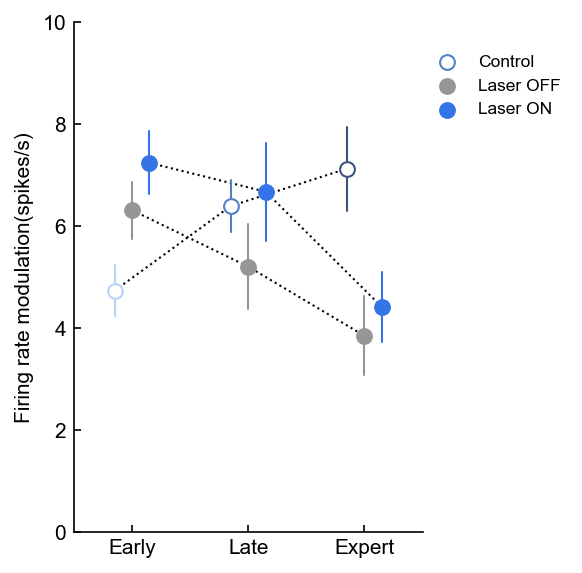

In [20]:
#Firing rate modulation graphs
size=5

labels = ['Early','Late','Expert']
offset_distance = 0.15

fig, ax = plt.subplots(figsize=(3,4.5)) #5/3 with height of 4.5


data = [FRmod_postearly_Control,FRmod_postlate_Control,FRmod_postexpert_Control]
data = [ilep.rmnan(d) for d in data]
#Plot summary
colmaxes = [np.nan]*6
for idx,column in enumerate(data):
    border_color = PHASE_COLORS[idx+3]
    eye_color = 'white'
    summary_size=50
    summary_width=1
    
    #Q1, median, Q3 = (np.percentile(column, q) for q in [25, 50, 75])
    median = np.mean(column)
    Q1 = median - sem(column)
    Q3 = median + sem(column)
    colmaxes[idx] = Q3
    
    ax.scatter([idx-offset_distance], [median], ec=border_color,fc=eye_color, s=summary_size,lw=summary_width, zorder=10)
    ax.plot([idx-offset_distance, idx-offset_distance], [Q1, Q3], c=border_color, lw=summary_width, zorder=9, solid_capstyle='round')
    
medians = [np.mean(col) for col in data]
plt.plot(np.linspace(0,2,3)-offset_distance,medians[0:3],color='k',linestyle=':',lw=1)
#plt.plot(np.linspace(3,5,3)+offset_distance,medians[3:6],color='k',linestyle=':',lw=1)
    
######################################################################################################################################################
Off_data = [FRmod_postearly_Ops_Off,FRmod_postlate_Ops_Off,FRmod_postexpert_Ops_Off]
Off_data = [ilep.rmnan(d) for d in Off_data]

#Plot summary
passive_colmaxes = [np.nan]*6
for idx,column in enumerate(Off_data):
    border_color=GOOD_GREY
    eye_color=border_color#'white'

    summary_size=50
    summary_width=1
    
    #Q1, median, Q3 = (np.percentile(column, q) for q in [25, 50, 75])
    median = np.mean(column)
    Q1 = median - sem(column)
    Q3 = median + sem(column)
    passive_colmaxes[idx] = Q3
    
    ax.scatter([idx-0*offset_distance], [median], ec=border_color,fc=eye_color, s=summary_size,lw=summary_width, zorder=10,marker='o')
    ax.plot([idx-0*offset_distance, idx-0*offset_distance], [Q1, Q3], c=border_color, lw=summary_width, zorder=9, solid_capstyle='round')
    
medians = [np.mean(col) for col in Off_data]
plt.plot(np.linspace(0,2,3)-0*offset_distance,medians[0:3],color='k',linestyle=':',lw=1)
#plt.plot(np.linspace(3,5,3)-offset_distance,medians[3:6],color='k',linestyle=':',lw=1)

######################################################################################################################################################
On_data = [FRmod_postearly_Ops_On,FRmod_postlate_Ops_On,FRmod_postexpert_Ops_On]
On_data = [ilep.rmnan(d) for d in On_data]

#Plot summary
passive_colmaxes = [np.nan]*6
for idx,column in enumerate(On_data):
    border_color=LASER_COLOR
    eye_color=border_color#'white'

    summary_size=50
    summary_width=1
    
    #Q1, median, Q3 = (np.percentile(column, q) for q in [25, 50, 75])
    median = np.mean(column)
    Q1 = median - sem(column)
    Q3 = median + sem(column)
    passive_colmaxes[idx] = Q3
    
    ax.scatter([idx+offset_distance], [median], ec=border_color,fc=eye_color, s=summary_size,lw=summary_width, zorder=10,marker='o')
    ax.plot([idx+offset_distance, idx+offset_distance], [Q1, Q3], c=border_color, lw=summary_width, zorder=9, solid_capstyle='round')
    
medians = [np.mean(col) for col in On_data]
plt.plot(np.linspace(0,2,3)+offset_distance,medians[0:3],color='k',linestyle=':',lw=1)
#plt.plot(np.linspace(3,5,3)-offset_distance,medians[3:6],color='k',linestyle=':',lw=1)












######################################################################################################################################################


ax.set_ylim([0,10])
#ax.set_yticks([4,5,6,7,8,9,10,11])
#ax.set_yticklabels([4,5,6,7,8,9,10,11])
ax.set_ylabel('Firing rate modulation(spikes/s)')

ax.set_xlim(ax.get_xlim())
ax.set_xlim([-0.5,2.5])
ax.set_xticks(range(numCon))
ax.set_xticklabels(labels)


# ax.axvline(2.5,color=SWITCH_COLOR,linestyle='--',zorder=-10,lw=1)
# ax.text(2.5,ax.get_ylim()[1],'Reversal',color=SWITCH_COLOR,horizontalalignment='center',verticalalignment='bottom')

# ax.scatter([],[],ec='grey',fc='white',s=summary_size,lw=summary_width,zorder=10,marker='o',label='passive')
# ax.scatter([],[],ec='grey',fc='grey',s=summary_size,lw=summary_width,zorder=10,marker='o',label='behaving')
# lgd = ax.legend(frameon=False,loc=(0.6,0.1))
    
ax.scatter([],[],ec=PHASE_COLORS[4],fc='white',s=summary_size,lw=summary_width,label='Control')
ax.scatter([],[],c=GOOD_GREY,s=summary_size,lw=summary_width,label='Laser OFF')
ax.scatter([],[],c=LASER_COLOR,s=summary_size,lw=summary_width,label='Laser ON')
ax.legend(frameon=False,loc=(1,0.8))

#statistics
# ax.text(1,10,str('*'),verticalalignment='top',horizontalalignment='center')
# ax.text(4,10,str('****'),verticalalignment='top',horizontalalignment='center')
# ax.text(5,10,str('****'),verticalalignment='top',horizontalalignment='center')
#ax.text(-0.4,9.5,'CR',color=CR_COLOR,horizontalalignment='left',verticalalignment='top')
#ax.text(-0.4,0.5,'NCR',color=NCR_COLOR,horizontalalignment='left',verticalalignment='bottom')
# statsbar(ax,10,[1-offset_distance,1+offset_distance],stemheights=[passive_colmaxes[1] , colmaxes[1]],text='*',lw=0.5)
# statsbar(ax,10,[4-offset_distance,4+offset_distance],stemheights=[passive_colmaxes[4] , colmaxes[4]],text='****',lw=0.5)
# statsbar(ax,10,[5-offset_distance,5+offset_distance],stemheights=[passive_colmaxes[5] , colmaxes[5]],text='****',lw=0.5)

fig.savefig(os.path.join('D:\\\\Figures','Manuscript Figures','AC Opsin Mean of FRmodulation over learning V'+str(current_version)+'.pdf'),transparent=False,facecolor="white")#, bbox_extra_artists=(lgd,t1,t2), bbox_inches='tight')

In [17]:
mannwhitneyu(FRmod_postearly_Control,FRmod_postlate_Control).pvalue

0.4757960188712955

In [18]:
mannwhitneyu(FRmod_postearly_Control,FRmod_postexpert_Control).pvalue

0.038247096307586485

In [19]:
mannwhitneyu(FRmod_postlate_Control,FRmod_postexpert_Control).pvalue

0.21331939439662828

In [20]:
len(FRmod_postearly_Control)

128

In [21]:
len(FRmod_postlate_Control)

124

In [22]:
len(FRmod_postexpert_Control)

150

In [17]:
data = [FRmod_postearly_Ops,FRmod_postlate_Ops,FRmod_postexpert_Ops]
data_control = [FRmod_postearly_Control,FRmod_postlate_Control,FRmod_postexpert_Control]
data_on = [FRmod_postearly_Ops_On,FRmod_postlate_Ops_On,FRmod_postexpert_Ops_On]
data_off = [FRmod_postearly_Ops_Off,FRmod_postlate_Ops_Off,FRmod_postexpert_Ops_Off]

In [18]:
phase = len(FRmod_postearly_Control)*["early_on"] + len(FRmod_postearly_Ops_Off)*["early_off"] \
    + len(FRmod_postearly_Control)*["early_off"] + len(FRmod_postearly_Ops_On)*["early_on"] \
    + len(FRmod_postlate_Control)*["late_on"] + len(FRmod_postlate_Ops_Off)*["late_off"] \
    + len(FRmod_postlate_Control)*["late_off"] + len(FRmod_postlate_Ops_On)*["late_on"] \
    + len(FRmod_postexpert_Control)*["expert_on"] + len(FRmod_postexpert_Ops_Off)*["expert_off"] \
    + len(FRmod_postexpert_Control)*["expert_off"] + len(FRmod_postexpert_Ops_On)*["expert_on"] \

context = len(FRmod_postearly_Control)*["control"] + len(FRmod_postearly_Ops_Off)*["opsin"] \
    + len(FRmod_postearly_Control)*["control"] + len(FRmod_postearly_Ops_On)*["opsin"] \
    + len(FRmod_postlate_Control)*["control"] + len(FRmod_postlate_Ops_Off)*["opsin"] \
    + len(FRmod_postlate_Control)*["control"] + len(FRmod_postlate_Ops_On)*["opsin"] \
    + len(FRmod_postexpert_Control)*["control"] + len(FRmod_postexpert_Ops_Off)*["opsin"] \
    + len(FRmod_postexpert_Control)*["control"] + len(FRmod_postexpert_Ops_On)*["opsin"] \

mod = (np.concatenate([FRmod_postearly_Control, FRmod_postearly_Ops_Off,
    FRmod_postearly_Control, FRmod_postearly_Ops_On,
    FRmod_postlate_Control, FRmod_postlate_Ops_Off,
    FRmod_postlate_Control, FRmod_postlate_Ops_On,
    FRmod_postexpert_Control, FRmod_postexpert_Ops_Off,                   
    FRmod_postexpert_Control, FRmod_postexpert_Ops_On]))

df = pd.DataFrame({"phase": phase, "context": context, "FR_mod": mod})


### Anova ###
anova = pg.anova(data=df, dv='FR_mod', between=['phase','context'], detailed=True)
print(anova)
print()

### Create and print results ###
pairwise_mwu = pg.pairwise_tests(data=df, dv='FR_mod', between=['phase','context'], padjust="fdr_bh", parametric=False, )
print(pairwise_mwu[pairwise_mwu["Contrast"] == "phase * context"][["phase","A", "B", "p-unc", "p-corr", "hedges"]])

ValueError: must have at least one row in constraint matrix

In [405]:
print(np.sum(np.isnan(FRmod_off)))
print(np.sum(np.isnan(FRmod_off_target)))
print(np.sum(np.isnan(FRmod_off_nontarget)))
print(np.sum(np.isnan(FRmod_delta_pc)))
print(np.sum(np.isnan(FRmod_delta_pc_target)))
print(np.sum(np.isnan(FRmod_delta_pc_nontarget)))

0
0
0
0
0
0


# Preferential recruitment

In [ ]:
BS_123_7_opto_AC.pickle clust 105 target = 1050, nontarget = 884, total = 2672

In [26]:
sessionfile = ilep.loadSessionCached(ops_directory,'BS_123_7_opto_AC.pickle')

In [34]:
print(sessionfile.responsiveness[105]['laser_on'].FRmodulation)
print(sessionfile.responsiveness[105]['laser_off'].FRmodulation)
print(sessionfile.responsiveness[105]['laser_on'].FR)
print(sessionfile.responsiveness[105]['laser_on'].FRbaseline)
print(sessionfile.responsiveness[105]['laser_off'].FR)
print(sessionfile.responsiveness[105]['laser_off'].FRbaseline)
print()
print(sessionfile.responsiveness[105]['laser_on_target'].FRmodulation)
print(sessionfile.responsiveness[105]['laser_off_target'].FRmodulation)
print(sessionfile.responsiveness[105]['laser_on_target'].FR)
print(sessionfile.responsiveness[105]['laser_on_target'].FRbaseline)
print(sessionfile.responsiveness[105]['laser_off_target'].FR)
print(sessionfile.responsiveness[105]['laser_off_target'].FRbaseline)
print()
print(sessionfile.responsiveness[105]['laser_on_nontarget'].FRmodulation)
print(sessionfile.responsiveness[105]['laser_off_nontarget'].FRmodulation)
print(sessionfile.responsiveness[105]['laser_on_nontarget'].FR)
print(sessionfile.responsiveness[105]['laser_on_nontarget'].FRbaseline)
print(sessionfile.responsiveness[105]['laser_off_nontarget'].FR)
print(sessionfile.responsiveness[105]['laser_off_nontarget'].FRbaseline)

12.896586345381523
0.46523517382413127
15.587349397590362
2.6907630522088355
2.684049079754601
3.1492842535787324

13.938492063492065
1.2112403100775189
15.922619047619047
1.984126984126984
3.9244186046511627
2.7131782945736433

11.829268292682931
1.201298701298702
15.24390243902439
3.4146341463414642
2.435064935064935
3.6363636363636362


In [40]:
np.sum(np.isfinite(FRmod_off))

570

In [17]:
len(EnumSessionOps)

902

In [47]:
len(FRmod_off)

522

In [54]:
FRmod_delta_abs = []
FRmod_delta_pc_baseline = []
FRmod_delta_pc = []
FRmod_delta_pc_target = []
FRmod_delta_pc_nontarget = []
FRmod_on = []
FRmod_off = []
FRmod_on_target = []
FRmod_off_target = []
FRmod_on_nontarget = []
FRmod_off_nontarget = []

for idx,(session,clust) in tqdm(enumerate(zip(EnumSessionOps,EnumClustOps))):
    sessionfile = ilep.loadSessionCached(ops_directory,session)
    
    if sessionfile.meta.animal not in did_not_learn_animals:
        continue
    
    if sessionfile.meta.day_of_training >= animalBehaviors[sessionfile.meta.animal].cloudiness:
        continue
        
    if not sessionfile.meta.task == 'opto reversal':
        continue

    on = sessionfile.responsiveness[clust]['laser_on'].FRmodulation
    off = sessionfile.responsiveness[clust]['laser_off'].FRmodulation
    ontarget = sessionfile.responsiveness[clust]['laser_on_target'].FRmodulation
    offtarget = sessionfile.responsiveness[clust]['laser_off_target'].FRmodulation
    onnontarget = sessionfile.responsiveness[clust]['laser_on_nontarget'].FRmodulation
    offnontarget = sessionfile.responsiveness[clust]['laser_off_nontarget'].FRmodulation
    offbaseline = sessionfile.responsiveness[clust]['laser_off'].FRbaseline
    
#     if off < 1.8:
#         print(f"{session} clust {clust} target = {int((ontarget-offtarget)/offtarget*100)}, nontarget = {int((onnontarget-offnontarget)/offnontarget*100)}, total = {int((on-off)/off*100)}")
    if off < 1.8 and on >= 1.8:
        target_off_delta = sessionfile.responsiveness[clust]['laser_off_target'].FR - sessionfile.responsiveness[clust]['laser_off_target'].FRbaseline
        target_on_delta = sessionfile.responsiveness[clust]['laser_on_target'].FR - sessionfile.responsiveness[clust]['laser_on_target'].FRbaseline
        nontarget_off_delta = sessionfile.responsiveness[clust]['laser_off_nontarget'].FR - sessionfile.responsiveness[clust]['laser_off_nontarget'].FRbaseline
        nontarget_on_delta = sessionfile.responsiveness[clust]['laser_on_nontarget'].FR - sessionfile.responsiveness[clust]['laser_on_nontarget'].FRbaseline
        target_off_polarity = target_off_delta / np.abs(target_off_delta)
        target_on_polarity = target_on_delta / np.abs(target_on_delta)
        nontarget_off_polarity = nontarget_off_delta / np.abs(nontarget_off_delta)
        nontarget_on_polarity = nontarget_on_delta / np.abs(nontarget_on_delta)
#         if target_off_polarity > 0 and nontarget_off_polarity < 0:
#             print(f"{session} clust {clust} biased")
#         if target_off_polarity < 0 and nontarget_off_polarity > 0:
#             print(f"{session} clust {clust} biased")
#         if target_off_polarity > 0 and nontarget_off_polarity > 0:
#             print(f"{session} clust {clust} even")
#         if target_off_polarity < 0 and nontarget_off_polarity < 0:
#             print(f"{session} clust {clust} even")
        
    try:
        FRmod_on.append(on)
        FRmod_off.append(off)
        FRmod_on_target.append(ontarget)
        FRmod_off_target.append(offtarget)
        FRmod_on_nontarget.append(onnontarget)
        FRmod_off_nontarget.append(offnontarget)
        FRmod_delta_abs.append( (on-off) )
        FRmod_delta_pc_baseline.append( (on-off)/offbaseline*100 )
        FRmod_delta_pc.append( (on-off)/off*100 )
        FRmod_delta_pc_target.append( (ontarget-offtarget)/offtarget*100 )
        FRmod_delta_pc_nontarget.append( (onnontarget-offnontarget)/offnontarget*100 )
    except Exception as e:
        print(session + ': '+ str(e))
        
FRmod_off = np.array(FRmod_off)
FRmod_off_target = np.array(FRmod_off_target)
FRmod_off_nontarget = np.array(FRmod_off_nontarget)
FRmod_delta_pc = np.array(FRmod_delta_pc)
FRmod_delta_pc_target = np.array(FRmod_delta_pc_target)
FRmod_delta_pc_nontarget = np.array(FRmod_delta_pc_nontarget)

360it [00:08, 96.76it/s]<ipython-input-54-df9a4e364cc0>:61: RuntimeWarning: divide by zero encountered in double_scalars
  FRmod_delta_pc_baseline.append( (on-off)/offbaseline*100 )
850it [00:23, 36.57it/s] 


CR
17.66212961072393
NCR
132.28702017466796


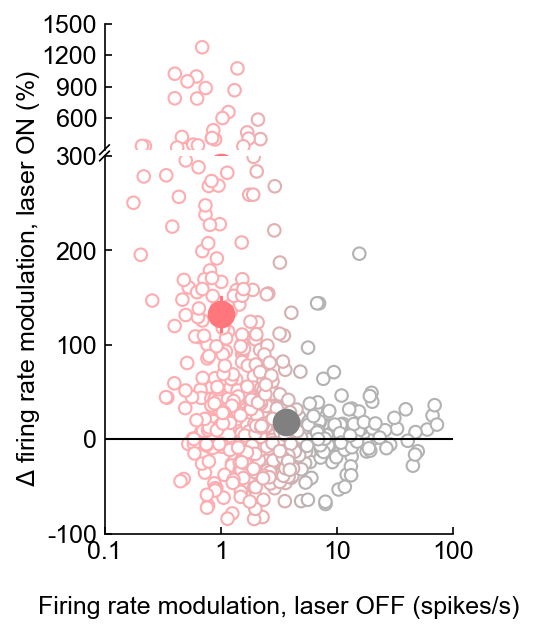

In [22]:
X = 3.25
Y = 4
X = X + 0.3
Y = Y + 0.3

fig = plt.figure(figsize=(3,4.5))
# fig = plt.figure(figsize=(X,Y))
bax = brokenaxes(ylims=( (-100,300), (300, 1500) ), height_ratios=[1,3], hspace=0.025)

CR_NCR_median = 1.8
colors = NCR_CR_cmap((np.array(FRmod_off)-1)/5)
bax.axs[0].scatter(FRmod_off[np.greater_equal(FRmod_delta_pc,300)],FRmod_delta_pc[np.greater_equal(FRmod_delta_pc,300)],fc='white',ec=colors[np.greater_equal(FRmod_delta_pc,300)],zorder=-10)
bax.axs[1].scatter(FRmod_off[np.less(FRmod_delta_pc,300)],FRmod_delta_pc[np.less(FRmod_delta_pc,300)],fc='white',ec=colors[np.less(FRmod_delta_pc,300)],zorder=-10)

mask_CR = np.greater_equal(FRmod_off,CR_NCR_median)
mask_NCR = np.less(FRmod_off,CR_NCR_median)
median_FRmod_off_CR = np.median(FRmod_off[mask_CR])
median_FRmod_off_NCR = np.median(FRmod_off[mask_NCR])
median_FRmod_delta_pc_CR = np.median(FRmod_delta_pc[mask_CR])
median_FRmod_delta_pc_NCR = np.median(FRmod_delta_pc[mask_NCR])
sem_FRmod_delta_pc_CR = sem(FRmod_delta_pc[mask_CR])
sem_FRmod_delta_pc_NCR = sem(FRmod_delta_pc[mask_NCR])

# Q1, median, Q3 = (np.percentile(FRmod_delta_pc[mask_CR], q) for q in [25, 50, 75])
median_value = np.mean(FRmod_delta_pc[mask_CR])
print('CR')
print(median_value)
Q1 = median_value - sem(FRmod_delta_pc[mask_CR])
Q3 = median_value + sem(FRmod_delta_pc[mask_CR])
bax.scatter([median_FRmod_off_CR],[median_value],s=150,color=CR_COLOR,zorder=20,clip_on=False)
bax.plot([median_FRmod_off_CR]*2,[Q1,Q3],zorder=21,color=CR_COLOR,clip_on=False)

# Q1, median, Q3 = (np.percentile(FRmod_delta_pc[mask_NCR], q) for q in [25, 50, 75])
median_value = np.mean(FRmod_delta_pc[mask_NCR])
print('NCR')
print(median_value)
Q1 = median_value - sem(FRmod_delta_pc[mask_NCR])
Q3 = median_value + sem(FRmod_delta_pc[mask_NCR])
bax.scatter([median_FRmod_off_NCR],[median_value],s=150,color=NCR_COLOR,zorder=20,clip_on=False)
bax.plot([median_FRmod_off_NCR]*2,[Q1,Q3],zorder=21,color=NCR_COLOR,clip_on=False)

xlims = [0,105]#ax.get_xlim()
xlims = [0.1,100]#ax.get_xlim()
bax.set_xlim(xlims)
bax.set_xscale('log',subs=[])
bax.set_xlabel('Firing rate modulation, laser OFF (spikes/s)',fontsize=12)
bax.set_ylabel(r'$\Delta$ firing rate modulation, laser ON (%)',fontsize=12)

#ylims = [-200,1600]#ax.get_ylim()
#ax.set_yticks([-200,0,200,400,600,800,1000,1200,1400,1600])
#ax.set_yticklabels(['-200','0','200','400','600','800','1000','1200','1400','1600'])

bax.axs[1].set_xticks([0.1,1,10,100])
bax.axs[1].set_xticklabels(['0.1','1','10','100'],fontsize=12)

bax.axhline(0,linestyle='-',color='k',zorder=10,lw=1)
#bax.axvline(CR_NCR_median,linestyle='-',color='k',zorder=10,lw=1)

bax.axs[0].fill_between(bax.axs[0].get_xlim(),[300,300],[1500,1500],fc='white',lw=0,alpha=0.4,zorder=-5)
bax.axs[1].fill_between(bax.axs[1].get_xlim(),bax.axs[1].get_ylim()[0]*2,bax.axs[1].get_ylim()[1]*2,fc='white',lw=0,alpha=0.4,zorder=-5)

# ax.text(CR_NCR_median,ylims[1],' CR',ha='left',va='top',color=CR_COLOR,weight='bold')
# ax.text(CR_NCR_median,ylims[1],'NCR ',ha='right',va='top',color=NCR_COLOR,weight='bold')

bax.axs[0].set_yticks([600,900,1200,1500])
bax.axs[0].set_yticklabels([str(d) for d in [600,900,1200,1500]],fontsize=12)
bax.axs[1].set_yticks([-100,0,100,200,300])
bax.axs[1].set_yticklabels([str(d) for d in [-100,0,100,200,300]],fontsize=12)

fig.savefig(os.path.join('D:\\\\Figures','Manuscript Figures','Opsin preferential recruitment V'+str(current_version)+'.pdf'),transparent=False,facecolor="white")

In [61]:
mannwhitneyu(FRmod_delta_pc[mask_CR],FRmod_delta_pc[mask_NCR]).pvalue

2.9704083962369005e-14

In [56]:
np.sum(mask_CR)

295

In [57]:
len(mask_NCR)

522

In [58]:
np.sum(mask_NCR)

227

In [59]:
len(mask_CR)

522

In [60]:
317+253

570

# Target

30.843801718703617


[Text(0, -100, '-100'),
 Text(0, 0, '0'),
 Text(0, 100, '100'),
 Text(0, 200, '200'),
 Text(0, 300, '300')]

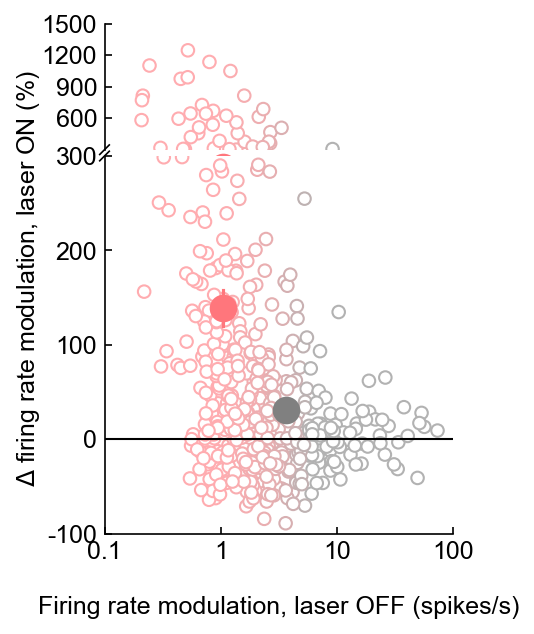

In [51]:
X = 3.25
Y = 4
X = X + 0.3
Y = Y + 0.3

fig = plt.figure(figsize=(3,4.5))
# fig = plt.figure(figsize=(X,Y))
bax = brokenaxes(ylims=( (-100,300), (300, 1500) ), height_ratios=[1,3], hspace=0.025)

CR_NCR_median = 1.8
colors = NCR_CR_cmap((np.array(FRmod_off_target)-1)/5)
bax.axs[0].scatter(FRmod_off_target[np.greater_equal(FRmod_delta_pc_target,300)],FRmod_delta_pc_target[np.greater_equal(FRmod_delta_pc_target,300)],fc='white',ec=colors[np.greater_equal(FRmod_delta_pc_target,300)],zorder=-10)
bax.axs[1].scatter(FRmod_off_target[np.less(FRmod_delta_pc_target,300)],FRmod_delta_pc_target[np.less(FRmod_delta_pc_target,300)],fc='white',ec=colors[np.less(FRmod_delta_pc_target,300)],zorder=-10)

mask_CR = np.greater_equal(FRmod_off_target,1.8)
mask_NCR = np.less(FRmod_off_target,1.8)
median_FRmod_off_CR = np.median(FRmod_off_target[mask_CR])
median_FRmod_off_NCR = np.median(FRmod_off_target[mask_NCR])
median_FRmod_delta_pc_CR = np.median(FRmod_delta_pc_target[mask_CR])
median_FRmod_delta_pc_NCR = np.median(FRmod_delta_pc_target[mask_NCR])
sem_FRmod_delta_pc_CR = sem(FRmod_delta_pc_target[mask_CR])
sem_FRmod_delta_pc_NCR = sem(FRmod_delta_pc_target[mask_NCR])

# Q1, median, Q3 = (np.percentile(FRmod_delta_pc[mask_CR], q) for q in [25, 50, 75])
median_value = np.mean(FRmod_delta_pc_target[mask_CR])
print(median_value)
Q1 = median_value - sem(FRmod_delta_pc_target[mask_CR])
Q3 = median_value + sem(FRmod_delta_pc_target[mask_CR])
bax.scatter([median_FRmod_off_CR],[median_value],s=150,color=CR_COLOR,zorder=20,clip_on=False)
bax.plot([median_FRmod_off_CR]*2,[Q1,Q3],zorder=21,color=CR_COLOR,clip_on=False)

# Q1, median, Q3 = (np.percentile(FRmod_delta_pc[mask_NCR], q) for q in [25, 50, 75])
median_value = np.mean(FRmod_delta_pc_target[mask_NCR])
Q1 = median_value - sem(FRmod_delta_pc_target[mask_NCR])
Q3 = median_value + sem(FRmod_delta_pc_target[mask_NCR])
bax.scatter([median_FRmod_off_NCR],[median_value],s=150,color=NCR_COLOR,zorder=20,clip_on=False)
bax.plot([median_FRmod_off_NCR]*2,[Q1,Q3],zorder=21,color=NCR_COLOR,clip_on=False)

xlims = [0,105]#ax.get_xlim()
xlims = [0.1,100]#ax.get_xlim()
bax.set_xlim(xlims)
bax.set_xscale('log',subs=[])
bax.set_xlabel('Firing rate modulation, laser OFF (spikes/s)',fontsize=12)
bax.set_ylabel(r'$\Delta$ firing rate modulation, laser ON (%)',fontsize=12)

#ylims = [-200,1600]#ax.get_ylim()
#ax.set_yticks([-200,0,200,400,600,800,1000,1200,1400,1600])
#ax.set_yticklabels(['-200','0','200','400','600','800','1000','1200','1400','1600'])

bax.axs[1].set_xticks([0.1,1,10,100])
bax.axs[1].set_xticklabels(['0.1','1','10','100'],fontsize=12)

bax.axhline(0,linestyle='-',color='k',zorder=10,lw=1)
#bax.axvline(CR_NCR_median,linestyle='-',color='k',zorder=10,lw=1)

bax.axs[0].fill_between(bax.axs[0].get_xlim(),[300,300],[1500,1500],fc='white',lw=0,alpha=0.4,zorder=-5)
bax.axs[1].fill_between(bax.axs[1].get_xlim(),bax.axs[1].get_ylim()[0]*2,bax.axs[1].get_ylim()[1]*2,fc='white',lw=0,alpha=0.4,zorder=-5)

# ax.text(CR_NCR_median,ylims[1],' CR',ha='left',va='top',color=CR_COLOR,weight='bold')
# ax.text(CR_NCR_median,ylims[1],'NCR ',ha='right',va='top',color=NCR_COLOR,weight='bold')

bax.axs[0].set_yticks([600,900,1200,1500])
bax.axs[0].set_yticklabels([str(d) for d in [600,900,1200,1500]],fontsize=12)
bax.axs[1].set_yticks([-100,0,100,200,300])
bax.axs[1].set_yticklabels([str(d) for d in [-100,0,100,200,300]],fontsize=12)

# fig.savefig(os.path.join('D:\\\\Figures','Manuscript Figures','Opsin target preferential recruitment V'+str(current_version)+'.pdf'),transparent=False,facecolor="white")

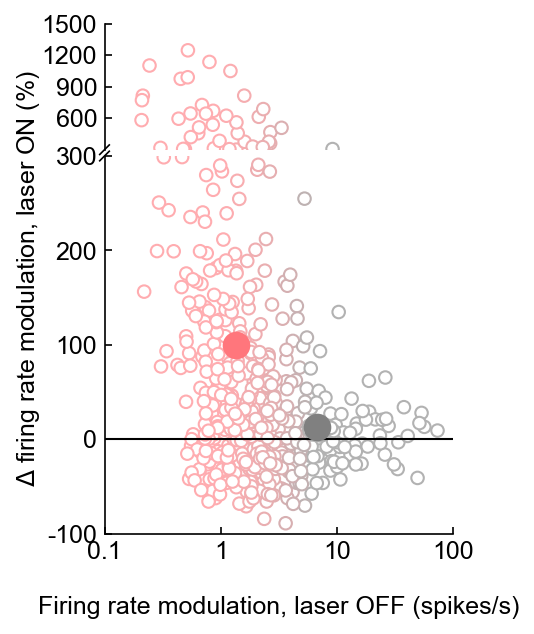

In [400]:
X = 3.25
Y = 4
X = X + 0.3
Y = Y + 0.3

fig = plt.figure(figsize=(3,4.5))
# fig = plt.figure(figsize=(X,Y))
bax = brokenaxes(ylims=( (-100,300), (300, 1500) ), height_ratios=[1,3], hspace=0.025)

CR_NCR_median = 3.5
colors = NCR_CR_cmap((np.array(FRmod_off_target)-1)/5)
bax.axs[0].scatter(FRmod_off_target[np.greater_equal(FRmod_delta_pc_target,300)],FRmod_delta_pc_target[np.greater_equal(FRmod_delta_pc_target,300)],fc='white',ec=colors[np.greater_equal(FRmod_delta_pc_target,300)],zorder=-10)
bax.axs[1].scatter(FRmod_off_target[np.less(FRmod_delta_pc_target,300)],FRmod_delta_pc_target[np.less(FRmod_delta_pc_target,300)],fc='white',ec=colors[np.less(FRmod_delta_pc_target,300)],zorder=-10)

mask_CR = np.greater_equal(FRmod_off_target,3.5)
mask_NCR = np.less(FRmod_off_target,3.5)
median_FRmod_off_CR = np.median(FRmod_off_target[mask_CR])
median_FRmod_off_NCR = np.median(FRmod_off_target[mask_NCR])
median_FRmod_delta_pc_CR = np.median(FRmod_delta_pc_target[mask_CR])
median_FRmod_delta_pc_NCR = np.median(FRmod_delta_pc_target[mask_NCR])
sem_FRmod_delta_pc_CR = sem(FRmod_delta_pc_target[mask_CR])
sem_FRmod_delta_pc_NCR = sem(FRmod_delta_pc_target[mask_NCR])

# Q1, median, Q3 = (np.percentile(FRmod_delta_pc[mask_CR], q) for q in [25, 50, 75])
median_value = np.mean(FRmod_delta_pc_target[mask_CR])
Q1 = median_value - sem(FRmod_delta_pc_target[mask_CR])
Q3 = median_value + sem(FRmod_delta_pc_target[mask_CR])
bax.scatter([median_FRmod_off_CR],[median_value],s=150,color=CR_COLOR,zorder=20,clip_on=False)
bax.plot([median_FRmod_off_CR]*2,[Q1,Q3],zorder=21,color=CR_COLOR,clip_on=False)

# Q1, median, Q3 = (np.percentile(FRmod_delta_pc[mask_NCR], q) for q in [25, 50, 75])
median_value = np.mean(FRmod_delta_pc_target[mask_NCR])
Q1 = median_value - sem(FRmod_delta_pc_target[mask_NCR])
Q3 = median_value + sem(FRmod_delta_pc_target[mask_NCR])
bax.scatter([median_FRmod_off_NCR],[median_value],s=150,color=NCR_COLOR,zorder=20,clip_on=False)
bax.plot([median_FRmod_off_NCR]*2,[Q1,Q3],zorder=21,color=NCR_COLOR,clip_on=False)

xlims = [0,105]#ax.get_xlim()
xlims = [0.1,100]#ax.get_xlim()
bax.set_xlim(xlims)
bax.set_xscale('log',subs=[])
bax.set_xlabel('Firing rate modulation, laser OFF (spikes/s)',fontsize=12)
bax.set_ylabel(r'$\Delta$ firing rate modulation, laser ON (%)',fontsize=12)

#ylims = [-200,1600]#ax.get_ylim()
#ax.set_yticks([-200,0,200,400,600,800,1000,1200,1400,1600])
#ax.set_yticklabels(['-200','0','200','400','600','800','1000','1200','1400','1600'])

bax.axs[1].set_xticks([0.1,1,10,100])
bax.axs[1].set_xticklabels(['0.1','1','10','100'],fontsize=12)

bax.axhline(0,linestyle='-',color='k',zorder=10,lw=1)
#bax.axvline(CR_NCR_median,linestyle='-',color='k',zorder=10,lw=1)

bax.axs[0].fill_between(bax.axs[0].get_xlim(),[300,300],[1500,1500],fc='white',lw=0,alpha=0.4,zorder=-5)
bax.axs[1].fill_between(bax.axs[1].get_xlim(),bax.axs[1].get_ylim()[0]*2,bax.axs[1].get_ylim()[1]*2,fc='white',lw=0,alpha=0.4,zorder=-5)

# ax.text(CR_NCR_median,ylims[1],' CR',ha='left',va='top',color=CR_COLOR,weight='bold')
# ax.text(CR_NCR_median,ylims[1],'NCR ',ha='right',va='top',color=NCR_COLOR,weight='bold')

bax.axs[0].set_yticks([600,900,1200,1500])
bax.axs[0].set_yticklabels([str(d) for d in [600,900,1200,1500]],fontsize=12)
bax.axs[1].set_yticks([-100,0,100,200,300])
bax.axs[1].set_yticklabels([str(d) for d in [-100,0,100,200,300]],fontsize=12)

fig.savefig(os.path.join('D:\\\\Figures','Manuscript Figures','Opsin target preferential recruitment V'+str(current_version)+'.pdf'),transparent=False,facecolor="white")

In [21]:
mannwhitneyu(FRmod_delta_pc_target[mask_CR],FRmod_delta_pc_target[mask_NCR]).pvalue

0.010067394156999225

# Nontarget

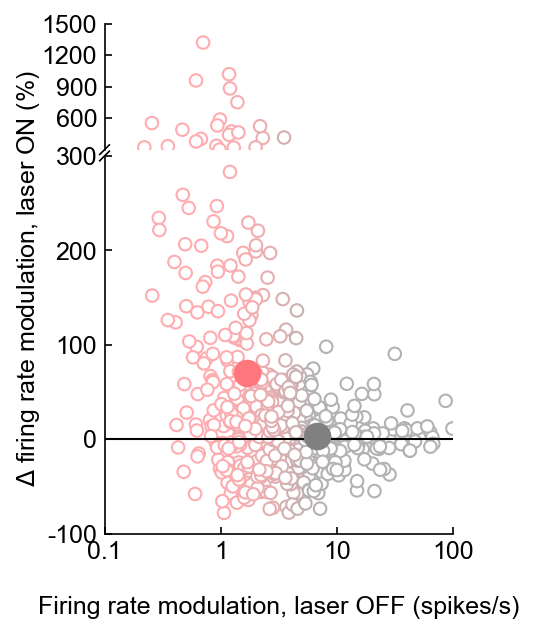

In [412]:
X = 3.25
Y = 4
X = X + 0.3
Y = Y + 0.3

fig = plt.figure(figsize=(3,4.5))
# fig = plt.figure(figsize=(X,Y))
bax = brokenaxes(ylims=( (-100,300), (300, 1500) ), height_ratios=[1,3], hspace=0.025)

CR_NCR_median = 3.5
colors = NCR_CR_cmap((np.array(FRmod_off_nontarget)-1)/5)
bax.axs[0].scatter(FRmod_off_nontarget[np.greater_equal(FRmod_delta_pc_nontarget,300)],FRmod_delta_pc_nontarget[np.greater_equal(FRmod_delta_pc_nontarget,300)],fc='white',ec=colors[np.greater_equal(FRmod_delta_pc_nontarget,300)],zorder=-10)
bax.axs[1].scatter(FRmod_off_nontarget[np.less(FRmod_delta_pc_nontarget,300)],FRmod_delta_pc_nontarget[np.less(FRmod_delta_pc_nontarget,300)],fc='white',ec=colors[np.less(FRmod_delta_pc_nontarget,300)],zorder=-10)

mask_CR = np.greater_equal(FRmod_off_nontarget,3.5)
mask_NCR = np.less(FRmod_off_nontarget,3.5)
median_FRmod_off_CR = np.median(FRmod_off_nontarget[mask_CR])
median_FRmod_off_NCR = np.median(FRmod_off_nontarget[mask_NCR])
median_FRmod_delta_pc_CR = np.median(FRmod_delta_pc_nontarget[mask_CR])
median_FRmod_delta_pc_NCR = np.median(FRmod_delta_pc_nontarget[mask_NCR])
sem_FRmod_delta_pc_CR = sem(FRmod_delta_pc_nontarget[mask_CR])
sem_FRmod_delta_pc_NCR = sem(FRmod_delta_pc_nontarget[mask_NCR])

# Q1, median, Q3 = (np.percentile(FRmod_delta_pc[mask_CR], q) for q in [25, 50, 75])
median_value = np.mean(FRmod_delta_pc_nontarget[mask_CR])
Q1 = median_value - sem(FRmod_delta_pc_nontarget[mask_CR])
Q3 = median_value + sem(FRmod_delta_pc_nontarget[mask_CR])
bax.scatter([median_FRmod_off_CR],[median_value],s=150,color=CR_COLOR,zorder=20,clip_on=False)
bax.plot([median_FRmod_off_CR]*2,[Q1,Q3],zorder=21,color=CR_COLOR,clip_on=False)

# Q1, median, Q3 = (np.percentile(FRmod_delta_pc[mask_NCR], q) for q in [25, 50, 75])
median_value = np.mean(FRmod_delta_pc_nontarget[mask_NCR])
Q1 = median_value - sem(FRmod_delta_pc_nontarget[mask_NCR])
Q3 = median_value + sem(FRmod_delta_pc_nontarget[mask_NCR])
bax.scatter([median_FRmod_off_NCR],[median_value],s=150,color=NCR_COLOR,zorder=20,clip_on=False)
bax.plot([median_FRmod_off_NCR]*2,[Q1,Q3],zorder=21,color=NCR_COLOR,clip_on=False)

xlims = [0,105]#ax.get_xlim()
xlims = [0.1,100]#ax.get_xlim()
bax.set_xlim(xlims)
bax.set_xscale('log',subs=[])
bax.set_xlabel('Firing rate modulation, laser OFF (spikes/s)',fontsize=12)
bax.set_ylabel(r'$\Delta$ firing rate modulation, laser ON (%)',fontsize=12)

#ylims = [-200,1600]#ax.get_ylim()
#ax.set_yticks([-200,0,200,400,600,800,1000,1200,1400,1600])
#ax.set_yticklabels(['-200','0','200','400','600','800','1000','1200','1400','1600'])

bax.axs[1].set_xticks([0.1,1,10,100])
bax.axs[1].set_xticklabels(['0.1','1','10','100'],fontsize=12)

bax.axhline(0,linestyle='-',color='k',zorder=10,lw=1)
#bax.axvline(CR_NCR_median,linestyle='-',color='k',zorder=10,lw=1)

bax.axs[0].fill_between(bax.axs[0].get_xlim(),[300,300],[1500,1500],fc='white',lw=0,alpha=0.4,zorder=-5)
bax.axs[1].fill_between(bax.axs[1].get_xlim(),bax.axs[1].get_ylim()[0]*2,bax.axs[1].get_ylim()[1]*2,fc='white',lw=0,alpha=0.4,zorder=-5)

# ax.text(CR_NCR_median,ylims[1],' CR',ha='left',va='top',color=CR_COLOR,weight='bold')
# ax.text(CR_NCR_median,ylims[1],'NCR ',ha='right',va='top',color=NCR_COLOR,weight='bold')

bax.axs[0].set_yticks([600,900,1200,1500])
bax.axs[0].set_yticklabels([str(d) for d in [600,900,1200,1500]],fontsize=12)
bax.axs[1].set_yticks([-100,0,100,200,300])
bax.axs[1].set_yticklabels([str(d) for d in [-100,0,100,200,300]],fontsize=12)

fig.savefig(os.path.join('D:\\\\Figures','Manuscript Figures','Opsin nontarget preferential recruitment V'+str(current_version)+'.pdf'),transparent=False,facecolor="white")

In [22]:
mannwhitneyu(FRmod_delta_pc_nontarget[mask_CR],FRmod_delta_pc_nontarget[mask_NCR]).pvalue

1.258232448536619e-05

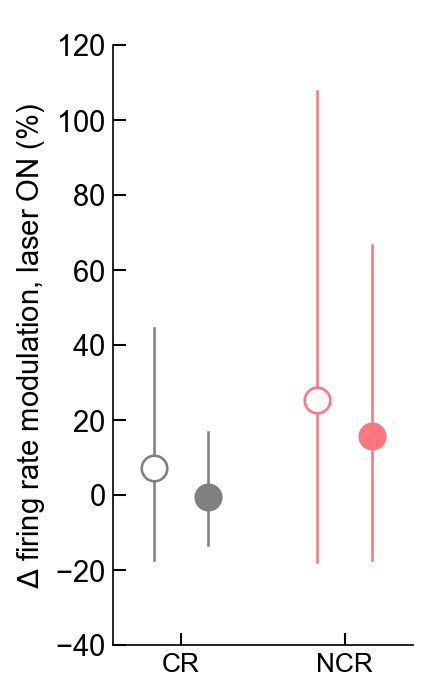

In [133]:
def add_axis_size(fig, ax_w, ax_h, left, bottom):
    fig_w, fig_h = fig.get_size_inches()
    ax = fig.add_axes([left/fig_w, bottom/fig_h, ax_w/fig_w, ax_h/fig_h])
    return ax

def make_axis_size(ax_w, ax_h, left=.3, bottom=.3, right=0, top=0):
    fig_w = (ax_w + left + right) * 1.05
    fig_h = (ax_h + bottom + top) * 1.05
    fig = plt.figure(figsize=(fig_w, fig_h))
    ax = add_axis_size(fig, ax_w, ax_h, left, bottom)
    return fig, ax

fig,ax = make_axis_size(2, 4, left=.3, bottom=.3, right=0, top=0)
switch_offset = 0.5

################################################################################################################

size = 20
summary_size=150
summary_width=1.25#0.75

mask_CR = np.greater_equal(FRmod_off,3.5)
mask_NCR = np.less(FRmod_off,3.5)


median_value = np.mean(FRmod_delta_pc_target[mask_CR])
Q1 = median_value - sem(FRmod_delta_pc_target[mask_CR])
Q3 = median_value + sem(FRmod_delta_pc_target[mask_CR])
Q1, median_value, Q3 = (np.percentile(FRmod_delta_pc_target[mask_CR], q) for q in [25, 50, 75])
ax.scatter([0-switch_offset],[median_value],s=summary_size,fc='white',ec=CR_COLOR,zorder=21,clip_on=False,lw=summary_width)
ax.plot([0-switch_offset]*2,[Q1,Q3],zorder=20,color=CR_COLOR,clip_on=False,lw=summary_width)

median_value = np.mean(FRmod_delta_pc_nontarget[mask_CR])
Q1 = median_value - sem(FRmod_delta_pc_nontarget[mask_CR])
Q3 = median_value + sem(FRmod_delta_pc_nontarget[mask_CR])
Q1, median_value, Q3 = (np.percentile(FRmod_delta_pc_nontarget[mask_CR], q) for q in [25, 50, 75])
ax.scatter([1-switch_offset],[median_value],s=summary_size,color=CR_COLOR,zorder=21,clip_on=False,lw=summary_width)
ax.plot([1-switch_offset]*2,[Q1,Q3],zorder=20,color=CR_COLOR,clip_on=False,lw=summary_width)

median_value = np.mean(FRmod_delta_pc_target[mask_NCR])
Q1 = median_value - sem(FRmod_delta_pc_target[mask_NCR])
Q3 = median_value + sem(FRmod_delta_pc_target[mask_NCR])
Q1, median_value, Q3 = (np.percentile(FRmod_delta_pc_target[mask_NCR], q) for q in [25, 50, 75])
ax.scatter([2+switch_offset],[median_value],s=summary_size,fc='white',ec=NCR_COLOR,zorder=21,clip_on=False,lw=summary_width)
ax.plot([2+switch_offset]*2,[Q1,Q3],zorder=20,color=NCR_COLOR,clip_on=False,lw=summary_width)

median_value = np.mean(FRmod_delta_pc_nontarget[mask_NCR])
Q1 = median_value - sem(FRmod_delta_pc_nontarget[mask_NCR])
Q3 = median_value + sem(FRmod_delta_pc_nontarget[mask_NCR])
Q1, median_value, Q3 = (np.percentile(FRmod_delta_pc_nontarget[mask_NCR], q) for q in [25, 50, 75])
ax.scatter([3+switch_offset],[median_value],s=summary_size,color=NCR_COLOR,zorder=21,clip_on=False,lw=summary_width)
ax.plot([3+switch_offset]*2,[Q1,Q3],zorder=20,color=NCR_COLOR,clip_on=False,lw=summary_width)

################################################################################################################
# labels = ['CR','NCR','CR','NCR']
labels = ['CR','NCR']

ax.set_ylim([-40,120])
ylab = ax.set_ylabel(r'$\Delta$ firing rate modulation, laser ON (%)')

ax.set_xlim([-0.75-switch_offset,3.75+switch_offset])
# ax.set_xticks([0-switch_offset,1-switch_offset,2+switch_offset,3+switch_offset])
ax.set_xticks([0.5-switch_offset,2.5+switch_offset])
ax.set_xticklabels(labels)

# xtick_pos_pre = 0.5-switch_offset
# xtick_pos_post = 2.5+switch_offset
# Yval = ilep.getPrePostLabelYval(ax.get_ylim(),Yfrac=-2*stdyfrac,log=False)
# t1 = ax.text(xtick_pos_pre, Yval, 'Target', ha='center', va='bottom', fontsize=stdfont,color='k')
# t2 = ax.text(xtick_pos_post, Yval, 'Nontarget', ha='center', va='bottom',  fontsize=stdfont,color='k')
# ax.annotate('', xy=(0.05, -stdyfrac), xycoords='axes fraction', xytext=(0.43, -stdyfrac),arrowprops=dict(arrowstyle='-', color='black'))
# ax.annotate('', xy=(0.55, -stdyfrac), xycoords='axes fraction', xytext=(0.93, -stdyfrac),arrowprops=dict(arrowstyle='-', color='black'))

ax.tick_params(direction='in', length=6, width=1)

for item in ([ax.title, ax.xaxis.label, ax.yaxis.label] +
    ax.get_xticklabels() + ax.get_yticklabels()):
    item.set_fontsize(stdfont)
for item in (ax.get_xticklabels()):
    item.set_fontsize(stdfont*0.9)
    pass

# Y = np.mean(ax.get_ylim())
# Y = 10**np.mean(np.log10(ax.get_ylim()))
# t = ax.text(2.5,Y,'Reversal',rotation=90,fontsize=stdfont,color=SWITCH_COLOR,horizontalalignment='center',verticalalignment='center')
# ax.plot([2.5]*2,[ax.get_ylim()[0],Y*0.45],lw=1,color=SWITCH_COLOR)
# ax.plot([2.5]*2,[ax.get_ylim()[1],Y/0.45],lw=1,color=SWITCH_COLOR)

ax.fill_between(ax.get_xlim(),[ax.get_ylim()[0]]*2,[ax.get_ylim()[1]*2]*2,color='white',alpha=0.4,zorder=-5,clip_on=False)

ttl = ax.set_title(' ')
artists = [ylab]
fig.savefig(os.path.join('D:\\\\Figures','Manuscript Figures','Opto preferential recruitment with control V'+str(current_version)+'.pdf'),transparent=False,facecolor="white",dpi=400, bbox_extra_artists=(artists), bbox_inches='tight')

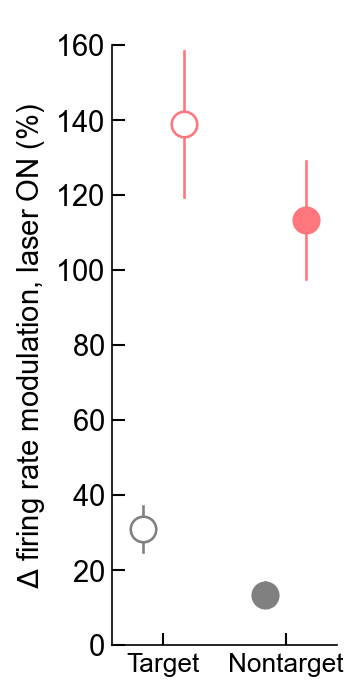

In [34]:
def add_axis_size(fig, ax_w, ax_h, left, bottom):
    fig_w, fig_h = fig.get_size_inches()
    ax = fig.add_axes([left/fig_w, bottom/fig_h, ax_w/fig_w, ax_h/fig_h])
    return ax

def make_axis_size(ax_w, ax_h, left=.3, bottom=.3, right=0, top=0):
    fig_w = (ax_w + left + right) * 1.05
    fig_h = (ax_h + bottom + top) * 1.05
    fig = plt.figure(figsize=(fig_w, fig_h))
    ax = add_axis_size(fig, ax_w, ax_h, left, bottom)
    return fig, ax

fig,ax = make_axis_size(1.5, 4, left=.3, bottom=.3, right=0, top=0)
switch_offset = 0.5

################################################################################################################

# Scatterplot code

# CR_NCR_median = 1.8
# colors = NCR_CR_cmap((np.array(FRmod_off_target)-1)/5)
# bax.axs[0].scatter(FRmod_off_target[np.greater_equal(FRmod_delta_pc_target,300)],FRmod_delta_pc_target[np.greater_equal(FRmod_delta_pc_target,300)],fc='white',ec=colors[np.greater_equal(FRmod_delta_pc_target,300)],zorder=-10)
# bax.axs[1].scatter(FRmod_off_target[np.less(FRmod_delta_pc_target,300)],FRmod_delta_pc_target[np.less(FRmod_delta_pc_target,300)],fc='white',ec=colors[np.less(FRmod_delta_pc_target,300)],zorder=-10)

# mask_CR = np.greater_equal(FRmod_off_target,1.8)
# mask_NCR = np.less(FRmod_off_target,1.8)
# median_FRmod_off_CR = np.median(FRmod_off_target[mask_CR])
# median_FRmod_off_NCR = np.median(FRmod_off_target[mask_NCR])
# median_FRmod_delta_pc_CR = np.median(FRmod_delta_pc_target[mask_CR])
# median_FRmod_delta_pc_NCR = np.median(FRmod_delta_pc_target[mask_NCR])
# sem_FRmod_delta_pc_CR = sem(FRmod_delta_pc_target[mask_CR])
# sem_FRmod_delta_pc_NCR = sem(FRmod_delta_pc_target[mask_NCR])

# # Q1, median, Q3 = (np.percentile(FRmod_delta_pc[mask_CR], q) for q in [25, 50, 75])
# median_value = np.mean(FRmod_delta_pc_target[mask_CR])
# print(median_value)
# Q1 = median_value - sem(FRmod_delta_pc_target[mask_CR])
# Q3 = median_value + sem(FRmod_delta_pc_target[mask_CR])
# bax.scatter([median_FRmod_off_CR],[median_value],s=150,color=CR_COLOR,zorder=20,clip_on=False)
# bax.plot([median_FRmod_off_CR]*2,[Q1,Q3],zorder=21,color=CR_COLOR,clip_on=False)

# # Q1, median, Q3 = (np.percentile(FRmod_delta_pc[mask_NCR], q) for q in [25, 50, 75])
# median_value = np.mean(FRmod_delta_pc_target[mask_NCR])
# Q1 = median_value - sem(FRmod_delta_pc_target[mask_NCR])
# Q3 = median_value + sem(FRmod_delta_pc_target[mask_NCR])
# bax.scatter([median_FRmod_off_NCR],[median_value],s=150,color=NCR_COLOR,zorder=20,clip_on=False)
# bax.plot([median_FRmod_off_NCR]*2,[Q1,Q3],zorder=21,color=NCR_COLOR,clip_on=False)

################################################################################################################



size = 20
summary_size=150
summary_width=1.25#0.75



mask_CR_target = np.greater_equal(FRmod_off_target,1.8)
mask_NCR_target = np.less(FRmod_off_target,1.8)

median_value = np.mean(FRmod_delta_pc_target[mask_CR_target])
Q1 = median_value - sem(FRmod_delta_pc_target[mask_CR_target])
Q3 = median_value + sem(FRmod_delta_pc_target[mask_CR_target])
# Q1, median_value, Q3 = (np.percentile(FRmod_delta_pc_target[mask_CR], q) for q in [25, 50, 75])
ax.scatter([0-switch_offset],[median_value],s=summary_size,fc='white',ec=CR_COLOR,zorder=21,clip_on=False,lw=summary_width)
ax.plot([0-switch_offset]*2,[Q1,Q3],zorder=20,color=CR_COLOR,clip_on=False,lw=summary_width)

median_value = np.mean(FRmod_delta_pc_target[mask_NCR_target])
Q1 = median_value - sem(FRmod_delta_pc_target[mask_NCR_target])
Q3 = median_value + sem(FRmod_delta_pc_target[mask_NCR_target])
# Q1, median_value, Q3 = (np.percentile(FRmod_delta_pc_target[mask_NCR], q) for q in [25, 50, 75])
ax.scatter([1-switch_offset],[median_value],s=summary_size,fc='white',ec=NCR_COLOR,zorder=21,clip_on=False,lw=summary_width)
ax.plot([1-switch_offset]*2,[Q1,Q3],zorder=20,color=NCR_COLOR,clip_on=False,lw=summary_width)

mask_CR_nontarget = np.greater_equal(FRmod_off_nontarget,1.8)
mask_NCR_nontarget = np.less(FRmod_off_nontarget,1.8)

median_value = np.mean(FRmod_delta_pc_nontarget[mask_CR_nontarget])
Q1 = median_value - sem(FRmod_delta_pc_nontarget[mask_CR_nontarget])
Q3 = median_value + sem(FRmod_delta_pc_nontarget[mask_CR_nontarget])
# Q1, median_value, Q3 = (np.percentile(FRmod_delta_pc_nontarget[mask_CR], q) for q in [25, 50, 75])
ax.scatter([2+switch_offset],[median_value],s=summary_size,color=CR_COLOR,zorder=21,clip_on=False,lw=summary_width)
ax.plot([2+switch_offset]*2,[Q1,Q3],zorder=20,color=CR_COLOR,clip_on=False,lw=summary_width)

median_value = np.mean(FRmod_delta_pc_nontarget[mask_NCR_nontarget])
Q1 = median_value - sem(FRmod_delta_pc_nontarget[mask_NCR_nontarget])
Q3 = median_value + sem(FRmod_delta_pc_nontarget[mask_NCR_nontarget])
# Q1, median_value, Q3 = (np.percentile(FRmod_delta_pc_nontarget[mask_NCR], q) for q in [25, 50, 75])
ax.scatter([3+switch_offset],[median_value],s=summary_size,color=NCR_COLOR,zorder=21,clip_on=False,lw=summary_width)
ax.plot([3+switch_offset]*2,[Q1,Q3],zorder=20,color=NCR_COLOR,clip_on=False,lw=summary_width)

################################################################################################################
# labels = ['CR','NCR','CR','NCR']
labels = ['Target','Nontarget']

ax.set_ylim([0,160])
ylab = ax.set_ylabel(r'$\Delta$ firing rate modulation, laser ON (%)')

ax.set_xlim([-0.75-switch_offset,3.75+switch_offset])
# ax.set_xticks([0-switch_offset,1-switch_offset,2+switch_offset,3+switch_offset])
ax.set_xticks([0.5-switch_offset,2.5+switch_offset])
ax.set_xticklabels(labels)

# xtick_pos_pre = 0.5-switch_offset
# xtick_pos_post = 2.5+switch_offset
# Yval = ilep.getPrePostLabelYval(ax.get_ylim(),Yfrac=-2*stdyfrac,log=False)
# t1 = ax.text(xtick_pos_pre, Yval, 'Target', ha='center', va='bottom', fontsize=stdfont,color='k')
# t2 = ax.text(xtick_pos_post, Yval, 'Nontarget', ha='center', va='bottom',  fontsize=stdfont,color='k')
# ax.annotate('', xy=(0.05, -stdyfrac), xycoords='axes fraction', xytext=(0.43, -stdyfrac),arrowprops=dict(arrowstyle='-', color='black'))
# ax.annotate('', xy=(0.55, -stdyfrac), xycoords='axes fraction', xytext=(0.93, -stdyfrac),arrowprops=dict(arrowstyle='-', color='black'))

ax.tick_params(direction='in', length=6, width=1)

for item in ([ax.title, ax.xaxis.label, ax.yaxis.label] +
    ax.get_xticklabels() + ax.get_yticklabels()):
    item.set_fontsize(stdfont)
for item in (ax.get_xticklabels()):
    item.set_fontsize(stdfont*0.9)
    pass

# Y = np.mean(ax.get_ylim())
# Y = 10**np.mean(np.log10(ax.get_ylim()))
# t = ax.text(2.5,Y,'Reversal',rotation=90,fontsize=stdfont,color=SWITCH_COLOR,horizontalalignment='center',verticalalignment='center')
# ax.plot([2.5]*2,[ax.get_ylim()[0],Y*0.45],lw=1,color=SWITCH_COLOR)
# ax.plot([2.5]*2,[ax.get_ylim()[1],Y/0.45],lw=1,color=SWITCH_COLOR)

ax.fill_between(ax.get_xlim(),[ax.get_ylim()[0]]*2,[ax.get_ylim()[1]*2]*2,color='white',alpha=0.4,zorder=-5,clip_on=False)

ttl = ax.set_title(' ')
artists = [ylab]
fig.savefig(os.path.join('D:\\\\Figures','Manuscript Figures','Opto preferential recruitment with control V'+str(current_version)+'.pdf'),transparent=False,facecolor="white",dpi=400, bbox_extra_artists=(artists), bbox_inches='tight')

In [61]:
print(len(FRmod_delta_pc_target[mask_CR_target]))
print(len(FRmod_delta_pc_target[mask_NCR_target]))
print(len(FRmod_delta_pc_nontarget[mask_CR_nontarget]))
print(len(FRmod_delta_pc_nontarget[mask_NCR_nontarget]))

270
252
354
168


In [62]:
mannwhitneyu(FRmod_delta_pc_target[mask_CR_target],FRmod_delta_pc_target[mask_NCR_target])

MannwhitneyuResult(statistic=22926.0, pvalue=1.1784597734629387e-10)

In [64]:
mannwhitneyu(FRmod_delta_pc_nontarget[mask_CR_nontarget],FRmod_delta_pc_nontarget[mask_NCR_nontarget])

MannwhitneyuResult(statistic=18132.0, pvalue=5.707277555944603e-13)

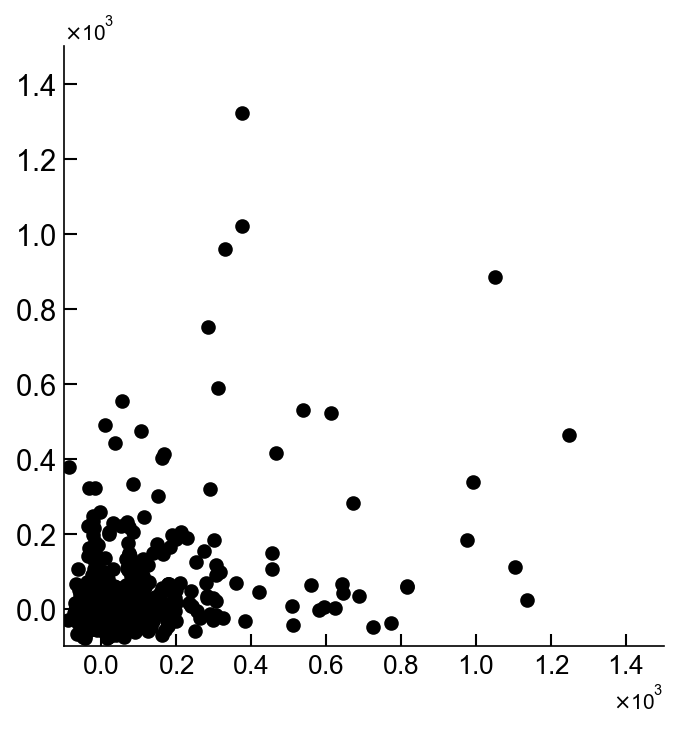

In [483]:
def add_axis_size(fig, ax_w, ax_h, left, bottom):
    fig_w, fig_h = fig.get_size_inches()
    ax = fig.add_axes([left/fig_w, bottom/fig_h, ax_w/fig_w, ax_h/fig_h])
    return ax

def make_axis_size(ax_w, ax_h, left=.3, bottom=.3, right=0, top=0):
    fig_w = (ax_w + left + right) * 1.05
    fig_h = (ax_h + bottom + top) * 1.05
    fig = plt.figure(figsize=(fig_w, fig_h))
    ax = add_axis_size(fig, ax_w, ax_h, left, bottom)
    return fig, ax

fig,ax = make_axis_size(4, 4, left=.3, bottom=.3, right=0, top=0)
switch_offset = 0.5

################################################################################################################

size = 20
summary_size=150
summary_width=1.25#0.75

mask_CR = np.greater_equal(FRmod_off,3.5)
mask_NCR = np.less(FRmod_off,3.5)

ax.scatter(FRmod_delta_pc_target,FRmod_delta_pc_nontarget,c='k')

################################################################################################################
# labels = ['CR','NCR','CR','NCR']
labels = ['Target','Nontarget']

ax.set_xlim([-100,1500])
ax.set_ylim([-100,1500])
# ylab = ax.set_ylabel(r'$\Delta$ firing rate modulation, laser ON (%)')

# ax.set_xlim([-0.75-switch_offset,3.75+switch_offset])
# # ax.set_xticks([0-switch_offset,1-switch_offset,2+switch_offset,3+switch_offset])
# ax.set_xticks([0.5-switch_offset,2.5+switch_offset])
# ax.set_xticklabels(labels)

# xtick_pos_pre = 0.5-switch_offset
# xtick_pos_post = 2.5+switch_offset
# Yval = ilep.getPrePostLabelYval(ax.get_ylim(),Yfrac=-2*stdyfrac,log=False)
# t1 = ax.text(xtick_pos_pre, Yval, 'Target', ha='center', va='bottom', fontsize=stdfont,color='k')
# t2 = ax.text(xtick_pos_post, Yval, 'Nontarget', ha='center', va='bottom',  fontsize=stdfont,color='k')
# ax.annotate('', xy=(0.05, -stdyfrac), xycoords='axes fraction', xytext=(0.43, -stdyfrac),arrowprops=dict(arrowstyle='-', color='black'))
# ax.annotate('', xy=(0.55, -stdyfrac), xycoords='axes fraction', xytext=(0.93, -stdyfrac),arrowprops=dict(arrowstyle='-', color='black'))

ax.tick_params(direction='in', length=6, width=1)

for item in ([ax.title, ax.xaxis.label, ax.yaxis.label] +
    ax.get_xticklabels() + ax.get_yticklabels()):
    item.set_fontsize(stdfont)
for item in (ax.get_xticklabels()):
    item.set_fontsize(stdfont*0.9)
    pass

# Y = np.mean(ax.get_ylim())
# Y = 10**np.mean(np.log10(ax.get_ylim()))
# t = ax.text(2.5,Y,'Reversal',rotation=90,fontsize=stdfont,color=SWITCH_COLOR,horizontalalignment='center',verticalalignment='center')
# ax.plot([2.5]*2,[ax.get_ylim()[0],Y*0.45],lw=1,color=SWITCH_COLOR)
# ax.plot([2.5]*2,[ax.get_ylim()[1],Y/0.45],lw=1,color=SWITCH_COLOR)

ax.fill_between(ax.get_xlim(),[ax.get_ylim()[0]]*2,[ax.get_ylim()[1]*2]*2,color='white',alpha=0.4,zorder=-5,clip_on=False)

ttl = ax.set_title(' ')
artists = [ylab]
fig.savefig(os.path.join('D:\\\\Figures','Manuscript Figures','Opto preferential recruitment with control V'+str(current_version)+'.pdf'),transparent=False,facecolor="white",dpi=400, bbox_extra_artists=(artists), bbox_inches='tight')

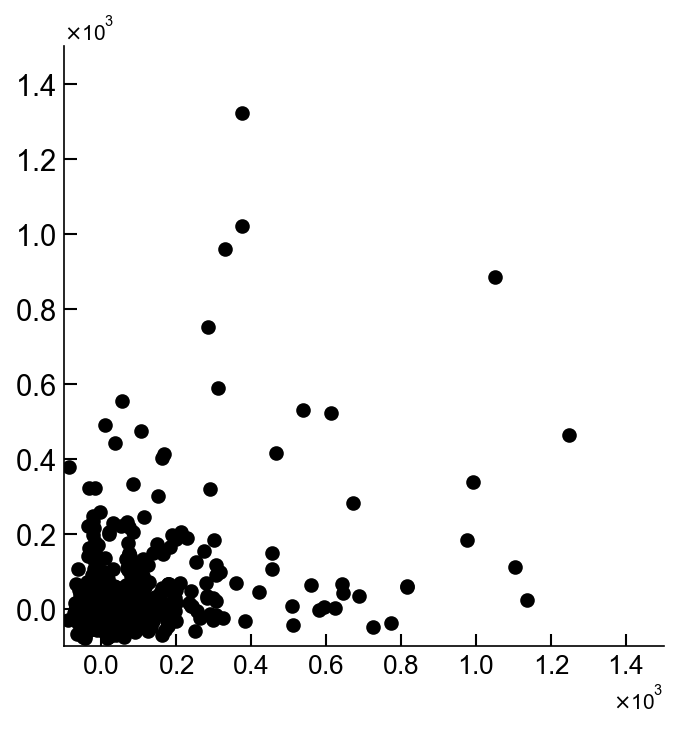

In [483]:
def add_axis_size(fig, ax_w, ax_h, left, bottom):
    fig_w, fig_h = fig.get_size_inches()
    ax = fig.add_axes([left/fig_w, bottom/fig_h, ax_w/fig_w, ax_h/fig_h])
    return ax

def make_axis_size(ax_w, ax_h, left=.3, bottom=.3, right=0, top=0):
    fig_w = (ax_w + left + right) * 1.05
    fig_h = (ax_h + bottom + top) * 1.05
    fig = plt.figure(figsize=(fig_w, fig_h))
    ax = add_axis_size(fig, ax_w, ax_h, left, bottom)
    return fig, ax

fig,ax = make_axis_size(4, 4, left=.3, bottom=.3, right=0, top=0)
switch_offset = 0.5

################################################################################################################

size = 20
summary_size=150
summary_width=1.25#0.75

mask_CR = np.greater_equal(FRmod_off,3.5)
mask_NCR = np.less(FRmod_off,3.5)

ax.scatter(FRmod_delta_pc_target,FRmod_delta_pc_nontarget,c='k')

################################################################################################################
# labels = ['CR','NCR','CR','NCR']
labels = ['Target','Nontarget']

ax.set_xlim([-100,1500])
ax.set_ylim([-100,1500])
# ylab = ax.set_ylabel(r'$\Delta$ firing rate modulation, laser ON (%)')

# ax.set_xlim([-0.75-switch_offset,3.75+switch_offset])
# # ax.set_xticks([0-switch_offset,1-switch_offset,2+switch_offset,3+switch_offset])
# ax.set_xticks([0.5-switch_offset,2.5+switch_offset])
# ax.set_xticklabels(labels)

# xtick_pos_pre = 0.5-switch_offset
# xtick_pos_post = 2.5+switch_offset
# Yval = ilep.getPrePostLabelYval(ax.get_ylim(),Yfrac=-2*stdyfrac,log=False)
# t1 = ax.text(xtick_pos_pre, Yval, 'Target', ha='center', va='bottom', fontsize=stdfont,color='k')
# t2 = ax.text(xtick_pos_post, Yval, 'Nontarget', ha='center', va='bottom',  fontsize=stdfont,color='k')
# ax.annotate('', xy=(0.05, -stdyfrac), xycoords='axes fraction', xytext=(0.43, -stdyfrac),arrowprops=dict(arrowstyle='-', color='black'))
# ax.annotate('', xy=(0.55, -stdyfrac), xycoords='axes fraction', xytext=(0.93, -stdyfrac),arrowprops=dict(arrowstyle='-', color='black'))

ax.tick_params(direction='in', length=6, width=1)

for item in ([ax.title, ax.xaxis.label, ax.yaxis.label] +
    ax.get_xticklabels() + ax.get_yticklabels()):
    item.set_fontsize(stdfont)
for item in (ax.get_xticklabels()):
    item.set_fontsize(stdfont*0.9)
    pass

# Y = np.mean(ax.get_ylim())
# Y = 10**np.mean(np.log10(ax.get_ylim()))
# t = ax.text(2.5,Y,'Reversal',rotation=90,fontsize=stdfont,color=SWITCH_COLOR,horizontalalignment='center',verticalalignment='center')
# ax.plot([2.5]*2,[ax.get_ylim()[0],Y*0.45],lw=1,color=SWITCH_COLOR)
# ax.plot([2.5]*2,[ax.get_ylim()[1],Y/0.45],lw=1,color=SWITCH_COLOR)

ax.fill_between(ax.get_xlim(),[ax.get_ylim()[0]]*2,[ax.get_ylim()[1]*2]*2,color='white',alpha=0.4,zorder=-5,clip_on=False)

ttl = ax.set_title(' ')
artists = [ylab]
fig.savefig(os.path.join('D:\\\\Figures','Manuscript Figures','Opto preferential recruitment with control V'+str(current_version)+'.pdf'),transparent=False,facecolor="white",dpi=400, bbox_extra_artists=(artists), bbox_inches='tight')

In [134]:
wilcoxon(FRmod_delta_pc_target[mask_CR],FRmod_delta_pc_nontarget[mask_CR])

WilcoxonResult(statistic=5358.0, pvalue=0.002090372293296202)

In [137]:
wilcoxon(FRmod_delta_pc_target[mask_NCR],FRmod_delta_pc_nontarget[mask_NCR])

WilcoxonResult(statistic=34172.0, pvalue=0.012956725287694273)

In [138]:
wilcoxon(FRmod_delta_pc_target,FRmod_delta_pc_nontarget)

WilcoxonResult(statistic=67000.0, pvalue=0.0002597140785169459)

In [28]:
mannwhitneyu(FRmod_delta_pc_target[mask_NCR],FRmod_delta_pc_target[mask_CR])

MannwhitneyuResult(statistic=45608.0, pvalue=0.004817090954173162)

In [29]:
mannwhitneyu(FRmod_delta_pc_nontarget[mask_NCR],FRmod_delta_pc_nontarget[mask_CR])

MannwhitneyuResult(statistic=50408.0, pvalue=1.3194517925717429e-07)

In [487]:
print(np.mean(FRmod_delta_pc_target))
print(np.median(FRmod_delta_pc_target))

77.39605653434398
16.298828938586986


In [488]:
print(np.mean(FRmod_delta_pc_nontarget))
print(np.median(FRmod_delta_pc_nontarget))

41.938127618053116
8.840520471421714


In [26]:
np.sum(mask_CR)

317

In [27]:
np.sum(mask_NCR)

253

In [430]:
mask_CR = np.greater_equal(FRmod_off_target,3.5)
mask_NCR = np.less(FRmod_off_target,3.5)

In [427]:
mask_CR = np.greater_equal(FRmod_off_nontarget,3.5)
mask_NCR = np.less(FRmod_off_nontarget,3.5)

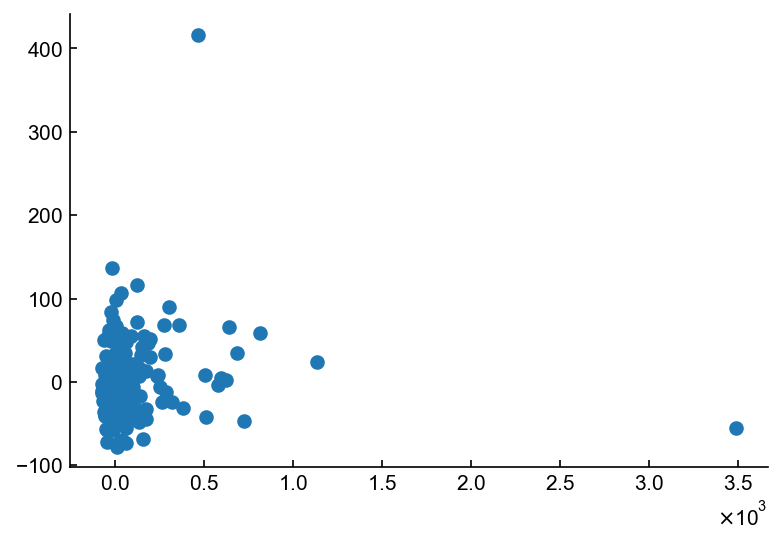

In [426]:
plt.scatter(FRmod_delta_pc_target[mask_CR],FRmod_delta_pc_nontarget[mask_CR])

# Preferential Recruitment - Control

In [62]:
FRmod_control_delta_abs = []
FRmod_control_delta_pc = []
FRmod_control_delta_pc_baseline = []
FRmod_control_on = []
FRmod_control_off = []

for idx,(session,clust) in tqdm(enumerate(zip(EnumSessionControl,EnumClustControl))):
    sessionfile = ilep.loadSessionCached([ops_directory,act_directory],session)
    
    if sessionfile.meta.animal not in opsin_control_animals:
        continue
#     if sessionfile.meta.animal in ['AE_301']:
#         continue
    
#     if sessionfile.meta.day_of_training >= animalBehaviors[sessionfile.meta.animal].cloudiness:
#         continue
        
    if not sessionfile.meta.task == 'opto control reversal':
        continue

    on = sessionfile.responsiveness[clust]['laser_on'].FRmodulation
    off = sessionfile.responsiveness[clust]['laser_off'].FRmodulation
    offbaseline = sessionfile.responsiveness[clust]['laser_off'].FRbaseline

    try:
        FRmod_control_on.append(on)
        FRmod_control_off.append(off)
        FRmod_control_delta_abs.append( (on-off) )
        FRmod_control_delta_pc.append( (on-off)/off*100 )
        FRmod_control_delta_pc_baseline.append( (on-off)/offbaseline*100 )
    except Exception as e:
        print(session + ': '+ str(e))
        
FRmod_control_off = np.array(FRmod_control_off)
FRmod_control_delta_pc = np.array(FRmod_control_delta_pc)

288it [00:10, 27.31it/s]


[Text(0, -100, '-100'),
 Text(0, 0, '0'),
 Text(0, 100, '100'),
 Text(0, 200, '200'),
 Text(0, 300, '300')]

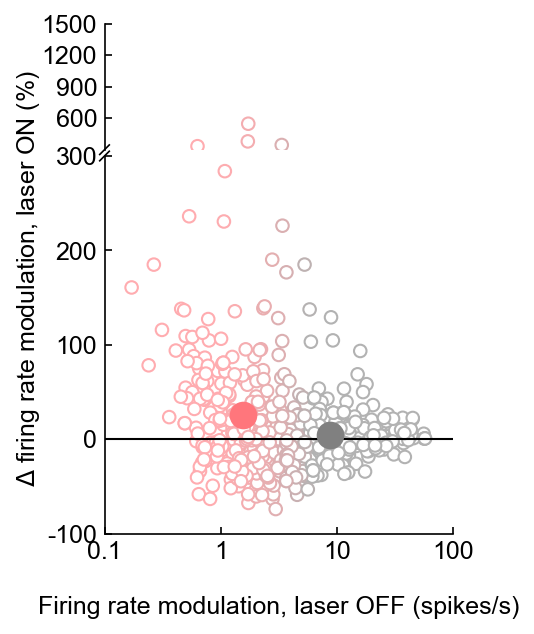

In [47]:
X = 3.25
Y = 4
X = X + 0.3
Y = Y + 0.3

fig = plt.figure(figsize=(3,4.5))
# fig = plt.figure(figsize=(X,Y))
bax = brokenaxes(ylims=( (-100,300), (300, 1500) ), height_ratios=[1,3], hspace=0.025)

CR_NCR_median = 3.5
colors = NCR_CR_cmap((np.array(FRmod_control_off)-1)/5)
bax.axs[0].scatter(FRmod_control_off[np.greater_equal(FRmod_control_delta_pc,300)],FRmod_control_delta_pc[np.greater_equal(FRmod_control_delta_pc,300)],fc='white',ec=colors[np.greater_equal(FRmod_control_delta_pc,300)],zorder=-10)
bax.axs[1].scatter(FRmod_control_off[np.less(FRmod_control_delta_pc,300)],FRmod_control_delta_pc[np.less(FRmod_control_delta_pc,300)],fc='white',ec=colors[np.less(FRmod_control_delta_pc,300)],zorder=-10)

mask_CR = np.greater_equal(FRmod_control_off,3.5)
mask_NCR = np.less(FRmod_control_off,3.5)
median_FRmod_off_CR = np.median(FRmod_control_off[mask_CR])
median_FRmod_off_NCR = np.median(FRmod_control_off[mask_NCR])
median_FRmod_delta_pc_CR = np.median(FRmod_control_delta_pc[mask_CR])
median_FRmod_delta_pc_NCR = np.median(FRmod_control_delta_pc[mask_NCR])
sem_FRmod_delta_pc_CR = sem(FRmod_control_delta_pc[mask_CR])
sem_FRmod_delta_pc_NCR = sem(FRmod_control_delta_pc[mask_NCR])

# Q1, median, Q3 = (np.percentile(FRmod_delta_pc[mask_CR], q) for q in [25, 50, 75])
median_value = np.mean(FRmod_control_delta_pc[mask_CR])
Q1 = median_value - sem(FRmod_control_delta_pc[mask_CR])
Q3 = median_value + sem(FRmod_control_delta_pc[mask_CR])
bax.scatter([median_FRmod_off_CR],[median_value],s=150,color=CR_COLOR,zorder=20,clip_on=False)
bax.plot([median_FRmod_off_CR]*2,[Q1,Q3],zorder=21,color=CR_COLOR,clip_on=False)

# Q1, median, Q3 = (np.percentile(FRmod_delta_pc[mask_NCR], q) for q in [25, 50, 75])
median_value = np.mean(FRmod_control_delta_pc[mask_NCR])
Q1 = median_value - sem(FRmod_control_delta_pc[mask_NCR])
Q3 = median_value + sem(FRmod_control_delta_pc[mask_NCR])
bax.scatter([median_FRmod_off_NCR],[median_value],s=150,color=NCR_COLOR,zorder=20,clip_on=False)
bax.plot([median_FRmod_off_NCR]*2,[Q1,Q3],zorder=21,color=NCR_COLOR,clip_on=False)

xlims = [0,105]#ax.get_xlim()
xlims = [0.1,100]#ax.get_xlim()
bax.set_xlim(xlims)
bax.set_xscale('log',subs=[])
bax.set_xlabel('Firing rate modulation, laser OFF (spikes/s)',fontsize=12)
bax.set_ylabel(r'$\Delta$ firing rate modulation, laser ON (%)',fontsize=12)

#ylims = [-200,1600]#ax.get_ylim()
#ax.set_yticks([-200,0,200,400,600,800,1000,1200,1400,1600])
#ax.set_yticklabels(['-200','0','200','400','600','800','1000','1200','1400','1600'])

bax.axs[1].set_xticks([0.1,1,10,100])
bax.axs[1].set_xticklabels(['0.1','1','10','100'],fontsize=12)

bax.axhline(0,linestyle='-',color='k',zorder=10,lw=1)
#bax.axvline(CR_NCR_median,linestyle='-',color='k',zorder=10,lw=1)

bax.axs[0].fill_between(bax.axs[0].get_xlim(),[300,300],[1500,1500],fc='white',lw=0,alpha=0.4,zorder=-5)
bax.axs[1].fill_between(bax.axs[1].get_xlim(),bax.axs[1].get_ylim()[0]*2,bax.axs[1].get_ylim()[1]*2,fc='white',lw=0,alpha=0.4,zorder=-5)

# ax.text(CR_NCR_median,ylims[1],' CR',ha='left',va='top',color=CR_COLOR,weight='bold')
# ax.text(CR_NCR_median,ylims[1],'NCR ',ha='right',va='top',color=NCR_COLOR,weight='bold')

bax.axs[0].set_yticks([600,900,1200,1500])
bax.axs[0].set_yticklabels([str(d) for d in [600,900,1200,1500]],fontsize=12)
bax.axs[1].set_yticks([-100,0,100,200,300])
bax.axs[1].set_yticklabels([str(d) for d in [-100,0,100,200,300]],fontsize=12)

# fig.savefig(os.path.join('D:\\\\Figures','Manuscript Figures','Opsin preferential recruitment V'+str(current_version)+'.pdf'),transparent=False,facecolor="white")

In [51]:
mannwhitneyu(FRmod_control_delta_pc[mask_CR],FRmod_control_delta_pc[mask_NCR]).pvalue

0.005618899205403217

In [52]:
np.sum(mask_CR)

273

In [53]:
np.sum(mask_NCR)

267

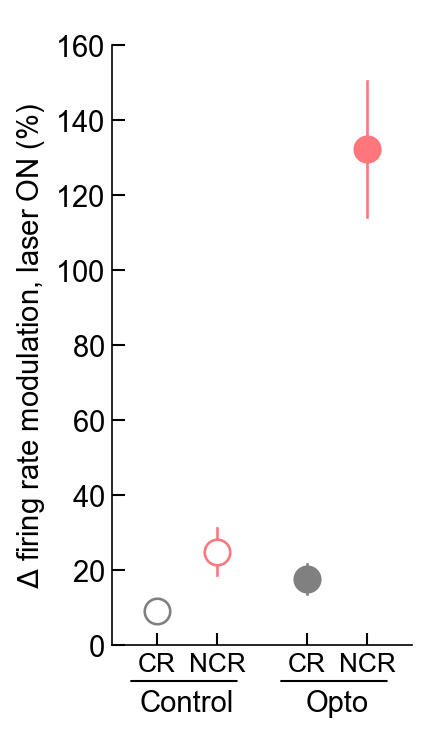

In [64]:
def add_axis_size(fig, ax_w, ax_h, left, bottom):
    fig_w, fig_h = fig.get_size_inches()
    ax = fig.add_axes([left/fig_w, bottom/fig_h, ax_w/fig_w, ax_h/fig_h])
    return ax

def make_axis_size(ax_w, ax_h, left=.3, bottom=.3, right=0, top=0):
    fig_w = (ax_w + left + right) * 1.05
    fig_h = (ax_h + bottom + top) * 1.05
    fig = plt.figure(figsize=(fig_w, fig_h))
    ax = add_axis_size(fig, ax_w, ax_h, left, bottom)
    return fig, ax

fig,ax = make_axis_size(2, 4, left=.3, bottom=.3, right=0, top=0)
switch_offset = 0.25

################################################################################################################

size = 20
summary_size=150
summary_width=1.25#0.75

mask_CR = np.greater_equal(FRmod_control_off,3.5)
mask_NCR = np.less(FRmod_control_off,3.5)
median_value = np.mean(FRmod_control_delta_pc[mask_CR])
Q1 = median_value - sem(FRmod_control_delta_pc[mask_CR])
Q3 = median_value + sem(FRmod_control_delta_pc[mask_CR])
# Q1, median_value, Q3 = (np.percentile(FRmod_control_delta_pc[mask_CR], q) for q in [25, 50, 75])
ax.scatter([0-switch_offset],[median_value],s=summary_size,fc='white',ec=CR_COLOR,zorder=21,clip_on=False,lw=summary_width)
ax.plot([0-switch_offset]*2,[Q1,Q3],zorder=20,color=CR_COLOR,clip_on=False,lw=summary_width)

median_value = np.mean(FRmod_control_delta_pc[mask_NCR])
Q1 = median_value - sem(FRmod_control_delta_pc[mask_NCR])
Q3 = median_value + sem(FRmod_control_delta_pc[mask_NCR])
# Q1, median_value, Q3 = (np.percentile(FRmod_control_delta_pc[mask_NCR], q) for q in [25, 50, 75])
ax.scatter([1-switch_offset],[median_value],s=summary_size,fc='white',ec=NCR_COLOR,zorder=21,clip_on=False,lw=summary_width)
ax.plot([1-switch_offset]*2,[Q1,Q3],zorder=20,color=NCR_COLOR,clip_on=False,lw=summary_width)


mask_CR = np.greater_equal(FRmod_off,1.8)
mask_NCR = np.less(FRmod_off,1.8)
median_value = np.mean(FRmod_delta_pc[mask_CR])
Q1 = median_value - sem(FRmod_delta_pc[mask_CR])
Q3 = median_value + sem(FRmod_delta_pc[mask_CR])
# Q1, median_value, Q3 = (np.percentile(FRmod_delta_pc[mask_CR], q) for q in [25, 50, 75])
ax.scatter([2+switch_offset],[median_value],s=summary_size,color=CR_COLOR,zorder=21,clip_on=False,lw=summary_width)
ax.plot([2+switch_offset]*2,[Q1,Q3],zorder=20,color=CR_COLOR,clip_on=False,lw=summary_width)

median_value = np.mean(FRmod_delta_pc[mask_NCR])
Q1 = median_value - sem(FRmod_delta_pc[mask_NCR])
Q3 = median_value + sem(FRmod_delta_pc[mask_NCR])
# Q1, median_value, Q3 = (np.percentile(FRmod_delta_pc[mask_NCR], q) for q in [25, 50, 75])
ax.scatter([3+switch_offset],[median_value],s=summary_size,color=NCR_COLOR,zorder=21,clip_on=False,lw=summary_width)
ax.plot([3+switch_offset]*2,[Q1,Q3],zorder=20,color=NCR_COLOR,clip_on=False,lw=summary_width)

################################################################################################################
labels = ['CR','NCR','CR','NCR']

ax.set_ylim([0,160])
ylab = ax.set_ylabel(r'$\Delta$ firing rate modulation, laser ON (%)')

ax.set_xlim([-0.75-switch_offset,3.75+switch_offset])
ax.set_xticks([0-switch_offset,1-switch_offset,2+switch_offset,3+switch_offset])
ax.set_xticklabels(labels)

xtick_pos_pre = 0.5-switch_offset
xtick_pos_post = 2.5+switch_offset
Yval = ilep.getPrePostLabelYval(ax.get_ylim(),Yfrac=-2*stdyfrac,log=False)
t1 = ax.text(xtick_pos_pre, Yval, 'Control', ha='center', va='bottom', fontsize=stdfont,color='k')
t2 = ax.text(xtick_pos_post, Yval, 'Opto', ha='center', va='bottom',  fontsize=stdfont,color='k')
ax.annotate('', xy=(0.05, -stdyfrac), xycoords='axes fraction', xytext=(0.43, -stdyfrac),arrowprops=dict(arrowstyle='-', color='black'))
ax.annotate('', xy=(0.55, -stdyfrac), xycoords='axes fraction', xytext=(0.93, -stdyfrac),arrowprops=dict(arrowstyle='-', color='black'))

ax.tick_params(direction='in', length=6, width=1)

for item in ([ax.title, ax.xaxis.label, ax.yaxis.label] +
    ax.get_xticklabels() + ax.get_yticklabels()):
    item.set_fontsize(stdfont)
for item in (ax.get_xticklabels()):
    item.set_fontsize(stdfont*0.9)
    pass

# Y = np.mean(ax.get_ylim())
# Y = 10**np.mean(np.log10(ax.get_ylim()))
# t = ax.text(2.5,Y,'Reversal',rotation=90,fontsize=stdfont,color=SWITCH_COLOR,horizontalalignment='center',verticalalignment='center')
# ax.plot([2.5]*2,[ax.get_ylim()[0],Y*0.45],lw=1,color=SWITCH_COLOR)
# ax.plot([2.5]*2,[ax.get_ylim()[1],Y/0.45],lw=1,color=SWITCH_COLOR)

ax.fill_between(ax.get_xlim(),[ax.get_ylim()[0]]*2,[ax.get_ylim()[1]*2]*2,color='white',alpha=0.4,zorder=-5,clip_on=False)

ttl = ax.set_title(' ')
artists = [ylab,t1,t2,ttl]
fig.savefig(os.path.join('D:\\\\Figures','Manuscript Figures','Opto preferential recruitment with control V'+str(current_version)+'.pdf'),transparent=False,facecolor="white",dpi=400, bbox_extra_artists=(artists), bbox_inches='tight')

In [65]:
mask_CR = np.greater_equal(FRmod_control_off,3.5)
mask_NCR = np.less(FRmod_control_off,3.5)
pval = mannwhitneyu(FRmod_control_delta_pc[mask_CR],FRmod_control_delta_pc[mask_NCR]).pvalue
print(np.sum(mask_CR))
print(np.sum(mask_NCR))
print(pval)

135
153
0.28186231798068095


In [66]:
mask_CR = np.greater_equal(FRmod_off,1.8)
mask_NCR = np.less(FRmod_off,1.8)
print(np.sum(mask_CR))
print(np.sum(mask_NCR))
mannwhitneyu(FRmod_delta_pc[mask_CR],FRmod_delta_pc[mask_NCR]).pvalue

295
227


2.9704083962369005e-14

# Opsin CR and NCR % Modulation

In [64]:
FRmod_control_delta_abs = []
FRmod_control_delta_pc = []
FRmod_control_delta_pc_baseline = []
FRmod_control_on = []
FRmod_control_off = []

FRmod_control_delta_pc_CR = []
FRmod_control_delta_pc_NCR = []

for idx,(session,clust) in tqdm(enumerate(zip(EnumSessionControl,EnumClustControl))):
    sessionfile = ilep.loadSessionCached([ops_directory,act_directory],session)
    
    if sessionfile.meta.animal not in opsin_control_animals:
        continue
    if not sessionfile.meta.task == 'opto control reversal':
        continue

    FRmod = sessionfile.responsiveness[clust]['all_trials'].FRmodulation
    on = sessionfile.responsiveness[clust]['laser_on'].FRmodulation
    off = sessionfile.responsiveness[clust]['laser_off'].FRmodulation
    offbaseline = sessionfile.responsiveness[clust]['laser_off'].FRbaseline
    
    try:
        FRmod_control_on.append(on)
        FRmod_control_off.append(off)
        FRmod_control_delta_abs.append( (on-off) )
        FRmod_control_delta_pc.append( (on-off)/off*100 )
        FRmod_control_delta_pc_baseline.append( (on-off)/offbaseline*100 )
        
        if FRmod >= 3.5:
            FRmod_control_delta_pc_CR.append( (on-off)/off*100 )
        if FRmod < 3.5:
            FRmod_control_delta_pc_NCR.append( (on-off)/off*100 )
        
    except Exception as e:
        print(session + ': '+ str(e))
        
FRmod_control_off = np.array(FRmod_control_off)
FRmod_control_delta_pc = np.array(FRmod_control_delta_pc)

288it [00:09, 30.78it/s]


In [68]:
print(normaltest(FRmod_control_delta_pc_CR))
print(normaltest(FRmod_control_delta_pc_NCR))

NormaltestResult(statistic=177.4352694047501, pvalue=2.9540701296300246e-39)
NormaltestResult(statistic=81.30126117686454, pvalue=2.216437296672855e-18)


In [70]:
CR_ps = []
NCR_ps = []

for idx,(session,clust) in tqdm(enumerate(zip(EnumSessionOps,EnumClustOps))):
    sessionfile = ilep.loadSessionCached(ops_directory,session)
    
    if sessionfile.meta.animal not in did_not_learn_animals:
        continue
    if sessionfile.meta.day_of_training >= animalBehaviors[sessionfile.meta.animal].cloudiness:
        continue
    if not sessionfile.meta.task == 'opto reversal':
        continue
        
    FRmod = sessionfile.responsiveness[clust]['all_trials'].FRmodulation
    on = sessionfile.responsiveness[clust]['laser_on'].FRmodulation
    off = sessionfile.responsiveness[clust]['laser_off'].FRmodulation
    offbaseline = sessionfile.responsiveness[clust]['laser_off'].FRbaseline
    delta_pc = (on-off)/off*100
    
    if FRmod >= 3.5:
        p = mannwhitneyu(FRmod_control_delta_pc_CR,[delta_pc]).pvalue
        CR_ps.append(p)
    elif FRmod < 3.5:
        p = mannwhitneyu(FRmod_control_delta_pc_NCR,[delta_pc]).pvalue
        NCR_ps.append(p)
    
#     all_conditions = ilep.getAllConditions(sessionfile,clust)
#     FR_on = []
#     FR_off = []
#     for trial in all_conditions['laser_on'].trials:
#         trialstart = sessionfile.trials.starts[trial]
#         trialend = trialstart + sessionfile.meta.fs*0.1
#         spikes = ilep.getSpikeTimes(sessionfile,clust=clust,starttime=trialstart,endtime=trialend)
#         FR_on.append(len(spikes))
#     for trial in all_conditions['laser_off'].trials:
#         trialstart = sessionfile.trials.starts[trial]
#         trialend = trialstart + sessionfile.meta.fs*0.1
#         spikes = ilep.getSpikeTimes(sessionfile,clust=clust,starttime=trialstart,endtime=trialend)
#         FR_off.append(len(spikes))
    
#     p = ttest_ind(FR_on,FR_off).pvalue
#     if sessionfile.responsiveness[clust]['laser_off'].FRmodulation >= 3.5:
#         CR_ps.append(p)
#     elif sessionfile.responsiveness[clust]['laser_off'].FRmodulation < 3.5:
#         NCR_ps.append(p)

850it [00:21, 39.82it/s] 


In [44]:
CR_ps

[0.930122552156435,
 0.955183069149363,
 0.8854701127422016,
 5.3779419003710615e-05,
 0.08611915878585283,
 0.7918895762527541,
 0.33513439452014737,
 0.6252706503268546,
 0.15705826946067983,
 0.02203000754946195,
 0.7626789092468507,
 0.8474776643574153,
 0.2794439893346668,
 0.5741305902067929,
 0.008105380612505913,
 0.6106562411905061,
 0.09611614711570667,
 0.693205748334616,
 0.5278440828971727,
 0.002353592406251901,
 0.1604229428317238,
 5.757814543411178e-05,
 0.8505407585507323,
 0.3540271836920713,
 0.16931787824319403,
 0.8335673787883852,
 0.9754866284642838,
 0.3680332214850178,
 0.1653574996212193,
 0.020128529115235484,
 0.09077554164308071,
 0.4479168637175538,
 0.48110658687338004,
 0.32899615213026245,
 0.5005484012068668,
 0.533378482253162,
 0.05097891550570816,
 0.019911255140810113,
 0.12555047690933197,
 0.0024738388582399564,
 0.3905914632809493,
 0.01938051057804602,
 0.41123606028538884,
 0.1792609672354105,
 0.06719629090006571,
 0.00038861436311999476,
 0

In [45]:
NCR_ps

[0.9136759483517329,
 0.9547173369393112,
 0.7018220212244348,
 0.21126747252102734,
 0.5987490479896065,
 0.5378222544237368,
 0.02980486923555127,
 0.1971605376223875,
 0.008809589297576274,
 0.7974364848256271,
 0.9401235493125633,
 0.1732325854840788,
 0.661974188622398,
 0.5536424955081982,
 0.13054283658707755,
 0.4569578484641871,
 0.38061555506015277,
 0.13894224669867,
 0.30497129218741315,
 0.753962869192512,
 0.10267295802337602,
 0.980709733516387,
 0.4146785518919305,
 0.88464720306364,
 0.7082210676505308,
 0.15736928764542307,
 0.37771022791276365,
 0.0005620451416509509,
 0.9448304579894127,
 0.8137714208868896,
 1.1582398992162915e-14,
 0.7259959501885644,
 0.8373122561465793,
 0.7382693968296941,
 1.416473304948287e-06,
 0.00041446399061958783,
 0.37381310514747146,
 0.32260068976587963,
 0.4493147926644423,
 nan,
 0.41293148757741505,
 0.0005448163013118756,
 0.7505577399920936,
 0.5298593385681423,
 0.004378919615077708,
 0.06223923549629087,
 0.021194674780550333,


In [46]:
np.mean(np.less(CR_ps,00.05))

0.24203821656050956

In [47]:
np.mean(np.less(NCR_ps,00.05))

0.1917808219178082

In [71]:
np.mean(np.less(CR_ps,00.05))

0.1511627906976744

In [72]:
np.mean(np.less(NCR_ps,00.05))

0.15714285714285714

In [41]:
### How many days of expert -- recorded
expert_days_per_animal = dict()
for animal in ephys_animals:
    expert_days_per_animal[animal] = 0
    
for session in tqdm(os.listdir(act_directory)):
    sessionfile = ilep.loadSessionCached(act_directory,session)
    if sessionfile.meta.animal not in ephys_animals:
        continue
    
    if sessionfile.meta.day_of_training in learning_phases[sessionfile.meta.animal].post_expert_days and sessionfile.meta.region == 'AC':
        expert_days_per_animal[sessionfile.meta.animal] += 1

100%|██████████| 720/720 [00:08<00:00, 85.52it/s] 


In [42]:
expert_days_per_animal

{'BS_40': 2,
 'BS_41': 2,
 'BS_42': 4,
 'BS_49': 1,
 'BS_50': 0,
 'BS_51': 1,
 'BS_56': 4,
 'BS_59': 0,
 'BS_67': 2,
 'BS_70': 1,
 'BS_72': 0,
 'BS_87': 3,
 'BS_108': 0,
 'DS_15': 6,
 'DS_19': 6}

In [41]:
### What is n per day of AE_267
n_per_day = dict()
    
for session in tqdm(os.listdir(act_directory)):
    sessionfile = ilep.loadSessionCached(act_directory,session)
    if sessionfile.meta.animal not in ephys_animals:
        continue
    
    if sessionfile.meta.day_of_training in learning_phases[sessionfile.meta.animal].post_expert_days and sessionfile.meta.region == 'AC':
        expert_days_per_animal[sessionfile.meta.animal] += 1

100%|██████████| 720/720 [00:08<00:00, 85.52it/s] 


In [17]:
FRmod_on = dict()
FRmod_off = dict()
for i in range(30):
    FRmod_on[i] = []
    FRmod_off[i] = []

for animal in tqdm(animals):
    days = np.array(range(len(animalBehaviors[animal].sessions)))+1
    days_mask_rev = np.greater(days,animalBehaviors[animal].reversal)
    days_mask_cloud = np.less(days,animalBehaviors[animal].cloudiness)
    days_mask = np.logical_and(days_mask_rev,days_mask_cloud)
    days = days[days_mask]
    
    first_day_of_laser = np.Inf
    for day in animalBehaviors[animal].sessions:
        if hasattr(animalBehaviors[animal].sessions[day],'laser') and np.sum(animalBehaviors[animal].sessions[day].laser)>0:
            first_day_of_laser = min(first_day_of_laser,day)
            
    print(f"{animal}: {days}. First day of laser is {first_day_of_laser}")
    
    for day in days:
        for session in os.listdir(ops_directory):
            sessionfile = ilep.loadSessionCached(ops_directory,session)
            if sessionfile.meta.animal != animal:
                continue
            if sessionfile.meta.day_of_training != day:
                continue
            
            for clust in sessionfile.clusters.good:
                FRmodon = sessionfile.responsiveness[clust]['laser_on'].FRmodulation
                FRmodoff = sessionfile.responsiveness[clust]['laser_off'].FRmodulation
                FRmod_on[day-animalBehaviors[animal].reversal].append(FRmodon)
                FRmod_off[day-animalBehaviors[animal].reversal].append(FRmodoff)
    
print('Finished')

  0%|          | 0/8 [00:00<?, ?it/s]

BS_86: [15 16 17 18 19]. First day of laser is 14


 12%|█▎        | 1/8 [00:04<00:30,  4.42s/it]

BS_100: [12 13 14]. First day of laser is 11


 25%|██▌       | 2/8 [00:07<00:20,  3.36s/it]

BS_119: [11 12 13 14 15 16 17 18 19 20 21 22]. First day of laser is 10


 38%|███▊      | 3/8 [00:17<00:33,  6.61s/it]

BS_123: [10 11 12 13 14 15 16 17 18 19]. First day of laser is 9


 50%|█████     | 4/8 [00:26<00:29,  7.43s/it]

BS_128: [ 7  8  9 10 11 12 13]. First day of laser is 4


 62%|██████▎   | 5/8 [00:32<00:20,  6.96s/it]

BS_131: [15 16 17 18 19 20 21 22 23 24 25]. First day of laser is 14


 75%|███████▌  | 6/8 [00:41<00:15,  7.85s/it]

BS_163: [14 15 16 17 18]. First day of laser is 3


 88%|████████▊ | 7/8 [00:46<00:06,  6.71s/it]

BS_174: [15 16 17 18 19 20 21 22 23]. First day of laser is 14


100%|██████████| 8/8 [00:54<00:00,  6.76s/it]

Finished


In [44]:
FRmod_all = dict()
for i in range(30):
    FRmod_all[i] = []
    

for animal in ['AE_267']:
    days = np.array(range(len(animalBehaviors[animal].sessions)))+1
    days_mask_rev = np.greater(days,animalBehaviors[animal].reversal)
    #days_mask_cloud = np.less(days,animalBehaviors[animal].cloudiness)
    days_mask = days_mask_rev#np.logical_and(days_mask_rev,days_mask_cloud)
    days = days[days_mask]
    
    first_day_of_laser = np.Inf
    for day in animalBehaviors[animal].sessions:
        if hasattr(animalBehaviors[animal].sessions[day],'laser') and np.sum(animalBehaviors[animal].sessions[day].laser)>0:
            first_day_of_laser = min(first_day_of_laser,day)
    
    for day in days:
        for session in os.listdir(ops_directory):
            sessionfile = ilep.loadSessionCached(ops_directory,session)
            if sessionfile.meta.animal != animal:
                continue
            if sessionfile.meta.day_of_training != day:
                continue
            
            for clust in sessionfile.clusters.good:
                FRmod = sessionfile.responsiveness[clust]['all_trials'].FRmodulation
                FRmod_all[day-animalBehaviors[animal].reversal].append(FRmod)
    
print('Finished')

Finished


<ipython-input-46-b0cfab018816>:19: UserWarning: Attempted to set non-positive bottom ylim on a log-scaled axis.
Invalid limit will be ignored.
  ax.set_ylim([0,100])


Text(0.5, 0, 'Day after reversal')

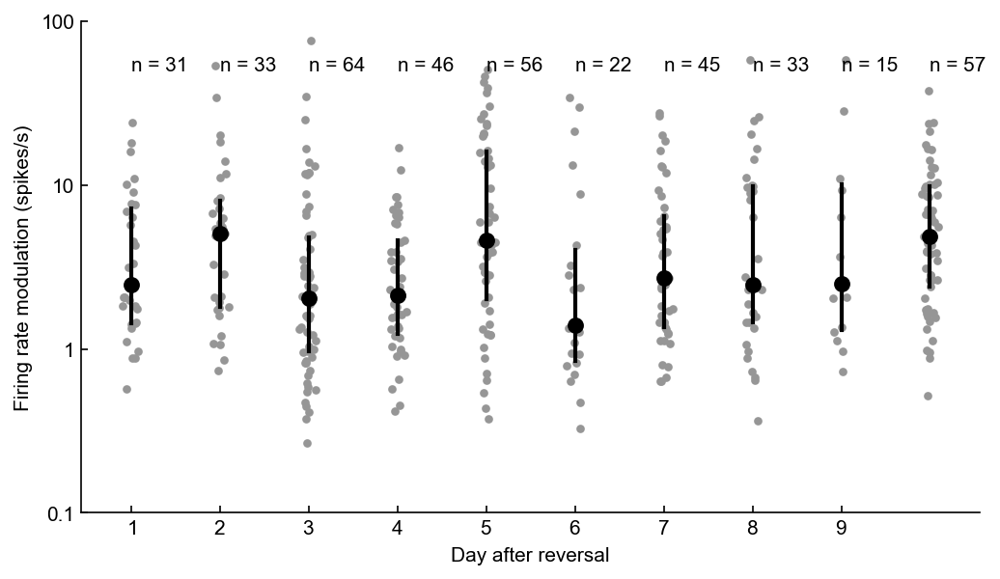

In [46]:
fig, ax = plt.subplots(figsize=(8,4.5))

for x in range(30):
    if len(FRmod_all[x]) <= 0:
        continue
        
    FRmod_data_all = FRmod_all[x]
    FRmod_data_all = ilep.rmnan(FRmod_data_all)
    
    X,Y = ilep.violin(FRmod_data_all,width=0.2,minjitter=0.05,log=True)
    ax.scatter(X+x,Y,color=GOOD_GREY,s=10)
    ax.scatter([x],[np.median(Y)],s=50,c='k')
    Q1,Q3 = np.percentile(Y,(25,75))
    ax.plot([x]*2,[Q1,Q3],lw=2,c='k')
    
    ax.text(x,50,f"n = {len(FRmod_data_all)}\ndepth = {sess}")
        
ax.set_yscale('log',subs=[])
ax.set_ylim([0,100])
ax.set_yticks([0.1,1,10,100])
ax.set_yticklabels(str(s) for s in [0.1,1,10,100])
ax.set_ylabel('Firing rate modulation (spikes/s)')

ax.set_xticks([1,2,3,4,5,6,7,8,9])
ax.set_xlabel('Day after reversal')

#fig.savefig(os.path.join('D:\\\\Figures','Manuscript Figures','Opsin FRmod after reversal V'+str(current_version)+'.pdf'),transparent=False,facecolor="white")

<ipython-input-45-cf12abfcea02>:24: UserWarning: Attempted to set non-positive bottom ylim on a log-scaled axis.
Invalid limit will be ignored.
  ax.set_ylim([0,100])


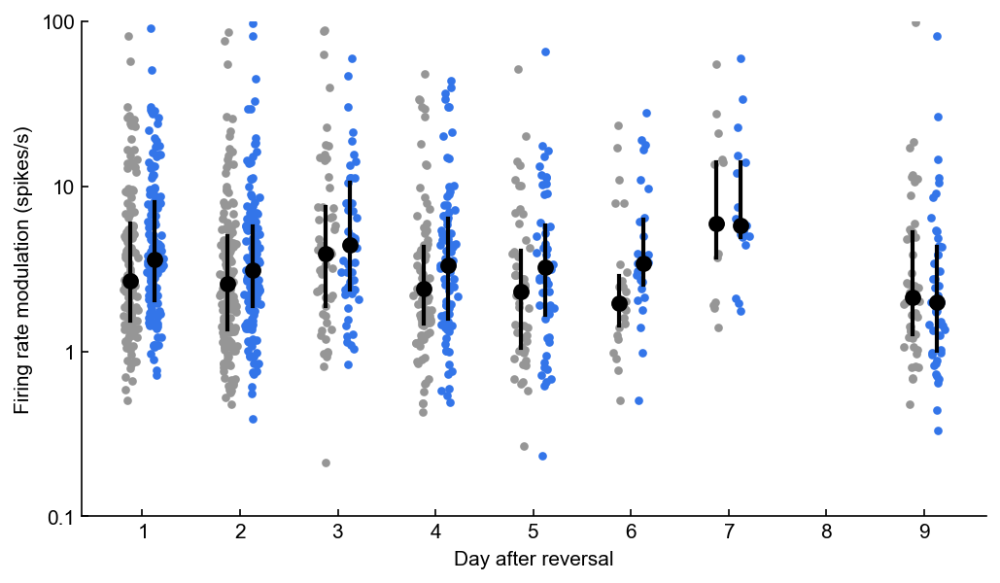

In [45]:
fig, ax = plt.subplots(figsize=(8,4.5))

for x in range(30):
    if len(FRmod_on[x]) <= 0:
        continue
        
    FRmod_data_on = FRmod_on[x]
    FRmod_data_off = FRmod_off[x]
    FRmod_data_on,FRmod_data_off = ilep.paired_rmnan(FRmod_data_on,FRmod_data_off)
    
    X,Y = ilep.violin(FRmod_data_off,width=0.2,minjitter=0.05,log=True)
    ax.scatter(X+x-0.125,Y,color=GOOD_GREY,s=10)
    ax.scatter([x-0.125],[np.median(Y)],s=50,c='k')
    Q1,Q3 = np.percentile(Y,(25,75))
    ax.plot([x-0.125]*2,[Q1,Q3],lw=2,c='k')
    
    X,Y = ilep.violin(FRmod_data_on,width=0.2,minjitter=0.05,log=True)
    ax.scatter(X+x+0.125,Y,color=LASER_COLOR,s=10)
    ax.scatter([x+0.125],[np.median(Y)],s=50,c='k')
    Q1,Q3 = np.percentile(Y,(25,75))
    ax.plot([x+0.125]*2,[Q1,Q3],lw=2,c='k')
    
ax.set_yscale('log',subs=[])
ax.set_ylim([0,100])
ax.set_yticks([0.1,1,10,100])
ax.set_yticklabels(str(s) for s in [0.1,1,10,100])
ax.set_ylabel('Firing rate modulation (spikes/s)')

ax.set_xticks([1,2,3,4,5,6,7,8,9])
ax.set_xlabel('Day after reversal')

fig.savefig(os.path.join('D:\\\\Figures','Manuscript Figures','Opsin FRmod after reversal V'+str(current_version)+'.pdf'),transparent=False,facecolor="white")

In [44]:
### Create dataframe ###
days_with_data = []
for x in range(30):
    if len(FRmod_on[x]) <= 0:
        continue
    days_with_data.append(x)
    
print(days_with_data)
    

days = None
context = None
perf = None

for day in days_with_data:
    this_day = len(FRmod_on[day])*[str(day)] + len(FRmod_off[day])*[str(day)]
    if days is None:
        days = this_day
    else:
        days = np.concatenate((days,this_day))
    
    this_context = len(FRmod_on[day])*['ON'] + len(FRmod_off[day])*['OFF']
    if context is None:
        context = this_context
    else:
        context = np.concatenate((context,this_context))
    
    this_perf = np.concatenate((FRmod_on[day],FRmod_off[day]))
    if perf is None:
        perf = this_perf
    else:
        perf = np.concatenate((perf,this_perf))

df = pd.DataFrame({"days": days, "context": context, "perf": perf})

### Anova ###
anova = pg.anova(data=df, dv='perf', between=['days','context'], detailed=True)
print(anova)
print()

### Create and print results ###
pairwise_mwu = pg.pairwise_tests(data=df, dv='perf', between=['days','context'], padjust="fdr_bh", parametric=False, )
print(pairwise_mwu[pairwise_mwu["Contrast"] == "days * context"][["days","A", "B", "p-unc", "p-corr", "hedges"]])
#pairwise_mwu

[1, 2, 3, 4, 5, 6, 7, 9]
           Source             SS      DF          MS         F     p-unc  \
0            days    3676.061555     7.0  525.151651  3.804158  0.000431   
1         context     232.196505     1.0  232.196505  1.682014  0.194923   
2  days * context      94.683320     7.0   13.526189  0.097983  0.998432   
3        Residual  155164.547176  1124.0  138.046750       NaN       NaN   

        np2  
0  0.023143  
1  0.001494  
2  0.000610  
3       NaN  

   days    A   B     p-unc    p-corr    hedges
29    1  OFF  ON  0.028092  0.112367 -0.090078
30    2  OFF  ON  0.057411  0.153096 -0.059767
31    3  OFF  ON  0.452101  0.602801 -0.069015
32    4  OFF  ON  0.093637  0.187275 -0.124678
33    5  OFF  ON  0.146220  0.233951 -0.150544
34    6  OFF  ON  0.008994  0.071949 -0.357343
35    7  OFF  ON  0.782895  0.782895 -0.072655
36    9  OFF  ON  0.580101  0.662972  0.045504


In [47]:
FRmod_on = dict()
FRmod_off = dict()
for i in range(30):
    FRmod_on[i] = []
    FRmod_off[i] = []

for animal in tqdm(animals):
    days = np.array(range(len(animalBehaviors[animal].sessions)))+1
    days_mask_rev = np.greater(days,animalBehaviors[animal].reversal)
    days_mask_cloud = np.less(days,animalBehaviors[animal].cloudiness)
    days_mask = np.logical_and(days_mask_rev,days_mask_cloud)
    days = days[days_mask]
    
    first_day_of_laser = np.Inf
    for day in animalBehaviors[animal].sessions:
        if hasattr(animalBehaviors[animal].sessions[day],'laser') and np.sum(animalBehaviors[animal].sessions[day].laser)>0:
            first_day_of_laser = min(first_day_of_laser,day)
            
    print(f"{animal}: {days}. First day of laser is {first_day_of_laser}")
    
    for day in days:
        for session in os.listdir(ops_directory):
            sessionfile = ilep.loadSessionCached(ops_directory,session)
            if sessionfile.meta.animal != animal:
                continue
            if sessionfile.meta.day_of_training != day:
                continue
            
            for clust in sessionfile.clusters.good:
                FRmodon = sessionfile.responsiveness[clust]['laser_on'].FRmodulation
                FRmodoff = sessionfile.responsiveness[clust]['laser_off'].FRmodulation
                FRmod_on[day-first_day_of_laser].append(FRmodon)
                FRmod_off[day-first_day_of_laser].append(FRmodoff)
    
print('Finished')

  0%|          | 0/8 [00:00<?, ?it/s]

BS_86: [15 16 17 18 19]. First day of laser is 14


 12%|█▎        | 1/8 [00:04<00:32,  4.63s/it]

BS_100: [12 13 14]. First day of laser is 11


 25%|██▌       | 2/8 [00:07<00:20,  3.41s/it]

BS_119: [11 12 13 14 15 16 17 18 19 20 21 22]. First day of laser is 10


 38%|███▊      | 3/8 [00:17<00:32,  6.48s/it]

BS_123: [10 11 12 13 14 15 16 17 18 19]. First day of laser is 9


 50%|█████     | 4/8 [00:25<00:28,  7.18s/it]

BS_128: [ 7  8  9 10 11 12 13]. First day of laser is 4


 62%|██████▎   | 5/8 [00:31<00:20,  6.69s/it]

BS_131: [15 16 17 18 19 20 21 22 23 24 25]. First day of laser is 14


 75%|███████▌  | 6/8 [00:40<00:15,  7.54s/it]

BS_163: [14 15 16 17 18]. First day of laser is 3


 88%|████████▊ | 7/8 [00:44<00:06,  6.44s/it]

BS_174: [15 16 17 18 19 20 21 22 23]. First day of laser is 14


100%|██████████| 8/8 [00:52<00:00,  6.54s/it]

Finished


<ipython-input-49-af5524dc82f6>:24: UserWarning: Attempted to set non-positive bottom ylim on a log-scaled axis.
Invalid limit will be ignored.
  ax.set_ylim([0,100])


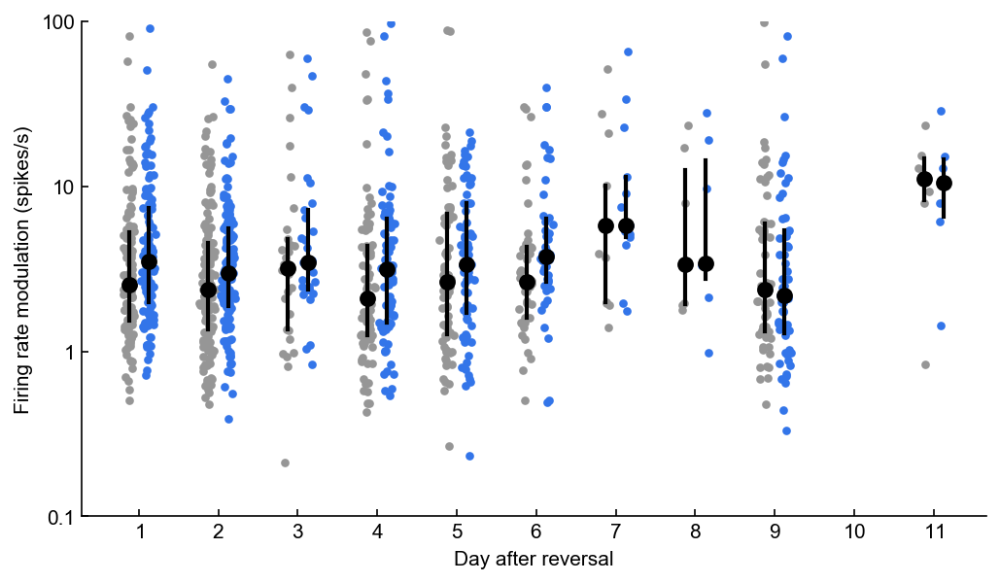

In [49]:
fig, ax = plt.subplots(figsize=(8,4.5))

for x in range(30):
    if len(FRmod_on[x]) <= 0:
        continue
        
    FRmod_data_on = FRmod_on[x]
    FRmod_data_off = FRmod_off[x]
    FRmod_data_on,FRmod_data_off = ilep.paired_rmnan(FRmod_data_on,FRmod_data_off)
    
    X,Y = ilep.violin(FRmod_data_off,width=0.2,minjitter=0.05,log=True)
    ax.scatter(X+x-0.125,Y,color=GOOD_GREY,s=10)
    ax.scatter([x-0.125],[np.median(Y)],s=50,c='k')
    Q1,Q3 = np.percentile(Y,(25,75))
    ax.plot([x-0.125]*2,[Q1,Q3],lw=2,c='k')
    
    X,Y = ilep.violin(FRmod_data_on,width=0.2,minjitter=0.05,log=True)
    ax.scatter(X+x+0.125,Y,color=LASER_COLOR,s=10)
    ax.scatter([x+0.125],[np.median(Y)],s=50,c='k')
    Q1,Q3 = np.percentile(Y,(25,75))
    ax.plot([x+0.125]*2,[Q1,Q3],lw=2,c='k')
    
ax.set_yscale('log',subs=[])
ax.set_ylim([0,100])
ax.set_yticks([0.1,1,10,100])
ax.set_yticklabels(str(s) for s in [0.1,1,10,100])
ax.set_ylabel('Firing rate modulation (spikes/s)')

ax.set_xticks([1,2,3,4,5,6,7,8,9,10,11])
ax.set_xlabel('Day after reversal')

fig.savefig(os.path.join('D:\\\\Figures','Manuscript Figures','Opsin FRmod after laser V'+str(current_version)+'.pdf'),transparent=False,facecolor="white")

In [50]:
### Create dataframe ###
days_with_data = []
for x in range(30):
    if len(FRmod_on[x]) <= 0:
        continue
    days_with_data.append(x)
    
print(days_with_data)
    

days = None
context = None
perf = None

for day in days_with_data:
    this_day = len(FRmod_on[day])*[str(day)] + len(FRmod_off[day])*[str(day)]
    if days is None:
        days = this_day
    else:
        days = np.concatenate((days,this_day))
    
    this_context = len(FRmod_on[day])*['ON'] + len(FRmod_off[day])*['OFF']
    if context is None:
        context = this_context
    else:
        context = np.concatenate((context,this_context))
    
    this_perf = np.concatenate((FRmod_on[day],FRmod_off[day]))
    if perf is None:
        perf = this_perf
    else:
        perf = np.concatenate((perf,this_perf))

df = pd.DataFrame({"days": days, "context": context, "perf": perf})

### Anova ###
anova = pg.anova(data=df, dv='perf', between=['days','context'], detailed=True)
print(anova)
print()

### Create and print results ###
pairwise_mwu = pg.pairwise_tests(data=df, dv='perf', between=['days','context'], padjust="fdr_bh", parametric=False, )
print(pairwise_mwu[pairwise_mwu["Contrast"] == "days * context"][["days","A", "B", "p-unc", "p-corr", "hedges"]])
#pairwise_mwu

[1, 2, 3, 4, 5, 6, 7, 8, 9, 11]
           Source             SS      DF          MS         F     p-unc  \
0            days    2516.192304     9.0  279.576923  2.003300  0.035854   
1         context     232.196505     1.0  232.196505  1.663797  0.197358   
2  days * context     113.929064     9.0   12.658785  0.090706  0.999754   
3        Residual  156305.170682  1120.0  139.558188       NaN       NaN   

        np2  
0  0.015843  
1  0.001483  
2  0.000728  
3       NaN  

   days    A   B     p-unc    p-corr    hedges
46    1  OFF  ON  0.021392  0.168746 -0.091826
47   11  OFF  ON  1.000000  1.000000 -0.044551
48    2  OFF  ON  0.050624  0.168746 -0.081869
49    3  OFF  ON  0.367070  0.611783 -0.097132
50    4  OFF  ON  0.080888  0.202221 -0.082244
51    5  OFF  ON  0.265250  0.530500 -0.070594
52    6  OFF  ON  0.034367  0.168746 -0.228362
53    7  OFF  ON  0.472789  0.675413 -0.168319
54    8  OFF  ON  0.710373  0.789303 -0.126683
55    9  OFF  ON  0.636731  0.789303  0.032388

# Lasting Modulation -- Tone Period

In [53]:
sessionfile.clusters.good

array([ 10,  13,  15,  30,  41,  51,  57,  70,  80,  99, 101, 112, 142,
       143], dtype=int64)

In [54]:
clust = 30

In [85]:
clusters = []
context = []
FR = []

for idx,(session,clust) in tqdm(enumerate(zip(EnumSession,EnumClust))):
    sessionfile = ilep.loadSessionCached(ops_directory,session)

    ##########################################################################################
    allConditions = ilep.getAllConditions(sessionfile,clust)
    offTrialsOffHist = []
    offTrialsOnHist = []
    for trial in allConditions['laser_off'].trials:
        if trial-1 in allConditions['laser_off'].trials:
            offTrialsOffHist.append(trial)
        elif trial-1 in allConditions['laser_on'].trials:
            offTrialsOnHist.append(trial)

    FROffHist = []
    FROnHist = []

    for trial in offTrialsOffHist:
        starttime = sessionfile.trials.starts[trial]
        endtime = sessionfile.trials.starts[trial] + 0.100*sessionfile.meta.fs
        trialSpikes = len(ilep.getSpikeTimes(sessionfile,clust=clust,starttime=starttime,endtime=endtime))
        trialFR = trialSpikes / (endtime/sessionfile.meta.fs-starttime/sessionfile.meta.fs)
        FROffHist.append(trialFR)

    for trial in offTrialsOnHist:
        starttime = sessionfile.trials.starts[trial]
        endtime = sessionfile.trials.starts[trial] + 0.100*sessionfile.meta.fs
        trialSpikes = len(ilep.getSpikeTimes(sessionfile,clust=clust,starttime=starttime,endtime=endtime))
        trialFR = trialSpikes / (endtime/sessionfile.meta.fs-starttime/sessionfile.meta.fs)
        FROnHist.append(trialFR)
    
    if len(FROnHist) == 0 or len(FROffHist) == 0:
        continue
        
    clusters.append([f"{session} c{clust}"]*len(FROffHist))
    clusters.append([f"{session} c{clust}"]*len(FROnHist))
    context.append(['OFF']*len(FROffHist))
    context.append(['ON']*len(FROnHist))
    FR.append(FROffHist)
    FR.append(FROnHist)

999it [03:37,  4.59it/s]


In [86]:
clusters = np.concatenate(clusters)
context = np.concatenate(context)
FR = np.concatenate(FR)

In [88]:
df = pd.DataFrame({"clusters": clusters,"context": context, "FR": FR})

### Anova ###
anova = pg.anova(data=df, dv='FR', between=['clusters','context'], detailed=True)
print(anova)
print()

### Create and print results ###
pairwise_mwu = pg.pairwise_tests(data=df, dv='FR', between=['clusters','context'], padjust="fdr_bh", parametric=False, )
ONOFFres = pairwise_mwu[pairwise_mwu["Contrast"] == "clusters * context"][["clusters","A", "B", "p-unc", "p-corr", "hedges"]]
#pairwise_mwu

               Source            SS        DF            MS           F  \
0            clusters  1.484180e+07     994.0  14931.390044  130.496619   
1             context  2.690802e+02       1.0    269.080157    2.351693   
2  clusters * context  1.340072e+05     994.0    134.816086    1.178259   
3            Residual  2.075517e+07  181395.0    114.419746         NaN   

      p-unc       np2  
0  0.000000  0.416940  
1  0.125149  0.000013  
2  0.000084  0.006415  
3       NaN       NaN  



C:\Users\insan\anaconda3\envs\EphysPlotting\lib\site-packages\pingouin\effsize.py:803: RuntimeWarning: invalid value encountered in double_scalars
  d = (x.mean() - y.mean()) / poolsd
C:\Users\insan\anaconda3\envs\EphysPlotting\lib\site-packages\pingouin\effsize.py:803: RuntimeWarning: invalid value encountered in double_scalars
  d = (x.mean() - y.mean()) / poolsd


                            clusters    A   B     p-unc    p-corr    hedges
494516   BS_100_1_opto_AC.pickle c36  OFF  ON  0.032730  0.626274 -0.265127
494517   BS_100_1_opto_AC.pickle c47  OFF  ON  0.050967  0.683233 -0.384743
494518   BS_100_1_opto_AC.pickle c54  OFF  ON  0.595377  0.957032 -0.237854
494519   BS_119_1_opto_AC.pickle c11  OFF  ON  0.602669  0.961475  0.011955
494520  BS_119_1_opto_AC.pickle c110  OFF  ON  0.085500  0.803216  0.251231
...                              ...  ...  ..       ...       ...       ...
495506    BS_86_9_opto_AC.pickle c78  OFF  ON  0.853498  0.993821  0.031469
495507    BS_86_9_opto_AC.pickle c91  OFF  ON  0.721503  0.977690  0.114212
495508    BS_86_9_opto_AC.pickle c97  OFF  ON  0.261337  0.893425  0.258784
495509    BS_86_9_opto_AC.pickle c98  OFF  ON  0.136788  0.846935 -0.220251
495510    BS_86_9_opto_AC.pickle c99  OFF  ON  0.661291  0.969686  0.057726

[995 rows x 6 columns]


In [98]:
ONOFFres = pairwise_mwu[pairwise_mwu["Contrast"] == "clusters * context"][["clusters","A", "B", "p-unc", "p-corr", "hedges"]]

In [104]:
sig_mask = np.less(ONOFFres['p-corr'].values,0.05)

In [105]:
ONOFFres['clusters'][sig_mask]

495071    BS_174_1_opto_AC.pickle c131
495089    BS_174_1_opto_AC.pickle c249
495097    BS_174_1_opto_AC.pickle c276
Name: clusters, dtype: object

# Lasting Modulation -- Offset Period

In [106]:
clusters = []
context = []
FR = []

for idx,(session,clust) in tqdm(enumerate(zip(EnumSession,EnumClust))):
    sessionfile = ilep.loadSessionCached(ops_directory,session)

    ##########################################################################################
    allConditions = ilep.getAllConditions(sessionfile,clust)
    offTrialsOffHist = []
    offTrialsOnHist = []
    for trial in allConditions['laser_off'].trials:
        if trial-1 in allConditions['laser_off'].trials:
            offTrialsOffHist.append(trial)
        elif trial-1 in allConditions['laser_on'].trials:
            offTrialsOnHist.append(trial)

    FROffHist = []
    FROnHist = []

    for trial in offTrialsOffHist:
        starttime = sessionfile.trials.starts[trial] + 0.100*sessionfile.meta.fs
        endtime = sessionfile.trials.starts[trial] + 0.200*sessionfile.meta.fs
        trialSpikes = len(ilep.getSpikeTimes(sessionfile,clust=clust,starttime=starttime,endtime=endtime))
        trialFR = trialSpikes / (endtime/sessionfile.meta.fs-starttime/sessionfile.meta.fs)
        FROffHist.append(trialFR)

    for trial in offTrialsOnHist:
        starttime = sessionfile.trials.starts[trial] + 0.100*sessionfile.meta.fs
        endtime = sessionfile.trials.starts[trial] + 0.200*sessionfile.meta.fs
        trialSpikes = len(ilep.getSpikeTimes(sessionfile,clust=clust,starttime=starttime,endtime=endtime))
        trialFR = trialSpikes / (endtime/sessionfile.meta.fs-starttime/sessionfile.meta.fs)
        FROnHist.append(trialFR)
    
    if len(FROnHist) == 0 or len(FROffHist) == 0:
        continue
        
    clusters.append([f"{session} c{clust}"]*len(FROffHist))
    clusters.append([f"{session} c{clust}"]*len(FROnHist))
    context.append(['OFF']*len(FROffHist))
    context.append(['ON']*len(FROnHist))
    FR.append(FROffHist)
    FR.append(FROnHist)

999it [03:38,  4.57it/s]


In [107]:
clusters = np.concatenate(clusters)
context = np.concatenate(context)
FR = np.concatenate(FR)

In [108]:
df2 = pd.DataFrame({"clusters": clusters,"context": context, "FR": FR})

### Anova ###
anova = pg.anova(data=df2, dv='FR', between=['clusters','context'], detailed=True)
print(anova)
print()

### Create and print results ###
pairwise_mwu2 = pg.pairwise_tests(data=df2, dv='FR', between=['clusters','context'], padjust="fdr_bh", parametric=False, )
ONOFFres2 = pairwise_mwu2[pairwise_mwu2["Contrast"] == "clusters * context"][["clusters","A", "B", "p-unc", "p-corr", "hedges"]]
#pairwise_mwu

               Source            SS        DF           MS          F  \
0            clusters  7.871273e+06     994.0  7918.785393  80.317822   
1             context  1.582236e+03       1.0  1582.236129  16.048138   
2  clusters * context  1.440663e+05     994.0   144.935897   1.470041   
3            Residual  1.788430e+07  181395.0    98.593129        NaN   

          p-unc       np2  
0  0.000000e+00  0.305614  
1  6.177692e-05  0.000088  
2  2.593786e-20  0.007991  
3           NaN       NaN  



C:\Users\insan\anaconda3\envs\EphysPlotting\lib\site-packages\pingouin\effsize.py:803: RuntimeWarning: invalid value encountered in double_scalars
  d = (x.mean() - y.mean()) / poolsd
C:\Users\insan\anaconda3\envs\EphysPlotting\lib\site-packages\pingouin\effsize.py:803: RuntimeWarning: invalid value encountered in double_scalars
  d = (x.mean() - y.mean()) / poolsd


In [109]:
sig_mask = np.less(ONOFFres2['p-corr'].values,0.05)

In [110]:
ONOFFres2['clusters'][sig_mask]

495071    BS_174_1_opto_AC.pickle c131
495089    BS_174_1_opto_AC.pickle c249
495097    BS_174_1_opto_AC.pickle c276
Name: clusters, dtype: object

In [54]:
def visualizeCluster(sessionfile,clust):

    starttime = -250
    endtime = 1500
    bw_scott_factor = 3

    buffer = 500
    bufferedstart = starttime - buffer
    bufferedend = endtime + buffer
    startbuffer = (0-bufferedstart)/1000
    endbuffer = (bufferedend-2500)/1000 #NOTE THAT THIS IS CURRENTLY A HARDCODED VALUE!!!

    #########################################################################################

    region = sessionfile.meta.region

    #########################################################################################

    fig = plt.figure(figsize=(4,6))
    gs = fig.add_gridspec(2,1,height_ratios=[2,1],hspace=0.0125)#,wspace=0.5)#0.1)
    ax1 = plt.subplot(gs[0,0])#Raster
    ax2 = plt.subplot(gs[1,0],sharex=ax1)#PSTH
    ax1.spines['bottom'].set_visible(False)
    ax1.spines['left'].set_visible(False)
    ax1.get_xaxis().set_visible(False)
    ax1.get_yaxis().set_visible(False)

    FRmod = sessionfile.responsiveness[clust]['all_trials'].FRmodulation
    FRmod_color = NCR_CR_cmap( (FRmod-1)/5)

    trialsToPlot = sessionfile.trim[clust].trimmed_trials
    clustSpikes = ilep.getSpikeTimes(sessionfile,clust=clust)
    trialSpikes = []
    for trial in trialsToPlot:
        this_trial_spikes = ilep.getTrialSpikes(sessionfile,trial,cachedtimes=clustSpikes,outunits='ms',startbuffer=startbuffer,endbuffer=endbuffer)
        trialSpikes.append(this_trial_spikes)
    trialSpikes = np.array(trialSpikes,dtype='object')

    #Plot Raster
    for idx,trial in enumerate(trialsToPlot):
        ax1.scatter(trialSpikes[idx],np.ones_like(trialSpikes[idx])*idx,color=FRmod_color,s=1.5,marker='o',lw=0)

    if sessionfile.meta.task == 'switch':
        try:
            switch_point = np.where(np.greater(trialsToPlot,200))[0][0]-0.5
            ax1.axhline(switch_point,linestyle='--',lw=1,zorder=-10,color='k')
        except:
            pass

    #Plot PSTH
    PSTHstart = starttime - 0.1
    PSTHend = endtime + 0.1
    xrange = np.linspace(starttime,endtime,num=1000)
    FR = np.full((10,len(xrange)),np.nan)
    kf = KFold(n_splits=10)
    for idx,(train_index,_) in enumerate(kf.split(trialSpikes)):
        PSTHspikes = np.concatenate(trialSpikes[train_index])
        bw = len(PSTHspikes)**(-1./5) / bw_scott_factor
        KDE = gaussian_kde(PSTHspikes,bw_method=bw)
        FR[idx,:] = KDE.evaluate(xrange)
        FR[idx,:] = FR[idx,:] * len(PSTHspikes) / len(train_index) * 1000 #1000 is conversion to s/s because units are all in ms for this plot
    avg_FR = np.mean(FR,axis=0)
    sem_FR = np.std(FR,axis=0)

    ax2.plot(xrange,avg_FR,lw=1,color=FRmod_color)
    ax2.fill_between(xrange,avg_FR-sem_FR,avg_FR+sem_FR,color=FRmod_color,alpha=0.5,zorder=-10,lw=0)

    max_FR_value = np.max(avg_FR+sem_FR) * 1.1
    sequence_of_possible_axis_limits = np.array([1,2,4,6,8,10,12,16,20,30,40,50,60,80,100,120,140,150,160,180,200])
    idx_of_okay_limits = np.greater_equal(sequence_of_possible_axis_limits,max_FR_value)
    valid_limits = sequence_of_possible_axis_limits[idx_of_okay_limits]
    limit = np.min(valid_limits)
    ax2.set_ylim([0,limit])
    ax2.set_yticks([0,limit/2,limit])
    ax2.set_yticklabels(['0',str(int(limit/2)),str(limit)])
    ax2.set_ylabel('Firing rate (spikes/s)')

    ax2.plot([0,100],[limit,limit],color='k',lw=3,linestyle='-',zorder=10)

    ax2.set_xlim([starttime,endtime])
    ax2.set_xticks([0,500,1000,1500])
    ax2.set_xticklabels(['0','0.5','1','1.5'])
    ax2.set_xlabel('Time (s)')
    
    return fig

# Opsin Control PSTH Plotting

<ipython-input-54-860d99ca297a>:19: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig = plt.figure(figsize=(4,6))


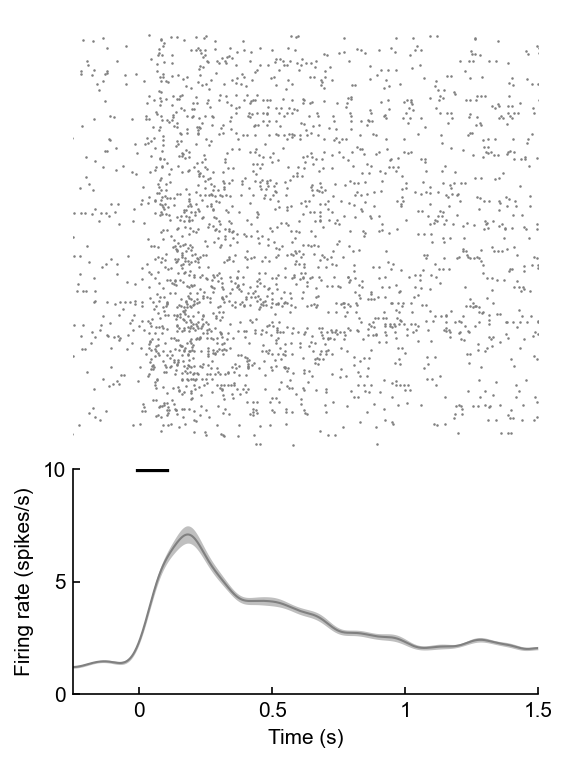

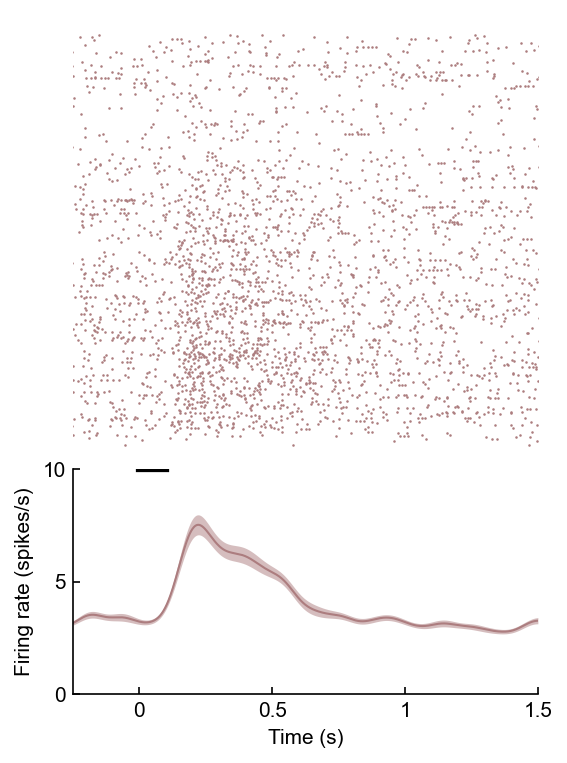

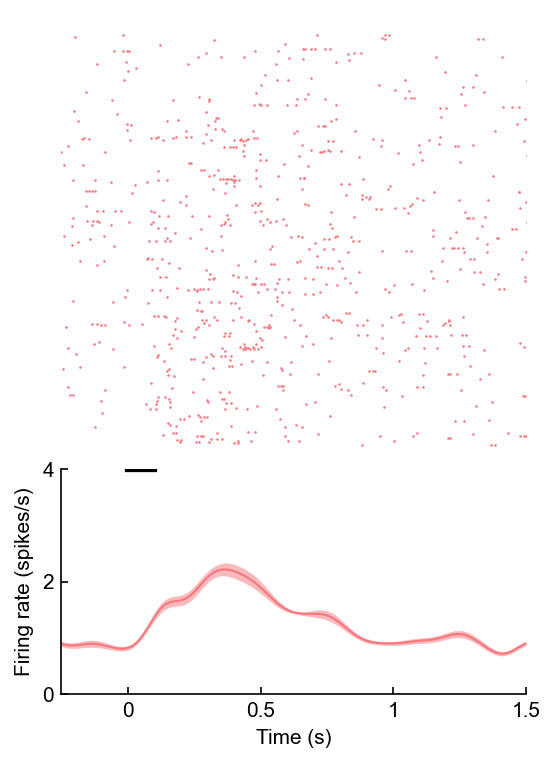

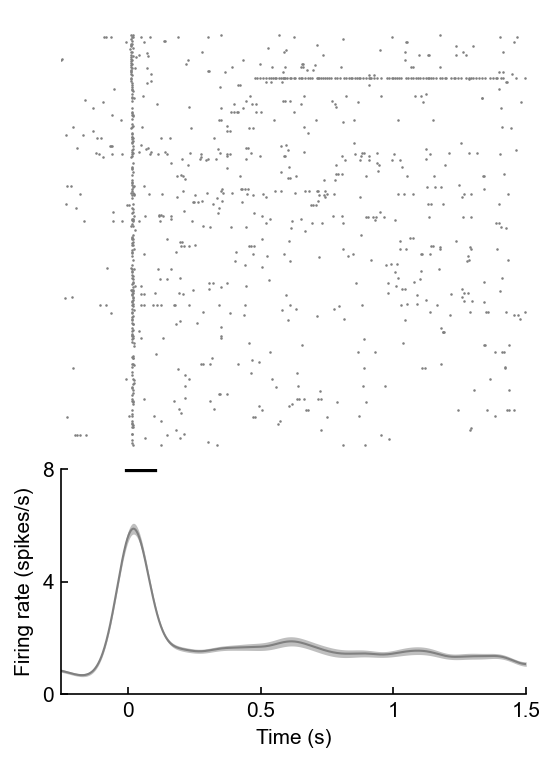

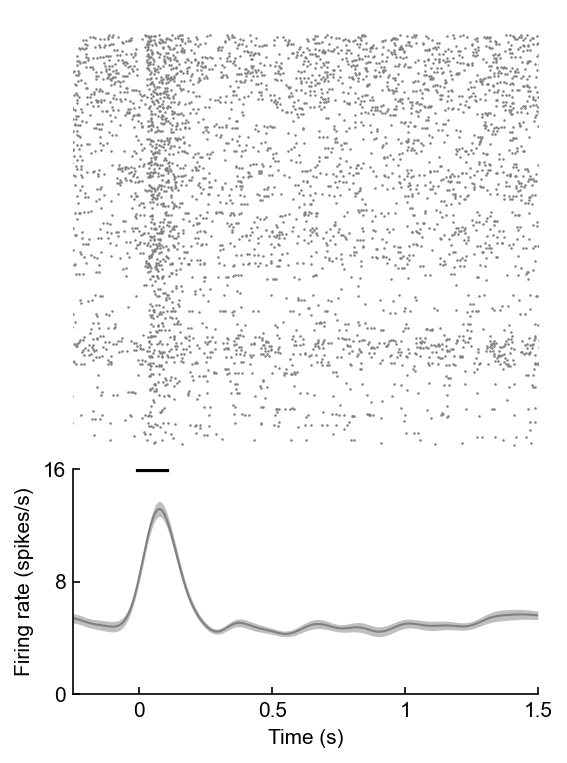

...

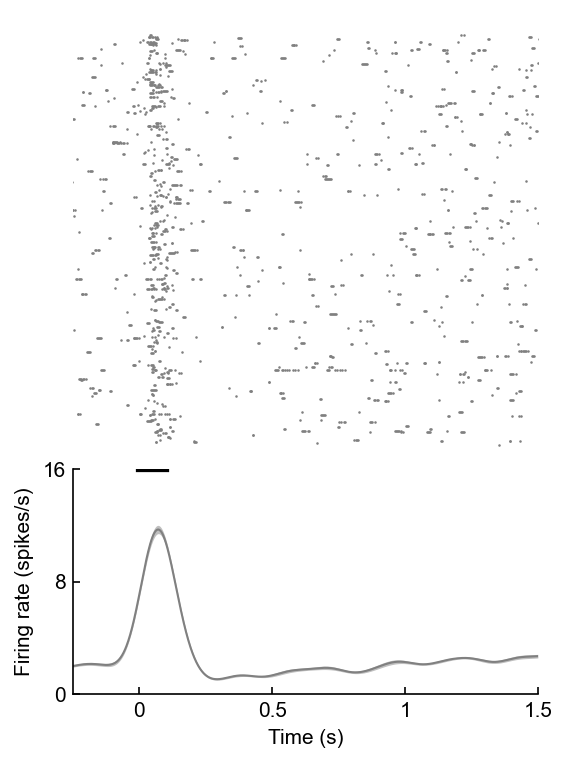

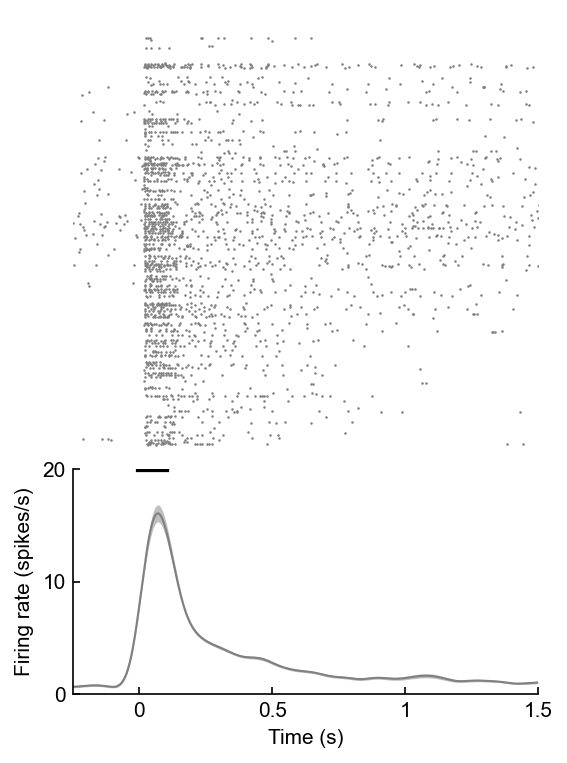

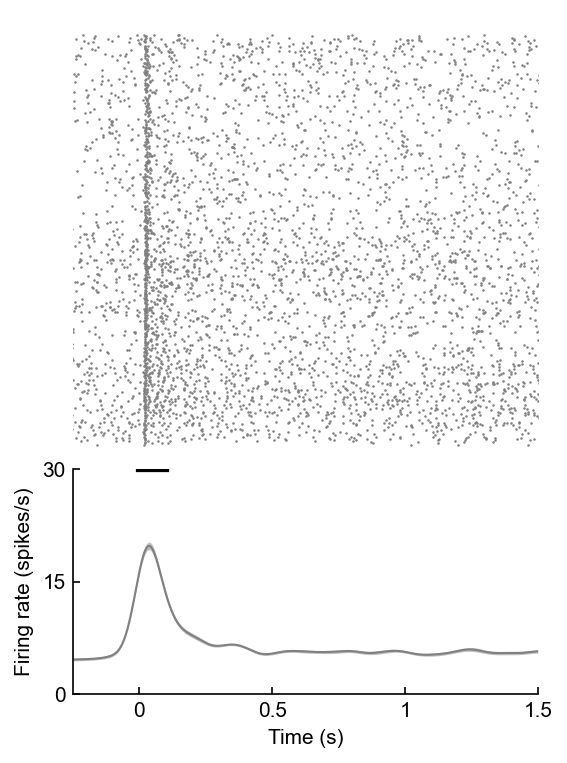

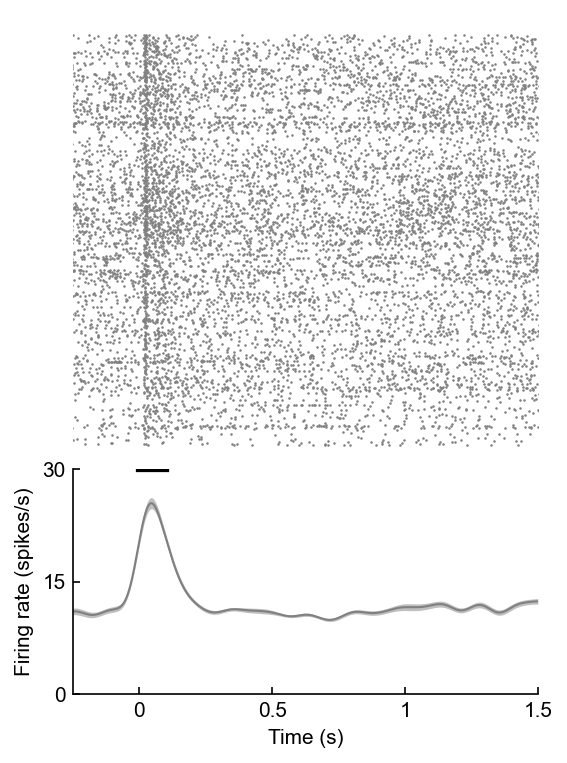

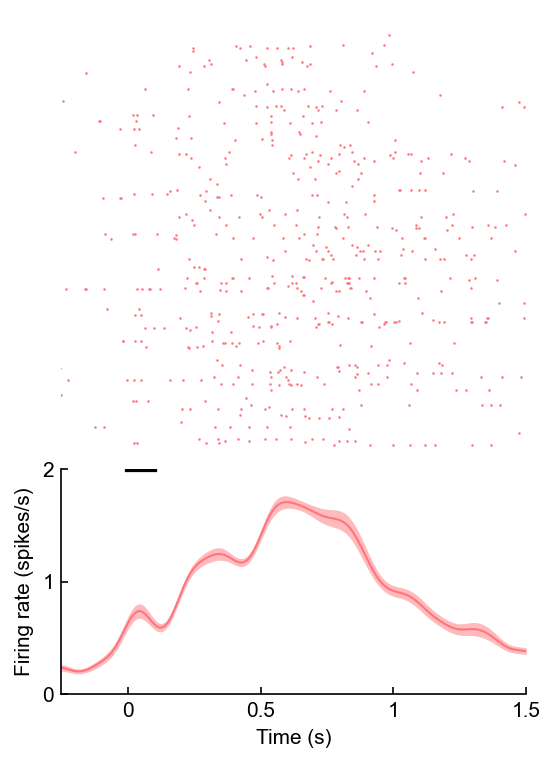

In [55]:
for session in os.listdir(ops_directory):
    sessionfile = ilep.loadSessionCached(ops_directory,session)
    
    if not (sessionfile.meta.animal == 'AE_267' and sessionfile.meta.region == 'AC' and sessionfile.meta.day_of_training-animalBehaviors['AE_267'].reversal == 5):
        continue
        
    for clust in sessionfile.clusters.good:
        fig = visualizeCluster(sessionfile,clust)
        fig.savefig(os.path.join('D:\\\\TempFigures','AE_267_rasters','Session 5',f"session 5 clust {clust}.png"),transparent=False,facecolor="white")

<ipython-input-54-860d99ca297a>:19: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig = plt.figure(figsize=(4,6))


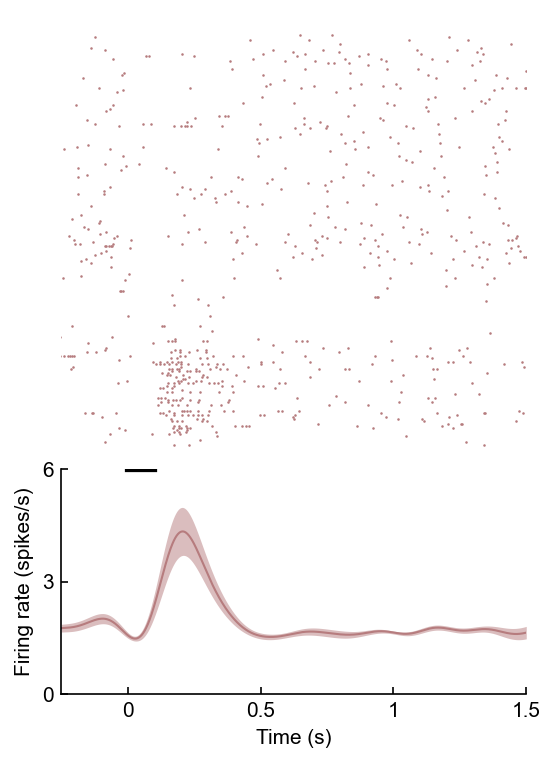

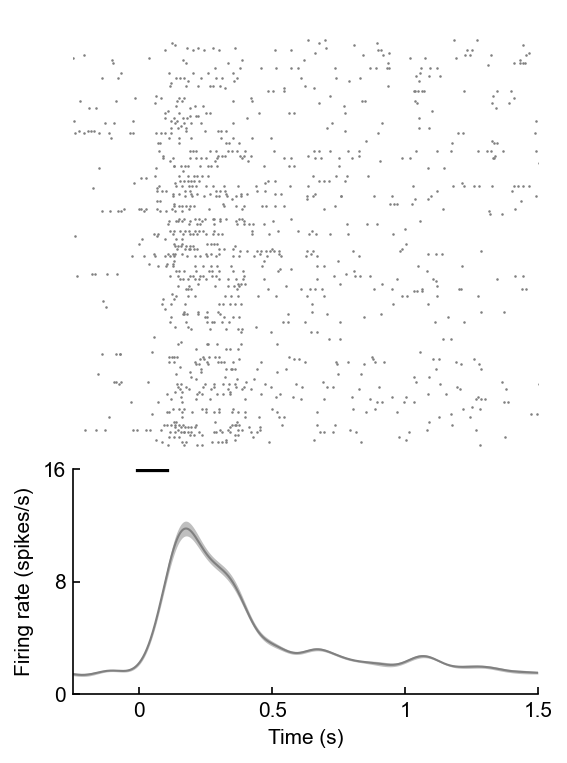

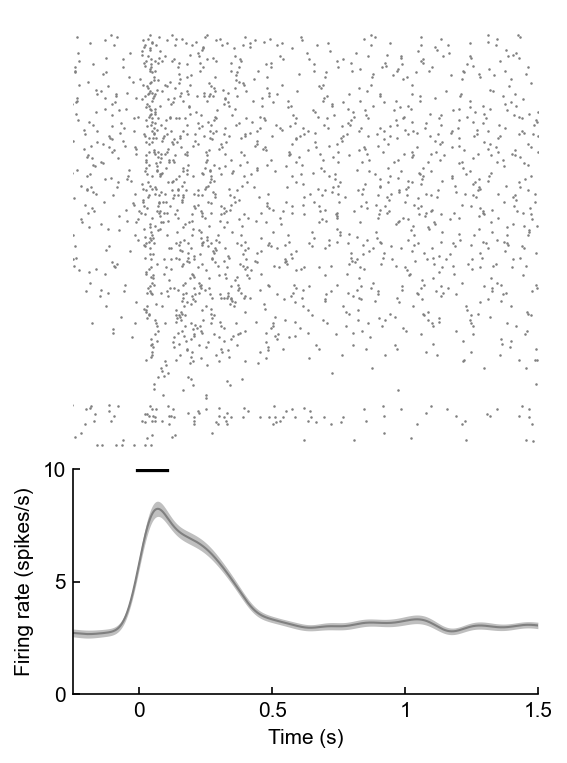

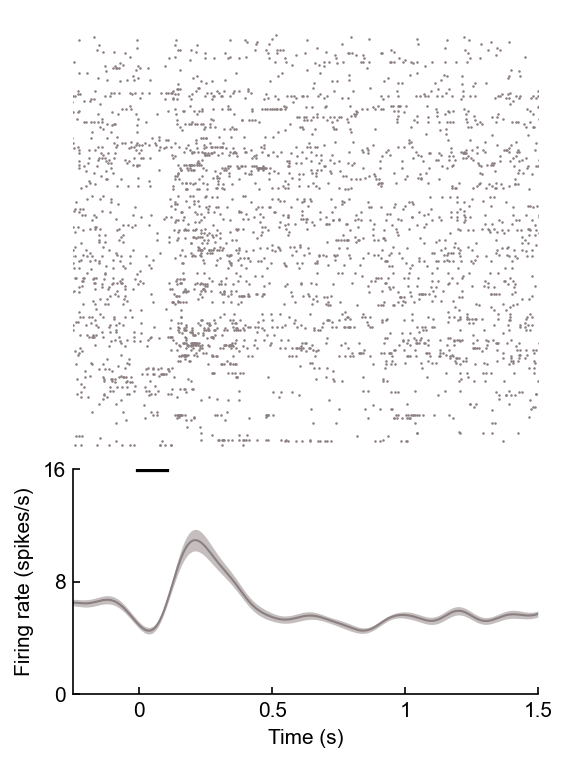

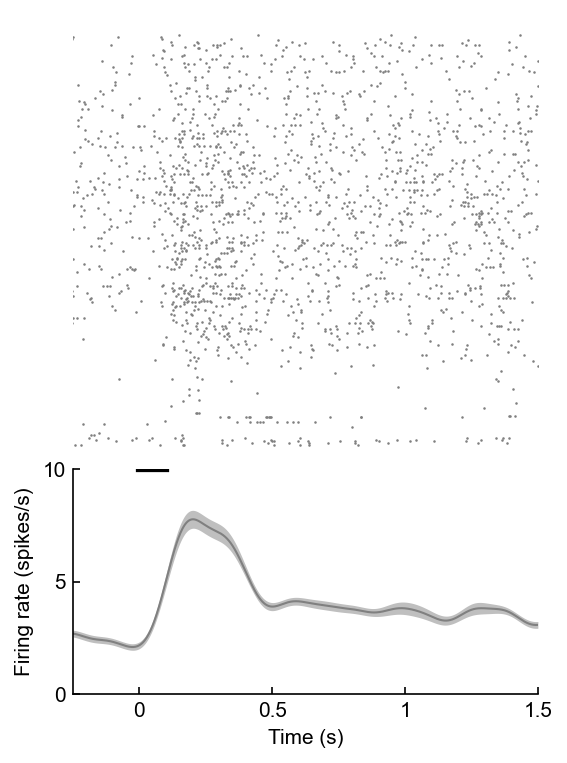

...

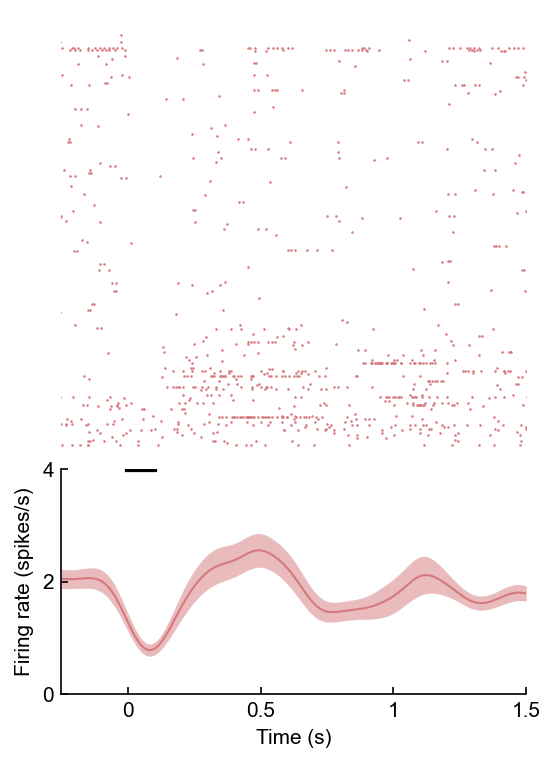

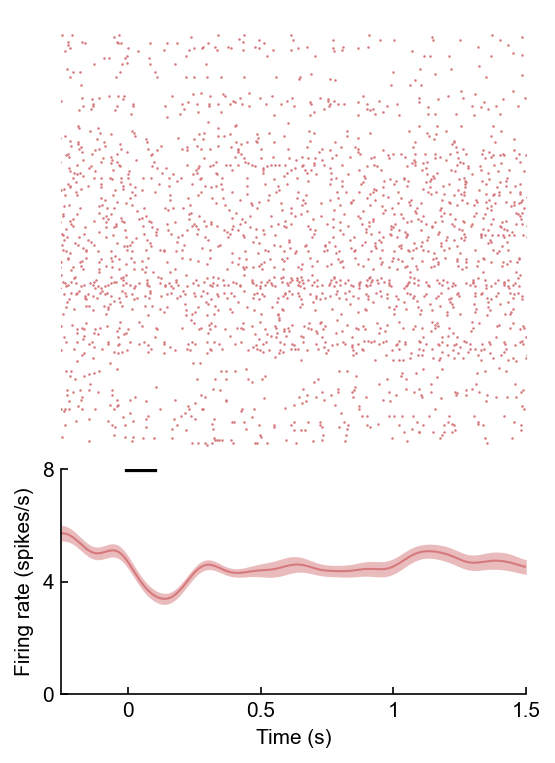

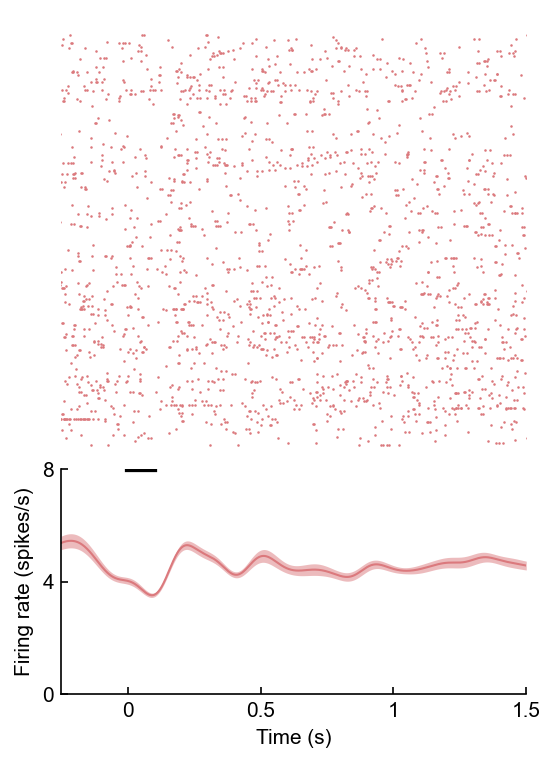

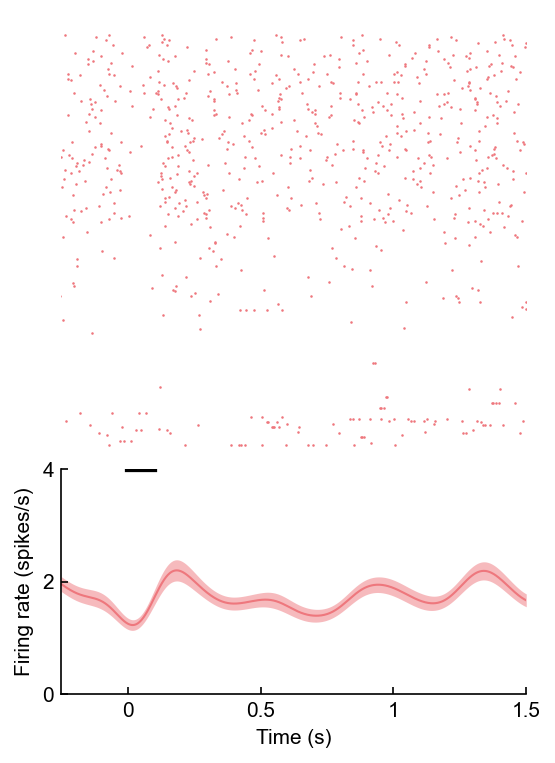

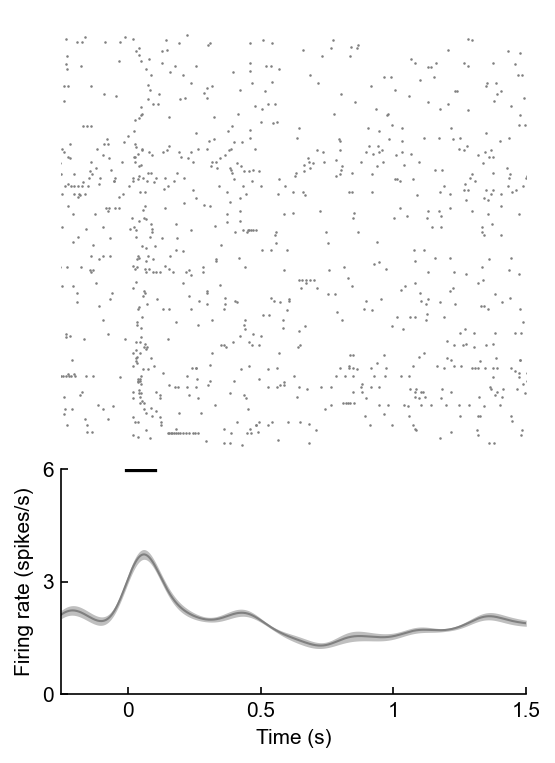

In [56]:
for session in os.listdir(ops_directory):
    sessionfile = ilep.loadSessionCached(ops_directory,session)
    
    if not (sessionfile.meta.animal == 'AE_267' and sessionfile.meta.region == 'AC' and sessionfile.meta.day_of_training-animalBehaviors['AE_267'].reversal == 10):
        continue
        
    for clust in sessionfile.clusters.good:
        fig = visualizeCluster(sessionfile,clust)
        fig.savefig(os.path.join('D:\\\\TempFigures','AE_267_rasters','Session 10',f"session 10 clust {clust}.png"),transparent=False,facecolor="white")

<ipython-input-54-860d99ca297a>:19: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig = plt.figure(figsize=(4,6))


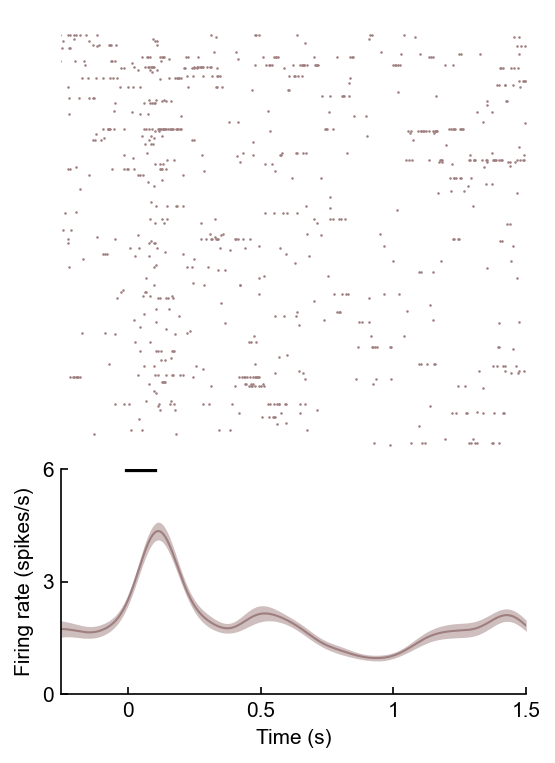

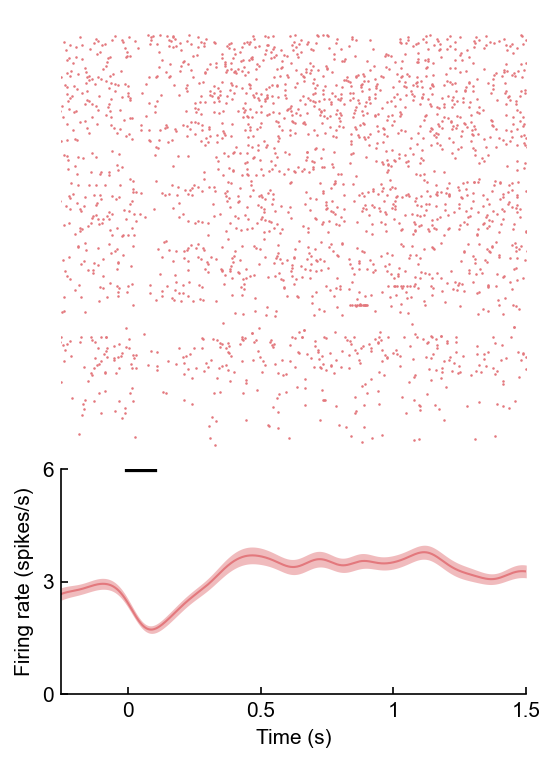

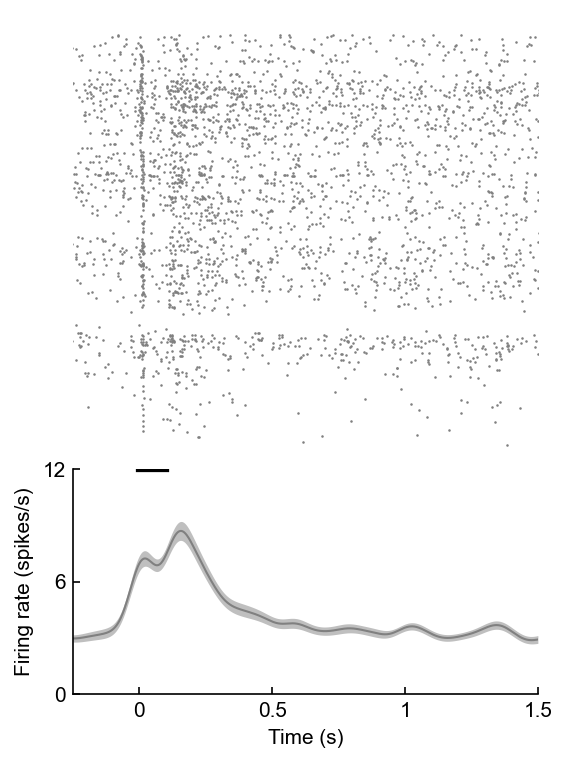

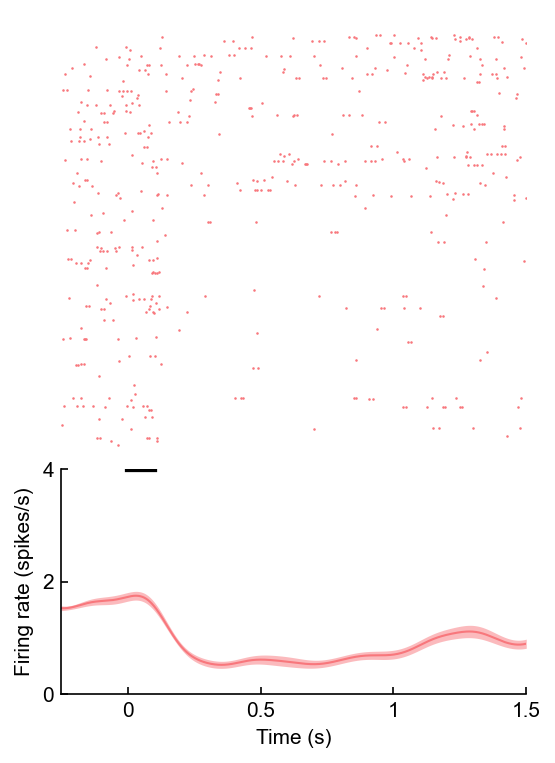

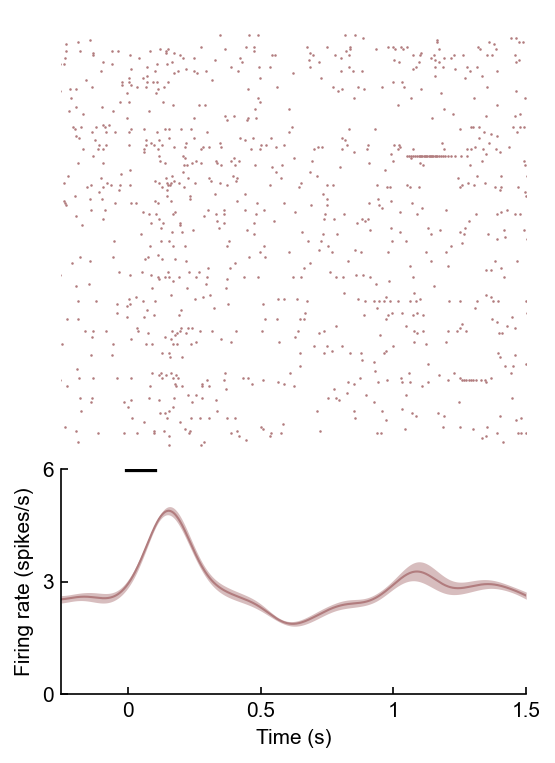

...

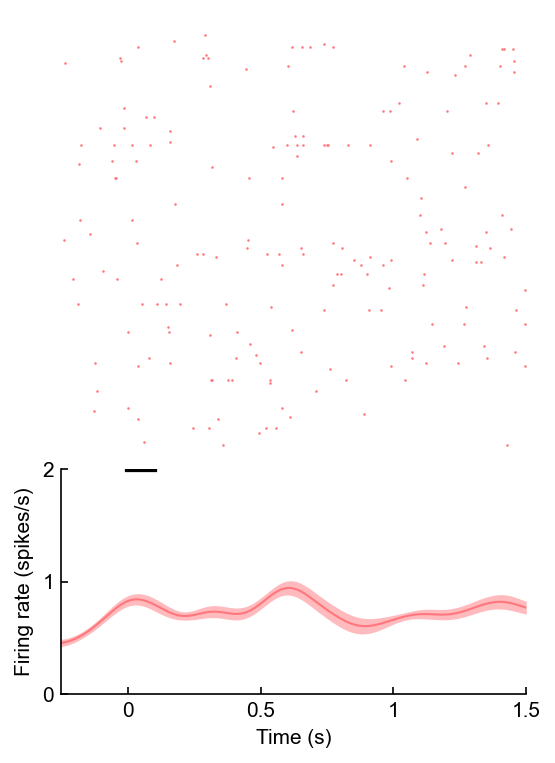

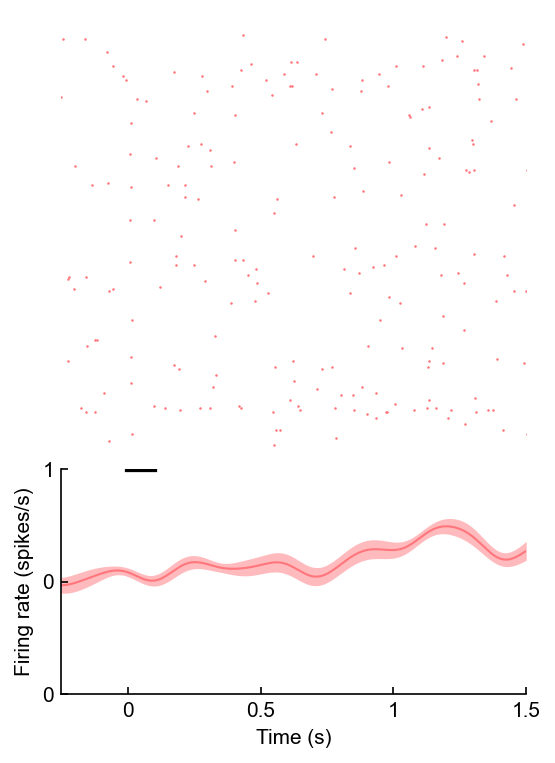

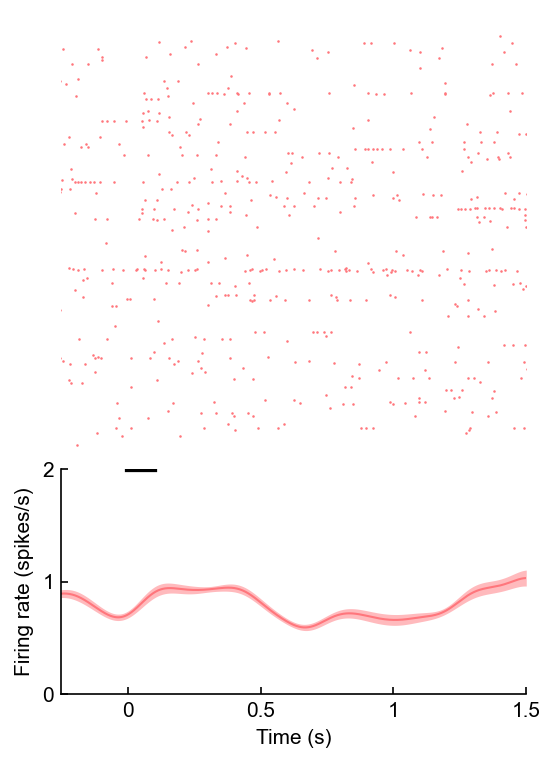

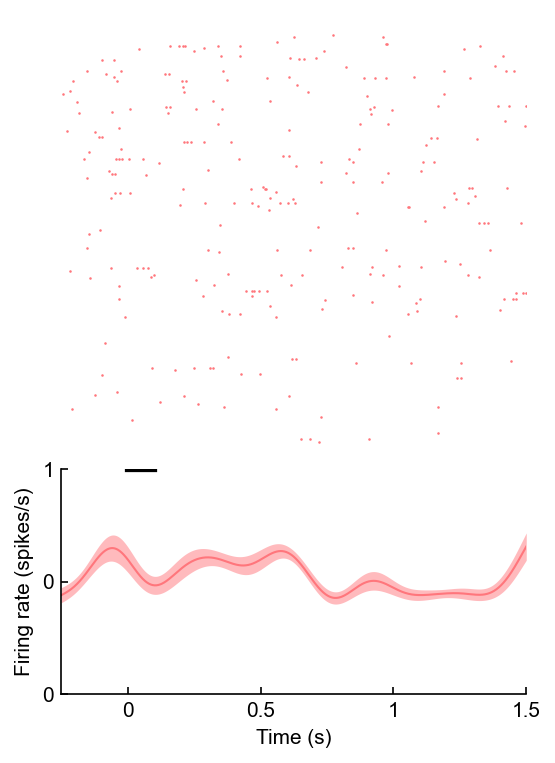

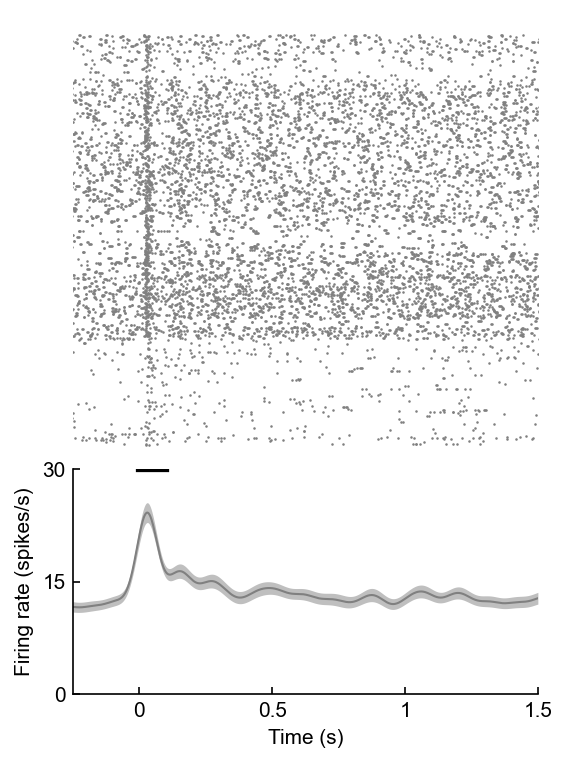

In [57]:
for session in os.listdir(ops_directory):
    sessionfile = ilep.loadSessionCached(ops_directory,session)
    
    if not (sessionfile.meta.animal == 'AE_267' and sessionfile.meta.region == 'AC' and sessionfile.meta.day_of_training-animalBehaviors['AE_267'].reversal == 3):
        continue
        
    for clust in sessionfile.clusters.good:
        fig = visualizeCluster(sessionfile,clust)
        fig.savefig(os.path.join('D:\\\\TempFigures','AE_267_rasters','Session 3',f"session 3 clust {clust}.png"),transparent=False,facecolor="white")

<ipython-input-54-860d99ca297a>:19: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig = plt.figure(figsize=(4,6))


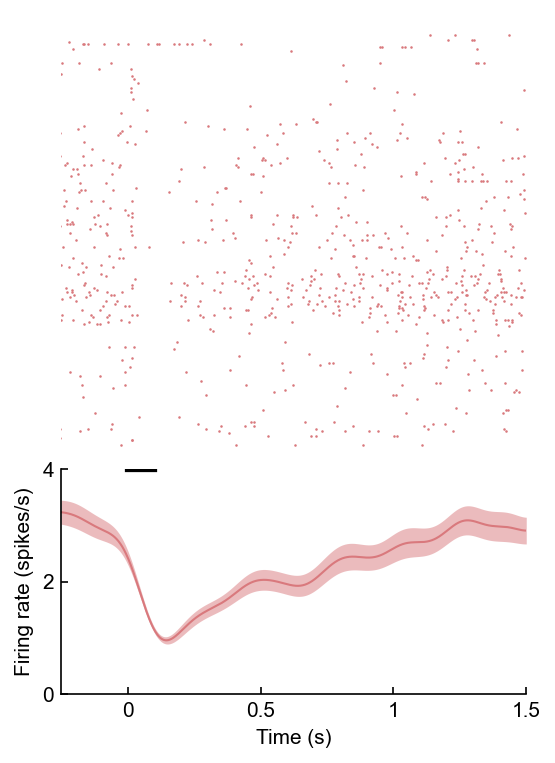

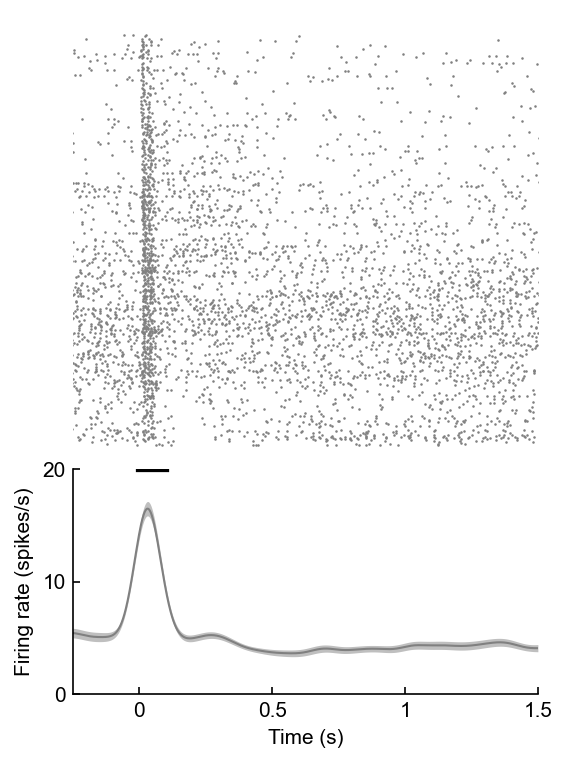

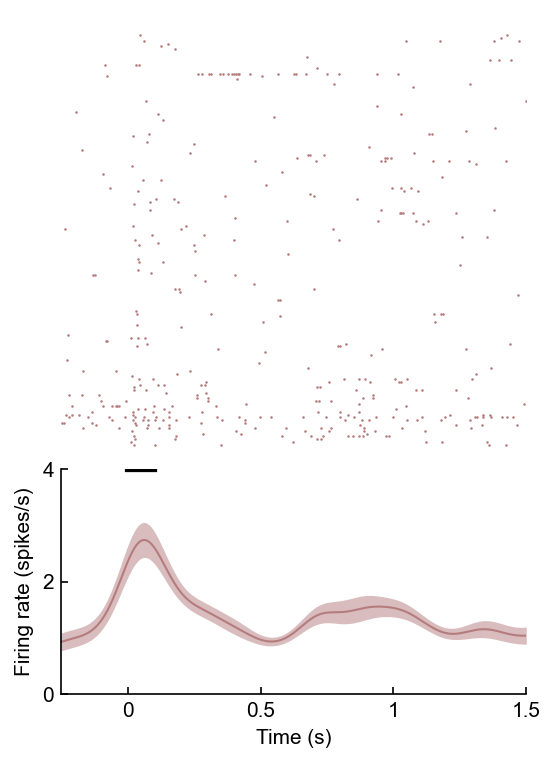

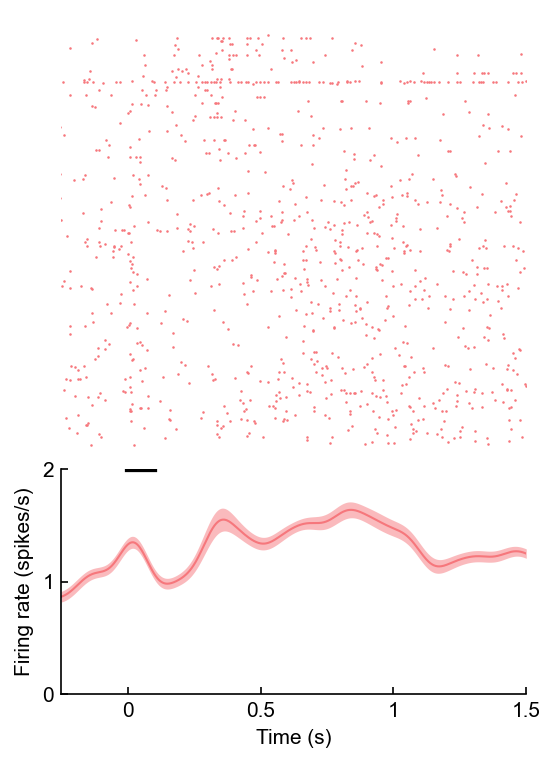

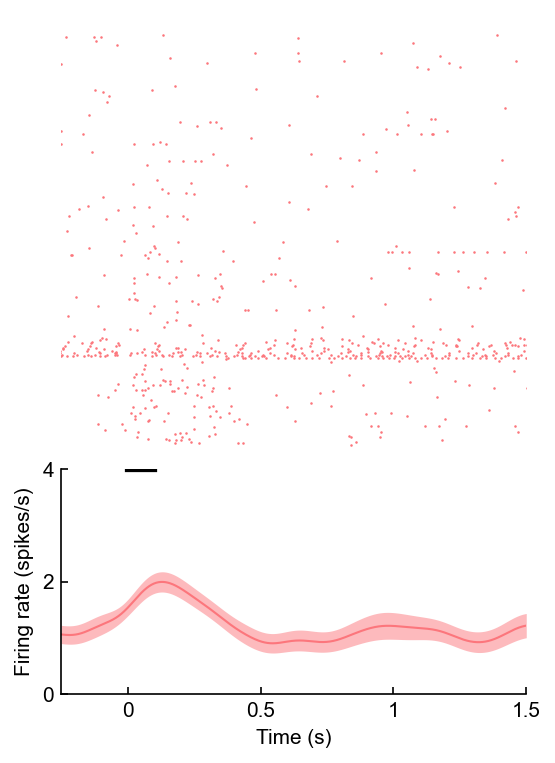

...

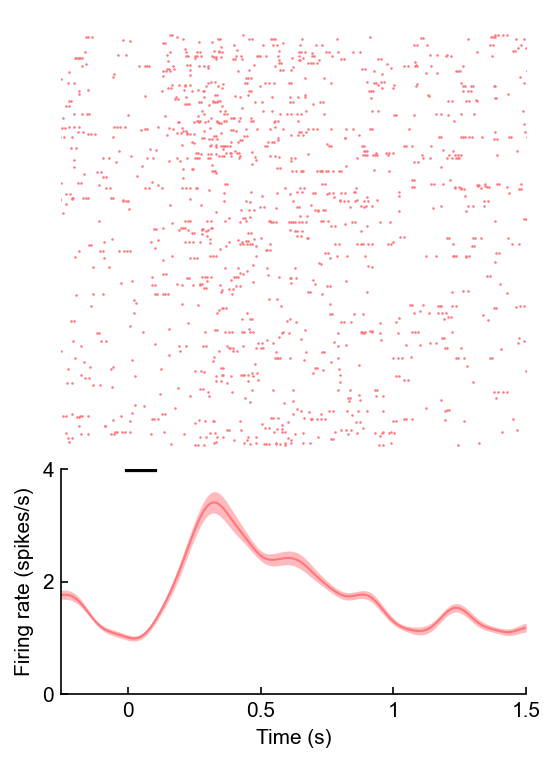

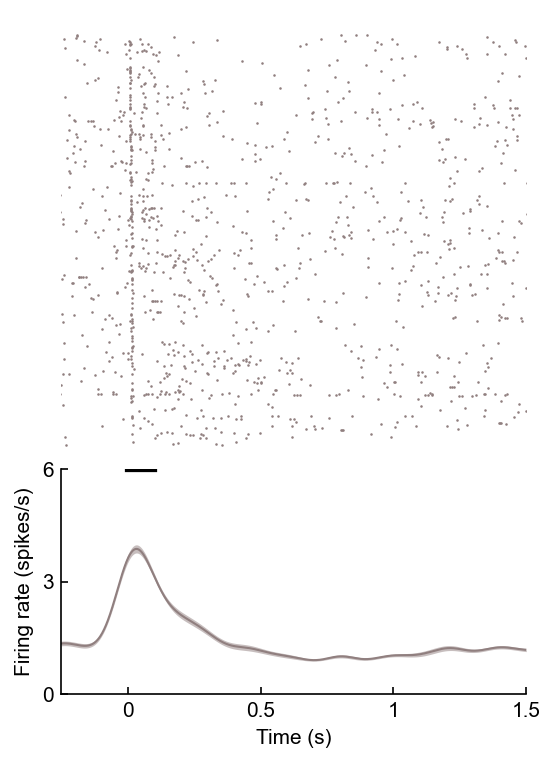

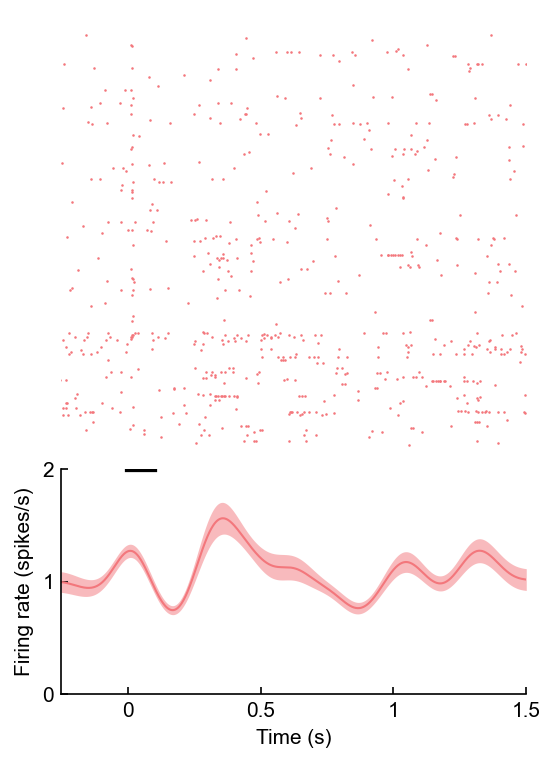

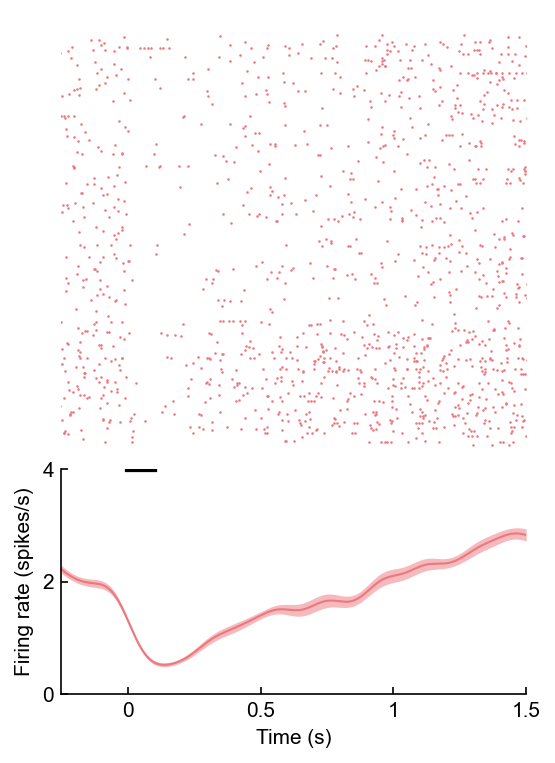

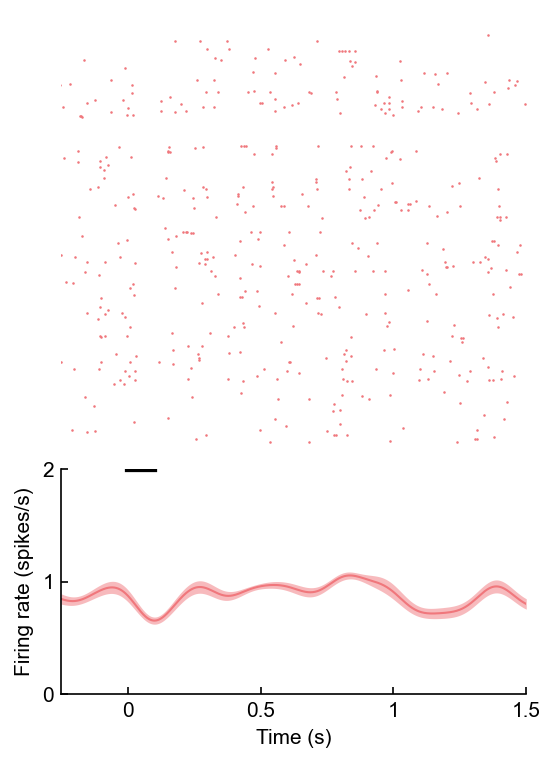

In [58]:
for session in os.listdir(ops_directory):
    sessionfile = ilep.loadSessionCached(ops_directory,session)
    
    if not (sessionfile.meta.animal == 'AE_267' and sessionfile.meta.region == 'AC' and sessionfile.meta.day_of_training-animalBehaviors['AE_267'].reversal == 7):
        continue
        
    for clust in sessionfile.clusters.good:
        fig = visualizeCluster(sessionfile,clust)
        fig.savefig(os.path.join('D:\\\\TempFigures','AE_267_rasters','Session 7',f"session 7 clust {clust}.png"),transparent=False,facecolor="white")

In [161]:
opsin_control_animals

['AE_287']

In [75]:
FRmod_preearly_Ephys = FRmod_preearly_Control
FRmod_prelate_Ephys = FRmod_prelate_Control
FRmod_preexpert_Ephys = FRmod_preexpert_Control
FRmod_postearly_Ephys = FRmod_postearly_Control
FRmod_postlate_Ephys = FRmod_postlate_Control
FRmod_postexpert_Ephys = FRmod_postexpert_Control

In [24]:
FRmod_preearly_Newcontrol = FRmod_preearly_Control
FRmod_prelate_Newcontrol = FRmod_prelate_Control
FRmod_preexpert_Newcontrol = FRmod_preexpert_Control
FRmod_postearly_Newcontrol = FRmod_postearly_Control
FRmod_postlate_Newcontrol = FRmod_postlate_Control
FRmod_postexpert_Newcontrol = FRmod_postexpert_Control

In [42]:
FRmod_preearly_267 = FRmod_preearly_Control
FRmod_prelate_267 = FRmod_prelate_Control
FRmod_preexpert_267 = FRmod_preexpert_Control
FRmod_postearly_267 = FRmod_postearly_Control
FRmod_postlate_267 = FRmod_postlate_Control
FRmod_postexpert_267 = FRmod_postexpert_Control

In [50]:
FRmod_preearly_273 = FRmod_preearly_Control
FRmod_prelate_273 = FRmod_prelate_Control
FRmod_preexpert_273 = FRmod_preexpert_Control
FRmod_postearly_273 = FRmod_postearly_Control
FRmod_postlate_273 = FRmod_postlate_Control
FRmod_postexpert_273 = FRmod_postexpert_Control

In [58]:
FRmod_preearly_274 = FRmod_preearly_Control
FRmod_prelate_274 = FRmod_prelate_Control
FRmod_preexpert_274 = FRmod_preexpert_Control
FRmod_postearly_274 = FRmod_postearly_Control
FRmod_postlate_274 = FRmod_postlate_Control
FRmod_postexpert_274 = FRmod_postexpert_Control

In [168]:
FRmod_preearly_287 = FRmod_preearly_Control
FRmod_prelate_287 = FRmod_prelate_Control
FRmod_preexpert_287 = FRmod_preexpert_Control
FRmod_postearly_287 = FRmod_postearly_Control
FRmod_postlate_287 = FRmod_postlate_Control
FRmod_postexpert_287 = FRmod_postexpert_Control

In [169]:
FRmod_preearly_287_on = FRmod_preearly_Control_on
FRmod_prelate_287_on = FRmod_prelate_Control_on
FRmod_preexpert_287_on = FRmod_preexpert_Control_on
FRmod_postearly_287_on = FRmod_postearly_Control_on
FRmod_postlate_287_on = FRmod_postlate_Control_on
FRmod_postexpert_287_on = FRmod_postexpert_Control_on

In [170]:
FRmod_preearly_287_off = FRmod_preearly_Control_off
FRmod_prelate_287_off = FRmod_prelate_Control_off
FRmod_preexpert_287_off = FRmod_preexpert_Control_off
FRmod_postearly_287_off = FRmod_postearly_Control_off
FRmod_postlate_287_off = FRmod_postlate_Control_off
FRmod_postexpert_287_off = FRmod_postexpert_Control_off

In [98]:
[np.median(fr) for fr in [FRmod_postearly_287_on,FRmod_postlate_287_on,FRmod_postexpert_287_on]]

[3.300624133148405, 3.4722222222222237, 4.245541838134432]

In [99]:
[np.median(fr) for fr in [FRmod_postearly_287_off,FRmod_postlate_287_off,FRmod_postexpert_287_off]]

[3.2492181751287705, 3.119565217391307, 3.6704119850187253]

In [100]:
[np.mean(fr) for fr in [FRmod_postearly_287_on,FRmod_postlate_287_on,FRmod_postexpert_287_on]]

[5.834458602075818, 5.598724680160548, 8.13878093317111]

In [101]:
[np.mean(fr) for fr in [FRmod_postearly_287_off,FRmod_postlate_287_off,FRmod_postexpert_287_off]]

[4.80303568760501, 5.294237535445425, 7.527530344531991]

In [67]:
[len(fr) for fr in [FRmod_postearly_287,FRmod_postlate_287,FRmod_postexpert_287]]

[90, 127, 71]

In [62]:
data_287_off

array([ 3.66445916, 14.02317881,  1.90639269,  8.27262693,  0.17108168,
        6.22516556,  5.17660044,  3.34722222,  0.65315315,  2.78816199,
        1.95364238,  4.98896247,  3.15121413,  1.72839506,  0.81125828,
        0.41062802,  6.37969095,  0.53459119,  6.76048565,  0.73593074,
        0.96707819,  3.87417219,  7.0419426 ,  1.63907285, 15.85087719,
        3.40507726, 31.66666667,  5.9602649 ,  2.21854305,  3.48233996,
        4.08388521, 10.91059603,  1.01190476,  2.32352941, 12.66129032,
        4.27966102,  5.15873016,  2.55351682,  1.27567141,  2.17889908,
        7.35856269,  5.25993884,  2.57675439,  0.23977987,  1.37232416,
        1.0955711 ,  1.51515152,  8.75382263,  2.0609319 ,  6.44495413,
        1.390625  , 10.01529052, 26.84250765,  4.85474006,  0.76452599,
       20.29816514,  5.50076453,  0.64764493,  0.49873737,  1.2       ,
        4.54285714,  1.59249564,  4.3616208 ,  8.05428135, 19.64449541,
        1.03150407,  2.32026144,  0.82304527,  0.64300412,  4.05

In [63]:
data_287_on

array([ 2.15962441, 16.29694836,  1.51741294, 11.81338028,  0.44600939,
        8.92018779,  3.4213615 , 14.89417989,  1.14197531,  1.02024922,
        3.65610329,  4.17840376,  5.96244131,  0.55936073,  1.03873239,
        0.7960199 ,  5.01760563,  1.04166667,  6.50821596,  0.56338028,
        0.94444444,  4.10211268,  8.87323944,  3.19835681, 30.65789474,
        2.87558685, 33.23356808, 12.11267606,  4.33098592,  3.43309859,
        2.72300469, 11.66666667,  1.60628019,  3.36904762, 10.55555556,
        5.71428571,  6.0122164 ,  3.17152104,  1.60189983,  1.15291262,
       10.25080906, 14.98786408,  1.99186992,  0.42735043,  1.41990291,
        1.88      ,  1.2109375 ,  8.40210356,  1.87973485,  7.66990291,
        1.16776316,  9.79773463, 31.16504854,  3.23220065,  1.23381877,
       21.06796117,  6.12055016,  0.26960784,  1.04341737,  1.91767068,
        1.8624498 ,  2.58945386,  4.41747573,  9.61165049, 22.28964401,
        1.85483871,  2.99625468,  0.79268293,  1.04564756,  4.85

baseline = 3.5


<ipython-input-171-5646d2db15df>:33: RuntimeWarning: divide by zero encountered in log10
  X,_ = ilep.violin(X,np.log10(data_newcontrol),width=wid,minjitter=0.075)
<ipython-input-171-5646d2db15df>:38: RuntimeWarning: divide by zero encountered in log10
  X,_ = ilep.violin(X,np.log10(data_267),width=wid,minjitter=0.075)


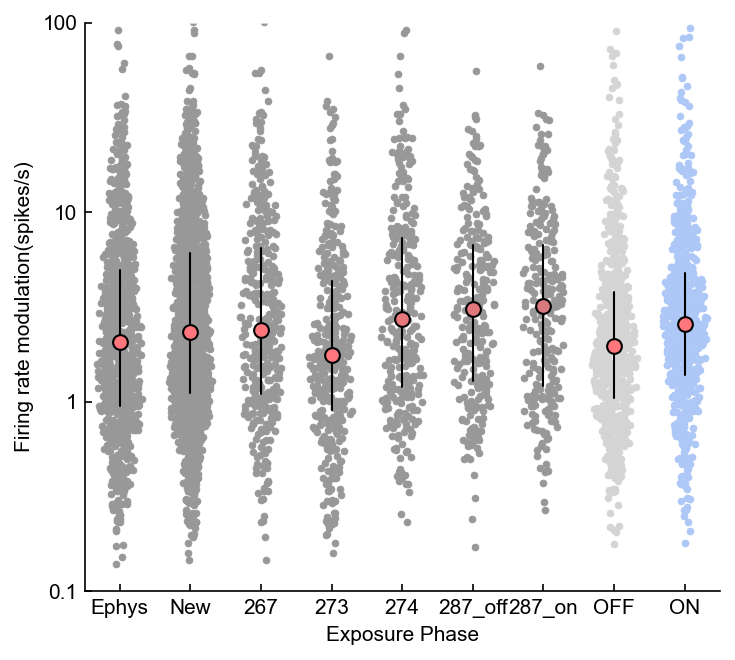

In [171]:
#Firing rate modulation graphs
size=10

FRmod_baseline_median = 3.5#np.median(FRmod_preearly)
print('baseline = '+str(FRmod_baseline_median))

fig, ax = plt.subplots(figsize=(5,4.5))
data_on = np.concatenate([FRmod_postearly_Ops_On,FRmod_postlate_Ops_On,FRmod_postexpert_Ops_On])
data_off = np.concatenate([FRmod_postearly_Ops_Off,FRmod_postlate_Ops_Off,FRmod_postexpert_Ops_Off])
data_ephys = np.concatenate([FRmod_postearly_Ephys,FRmod_postlate_Ephys,FRmod_postexpert_Ephys])
data_newcontrol = np.concatenate([FRmod_postearly_Newcontrol,FRmod_postlate_Newcontrol,FRmod_postexpert_Newcontrol])
data_267 = np.concatenate([FRmod_postearly_267,FRmod_postlate_267,FRmod_postexpert_267])
data_273 = np.concatenate([FRmod_postearly_273,FRmod_postlate_273,FRmod_postexpert_273])
data_274 = np.concatenate([FRmod_postearly_274,FRmod_postlate_274,FRmod_postexpert_274])
data_287 = np.concatenate([FRmod_postearly_287,FRmod_postlate_287,FRmod_postexpert_287])
data_287_on = np.concatenate([FRmod_postearly_287_on,FRmod_postlate_287_on,FRmod_postexpert_287_on])
data_287_off = np.concatenate([FRmod_postearly_287_off,FRmod_postlate_287_off,FRmod_postexpert_287_off])
labels = ['Ephys','New','267','273','274','287_off','287_on','OFF','ON']
numCon = 9

wid = 0.75
widsc = wid/1.75#*1.125



X = np.ones_like(data_ephys)*0
_,Y = ilep.violin(X,data_ephys,width=wid,minjitter=0.075)
X,_ = ilep.violin(X,np.log10(data_ephys),width=wid,minjitter=0.075)
ax.scatter(X, Y, s=size, c='k', lw=0.5,zorder=-10,label='Ephys')

X = np.ones_like(data_newcontrol)*1
_,Y = ilep.violin(X,data_newcontrol,width=wid,minjitter=0.075)
X,_ = ilep.violin(X,np.log10(data_newcontrol),width=wid,minjitter=0.075)
ax.scatter(X, Y, s=size, c='k', lw=0.5,zorder=-10,label='New control')

X = np.ones_like(data_267)*2
_,Y = ilep.violin(X,data_267,width=wid,minjitter=0.075)
X,_ = ilep.violin(X,np.log10(data_267),width=wid,minjitter=0.075)
ax.scatter(X, Y, s=size, c='k', lw=0.5,zorder=-10,label='AE_267')

X = np.ones_like(data_273)*3
_,Y = ilep.violin(X,data_273,width=wid,minjitter=0.075)
X,_ = ilep.violin(X,np.log10(data_273),width=wid,minjitter=0.075)
ax.scatter(X, Y, s=size, c='k', lw=0.5,zorder=-10,label='AO_273')

X = np.ones_like(data_274)*4
_,Y = ilep.violin(X,data_274,width=wid,minjitter=0.075)
X,_ = ilep.violin(X,np.log10(data_274),width=wid,minjitter=0.075)
ax.scatter(X, Y, s=size, c='k', lw=0.5,zorder=-10,label='AO_274')

X = np.ones_like(data_287_off)*5
_,Y = ilep.violin(X,data_287_off,width=wid,minjitter=0.075)
X,_ = ilep.violin(X,np.log10(data_287_off),width=wid,minjitter=0.075)
ax.scatter(X, Y, s=size, c='k', lw=0.5,zorder=-10,label='AO_287_off')

X = np.ones_like(data_287_on)*6
_,Y = ilep.violin(X,data_287_on,width=wid,minjitter=0.075)
X,_ = ilep.violin(X,np.log10(data_287_on),width=wid,minjitter=0.075)
ax.scatter(X, Y, s=size, c='k', lw=0.5,zorder=-10,label='AO_287_on')

X = np.ones_like(data_off)*7
_,Y = ilep.violin(X,data_off,width=wid,minjitter=0.075)
X,_ = ilep.violin(X,np.log10(data_off),width=wid,minjitter=0.075)
#X -= widsc
ax.scatter(X, Y, s=size, c=GOOD_GREY, lw=0.5,zorder=-10,label='Laser OFF')

X = np.ones_like(data_on)*8
_,Y = ilep.violin(X,data_on,width=wid,minjitter=0.075)
X,_ = ilep.violin(X,np.log10(data_on),width=wid,minjitter=0.075)
#X += widsc
ax.scatter(X, Y, s=size, c=LASER_COLOR, lw=0.5,zorder=-10,label='Laser ON')

# mn = 3.5
# spread = 2.5
# colors = NCR_CR_cmap( (Y-(mn-spread/2))/ (spread) )

ax.set_yscale('log',subs=[])



#Plot summary
column = data_ephys
column = ilep.rmnan(column)
percentCR = np.nanmean(np.greater(column,FRmod_baseline_median))*100
eye_color= NCR_CR_cmap((percentCR-40)/20)
border_color = 'k'#eye_color

summary_size=50
summary_width=1

Q1, median, Q3 = (np.percentile(column, q) for q in [25, 50, 75])
ax.scatter([0], [median], ec=border_color,fc=eye_color, s=summary_size,lw=summary_width, zorder=10)
ax.plot([0,0], [Q1, Q3], c=border_color, lw=summary_width, zorder=9, solid_capstyle='round')


column = data_newcontrol
column = ilep.rmnan(column)
percentCR = np.nanmean(np.greater(column,FRmod_baseline_median))*100
eye_color= NCR_CR_cmap((percentCR-40)/20)
border_color = 'k'#eye_color

summary_size=50
summary_width=1

Q1, median, Q3 = (np.percentile(column, q) for q in [25, 50, 75])
ax.scatter([1], [median], ec=border_color,fc=eye_color, s=summary_size,lw=summary_width, zorder=10)
ax.plot([1,1], [Q1, Q3], c=border_color, lw=summary_width, zorder=9, solid_capstyle='round')


column = data_267
column = ilep.rmnan(column)
percentCR = np.nanmean(np.greater(column,FRmod_baseline_median))*100
eye_color= NCR_CR_cmap((percentCR-40)/20)
border_color = 'k'#eye_color

summary_size=50
summary_width=1

Q1, median, Q3 = (np.percentile(column, q) for q in [25, 50, 75])
ax.scatter([2], [median], ec=border_color,fc=eye_color, s=summary_size,lw=summary_width, zorder=10)
ax.plot([2,2], [Q1, Q3], c=border_color, lw=summary_width, zorder=9, solid_capstyle='round')


column = data_273
column = ilep.rmnan(column)
percentCR = np.nanmean(np.greater(column,FRmod_baseline_median))*100
eye_color= NCR_CR_cmap((percentCR-40)/20)
border_color = 'k'#eye_color

summary_size=50
summary_width=1

Q1, median, Q3 = (np.percentile(column, q) for q in [25, 50, 75])
ax.scatter([3], [median], ec=border_color,fc=eye_color, s=summary_size,lw=summary_width, zorder=10)
ax.plot([3,3], [Q1, Q3], c=border_color, lw=summary_width, zorder=9, solid_capstyle='round')



column = data_274
column = ilep.rmnan(column)
percentCR = np.nanmean(np.greater(column,FRmod_baseline_median))*100
eye_color= NCR_CR_cmap((percentCR-40)/20)
border_color = 'k'#eye_color

summary_size=50
summary_width=1

Q1, median, Q3 = (np.percentile(column, q) for q in [25, 50, 75])
ax.scatter([4], [median], ec=border_color,fc=eye_color, s=summary_size,lw=summary_width, zorder=10)
ax.plot([4,4], [Q1, Q3], c=border_color, lw=summary_width, zorder=9, solid_capstyle='round')




column = data_287_off
column = ilep.rmnan(column)
percentCR = np.nanmean(np.greater(column,FRmod_baseline_median))*100
eye_color= NCR_CR_cmap((percentCR-40)/20)
border_color = 'k'#eye_color

summary_size=50
summary_width=1

Q1, median, Q3 = (np.percentile(column, q) for q in [25, 50, 75])
ax.scatter([5], [median], ec=border_color,fc=eye_color, s=summary_size,lw=summary_width, zorder=10)
ax.plot([5,5], [Q1, Q3], c=border_color, lw=summary_width, zorder=9, solid_capstyle='round')







column = data_287_on
column = ilep.rmnan(column)
percentCR = np.nanmean(np.greater(column,FRmod_baseline_median))*100
eye_color= NCR_CR_cmap((percentCR-40)/20)
border_color = 'k'#eye_color

summary_size=50
summary_width=1

Q1, median, Q3 = (np.percentile(column, q) for q in [25, 50, 75])
ax.scatter([6], [median], ec=border_color,fc=eye_color, s=summary_size,lw=summary_width, zorder=10)
ax.plot([6,6], [Q1, Q3], c=border_color, lw=summary_width, zorder=9, solid_capstyle='round')



    
    
column = data_off
column = ilep.rmnan(column)
percentCR = np.nanmean(np.greater(column,FRmod_baseline_median))*100
eye_color= NCR_CR_cmap((percentCR-40)/20)
border_color = 'k'#eye_color

summary_size=50
summary_width=1

Q1, median, Q3 = (np.percentile(column, q) for q in [25, 50, 75])
ax.scatter([7], [median], ec=border_color,fc=eye_color, s=summary_size,lw=summary_width, zorder=10)
ax.plot([7,7],[Q1, Q3], c=border_color, lw=summary_width, zorder=9, solid_capstyle='round')





column = data_on
column = ilep.rmnan(column)
percentCR = np.nanmean(np.greater(column,FRmod_baseline_median))*100
eye_color= NCR_CR_cmap((percentCR-40)/20)
border_color = 'k'#eye_color

summary_size=50
summary_width=1

Q1, median, Q3 = (np.percentile(column, q) for q in [25, 50, 75])
ax.scatter([8], [median], ec=border_color,fc=eye_color, s=summary_size,lw=summary_width, zorder=10)
ax.plot([8,8],[Q1, Q3], c=border_color, lw=summary_width, zorder=9, solid_capstyle='round')






    
    
    
#Connected lines
# medians = [np.nanmedian(d) for d in data]
# ax.plot([0,1,2],medians[0:3],linestyle='--',color=GOOD_GREY,lw=1)
# ax.plot([3,4,5],medians[3:6],linestyle='--',color=GOOD_GREY,lw=1)

ax.set_ylim([0.1,100])
ax.set_yticks([0.1,1,10,100])
ax.set_yticklabels(['0.1','1','10','100'])
ax.set_ylabel('Firing rate modulation(spikes/s)')

ax.set_xlim([-0.5,8.5])
ax.set_xticks(range(numCon))
ax.set_xticklabels(labels)
ax.set_xlim(ax.get_xlim())
ax.set_xlabel('Exposure Phase')

#ax.legend(frameon=False,loc=(1,0.8))

ax.fill_between(ax.get_xlim(),[ax.get_ylim()[0]]*2,[ax.get_ylim()[1]]*2,color='white',alpha=0.6,zorder=-5)

# xtick_pos_pre = ax.get_xticks()[1]
# xtick_pos_post = ax.get_xticks()[4]
# ax.text(xtick_pos_pre, 0.054188468134356925, 'Pre-rev', ha='center', va='top', fontsize=12,color='k')
# ax.text(xtick_pos_post, 0.054188468134356925, 'Post-rev', ha='center', va='top',  fontsize=12,color='k')
# ax.annotate('', xy=(0.03, -0.07), xycoords='axes fraction', xytext=(0.49, -0.07),arrowprops=dict(arrowstyle='-', color='k'))
# ax.annotate('', xy=(0.53, -0.07), xycoords='axes fraction', xytext=(0.99, -0.07),arrowprops=dict(arrowstyle='-', color='k'))

plt.tight_layout()
fig.savefig(os.path.join('D:\\\\Figures','Manuscript Figures','AC Opsin modulation control on off all conditions V'+str(current_version)+'.pdf'),transparent=False,facecolor="white")

In [61]:
print(mannwhitneyu(ilep.rmnan(data_ephys),ilep.rmnan(data_newcontrol)).pvalue)
print(mannwhitneyu(ilep.rmnan(data_ephys),ilep.rmnan(data_267)).pvalue)
print(mannwhitneyu(ilep.rmnan(data_ephys),ilep.rmnan(data_273)).pvalue)
print(mannwhitneyu(ilep.rmnan(data_ephys),ilep.rmnan(data_274)).pvalue)
print(mannwhitneyu(ilep.rmnan(data_ephys),ilep.rmnan(data_287)).pvalue)
print(mannwhitneyu(ilep.rmnan(data_ephys),ilep.rmnan(data_off)).pvalue)
print(mannwhitneyu(ilep.rmnan(data_ephys),ilep.rmnan(data_on)).pvalue)

5.00568524510506e-16
1.0095921105086312e-08
0.0852422775996699
1.356694410013156e-12
2.848770711662455e-16
3.979757896201154e-05
6.544774426902559e-16


In [62]:
print(mannwhitneyu(ilep.rmnan(data_on),ilep.rmnan(data_ephys)).pvalue)
print(mannwhitneyu(ilep.rmnan(data_on),ilep.rmnan(data_newcontrol)).pvalue)
print(mannwhitneyu(ilep.rmnan(data_on),ilep.rmnan(data_267)).pvalue)
print(mannwhitneyu(ilep.rmnan(data_on),ilep.rmnan(data_273)).pvalue)
print(mannwhitneyu(ilep.rmnan(data_on),ilep.rmnan(data_274)).pvalue)
print(mannwhitneyu(ilep.rmnan(data_on),ilep.rmnan(data_287)).pvalue)
print(mannwhitneyu(ilep.rmnan(data_on),ilep.rmnan(data_off)).pvalue)

6.544774426902559e-16
0.32655853884788544
0.4397880282688529
1.9187603505537206e-07
0.2062539254166087
0.0036065616549232717
5.386793373259697e-06


In [82]:
print(mannwhitneyu(ilep.rmnan(data_267),ilep.rmnan(data_274)).pvalue)

0.08295275114403322


In [172]:
X,Y = ilep.paired_rmnan(data_287_on,data_287_off)
print(mannwhitneyu(X,Y).pvalue)
print(wilcoxon(X,Y).pvalue)

0.9142360309211071
0.26799000997571687


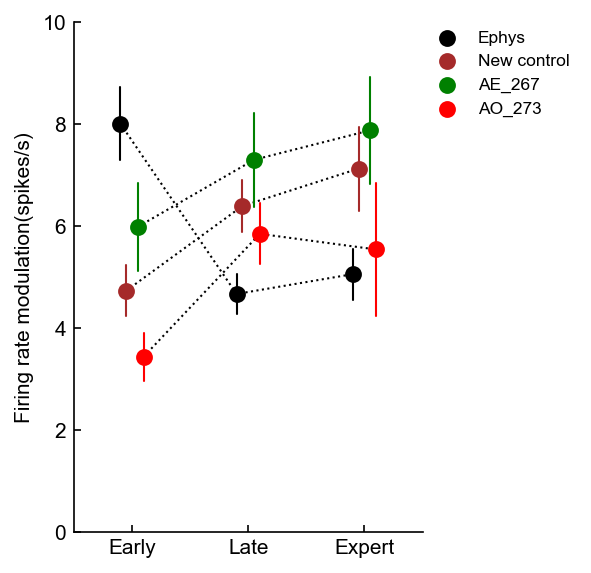

In [81]:
#Firing rate modulation graphs
size=5

labels = ['Early','Late','Expert']
numCon = 3
offset_distance = 0.05

fig, ax = plt.subplots(figsize=(3,4.5)) #5/3 with height of 4.5


data = [FRmod_postearly_Ephys,FRmod_postlate_Ephys,FRmod_postexpert_Ephys]
data = [ilep.rmnan(d) for d in data]
#Plot summary
colmaxes = [np.nan]*6
for idx,column in enumerate(data):
    border_color = 'k'#PHASE_COLORS[idx+3]
    eye_color = border_color#'white'
    summary_size=50
    summary_width=1
    
    #Q1, median, Q3 = (np.percentile(column, q) for q in [25, 50, 75])
    median = np.mean(column)
    Q1 = median - sem(column)
    Q3 = median + sem(column)
    colmaxes[idx] = Q3
    
    ax.scatter([idx-2*offset_distance], [median], ec=border_color,fc=eye_color, s=summary_size,lw=summary_width, zorder=10)
    ax.plot([idx-2*offset_distance, idx-2*offset_distance], [Q1, Q3], c=border_color, lw=summary_width, zorder=9, solid_capstyle='round')
    
medians = [np.mean(col) for col in data]
plt.plot(np.linspace(0,2,3)-2*offset_distance,medians[0:3],color='k',linestyle=':',lw=1)
#plt.plot(np.linspace(3,5,3)+offset_distance,medians[3:6],color='k',linestyle=':',lw=1)
    
######################################################################################################################################################
data = [FRmod_postearly_Newcontrol,FRmod_postlate_Newcontrol,FRmod_postexpert_Newcontrol]
data = [ilep.rmnan(d) for d in data]

#Plot summary
passive_colmaxes = [np.nan]*6
for idx,column in enumerate(data):
    border_color='brown'
    eye_color=border_color#'white'

    summary_size=50
    summary_width=1
    
    #Q1, median, Q3 = (np.percentile(column, q) for q in [25, 50, 75])
    median = np.mean(column)
    Q1 = median - sem(column)
    Q3 = median + sem(column)
    passive_colmaxes[idx] = Q3
    
    ax.scatter([idx-offset_distance], [median], ec=border_color,fc=eye_color, s=summary_size,lw=summary_width, zorder=10,marker='o')
    ax.plot([idx-offset_distance, idx-offset_distance], [Q1, Q3], c=border_color, lw=summary_width, zorder=9, solid_capstyle='round')
    
medians = [np.mean(col) for col in data]
plt.plot(np.linspace(0,2,3)-offset_distance,medians[0:3],color='k',linestyle=':',lw=1)
#plt.plot(np.linspace(3,5,3)-offset_distance,medians[3:6],color='k',linestyle=':',lw=1)

######################################################################################################################################################
data = [FRmod_postearly_267,FRmod_postlate_267,FRmod_postexpert_267]
data = [ilep.rmnan(d) for d in data]

#Plot summary
passive_colmaxes = [np.nan]*6
for idx,column in enumerate(data):
    border_color='green'
    eye_color=border_color#'white'

    summary_size=50
    summary_width=1
    
    #Q1, median, Q3 = (np.percentile(column, q) for q in [25, 50, 75])
    median = np.mean(column)
    Q1 = median - sem(column)
    Q3 = median + sem(column)
    passive_colmaxes[idx] = Q3
    
    ax.scatter([idx+offset_distance], [median], ec=border_color,fc=eye_color, s=summary_size,lw=summary_width, zorder=10,marker='o')
    ax.plot([idx+offset_distance, idx+offset_distance], [Q1, Q3], c=border_color, lw=summary_width, zorder=9, solid_capstyle='round')
    
medians = [np.mean(col) for col in data]
plt.plot(np.linspace(0,2,3)+offset_distance,medians[0:3],color='k',linestyle=':',lw=1)
#plt.plot(np.linspace(3,5,3)-offset_distance,medians[3:6],color='k',linestyle=':',lw=1)

######################################################################################################################################################
data = [FRmod_postearly_273,FRmod_postlate_273,FRmod_postexpert_273]
data = [ilep.rmnan(d) for d in data]

#Plot summary
passive_colmaxes = [np.nan]*6
for idx,column in enumerate(data):
    border_color='red'
    eye_color=border_color#'white'

    summary_size=50
    summary_width=1
    
    #Q1, median, Q3 = (np.percentile(column, q) for q in [25, 50, 75])
    median = np.mean(column)
    Q1 = median - sem(column)
    Q3 = median + sem(column)
    passive_colmaxes[idx] = Q3
    
    ax.scatter([idx+2*offset_distance], [median], ec=border_color,fc=eye_color, s=summary_size,lw=summary_width, zorder=10,marker='o')
    ax.plot([idx+2*offset_distance, idx+2*offset_distance], [Q1, Q3], c=border_color, lw=summary_width, zorder=9, solid_capstyle='round')
    
medians = [np.mean(col) for col in data]
plt.plot(np.linspace(0,2,3)+2*offset_distance,medians[0:3],color='k',linestyle=':',lw=1)
#plt.plot(np.linspace(3,5,3)-offset_distance,medians[3:6],color='k',linestyle=':',lw=1)












######################################################################################################################################################


ax.set_ylim([0,10])
#ax.set_yticks([4,5,6,7,8,9,10,11])
#ax.set_yticklabels([4,5,6,7,8,9,10,11])
ax.set_ylabel('Firing rate modulation(spikes/s)')

ax.set_xlim(ax.get_xlim())
ax.set_xlim([-0.5,2.5])
ax.set_xticks(range(numCon))
ax.set_xticklabels(labels)


# ax.axvline(2.5,color=SWITCH_COLOR,linestyle='--',zorder=-10,lw=1)
# ax.text(2.5,ax.get_ylim()[1],'Reversal',color=SWITCH_COLOR,horizontalalignment='center',verticalalignment='bottom')

# ax.scatter([],[],ec='grey',fc='white',s=summary_size,lw=summary_width,zorder=10,marker='o',label='passive')
# ax.scatter([],[],ec='grey',fc='grey',s=summary_size,lw=summary_width,zorder=10,marker='o',label='behaving')
# lgd = ax.legend(frameon=False,loc=(0.6,0.1))
    
ax.scatter([],[],c='k',s=summary_size,lw=summary_width,label='Ephys')
ax.scatter([],[],c='brown',s=summary_size,lw=summary_width,label='New control')
ax.scatter([],[],c='green',s=summary_size,lw=summary_width,label='AE_267')
ax.scatter([],[],c='red',s=summary_size,lw=summary_width,label='AO_273')
lgd = ax.legend(frameon=False,loc=(1,0.8))

#statistics
# ax.text(1,10,str('*'),verticalalignment='top',horizontalalignment='center')
# ax.text(4,10,str('****'),verticalalignment='top',horizontalalignment='center')
# ax.text(5,10,str('****'),verticalalignment='top',horizontalalignment='center')
#ax.text(-0.4,9.5,'CR',color=CR_COLOR,horizontalalignment='left',verticalalignment='top')
#ax.text(-0.4,0.5,'NCR',color=NCR_COLOR,horizontalalignment='left',verticalalignment='bottom')
# statsbar(ax,10,[1-offset_distance,1+offset_distance],stemheights=[passive_colmaxes[1] , colmaxes[1]],text='*',lw=0.5)
# statsbar(ax,10,[4-offset_distance,4+offset_distance],stemheights=[passive_colmaxes[4] , colmaxes[4]],text='****',lw=0.5)
# statsbar(ax,10,[5-offset_distance,5+offset_distance],stemheights=[passive_colmaxes[5] , colmaxes[5]],text='****',lw=0.5)

fig.savefig(os.path.join('D:\\\\Figures','Manuscript Figures','AC Opsin Mean of FRmodulation over learning controls V'+str(current_version)+'.pdf'),transparent=False,facecolor="white", bbox_extra_artists=(lgd,), bbox_inches='tight')

In [88]:
phase = len(FRmod_postearly_Ephys)*["early_new"] + len(FRmod_postearly_Newcontrol)*["early_new"] \
    + len(FRmod_postearly_Ephys)*["early_267"] + len(FRmod_postearly_267)*["early_267"] \
    + len(FRmod_postearly_Ephys)*["early_273"] + len(FRmod_postearly_273)*["early_273"] \
    + len(FRmod_postlate_Ephys)*["late_new"] + len(FRmod_postlate_Newcontrol)*["late_new"] \
    + len(FRmod_postlate_Ephys)*["late_267"] + len(FRmod_postlate_267)*["late_267"] \
    + len(FRmod_postlate_Ephys)*["late_273"] + len(FRmod_postlate_273)*["late_273"] \
    + len(FRmod_postexpert_Ephys)*["expert_new"] + len(FRmod_postexpert_Newcontrol)*["expert_new"] \
    + len(FRmod_postexpert_Ephys)*["expert_267"] + len(FRmod_postexpert_267)*["expert_267"] \
    + len(FRmod_postexpert_Ephys)*["expert_273"] + len(FRmod_postexpert_273)*["expert_273"] \

context = len(FRmod_postearly_Ephys)*["Ephys"] + len(FRmod_postearly_Newcontrol)*["New"] \
    + len(FRmod_postearly_Ephys)*["Ephys"] + len(FRmod_postearly_267)*["New"] \
    + len(FRmod_postearly_Ephys)*["Ephys"] + len(FRmod_postearly_273)*["New"] \
    + len(FRmod_postlate_Ephys)*["Ephys"] + len(FRmod_postlate_Newcontrol)*["New"] \
    + len(FRmod_postlate_Ephys)*["Ephys"] + len(FRmod_postlate_267)*["New"] \
    + len(FRmod_postlate_Ephys)*["Ephys"] + len(FRmod_postlate_273)*["New"] \
    + len(FRmod_postexpert_Ephys)*["Ephys"] + len(FRmod_postexpert_Newcontrol)*["New"] \
    + len(FRmod_postexpert_Ephys)*["Ephys"] + len(FRmod_postexpert_267)*["New"] \
    + len(FRmod_postexpert_Ephys)*["Ephys"] + len(FRmod_postexpert_273)*["New"] \

mod = (np.concatenate([FRmod_postearly_Ephys, FRmod_postearly_Newcontrol,
    FRmod_postearly_Ephys, FRmod_postearly_267,
    FRmod_postearly_Ephys, FRmod_postearly_273,
    FRmod_postlate_Ephys, FRmod_postlate_Newcontrol,
    FRmod_postlate_Ephys, FRmod_postlate_267,
    FRmod_postlate_Ephys, FRmod_postlate_273,
    FRmod_postexpert_Ephys, FRmod_postexpert_Newcontrol,
    FRmod_postexpert_Ephys, FRmod_postexpert_267,                   
    FRmod_postexpert_Ephys, FRmod_postexpert_273]))

df = pd.DataFrame({"phase": phase, "context": context, "FR_mod": mod})


### Anova ###
anova = pg.anova(data=df, dv='FR_mod', between=['phase','context'], detailed=True)
print(anova)
print()

### Create and print results ###
pairwise_mwu = pg.pairwise_tests(data=df, dv='FR_mod', between=['phase','context'], padjust="fdr_bh", parametric=False, )
print(pairwise_mwu[pairwise_mwu["Contrast"] == "phase * context"][["phase","A", "B", "p-unc", "p-corr", "hedges"]])

            Source             SS      DF          MS         F         p-unc  \
0            phase    2429.884074     8.0  303.735509  3.032061  2.116711e-03   
1          context      11.723372     1.0   11.723372  0.117029  7.322956e-01   
2  phase * context    6403.351220     8.0  800.418903  7.990238  9.550761e-11   
3         Residual  434357.080228  4336.0  100.174603       NaN           NaN   

        np2  
0  0.005563  
1  0.000027  
2  0.014528  
3       NaN  

         phase      A    B     p-unc    p-corr    hedges
37   early_267  Ephys  New  0.078823  0.088676  0.161766
38   early_273  Ephys  New  0.000002  0.000022  0.387725
39   early_new  Ephys  New  0.000052  0.000233  0.287140
40  expert_267  Ephys  New  0.001575  0.004724 -0.279094
41  expert_273  Ephys  New  0.588255  0.588255 -0.054722
42  expert_new  Ephys  New  0.031406  0.047109 -0.202046
43    late_267  Ephys  New  0.010119  0.019954 -0.330491
44    late_273  Ephys  New  0.078344  0.088676 -0.155998
45    late

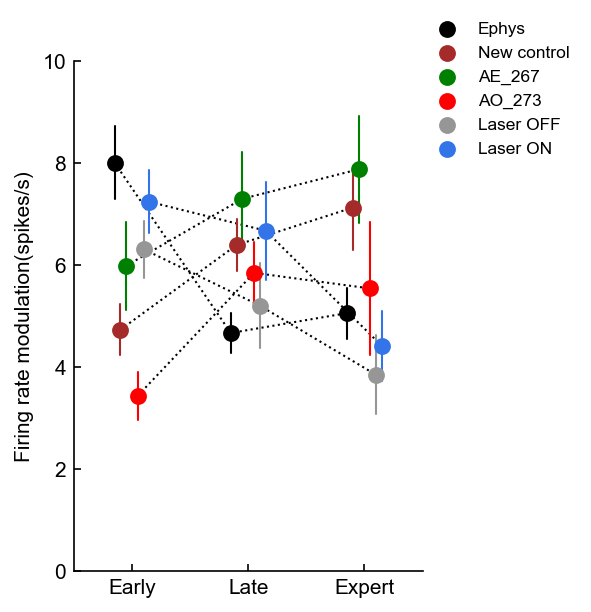

In [84]:
#Firing rate modulation graphs
size=5

labels = ['Early','Late','Expert']
numCon = 3
offset_distance = 0.05

fig, ax = plt.subplots(figsize=(3,4.5)) #5/3 with height of 4.5


data = [FRmod_postearly_Ephys,FRmod_postlate_Ephys,FRmod_postexpert_Ephys]
data = [ilep.rmnan(d) for d in data]
#Plot summary
colmaxes = [np.nan]*6
for idx,column in enumerate(data):
    border_color = 'k'#PHASE_COLORS[idx+3]
    eye_color = border_color#'white'
    summary_size=50
    summary_width=1
    
    #Q1, median, Q3 = (np.percentile(column, q) for q in [25, 50, 75])
    median = np.mean(column)
    Q1 = median - sem(column)
    Q3 = median + sem(column)
    colmaxes[idx] = Q3
    
    ax.scatter([idx-3*offset_distance], [median], ec=border_color,fc=eye_color, s=summary_size,lw=summary_width, zorder=10)
    ax.plot([idx-3*offset_distance, idx-3*offset_distance], [Q1, Q3], c=border_color, lw=summary_width, zorder=9, solid_capstyle='round')
    
medians = [np.mean(col) for col in data]
plt.plot(np.linspace(0,2,3)-3*offset_distance,medians[0:3],color='k',linestyle=':',lw=1)
#plt.plot(np.linspace(3,5,3)+offset_distance,medians[3:6],color='k',linestyle=':',lw=1)
    
######################################################################################################################################################
data = [FRmod_postearly_Newcontrol,FRmod_postlate_Newcontrol,FRmod_postexpert_Newcontrol]
data = [ilep.rmnan(d) for d in data]

#Plot summary
passive_colmaxes = [np.nan]*6
for idx,column in enumerate(data):
    border_color='brown'
    eye_color=border_color#'white'

    summary_size=50
    summary_width=1
    
    #Q1, median, Q3 = (np.percentile(column, q) for q in [25, 50, 75])
    median = np.mean(column)
    Q1 = median - sem(column)
    Q3 = median + sem(column)
    passive_colmaxes[idx] = Q3
    
    ax.scatter([idx-2*offset_distance], [median], ec=border_color,fc=eye_color, s=summary_size,lw=summary_width, zorder=10,marker='o')
    ax.plot([idx-2*offset_distance, idx-2*offset_distance], [Q1, Q3], c=border_color, lw=summary_width, zorder=9, solid_capstyle='round')
    
medians = [np.mean(col) for col in data]
plt.plot(np.linspace(0,2,3)-2*offset_distance,medians[0:3],color='k',linestyle=':',lw=1)
#plt.plot(np.linspace(3,5,3)-offset_distance,medians[3:6],color='k',linestyle=':',lw=1)

######################################################################################################################################################
data = [FRmod_postearly_267,FRmod_postlate_267,FRmod_postexpert_267]
data = [ilep.rmnan(d) for d in data]

#Plot summary
passive_colmaxes = [np.nan]*6
for idx,column in enumerate(data):
    border_color='green'
    eye_color=border_color#'white'

    summary_size=50
    summary_width=1
    
    #Q1, median, Q3 = (np.percentile(column, q) for q in [25, 50, 75])
    median = np.mean(column)
    Q1 = median - sem(column)
    Q3 = median + sem(column)
    passive_colmaxes[idx] = Q3
    
    ax.scatter([idx-offset_distance], [median], ec=border_color,fc=eye_color, s=summary_size,lw=summary_width, zorder=10,marker='o')
    ax.plot([idx-offset_distance, idx-offset_distance], [Q1, Q3], c=border_color, lw=summary_width, zorder=9, solid_capstyle='round')
    
medians = [np.mean(col) for col in data]
plt.plot(np.linspace(0,2,3)-offset_distance,medians[0:3],color='k',linestyle=':',lw=1)
#plt.plot(np.linspace(3,5,3)-offset_distance,medians[3:6],color='k',linestyle=':',lw=1)

######################################################################################################################################################
data = [FRmod_postearly_273,FRmod_postlate_273,FRmod_postexpert_273]
data = [ilep.rmnan(d) for d in data]

#Plot summary
passive_colmaxes = [np.nan]*6
for idx,column in enumerate(data):
    border_color='red'
    eye_color=border_color#'white'

    summary_size=50
    summary_width=1
    
    #Q1, median, Q3 = (np.percentile(column, q) for q in [25, 50, 75])
    median = np.mean(column)
    Q1 = median - sem(column)
    Q3 = median + sem(column)
    passive_colmaxes[idx] = Q3
    
    ax.scatter([idx+1*offset_distance], [median], ec=border_color,fc=eye_color, s=summary_size,lw=summary_width, zorder=10,marker='o')
    ax.plot([idx+1*offset_distance, idx+1*offset_distance], [Q1, Q3], c=border_color, lw=summary_width, zorder=9, solid_capstyle='round')
    
medians = [np.mean(col) for col in data]
plt.plot(np.linspace(0,2,3)+1*offset_distance,medians[0:3],color='k',linestyle=':',lw=1)
#plt.plot(np.linspace(3,5,3)-offset_distance,medians[3:6],color='k',linestyle=':',lw=1)

######################################################################################################################################################
Off_data = [FRmod_postearly_Ops_Off,FRmod_postlate_Ops_Off,FRmod_postexpert_Ops_Off]
Off_data = [ilep.rmnan(d) for d in Off_data]

#Plot summary
passive_colmaxes = [np.nan]*6
for idx,column in enumerate(Off_data):
    border_color=GOOD_GREY
    eye_color=border_color#'white'

    summary_size=50
    summary_width=1
    
    #Q1, median, Q3 = (np.percentile(column, q) for q in [25, 50, 75])
    median = np.mean(column)
    Q1 = median - sem(column)
    Q3 = median + sem(column)
    passive_colmaxes[idx] = Q3
    
    ax.scatter([idx+2*offset_distance], [median], ec=border_color,fc=eye_color, s=summary_size,lw=summary_width, zorder=10,marker='o')
    ax.plot([idx+2*offset_distance, idx+2*offset_distance], [Q1, Q3], c=border_color, lw=summary_width, zorder=9, solid_capstyle='round')
    
medians = [np.mean(col) for col in Off_data]
plt.plot(np.linspace(0,2,3)+2*offset_distance,medians[0:3],color='k',linestyle=':',lw=1)
#plt.plot(np.linspace(3,5,3)-offset_distance,medians[3:6],color='k',linestyle=':',lw=1)

######################################################################################################################################################
On_data = [FRmod_postearly_Ops_On,FRmod_postlate_Ops_On,FRmod_postexpert_Ops_On]
On_data = [ilep.rmnan(d) for d in On_data]

#Plot summary
passive_colmaxes = [np.nan]*6
for idx,column in enumerate(On_data):
    border_color=LASER_COLOR
    eye_color=border_color#'white'

    summary_size=50
    summary_width=1
    
    #Q1, median, Q3 = (np.percentile(column, q) for q in [25, 50, 75])
    median = np.mean(column)
    Q1 = median - sem(column)
    Q3 = median + sem(column)
    passive_colmaxes[idx] = Q3
    
    ax.scatter([idx+3*offset_distance], [median], ec=border_color,fc=eye_color, s=summary_size,lw=summary_width, zorder=10,marker='o')
    ax.plot([idx+3*offset_distance, idx+3*offset_distance], [Q1, Q3], c=border_color, lw=summary_width, zorder=9, solid_capstyle='round')
    
medians = [np.mean(col) for col in On_data]
plt.plot(np.linspace(0,2,3)+3*offset_distance,medians[0:3],color='k',linestyle=':',lw=1)
#plt.plot(np.linspace(3,5,3)-offset_distance,medians[3:6],color='k',linestyle=':',lw=1)










######################################################################################################################################################


ax.set_ylim([0,10])
#ax.set_yticks([4,5,6,7,8,9,10,11])
#ax.set_yticklabels([4,5,6,7,8,9,10,11])
ax.set_ylabel('Firing rate modulation(spikes/s)')

ax.set_xlim(ax.get_xlim())
ax.set_xlim([-0.5,2.5])
ax.set_xticks(range(numCon))
ax.set_xticklabels(labels)


# ax.axvline(2.5,color=SWITCH_COLOR,linestyle='--',zorder=-10,lw=1)
# ax.text(2.5,ax.get_ylim()[1],'Reversal',color=SWITCH_COLOR,horizontalalignment='center',verticalalignment='bottom')

# ax.scatter([],[],ec='grey',fc='white',s=summary_size,lw=summary_width,zorder=10,marker='o',label='passive')
# ax.scatter([],[],ec='grey',fc='grey',s=summary_size,lw=summary_width,zorder=10,marker='o',label='behaving')
# lgd = ax.legend(frameon=False,loc=(0.6,0.1))
    
ax.scatter([],[],c='k',s=summary_size,lw=summary_width,label='Ephys')
ax.scatter([],[],c='brown',s=summary_size,lw=summary_width,label='New control')
ax.scatter([],[],c='green',s=summary_size,lw=summary_width,label='AE_267')
ax.scatter([],[],c='red',s=summary_size,lw=summary_width,label='AO_273')
ax.scatter([],[],c=GOOD_GREY,s=summary_size,lw=summary_width,label='Laser OFF')
ax.scatter([],[],c=LASER_COLOR,s=summary_size,lw=summary_width,label='Laser ON')
lgd = ax.legend(frameon=False,loc=(1,0.8))

#statistics
# ax.text(1,10,str('*'),verticalalignment='top',horizontalalignment='center')
# ax.text(4,10,str('****'),verticalalignment='top',horizontalalignment='center')
# ax.text(5,10,str('****'),verticalalignment='top',horizontalalignment='center')
#ax.text(-0.4,9.5,'CR',color=CR_COLOR,horizontalalignment='left',verticalalignment='top')
#ax.text(-0.4,0.5,'NCR',color=NCR_COLOR,horizontalalignment='left',verticalalignment='bottom')
# statsbar(ax,10,[1-offset_distance,1+offset_distance],stemheights=[passive_colmaxes[1] , colmaxes[1]],text='*',lw=0.5)
# statsbar(ax,10,[4-offset_distance,4+offset_distance],stemheights=[passive_colmaxes[4] , colmaxes[4]],text='****',lw=0.5)
# statsbar(ax,10,[5-offset_distance,5+offset_distance],stemheights=[passive_colmaxes[5] , colmaxes[5]],text='****',lw=0.5)

fig.savefig(os.path.join('D:\\\\Figures','Manuscript Figures','AC Opsin Mean of FRmodulation over learning controls vs on V'+str(current_version)+'.pdf'),transparent=False,facecolor="white", bbox_extra_artists=(lgd,), bbox_inches='tight')

In [87]:
phase = len(FRmod_postearly_Ops_On)*["early_ephys"] + len(FRmod_postearly_Ephys)*["early_ephys"] \
    + len(FRmod_postearly_Ops_On)*["early_new"] + len(FRmod_postearly_Newcontrol)*["early_new"] \
    + len(FRmod_postearly_Ops_On)*["early_267"] + len(FRmod_postearly_267)*["early_267"] \
    + len(FRmod_postearly_Ops_On)*["early_273"] + len(FRmod_postearly_273)*["early_273"] \
    + len(FRmod_postearly_Ops_On)*["early_off"] + len(FRmod_postearly_Ops_Off)*["early_off"] \
    + len(FRmod_postlate_Ops_On)*["late_ephys"] + len(FRmod_postlate_Ephys)*["late_ephys"] \
    + len(FRmod_postlate_Ops_On)*["late_new"] + len(FRmod_postlate_Newcontrol)*["late_new"] \
    + len(FRmod_postlate_Ops_On)*["late_267"] + len(FRmod_postlate_267)*["late_267"] \
    + len(FRmod_postlate_Ops_On)*["late_273"] + len(FRmod_postlate_273)*["late_273"] \
    + len(FRmod_postlate_Ops_On)*["late_off"] + len(FRmod_postlate_Ops_Off)*["late_off"] \
    + len(FRmod_postexpert_Ops_On)*["expert_ephys"] + len(FRmod_postexpert_Ephys)*["expert_ephys"] \
    + len(FRmod_postexpert_Ops_On)*["expert_new"] + len(FRmod_postexpert_Newcontrol)*["expert_new"] \
    + len(FRmod_postexpert_Ops_On)*["expert_267"] + len(FRmod_postexpert_267)*["expert_267"] \
    + len(FRmod_postexpert_Ops_On)*["expert_273"] + len(FRmod_postexpert_273)*["expert_273"] \
    + len(FRmod_postexpert_Ops_On)*["expert_off"] + len(FRmod_postexpert_Ops_Off)*["expert_off"] \

context = len(FRmod_postearly_Ops_On)*["Ephys"] + len(FRmod_postearly_Ephys)*["New"] \
    + len(FRmod_postearly_Ops_On)*["Ephys"] + len(FRmod_postearly_Newcontrol)*["New"] \
    + len(FRmod_postearly_Ops_On)*["Ephys"] + len(FRmod_postearly_267)*["New"] \
    + len(FRmod_postearly_Ops_On)*["Ephys"] + len(FRmod_postearly_273)*["New"] \
    + len(FRmod_postearly_Ops_On)*["Ephys"] + len(FRmod_postearly_Ops_Off)*["New"] \
    + len(FRmod_postlate_Ops_On)*["Ephys"] + len(FRmod_postlate_Ephys)*["New"] \
    + len(FRmod_postlate_Ops_On)*["Ephys"] + len(FRmod_postlate_Newcontrol)*["New"] \
    + len(FRmod_postlate_Ops_On)*["Ephys"] + len(FRmod_postlate_267)*["New"] \
    + len(FRmod_postlate_Ops_On)*["Ephys"] + len(FRmod_postlate_273)*["New"] \
    + len(FRmod_postlate_Ops_On)*["Ephys"] + len(FRmod_postlate_Ops_Off)*["New"] \
    + len(FRmod_postexpert_Ops_On)*["Ephys"] + len(FRmod_postexpert_Ephys)*["New"] \
    + len(FRmod_postexpert_Ops_On)*["Ephys"] + len(FRmod_postexpert_Newcontrol)*["New"] \
    + len(FRmod_postexpert_Ops_On)*["Ephys"] + len(FRmod_postexpert_267)*["New"] \
    + len(FRmod_postexpert_Ops_On)*["Ephys"] + len(FRmod_postexpert_273)*["New"] \
    + len(FRmod_postexpert_Ops_On)*["Ephys"] + len(FRmod_postexpert_Ops_Off)*["New"] \

mod = (np.concatenate([FRmod_postearly_Ops_On, FRmod_postearly_Ephys,
    FRmod_postearly_Ops_On, FRmod_postearly_Newcontrol,
    FRmod_postearly_Ops_On, FRmod_postearly_267,
    FRmod_postearly_Ops_On, FRmod_postearly_273,
    FRmod_postearly_Ops_On, FRmod_postearly_Ops_Off,
    FRmod_postlate_Ops_On, FRmod_postlate_Ephys,
    FRmod_postlate_Ops_On, FRmod_postlate_Newcontrol,
    FRmod_postlate_Ops_On, FRmod_postlate_267,
    FRmod_postlate_Ops_On, FRmod_postlate_273,
    FRmod_postlate_Ops_On, FRmod_postlate_Ops_Off,
    FRmod_postexpert_Ops_On, FRmod_postexpert_Ephys,
    FRmod_postexpert_Ops_On, FRmod_postexpert_Newcontrol,
    FRmod_postexpert_Ops_On, FRmod_postexpert_267,                   
    FRmod_postexpert_Ops_On, FRmod_postexpert_273,                   
    FRmod_postexpert_Ops_On, FRmod_postexpert_Ops_Off]))

df = pd.DataFrame({"phase": phase, "context": context, "FR_mod": mod})


### Anova ###
anova = pg.anova(data=df, dv='FR_mod', between=['phase','context'], detailed=True)
print(anova)
print()

### Create and print results ###
pairwise_mwu = pg.pairwise_tests(data=df, dv='FR_mod', between=['phase','context'], padjust="fdr_bh", parametric=False, )
print(pairwise_mwu[pairwise_mwu["Contrast"] == "phase * context"][["phase","A", "B", "p-unc", "p-corr", "hedges"]])

            Source             SS      DF          MS         F     p-unc  \
0            phase    4725.373495    14.0  337.526678  2.892142  0.000221   
1          context     305.148867     1.0  305.148867  2.614709  0.105926   
2  phase * context    4635.945368    14.0  331.138955  2.837408  0.000290   
3         Residual  757880.469530  6494.0  116.704723       NaN       NaN   

        np2  
0  0.006196  
1  0.000402  
2  0.006080  
3       NaN  

            phase      A    B         p-unc        p-corr    hedges
106     early_267  Ephys  New  9.793581e-03  2.098624e-02  0.103708
107     early_273  Ephys  New  6.792258e-10  1.018839e-08  0.331737
108   early_ephys  Ephys  New  4.120437e-01  4.754351e-01 -0.059096
109     early_new  Ephys  New  2.637365e-08  1.978024e-07  0.224297
110     early_off  Ephys  New  8.433411e-04  3.162529e-03  0.076482
111    expert_267  Ephys  New  1.279754e-03  3.839263e-03 -0.321053
112    expert_273  Ephys  New  8.497512e-01  8.497512e-01 -0.124325

baseline = 3.5


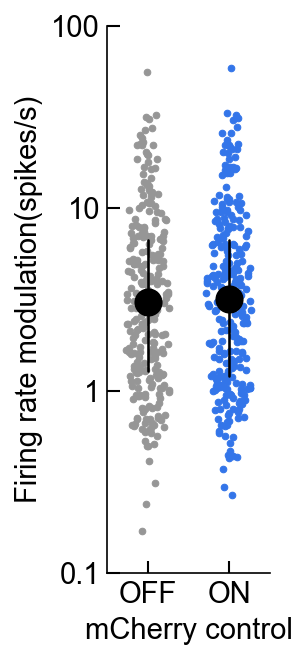

In [56]:
#Firing rate modulation graphs
size=10

FRmod_baseline_median = 3.5#np.median(FRmod_preearly)
print('baseline = '+str(FRmod_baseline_median))

fig, ax = plt.subplots(figsize=(2,4.5))
data_on = np.concatenate([FRmod_postearly_Control_on,FRmod_postlate_Control_on,FRmod_postexpert_Control_on])
data_off = np.concatenate([FRmod_postearly_Control_off,FRmod_postlate_Control_off,FRmod_postexpert_Control_off])
labels = ['OFF','ON']
numCon = 2

wid = 0.75
widsc = wid/1.75#*1.125


X = np.ones_like(data_off)*0
_,Y = ilep.violin(X,data_off,width=wid,minjitter=0.075)
X,_ = ilep.violin(X,np.log10(data_off),width=wid,minjitter=0.075)
#X -= widsc
ax.scatter(X, Y, s=size, c=GOOD_GREY, lw=0.5,zorder=-10,label='Laser OFF')

X = np.ones_like(data_on)*1
_,Y = ilep.violin(X,data_on,width=wid,minjitter=0.075)
X,_ = ilep.violin(X,np.log10(data_on),width=wid,minjitter=0.075)
#X += widsc
ax.scatter(X, Y, s=size, c=LASER_COLOR, lw=0.5,zorder=-10,label='Laser ON')

ax.set_yscale('log',subs=[])



column = data_off
column = ilep.rmnan(column)
percentCR = np.nanmean(np.greater(column,FRmod_baseline_median))*100
eye_color= 'k'#NCR_CR_cmap((percentCR-40)/20)
border_color = 'k'#eye_color

summary_size=150
summary_width=1.25

Q1, median, Q3 = (np.percentile(column, q) for q in [25, 50, 75])
ax.scatter([0], [median], ec=border_color,fc=eye_color, s=summary_size,lw=summary_width, zorder=10)
ax.plot([0,0],[Q1, Q3], c=border_color, lw=summary_width, zorder=9, solid_capstyle='round')



column = data_on
column = ilep.rmnan(column)
percentCR = np.nanmean(np.greater(column,FRmod_baseline_median))*100
eye_color= 'k'#NCR_CR_cmap((percentCR-40)/20)
border_color = 'k'#eye_color

summary_size=150
summary_width=1.25

Q1, median, Q3 = (np.percentile(column, q) for q in [25, 50, 75])
ax.scatter([1], [median], ec=border_color,fc=eye_color, s=summary_size,lw=summary_width, zorder=10)
ax.plot([1,1],[Q1, Q3], c=border_color, lw=summary_width, zorder=9, solid_capstyle='round')






    
ax.tick_params(direction='in', length=6, width=1)
    
#Connected lines
# medians = [np.nanmedian(d) for d in data]
# ax.plot([0,1,2],medians[0:3],linestyle='--',color=GOOD_GREY,lw=1)
# ax.plot([3,4,5],medians[3:6],linestyle='--',color=GOOD_GREY,lw=1)

ax.set_ylim([0.1,100])
ax.set_yticks([0.1,1,10,100])
ax.set_yticklabels(['0.1','1','10','100'],fontsize=14)
ax.set_ylabel('Firing rate modulation(spikes/s)',fontsize=14)

ax.set_xlim([-0.5,1.5])
ax.set_xticks(range(numCon))
ax.set_xticklabels(labels,fontsize=14)
ax.set_xlim(ax.get_xlim())
ax.set_xlabel('mCherry control',fontsize=14)

#ax.legend(frameon=False,loc=(1,0.8))

# ax.fill_between(ax.get_xlim(),[ax.get_ylim()[0]]*2,[ax.get_ylim()[1]]*2,color='white',alpha=0.6,zorder=-5)

# xtick_pos_pre = ax.get_xticks()[1]
# xtick_pos_post = ax.get_xticks()[4]
# ax.text(xtick_pos_pre, 0.054188468134356925, 'Pre-rev', ha='center', va='top', fontsize=12,color='k')
# ax.text(xtick_pos_post, 0.054188468134356925, 'Post-rev', ha='center', va='top',  fontsize=12,color='k')
# ax.annotate('', xy=(0.03, -0.07), xycoords='axes fraction', xytext=(0.49, -0.07),arrowprops=dict(arrowstyle='-', color='k'))
# ax.annotate('', xy=(0.53, -0.07), xycoords='axes fraction', xytext=(0.99, -0.07),arrowprops=dict(arrowstyle='-', color='k'))

plt.tight_layout()
fig.savefig(os.path.join('D:\\\\Figures','Manuscript Figures','AC Opsin mcherry control modulation on off V'+str(current_version)+'.pdf'),transparent=False,facecolor="white")

In [19]:
wilcoxon(data_on,data_off)

WilcoxonResult(statistic=16490.0, pvalue=0.26799000997571687)

In [26]:
animal_days = dict()
for animal in did_not_learn_animals:
    animal_days[animal] = 0

for animal in tqdm(did_not_learn_animals):
    for session in os.listdir(ops_directory):
        sessionfile = ilep.loadSessionCached(ops_directory,session)
        if not sessionfile.meta.animal == animal:
            continue
        if hasattr(animalBehaviors[sessionfile.meta.animal],'cloudiness') and sessionfile.meta.day_of_training >= animalBehaviors[sessionfile.meta.animal].cloudiness:
            continue
            
        animal_days[animal] = max(animal_days[animal],sessionfile.meta.day_of_training)

100%|██████████| 7/7 [00:17<00:00,  2.45s/it]


In [27]:
animal_days

{'BS_86': 19,
 'BS_119': 15,
 'BS_123': 15,
 'BS_128': 13,
 'BS_131': 21,
 'BS_163': 14,
 'BS_174': 23}

In [25]:
animal_days

{'BS_86': 24,
 'BS_119': 15,
 'BS_123': 20,
 'BS_128': 14,
 'BS_131': 21,
 'BS_163': 14,
 'BS_174': 23}

## Fig 4 Figures

In [16]:
animals_in_cache = []

EnumOpsSession = []
EnumOpsClust = []

for session in tqdm(os.listdir(ops_directory)):
    
    if session in ['BS_174_5_opto_AC.pickle']:     #This session excluded due to excessive gliosis (prevented recording the two days prior. Retired immediately after)
        print(sessionfile.meta.day_of_training)
        print(sessionfile.meta.date)
        continue
    
    sessionfile = ilep.loadSessionCached(ops_directory,session)
            
    if sessionfile.meta.animal not in did_not_learn_animals:
        continue
#     if sessionfile.meta.animal not in no_cloudy_animals:
#         continue
    
    if hasattr(animalBehaviors[sessionfile.meta.animal],'cloudiness') and sessionfile.meta.day_of_training >= animalBehaviors[sessionfile.meta.animal].cloudiness:
        continue
    
    animals_in_cache.append(sessionfile.meta.animal)
    
    for clust in sessionfile.clusters.good:
        if sessionfile.meta.region == "AC":
            EnumOpsSession.append(session)
            EnumOpsClust.append(clust)
        
animals_in_cache = np.unique(animals_in_cache)

 83%|████████▎ | 138/167 [00:02<00:00, 94.20it/s]

16
9/22/2022


100%|██████████| 167/167 [00:02<00:00, 61.20it/s]


In [17]:
stim_25s_df = pd.read_csv(stim25sdecodingfilename)
passive_df = pd.read_csv(passivedecodingfilename)
choice_df = pd.read_csv(choicedecodingfilename)
# opsin_df = pd.read_csv(opsindecodingfilename)
opsinon_df = pd.read_csv(opsinondecodingfilename)
dec_df = pd.concat([stim_25s_df,choice_df,passive_df,opsinon_df])

def getDataPoint(df,session,clust,categories,column):
    df = df[df['session']==session]
    df = df[df['clust']==clust]
    df = df[df['categories']==categories]
    val = list(df[column])
    if len(val) == 1:
        return val[0]
    elif len(val) <= 0:
        return np.nan
    else:
        raise Exception('Incorrent length. Duplicate values')
        
stim_acc = []
stim_acc_s = []
choice_acc_s = []
pval_stim_s = []
for idx,(session,clust) in tqdm(enumerate(zip(EnumSessionOps,EnumClustOps))):
    stim_accuracy = getDataPoint(dec_df,session,clust,'stimulus_on','weighted_accuracy')
    pvalue_stim_s = getDataPoint(dec_df,session,clust,'stimulus_on','pval_synthetic_control')
    stim_acc.append(stim_accuracy)
    pval_stim_s.append(pvalue_stim_s)
stim_acc = np.array(stim_acc)
pval_stim_s = np.array(pval_stim_s)

def get_TE_mask(acc,pval_s,pval_c):
    low_decoders = np.less(acc,0.5)
    low_accuracies = acc[low_decoders]
    low_magnitudes = np.absolute(low_accuracies-0.5)

    low_magnitudes = np.sort(low_magnitudes)
    task_encoder_threshold = 0.5+low_magnitudes[int(0.95 * len(low_magnitudes))]
    print('Task encoder threshold: '+str(task_encoder_threshold))

    is_finite = np.isfinite(acc)
    is_valid_pval = np.less(pval_s,0.05) #np.less(pval_c,0.05))
    is_TE = np.greater_equal(acc,task_encoder_threshold)
    is_TE = np.logical_and(is_TE,is_finite)
    is_TE = np.logical_and(is_TE,is_valid_pval)
    return is_TE,task_encoder_threshold

is_TE_Ops,task_encoder_threshold_Ops = get_TE_mask(stim_acc,pval_stim_s,None)

850it [00:02, 409.41it/s]

Task encoder threshold: 0.5855125094850949


In [18]:
#Define 6 learning phases(days)
pre_early = 4
pre_late = 6
pre_expert = 8
post_early = 12
post_late = 15
post_expert = 16

#
FRmod_Ops_preearly = [np.nan]
FRmod_Ops_prelate = [np.nan]
FRmod_Ops_preexpert = [np.nan]
FRmod_Ops_postearly = []
FRmod_Ops_postlate = []
FRmod_Ops_postexpert = []
ChoiceMod_Ops_postearly = []
ChoiceMod_Ops_postlate = []
ChoiceMod_Ops_postexpert = []

#
FRmod_Ops_ON_preearly = [np.nan]
FRmod_Ops_ON_prelate = [np.nan]
FRmod_Ops_ON_preexpert = [np.nan]
FRmod_Ops_ON_postearly = []
FRmod_Ops_ON_postlate = []
FRmod_Ops_ON_postexpert = []
ChoiceMod_Ops_ON_postearly = []
ChoiceMod_Ops_ON_postlate = []
ChoiceMod_Ops_ON_postexpert = []

#
FRmod_Ops_OFF_preearly = [np.nan]
FRmod_Ops_OFF_prelate = [np.nan]
FRmod_Ops_OFF_preexpert = [np.nan]
FRmod_Ops_OFF_postearly = []
FRmod_Ops_OFF_postlate = []
FRmod_Ops_OFF_postexpert = []
ChoiceMod_Ops_OFF_postearly = []
ChoiceMod_Ops_OFF_postlate = []
ChoiceMod_Ops_OFF_postexpert = []

#
preexpert_session_num = []
postlate_session_num = []
postexpert_session_num = []


In [19]:
preearly_Ops_animal = []
prelate_Ops_animal = []
preexpert_Ops_animal = []
postearly_Ops_animal = []
postlate_Ops_animal = []
postexpert_Ops_animal = []

pre_early_session = []

for idx,(session,clust) in tqdm(enumerate(zip(EnumOpsSession,EnumOpsClust))):
    
    sessionfile = ilep.loadSessionCached(ops_directory,session)
    rev_day = animalBehaviors[sessionfile.meta.animal].reversal
    day_relative_to_rev = sessionfile.meta.day_of_training - rev_day

    if day_relative_to_rev < 1:
        continue
        
#     if not is_TE_Ops[idx]:
#         continue
    
    try:
        FRmod = sessionfile.responsiveness[clust]['all_trials'].FRmodulation
        FRmod_on = sessionfile.responsiveness[clust]['laser_on'].FRmodulation
        FRmod_off = sessionfile.responsiveness[clust]['laser_off'].FRmodulation
    except Exception as e:
        print(f"{session} cluster {clust} has error: {e}")
        FRmod = np.nan
        FRmod_on = np.nan
        FRmod_off = np.nan

    try:
        Choicemod = sessionfile.responsiveness[clust]['all_trials'].FRmodulation_choice
        Choicemod_on = sessionfile.responsiveness[clust]['laser_on'].FRmodulation_choice
        Choicemod_off = sessionfile.responsiveness[clust]['laser_off'].FRmodulation_choice
    except Exception as e:
        print(f"{session} cluster {clust} has error: {e}")
        Choicemod = np.nan
        Choicemod_on = np.nan
        Choicemod_off = np.nan
    
#     #1,2,3,4
#     if sessionfile.meta.day_of_training <= pre_early:
#         FRmod_Ops_preearly.append(sessionfile.responsiveness[clust]['all_trials'].FRmodulation)
#         preearly_Ops_animal.append(sessionfile.meta.animal)
#         pre_early_session.append(session)
        
#     #5,6
#     if sessionfile.meta.day_of_training <= pre_late and sessionfile.meta.day_of_training >pre_early:
#         FRmod_Ops_prelate.append(sessionfile.responsiveness[clust]['all_trials'].FRmodulation)
#         prelate_Ops_animal.append(sessionfile.meta.animal)
    
#     #7,8
#     if sessionfile.meta.day_of_training <= pre_expert and sessionfile.meta.day_of_training >pre_late:
#         FRmod_Ops_preexpert.append(sessionfile.responsiveness[clust]['all_trials'].FRmodulation)
#         preexpert_session_num.append(sessionfile.meta.files)
#         preexpert_Ops_animal.append(sessionfile.meta.animal)
        
#     print(day_relative_to_rev)
    
    #9,10,11,12
    if day_relative_to_rev in [1,2]:#[1,2,3,4]:
#     if day_relative_to_rev in [1,2,3,4]:
        FRmod_Ops_postearly.append(FRmod)
        FRmod_Ops_ON_postearly.append(FRmod_on)
        FRmod_Ops_OFF_postearly.append(FRmod_off)
        ChoiceMod_Ops_postearly.append(Choicemod)
        ChoiceMod_Ops_ON_postearly.append(Choicemod_on)
        ChoiceMod_Ops_OFF_postearly.append(Choicemod_off)
        postearly_Ops_animal.append(sessionfile.meta.animal)

    #13,14,15
    if day_relative_to_rev in [3,4]:#[5,6,7]:
#     if day_relative_to_rev in [5,6,7]:
        FRmod_Ops_postlate.append(FRmod)
        FRmod_Ops_ON_postlate.append(FRmod_on)
        FRmod_Ops_OFF_postlate.append(FRmod_off)
        ChoiceMod_Ops_postlate.append(Choicemod)
        ChoiceMod_Ops_ON_postlate.append(Choicemod_on)
        ChoiceMod_Ops_OFF_postlate.append(Choicemod_off)
        postlate_session_num.append(sessionfile.meta.files)
        postlate_Ops_animal.append(sessionfile.meta.animal)
    
    #16,17,18,19,20,21
    if day_relative_to_rev >= 5:#8:
#     if day_relative_to_rev >= 8:
        FRmod_Ops_postexpert.append(FRmod)
        FRmod_Ops_ON_postexpert.append(FRmod_on)
        FRmod_Ops_OFF_postexpert.append(FRmod_off)
        ChoiceMod_Ops_postexpert.append(Choicemod)
        ChoiceMod_Ops_ON_postexpert.append(Choicemod_on)
        ChoiceMod_Ops_OFF_postexpert.append(Choicemod_off)
        postexpert_session_num.append(sessionfile.meta.files)
        postexpert_Ops_animal.append(sessionfile.meta.animal)
    

850it [00:21, 38.66it/s] 


In [20]:
print(len(FRmod_Ops_postearly))
print(len(FRmod_Ops_postlate))
print(len(FRmod_Ops_postexpert))

286
140
96


In [ ]:
def add_axis_size(fig, ax_w, ax_h, left, bottom):
    fig_w, fig_h = fig.get_size_inches()
    ax = fig.add_axes([left/fig_w, bottom/fig_h, ax_w/fig_w, ax_h/fig_h])
    return ax

def make_axis_size(ax_w, ax_h, left=.3, bottom=.3, right=0, top=0):
    fig_w = (ax_w + left + right) * 1.05
    fig_h = (ax_h + bottom + top) * 1.05
    fig = plt.figure(figsize=(fig_w, fig_h))
    ax = add_axis_size(fig, ax_w, ax_h, left, bottom)
    return fig, ax

fig,ax = make_axis_size(1.75, 4, left=.3, bottom=.3, right=0, top=0)
switch_offset = 0

################################################################################################################

size = 20
summary_size=150
summary_width=1.25#0.75

mn = 3.5
spread = 2.5
    
###
    
FRmod_baseline_median = 3.5
# data = [FRmod_Ops_preearly,FRmod_Ops_prelate,FRmod_Ops_preexpert,FRmod_Ops_postearly,FRmod_Ops_postlate,FRmod_Ops_postexpert]
data = [FRmod_Ops_postearly,FRmod_Ops_postlate,FRmod_Ops_postexpert]
labels = ['Early','Late','Expert']
numCon = len(data)

###
X = [np.ones(len(l))*idx + polarity*switch_offset for idx,(l,polarity) in enumerate(zip(data,[1,1,1]))]
_,Y = ilep.violin(np.concatenate(X),np.concatenate(data),width=0.75,minjitter=0.075)
X,_ = ilep.violin(np.concatenate(X),np.log10(np.concatenate(data)),width=0.75,minjitter=0.075)
colors = NCR_CR_cmap( (Y-(mn-spread/2))/ (spread) )

ax.scatter(X, Y, s=size, ec=colors, fc='white', lw=1,zorder=-10,clip_on=False)
ax.set_yscale('log',subs=[])

#Plot summary
for idx,(column,polarity) in enumerate(zip(data,[1,1,1])):
    try:
        column = ilep.rmnan(column)
        percentCR = np.nanmean(np.greater(column,FRmod_baseline_median))*100

        eye_color= NCR_CR_cmap((percentCR-40)/20)
        border_color = 'k'#NCR_CR_cmap((percentCR-40)/20)  
    #     r,g,b = mpl.colors.to_rgb(eye_color)
    #     h,l,s = colorsys.rgb_to_hls(r,g,b)

        Q1, median, Q3 = (np.percentile(column, q) for q in [25, 50, 75])
    #     median = np.mean(column)
    #     Q1 = median - sem(column)
    #     Q1 = median + sem(column)

        print(median)

        ax.scatter([idx+polarity*switch_offset], [median], ec=border_color,fc=eye_color, s=summary_size,lw=summary_width, zorder=10)
        ax.plot([idx+polarity*switch_offset, idx+polarity*switch_offset], [Q1, Q3], c=border_color, lw=summary_width, zorder=9, solid_capstyle='round')
    except:
        pass

################################################################################################################
labels = ['1','2','3']

ax.set_ylim([0.1,200])
ax.set_yticks([0.1,1,10,100])
ax.set_yticklabels(['0.1','1','10','100'])
ylab = ax.set_ylabel('Firing rate modulation (spikes/s)')

ax.set_xlim([-0.75-switch_offset,2.75+switch_offset])
ax.set_xticks([0-switch_offset,1-switch_offset,2-switch_offset])
ax.set_xticklabels(labels)
ax.set_xlabel('Opto phase')
# xlab = ax.set_xlabel('Example X label')

# xtick_pos_pre = ax.get_xticks()[1]
# Yval = ilep.getPrePostLabelYval(ax.get_ylim(),Yfrac=-2*stdyfrac,log=True)
# t1 = ax.text(xtick_pos_pre, Yval, 'Post', ha='center', va='bottom', fontsize=stdfont,color='k')
# ax.annotate('', xy=(0.09, -stdyfrac), xycoords='axes fraction', xytext=(0.94, -stdyfrac),arrowprops=dict(arrowstyle='-', color='black'))

ax.tick_params(direction='in', length=6, width=1)

for item in ([ax.title, ax.xaxis.label, ax.yaxis.label] +
    ax.get_xticklabels() + ax.get_yticklabels()):
    item.set_fontsize(stdfont)
for item in (ax.get_xticklabels()):
    item.set_fontsize(stdfont*0.9)
    pass

# Y = np.mean(ax.get_ylim())
# Y = 10**np.mean(np.log10(ax.get_ylim()))
# t = ax.text(2.5,Y,'Reversal',rotation=90,fontsize=stdfont,color=SWITCH_COLOR,horizontalalignment='center',verticalalignment='center')
# ax.plot([2.5]*2,[ax.get_ylim()[0],Y*0.45],lw=1,color=SWITCH_COLOR)
# ax.plot([2.5]*2,[ax.get_ylim()[1],Y/0.45],lw=1,color=SWITCH_COLOR)

ax.fill_between(ax.get_xlim(),[ax.get_ylim()[0]]*2,[ax.get_ylim()[1]*2]*2,color='white',alpha=0.4,zorder=-5,clip_on=False)

ttl = ax.set_title(' ')
artists = [ylab]
# fig.savefig(os.path.join('D:\\\\Figures','Manuscript Figures','AC Opto FRmodulation all cells over learning V'+str(current_version)+'.pdf'),transparent=False,facecolor="white",dpi=400, bbox_extra_artists=(artists), bbox_inches='tight')
fig.savefig(os.path.join('D:\\\\Figures','Manuscript Figures','AC Opto FRmodulation task encoders over learning V'+str(current_version)+'.pdf'),transparent=False,facecolor="white",dpi=400, bbox_extra_artists=(artists), bbox_inches='tight')

2.5545851528384276
2.474953023426112
2.210417854266767


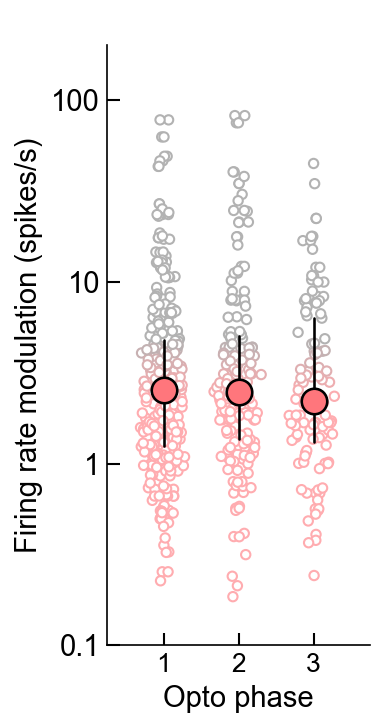

In [150]:
def add_axis_size(fig, ax_w, ax_h, left, bottom):
    fig_w, fig_h = fig.get_size_inches()
    ax = fig.add_axes([left/fig_w, bottom/fig_h, ax_w/fig_w, ax_h/fig_h])
    return ax

def make_axis_size(ax_w, ax_h, left=.3, bottom=.3, right=0, top=0):
    fig_w = (ax_w + left + right) * 1.05
    fig_h = (ax_h + bottom + top) * 1.05
    fig = plt.figure(figsize=(fig_w, fig_h))
    ax = add_axis_size(fig, ax_w, ax_h, left, bottom)
    return fig, ax

fig,ax = make_axis_size(1.75, 4, left=.3, bottom=.3, right=0, top=0)
switch_offset = 0

################################################################################################################

size = 20
summary_size=150
summary_width=1.25#0.75

mn = 3.5
spread = 2.5
    
###
    
FRmod_baseline_median = 3.5
# data = [FRmod_Ops_preearly,FRmod_Ops_prelate,FRmod_Ops_preexpert,FRmod_Ops_postearly,FRmod_Ops_postlate,FRmod_Ops_postexpert]
data = [FRmod_Ops_postearly,FRmod_Ops_postlate,FRmod_Ops_postexpert]
labels = ['Early','Late','Expert']
numCon = len(data)

###
X = [np.ones(len(l))*idx + polarity*switch_offset for idx,(l,polarity) in enumerate(zip(data,[1,1,1]))]
_,Y = ilep.violin(np.concatenate(X),np.concatenate(data),width=0.75,minjitter=0.075)
X,_ = ilep.violin(np.concatenate(X),np.log10(np.concatenate(data)),width=0.75,minjitter=0.075)
colors = NCR_CR_cmap( (Y-(mn-spread/2))/ (spread) )

ax.scatter(X, Y, s=size, ec=colors, fc='white', lw=1,zorder=-10,clip_on=False)
ax.set_yscale('log',subs=[])

#Plot summary
for idx,(column,polarity) in enumerate(zip(data,[1,1,1])):
    try:
        column = ilep.rmnan(column)
        percentCR = np.nanmean(np.greater(column,FRmod_baseline_median))*100

        eye_color= NCR_CR_cmap((percentCR-40)/20)
        border_color = 'k'#NCR_CR_cmap((percentCR-40)/20)  
    #     r,g,b = mpl.colors.to_rgb(eye_color)
    #     h,l,s = colorsys.rgb_to_hls(r,g,b)

        Q1, median, Q3 = (np.percentile(column, q) for q in [25, 50, 75])
    #     median = np.mean(column)
    #     Q1 = median - sem(column)
    #     Q1 = median + sem(column)

        print(median)

        ax.scatter([idx+polarity*switch_offset], [median], ec=border_color,fc=eye_color, s=summary_size,lw=summary_width, zorder=10)
        ax.plot([idx+polarity*switch_offset, idx+polarity*switch_offset], [Q1, Q3], c=border_color, lw=summary_width, zorder=9, solid_capstyle='round')
    except:
        pass

################################################################################################################
labels = ['1','2','3']

ax.set_ylim([0.1,200])
ax.set_yticks([0.1,1,10,100])
ax.set_yticklabels(['0.1','1','10','100'])
ylab = ax.set_ylabel('Firing rate modulation (spikes/s)')

ax.set_xlim([-0.75-switch_offset,2.75+switch_offset])
ax.set_xticks([0-switch_offset,1-switch_offset,2-switch_offset])
ax.set_xticklabels(labels)
ax.set_xlabel('Opto phase')
# xlab = ax.set_xlabel('Example X label')

# xtick_pos_pre = ax.get_xticks()[1]
# Yval = ilep.getPrePostLabelYval(ax.get_ylim(),Yfrac=-2*stdyfrac,log=True)
# t1 = ax.text(xtick_pos_pre, Yval, 'Post', ha='center', va='bottom', fontsize=stdfont,color='k')
# ax.annotate('', xy=(0.09, -stdyfrac), xycoords='axes fraction', xytext=(0.94, -stdyfrac),arrowprops=dict(arrowstyle='-', color='black'))

ax.tick_params(direction='in', length=6, width=1)

for item in ([ax.title, ax.xaxis.label, ax.yaxis.label] +
    ax.get_xticklabels() + ax.get_yticklabels()):
    item.set_fontsize(stdfont)
for item in (ax.get_xticklabels()):
    item.set_fontsize(stdfont*0.9)
    pass

# Y = np.mean(ax.get_ylim())
# Y = 10**np.mean(np.log10(ax.get_ylim()))
# t = ax.text(2.5,Y,'Reversal',rotation=90,fontsize=stdfont,color=SWITCH_COLOR,horizontalalignment='center',verticalalignment='center')
# ax.plot([2.5]*2,[ax.get_ylim()[0],Y*0.45],lw=1,color=SWITCH_COLOR)
# ax.plot([2.5]*2,[ax.get_ylim()[1],Y/0.45],lw=1,color=SWITCH_COLOR)

ax.fill_between(ax.get_xlim(),[ax.get_ylim()[0]]*2,[ax.get_ylim()[1]*2]*2,color='white',alpha=0.4,zorder=-5,clip_on=False)

ttl = ax.set_title(' ')
artists = [ylab]
# fig.savefig(os.path.join('D:\\\\Figures','Manuscript Figures','AC Opto FRmodulation all cells over learning V'+str(current_version)+'.pdf'),transparent=False,facecolor="white",dpi=400, bbox_extra_artists=(artists), bbox_inches='tight')
# fig.savefig(os.path.join('D:\\\\Figures','Manuscript Figures','AC Opto FRmodulation task encoders over learning V'+str(current_version)+'.pdf'),transparent=False,facecolor="white",dpi=400, bbox_extra_artists=(artists), bbox_inches='tight')

In [151]:
data_dec = SimpleNamespace()
data_dec.early = np.abs(FRmod_Ops_postearly)
data_dec.late = np.abs(FRmod_Ops_postlate)
data_dec.expert = np.abs(FRmod_Ops_postexpert)
ilep.nonparametricIndependentStatsCompareToPreviousSmall(data_dec)
pass

            Source             SS     DF          MS         F     p-unc  \
0            phase       2.357113    1.0    2.357113  0.018128  0.892930   
1          context       2.357113    1.0    2.357113  0.018128  0.892930   
2  phase * context     582.135948    1.0  582.135948  4.477102  0.034662   
3         Residual  103370.017401  795.0  130.025179       NaN       NaN   

        np2  
0  0.000023  
1  0.000023  
2  0.005600  
3       NaN  

        phase         A             B     p-unc    p-corr    hedges
2  pre-expert  baseline  experimental  0.331020  0.405643  0.193572
3    pre-late  baseline  experimental  0.405643  0.405643 -0.130175
key early has 343 non-nan elements
key late has 172 non-nan elements
key expert has 112 non-nan elements


### FRmod Figure

1.492615515604022
1.9585761696616482
2.171532846715328


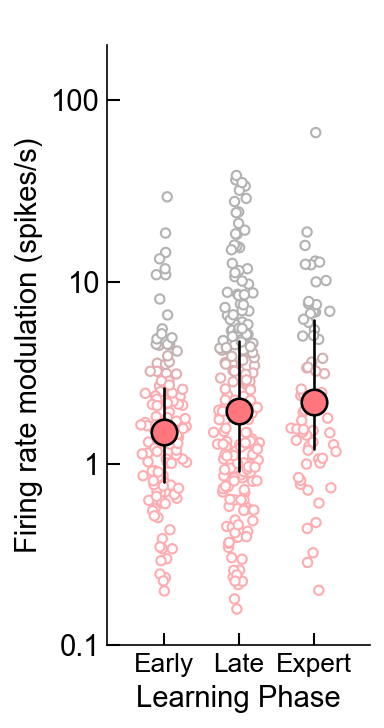

In [113]:
def add_axis_size(fig, ax_w, ax_h, left, bottom):
    fig_w, fig_h = fig.get_size_inches()
    ax = fig.add_axes([left/fig_w, bottom/fig_h, ax_w/fig_w, ax_h/fig_h])
    return ax

def make_axis_size(ax_w, ax_h, left=.3, bottom=.3, right=0, top=0):
    fig_w = (ax_w + left + right) * 1.05
    fig_h = (ax_h + bottom + top) * 1.05
    fig = plt.figure(figsize=(fig_w, fig_h))
    ax = add_axis_size(fig, ax_w, ax_h, left, bottom)
    return fig, ax

fig,ax = make_axis_size(1.75, 4, left=.3, bottom=.3, right=0, top=0)
switch_offset = 0

################################################################################################################

size = 20
summary_size=150
summary_width=1.25#0.75

mn = 3.5
spread = 2.5
    
###
    
FRmod_baseline_median = 3.5
# data = [FRmod_Ops_preearly,FRmod_Ops_prelate,FRmod_Ops_preexpert,FRmod_Ops_postearly,FRmod_Ops_postlate,FRmod_Ops_postexpert]
data = [FRmod_postearly_Control,FRmod_postlate_Control,FRmod_postexpert_Control]
labels = ['Early','Late','Expert']
numCon = len(data)

###
X = [np.ones(len(l))*idx + polarity*switch_offset for idx,(l,polarity) in enumerate(zip(data,[1,1,1]))]
_,Y = ilep.violin(np.concatenate(X),np.concatenate(data),width=0.75,minjitter=0.075)
X,_ = ilep.violin(np.concatenate(X),np.log10(np.concatenate(data)),width=0.75,minjitter=0.075)
colors = NCR_CR_cmap( (Y-(mn-spread/2))/ (spread) )

ax.scatter(X, Y, s=size, ec=colors, fc='white', lw=1,zorder=-10,clip_on=False)
ax.set_yscale('log',subs=[])

#Plot summary
for idx,(column,polarity) in enumerate(zip(data,[1,1,1])):
    try:
        column = ilep.rmnan(column)
        percentCR = np.nanmean(np.greater(column,FRmod_baseline_median))*100

        eye_color= NCR_CR_cmap((percentCR-40)/20)
        border_color = 'k'#NCR_CR_cmap((percentCR-40)/20)  
    #     r,g,b = mpl.colors.to_rgb(eye_color)
    #     h,l,s = colorsys.rgb_to_hls(r,g,b)

        Q1, median, Q3 = (np.percentile(column, q) for q in [25, 50, 75])
    #     median = np.mean(column)
    #     Q1 = median - sem(column)
    #     Q1 = median + sem(column)

        print(median)

        ax.scatter([idx+polarity*switch_offset], [median], ec=border_color,fc=eye_color, s=summary_size,lw=summary_width, zorder=10)
        ax.plot([idx+polarity*switch_offset, idx+polarity*switch_offset], [Q1, Q3], c=border_color, lw=summary_width, zorder=9, solid_capstyle='round')
    except:
        pass

################################################################################################################
labels = ['Early','Late','Expert']

ax.set_ylim([0.1,200])
ax.set_yticks([0.1,1,10,100])
ax.set_yticklabels(['0.1','1','10','100'])
ylab = ax.set_ylabel('Firing rate modulation (spikes/s)')

ax.set_xlim([-0.75-switch_offset,2.75+switch_offset])
ax.set_xticks([0-switch_offset,1-switch_offset,2-switch_offset])
ax.set_xticklabels(labels)
ax.set_xlabel('Learning Phase')
# xlab = ax.set_xlabel('Example X label')

# xtick_pos_pre = ax.get_xticks()[1]
# Yval = ilep.getPrePostLabelYval(ax.get_ylim(),Yfrac=-2*stdyfrac,log=True)
# t1 = ax.text(xtick_pos_pre, Yval, 'Post', ha='center', va='bottom', fontsize=stdfont,color='k')
# ax.annotate('', xy=(0.09, -stdyfrac), xycoords='axes fraction', xytext=(0.94, -stdyfrac),arrowprops=dict(arrowstyle='-', color='black'))

ax.tick_params(direction='in', length=6, width=1)

for item in ([ax.title, ax.xaxis.label, ax.yaxis.label] +
    ax.get_xticklabels() + ax.get_yticklabels()):
    item.set_fontsize(stdfont)
for item in (ax.get_xticklabels()):
    item.set_fontsize(stdfont*0.9)
    pass

# Y = np.mean(ax.get_ylim())
# Y = 10**np.mean(np.log10(ax.get_ylim()))
# t = ax.text(2.5,Y,'Reversal',rotation=90,fontsize=stdfont,color=SWITCH_COLOR,horizontalalignment='center',verticalalignment='center')
# ax.plot([2.5]*2,[ax.get_ylim()[0],Y*0.45],lw=1,color=SWITCH_COLOR)
# ax.plot([2.5]*2,[ax.get_ylim()[1],Y/0.45],lw=1,color=SWITCH_COLOR)

ax.fill_between(ax.get_xlim(),[ax.get_ylim()[0]]*2,[ax.get_ylim()[1]*2]*2,color='white',alpha=0.4,zorder=-5,clip_on=False)

ttl = ax.set_title(' ')
artists = [ylab]
# fig.savefig(os.path.join('D:\\\\Figures','Manuscript Figures','287 AC Opto Control FRmodulation all cells over learning V'+str(current_version)+'.pdf'),transparent=False,facecolor="white",dpi=400, bbox_extra_artists=(artists), bbox_inches='tight')

In [115]:
data_dec = SimpleNamespace()
data_dec.preearly = np.abs([0])
data_dec.prelate = np.abs([0])
data_dec.preexpert = np.abs([0])
data_dec.postearly = np.abs(FRmod_postearly_Control)
data_dec.postlate = np.abs(FRmod_postlate_Control)
data_dec.postexpert = np.abs(FRmod_postexpert_Control)
ilep.nonparametricIndependentStatsCompareToPrevious(data_dec)
pass

            Source            SS     DF          MS         F     p-unc  \
0            phase    294.769295    3.0   98.256432  2.215032  0.085275   
1          context    223.151450    1.0  223.151450  5.030587  0.025269   
2  phase * context     76.928825    3.0   25.642942  0.578078  0.629584   
3         Residual  26526.640349  598.0   44.358930       NaN       NaN   

        np2  
0  0.010990  
1  0.008342  
2  0.002892  
3       NaN  

          phase         A             B     p-unc    p-corr    hedges
7   post-expert  baseline  experimental  0.281866  0.563731 -0.050127
8     post-late  baseline  experimental  0.024234  0.096935 -0.325356
9    pre-expert  baseline  experimental  1.000000  1.000000       NaN
10     pre-late  baseline  experimental  1.000000  1.000000       NaN
key preearly has 1 non-nan elements
key prelate has 1 non-nan elements
key preexpert has 1 non-nan elements
key postearly has 124 non-nan elements
key postlate has 206 non-nan elements
key postexpert has

C:\Users\insan\anaconda3\envs\EphysPlotting\lib\site-packages\pingouin\effsize.py:803: RuntimeWarning: invalid value encountered in double_scalars
  d = (x.mean() - y.mean()) / poolsd
C:\Users\insan\anaconda3\envs\EphysPlotting\lib\site-packages\numpy\core\_methods.py:262: RuntimeWarning: Degrees of freedom <= 0 for slice
  ret = _var(a, axis=axis, dtype=dtype, out=out, ddof=ddof,
C:\Users\insan\anaconda3\envs\EphysPlotting\lib\site-packages\numpy\core\_methods.py:254: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)


4.344444444444446
1.9644830102147177
3.7701149425287355


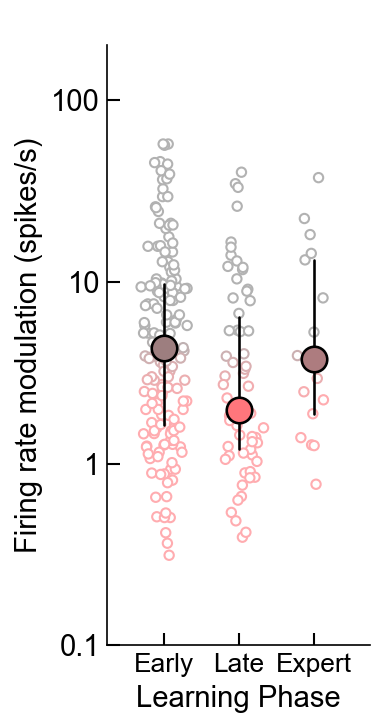

In [26]:
def add_axis_size(fig, ax_w, ax_h, left, bottom):
    fig_w, fig_h = fig.get_size_inches()
    ax = fig.add_axes([left/fig_w, bottom/fig_h, ax_w/fig_w, ax_h/fig_h])
    return ax

def make_axis_size(ax_w, ax_h, left=.3, bottom=.3, right=0, top=0):
    fig_w = (ax_w + left + right) * 1.05
    fig_h = (ax_h + bottom + top) * 1.05
    fig = plt.figure(figsize=(fig_w, fig_h))
    ax = add_axis_size(fig, ax_w, ax_h, left, bottom)
    return fig, ax

fig,ax = make_axis_size(1.75, 4, left=.3, bottom=.3, right=0, top=0)
switch_offset = 0

################################################################################################################

size = 20
summary_size=150
summary_width=1.25#0.75

mn = 3.5
spread = 2.5
    
###
    
FRmod_baseline_median = 3.5
# data = [FRmod_Ops_preearly,FRmod_Ops_prelate,FRmod_Ops_preexpert,FRmod_Ops_postearly,FRmod_Ops_postlate,FRmod_Ops_postexpert]
data = [FRmod_postearly_Control,FRmod_postlate_Control,FRmod_postexpert_Control]
labels = ['Early','Late','Expert']
numCon = len(data)

###
X = [np.ones(len(l))*idx + polarity*switch_offset for idx,(l,polarity) in enumerate(zip(data,[1,1,1]))]
_,Y = ilep.violin(np.concatenate(X),np.concatenate(data),width=0.75,minjitter=0.075)
X,_ = ilep.violin(np.concatenate(X),np.log10(np.concatenate(data)),width=0.75,minjitter=0.075)
colors = NCR_CR_cmap( (Y-(mn-spread/2))/ (spread) )

ax.scatter(X, Y, s=size, ec=colors, fc='white', lw=1,zorder=-10,clip_on=False)
ax.set_yscale('log',subs=[])

#Plot summary
for idx,(column,polarity) in enumerate(zip(data,[1,1,1])):
    try:
        column = ilep.rmnan(column)
        percentCR = np.nanmean(np.greater(column,FRmod_baseline_median))*100

        eye_color= NCR_CR_cmap((percentCR-40)/20)
        border_color = 'k'#NCR_CR_cmap((percentCR-40)/20)  
    #     r,g,b = mpl.colors.to_rgb(eye_color)
    #     h,l,s = colorsys.rgb_to_hls(r,g,b)

        Q1, median, Q3 = (np.percentile(column, q) for q in [25, 50, 75])
    #     median = np.mean(column)
    #     Q1 = median - sem(column)
    #     Q1 = median + sem(column)

        print(median)

        ax.scatter([idx+polarity*switch_offset], [median], ec=border_color,fc=eye_color, s=summary_size,lw=summary_width, zorder=10)
        ax.plot([idx+polarity*switch_offset, idx+polarity*switch_offset], [Q1, Q3], c=border_color, lw=summary_width, zorder=9, solid_capstyle='round')
    except:
        pass

################################################################################################################
labels = ['Early','Late','Expert']

ax.set_ylim([0.1,200])
ax.set_yticks([0.1,1,10,100])
ax.set_yticklabels(['0.1','1','10','100'])
ylab = ax.set_ylabel('Firing rate modulation (spikes/s)')

ax.set_xlim([-0.75-switch_offset,2.75+switch_offset])
ax.set_xticks([0-switch_offset,1-switch_offset,2-switch_offset])
ax.set_xticklabels(labels)
ax.set_xlabel('Learning Phase')
# xlab = ax.set_xlabel('Example X label')

# xtick_pos_pre = ax.get_xticks()[1]
# Yval = ilep.getPrePostLabelYval(ax.get_ylim(),Yfrac=-2*stdyfrac,log=True)
# t1 = ax.text(xtick_pos_pre, Yval, 'Post', ha='center', va='bottom', fontsize=stdfont,color='k')
# ax.annotate('', xy=(0.09, -stdyfrac), xycoords='axes fraction', xytext=(0.94, -stdyfrac),arrowprops=dict(arrowstyle='-', color='black'))

ax.tick_params(direction='in', length=6, width=1)

for item in ([ax.title, ax.xaxis.label, ax.yaxis.label] +
    ax.get_xticklabels() + ax.get_yticklabels()):
    item.set_fontsize(stdfont)
for item in (ax.get_xticklabels()):
    item.set_fontsize(stdfont*0.9)
    pass

# Y = np.mean(ax.get_ylim())
# Y = 10**np.mean(np.log10(ax.get_ylim()))
# t = ax.text(2.5,Y,'Reversal',rotation=90,fontsize=stdfont,color=SWITCH_COLOR,horizontalalignment='center',verticalalignment='center')
# ax.plot([2.5]*2,[ax.get_ylim()[0],Y*0.45],lw=1,color=SWITCH_COLOR)
# ax.plot([2.5]*2,[ax.get_ylim()[1],Y/0.45],lw=1,color=SWITCH_COLOR)

ax.fill_between(ax.get_xlim(),[ax.get_ylim()[0]]*2,[ax.get_ylim()[1]*2]*2,color='white',alpha=0.4,zorder=-5,clip_on=False)

ttl = ax.set_title(' ')
artists = [ylab]
fig.savefig(os.path.join('D:\\\\Figures','Manuscript Figures','AC Opto Control FRmodulation all cells over learning V'+str(current_version)+'.pdf'),transparent=False,facecolor="white",dpi=400, bbox_extra_artists=(artists), bbox_inches='tight')

In [38]:
data_dec = SimpleNamespace()
data_dec.preearly = np.abs([0])
data_dec.prelate = np.abs([0])
data_dec.preexpert = np.abs([0])
data_dec.postearly = np.abs(FRmod_postearly_Control)
data_dec.postlate = np.abs(FRmod_postlate_Control)
data_dec.postexpert = np.abs(FRmod_postexpert_Control)
ilep.nonparametricIndependentStatsCompareToOwnEarly(data_dec)
pass

            Source            SS     DF           MS         F     p-unc  \
0            phase    587.850351    3.0   195.950117  0.818091  0.485377   
1          context   1193.001900    1.0  1193.001900  4.980780  0.026837   
2  phase * context    189.993811    3.0    63.331270  0.264408  0.850982   
3         Residual  44071.885898  184.0   239.521119       NaN       NaN   

        np2  
0  0.013163  
1  0.026356  
2  0.004292  
3       NaN  

          phase         A             B     p-unc    p-corr    hedges
7   post-expert  baseline  experimental  0.056913  0.113826  0.241818
8     post-late  baseline  experimental  0.049331  0.113826  0.554643
9    pre-expert  baseline  experimental  1.000000  1.000000       NaN
10     pre-late  baseline  experimental  1.000000  1.000000       NaN
key preearly has 1 non-nan elements
key prelate has 1 non-nan elements
key preexpert has 1 non-nan elements
key postearly has 54 non-nan elements
key postlate has 20 non-nan elements
key postexpert 

C:\Users\insan\anaconda3\envs\EphysPlotting\lib\site-packages\pingouin\effsize.py:803: RuntimeWarning: invalid value encountered in double_scalars
  d = (x.mean() - y.mean()) / poolsd
C:\Users\insan\anaconda3\envs\EphysPlotting\lib\site-packages\numpy\core\_methods.py:262: RuntimeWarning: Degrees of freedom <= 0 for slice
  ret = _var(a, axis=axis, dtype=dtype, out=out, ddof=ddof,
C:\Users\insan\anaconda3\envs\EphysPlotting\lib\site-packages\numpy\core\_methods.py:254: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)


6.695713598262337
4.913287301751509
6.3693274810818075
5.25585802533731
6.560610411271537
5.273952182213681


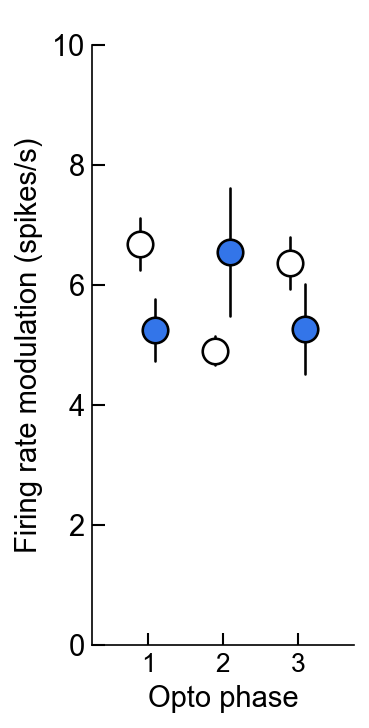

In [19]:
def add_axis_size(fig, ax_w, ax_h, left, bottom):
    fig_w, fig_h = fig.get_size_inches()
    ax = fig.add_axes([left/fig_w, bottom/fig_h, ax_w/fig_w, ax_h/fig_h])
    return ax

def make_axis_size(ax_w, ax_h, left=.3, bottom=.3, right=0, top=0):
    fig_w = (ax_w + left + right) * 1.05
    fig_h = (ax_h + bottom + top) * 1.05
    fig = plt.figure(figsize=(fig_w, fig_h))
    ax = add_axis_size(fig, ax_w, ax_h, left, bottom)
    return fig, ax

fig,ax = make_axis_size(1.75, 4, left=.3, bottom=.3, right=0, top=0)
switch_offset = 0

################################################################################################################

size = 20
summary_size=150
summary_width=1.25#0.75

mn = 3.5
spread = 2.5
    
###
    
FRmod_baseline_median = 3.5
# data = [FRmod_Ops_preearly,FRmod_Ops_prelate,FRmod_Ops_preexpert,FRmod_Ops_postearly,FRmod_Ops_postlate,FRmod_Ops_postexpert]
data = [FRmod_Ops_ON_postearly,FRmod_Ops_ON_postlate,FRmod_Ops_ON_postexpert]
data_control = [FRmod_postearly_Control,FRmod_postlate_Control,FRmod_postexpert_Control]
labels = ['Early','Late','Expert']
numCon = len(data)

###
X = [np.ones(len(l))*idx + polarity*switch_offset for idx,(l,polarity) in enumerate(zip(data,[1,1,1]))]
_,Y = ilep.violin(np.concatenate(X),np.concatenate(data),width=0.75,minjitter=0.075)
X,_ = ilep.violin(np.concatenate(X),np.log10(np.concatenate(data)),width=0.75,minjitter=0.075)
colors = NCR_CR_cmap( (Y-(mn-spread/2))/ (spread) )

# ax.scatter(X, Y, s=size, ec=colors, fc='white', lw=1,zorder=-10,clip_on=False)
# ax.set_yscale('log',subs=[])

#Plot summary
offset=0.1
for idx,(column,polarity) in enumerate(zip(data_control,[1,1,1])):
    column = ilep.rmnan(column)
    percentCR = np.nanmean(np.greater(column,FRmod_baseline_median))*100
    
    eye_color= 'white'#NCR_CR_cmap((percentCR-40)/20)
    border_color = 'k'#NCR_CR_cmap((percentCR-40)/20)  
#     r,g,b = mpl.colors.to_rgb(eye_color)
#     h,l,s = colorsys.rgb_to_hls(r,g,b)
    
#     Q1, median, Q3 = (np.percentile(column, q) for q in [25, 50, 75])
    median = np.mean(column)
    Q1 = median - sem(column)
    Q3 = median + sem(column)

    print(median)
    
    ax.scatter([idx+polarity*switch_offset-offset], [median], ec=border_color,fc=eye_color, s=summary_size,lw=summary_width, zorder=10)
    ax.plot([idx+polarity*switch_offset-offset, idx+polarity*switch_offset-offset], [Q1, Q3], c=border_color, lw=summary_width, zorder=9, solid_capstyle='round')
    
for idx,(column,polarity) in enumerate(zip(data,[1,1,1])):
    column = ilep.rmnan(column)
    percentCR = np.nanmean(np.greater(column,FRmod_baseline_median))*100
    
    eye_color= LASER_COLOR#NCR_CR_cmap((percentCR-40)/20)
    border_color = 'k'#NCR_CR_cmap((percentCR-40)/20)  
#     r,g,b = mpl.colors.to_rgb(eye_color)
#     h,l,s = colorsys.rgb_to_hls(r,g,b)
    
#     Q1, median, Q3 = (np.percentile(column, q) for q in [25, 50, 75])
    median = np.mean(column)
    Q1 = median - sem(column)
    Q3 = median + sem(column)

    print(median)
    
    ax.scatter([idx+polarity*switch_offset+offset], [median], ec=border_color,fc=eye_color, s=summary_size,lw=summary_width, zorder=10)
    ax.plot([idx+polarity*switch_offset+offset, idx+polarity*switch_offset+offset], [Q1, Q3], c=border_color, lw=summary_width, zorder=9, solid_capstyle='round')


################################################################################################################
labels = ['1','2','3']

ax.set_ylim([0,10])
ylab = ax.set_ylabel('Firing rate modulation (spikes/s)')

ax.set_xlim([-0.75-switch_offset,2.75+switch_offset])
ax.set_xticks([0-switch_offset,1-switch_offset,2-switch_offset])
ax.set_xticklabels(labels)
ax.set_xlabel('Opto phase')
# xlab = ax.set_xlabel('Example X label')

# xtick_pos_pre = ax.get_xticks()[1]
# Yval = ilep.getPrePostLabelYval(ax.get_ylim(),Yfrac=-2*stdyfrac,log=True)
# t1 = ax.text(xtick_pos_pre, Yval, 'Post', ha='center', va='bottom', fontsize=stdfont,color='k')
# ax.annotate('', xy=(0.09, -stdyfrac), xycoords='axes fraction', xytext=(0.94, -stdyfrac),arrowprops=dict(arrowstyle='-', color='black'))

ax.tick_params(direction='in', length=6, width=1)

for item in ([ax.title, ax.xaxis.label, ax.yaxis.label] +
    ax.get_xticklabels() + ax.get_yticklabels()):
    item.set_fontsize(stdfont)
for item in (ax.get_xticklabels()):
    item.set_fontsize(stdfont*0.9)
    pass

# Y = np.mean(ax.get_ylim())
# Y = 10**np.mean(np.log10(ax.get_ylim()))
# t = ax.text(2.5,Y,'Reversal',rotation=90,fontsize=stdfont,color=SWITCH_COLOR,horizontalalignment='center',verticalalignment='center')
# ax.plot([2.5]*2,[ax.get_ylim()[0],Y*0.45],lw=1,color=SWITCH_COLOR)
# ax.plot([2.5]*2,[ax.get_ylim()[1],Y/0.45],lw=1,color=SWITCH_COLOR)

ax.fill_between(ax.get_xlim(),[ax.get_ylim()[0]]*2,[ax.get_ylim()[1]*2]*2,color='white',alpha=0.4,zorder=-5,clip_on=False)

ttl = ax.set_title(' ')
artists = [ylab]
fig.savefig(os.path.join('D:\\\\Figures','Manuscript Figures','AC Opto Mean of Modulation V'+str(current_version)+'.pdf'),transparent=False,facecolor="white",dpi=400, bbox_extra_artists=(artists), bbox_inches='tight')

4.5463022047327275
5.41283017701404
3.948836476869596
5.25585802533731
6.560610411271537
5.273952182213681


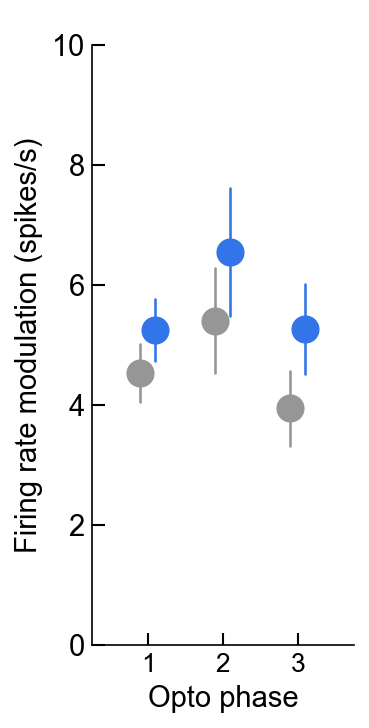

In [184]:
def add_axis_size(fig, ax_w, ax_h, left, bottom):
    fig_w, fig_h = fig.get_size_inches()
    ax = fig.add_axes([left/fig_w, bottom/fig_h, ax_w/fig_w, ax_h/fig_h])
    return ax

def make_axis_size(ax_w, ax_h, left=.3, bottom=.3, right=0, top=0):
    fig_w = (ax_w + left + right) * 1.05
    fig_h = (ax_h + bottom + top) * 1.05
    fig = plt.figure(figsize=(fig_w, fig_h))
    ax = add_axis_size(fig, ax_w, ax_h, left, bottom)
    return fig, ax

fig,ax = make_axis_size(1.75, 4, left=.3, bottom=.3, right=0, top=0)
switch_offset = 0

################################################################################################################

size = 20
summary_size=150
summary_width=1.25#0.75

mn = 3.5
spread = 2.5
    
###
    
FRmod_baseline_median = 3.5
# data = [FRmod_Ops_preearly,FRmod_Ops_prelate,FRmod_Ops_preexpert,FRmod_Ops_postearly,FRmod_Ops_postlate,FRmod_Ops_postexpert]
data_on = [FRmod_Ops_ON_postearly,FRmod_Ops_ON_postlate,FRmod_Ops_ON_postexpert]
data_off = [FRmod_Ops_OFF_postearly,FRmod_Ops_OFF_postlate,FRmod_Ops_OFF_postexpert]
labels = ['Early','Late','Expert']
numCon = len(data_on)

###
# X = [np.ones(len(l))*idx + polarity*switch_offset for idx,(l,polarity) in enumerate(zip(data,[1,1,1]))]
# _,Y = ilep.violin(np.concatenate(X),np.concatenate(data),width=0.75,minjitter=0.075)
# X,_ = ilep.violin(np.concatenate(X),np.log10(np.concatenate(data)),width=0.75,minjitter=0.075)
# colors = NCR_CR_cmap( (Y-(mn-spread/2))/ (spread) )

# ax.scatter(X, Y, s=size, ec=colors, fc='white', lw=1,zorder=-10,clip_on=False)
# ax.set_yscale('log',subs=[])

#Plot summary
offset=0.1
for idx,(column,polarity) in enumerate(zip(data_off,[1,1,1])):
    column = ilep.rmnan(column)
    percentCR = np.nanmean(np.greater(column,FRmod_baseline_median))*100
    
    eye_color= GOOD_GREY#NCR_CR_cmap((percentCR-40)/20)
    border_color = GOOD_GREY#NCR_CR_cmap((percentCR-40)/20)  
#     r,g,b = mpl.colors.to_rgb(eye_color)
#     h,l,s = colorsys.rgb_to_hls(r,g,b)
    
#     Q1, median, Q3 = (np.percentile(column, q) for q in [25, 50, 75])
    median = np.mean(column)
    Q1 = median - sem(column)
    Q3 = median + sem(column)

    print(median)
    
    ax.scatter([idx+polarity*switch_offset-offset], [median], ec=border_color,fc=eye_color, s=summary_size,lw=summary_width, zorder=10,clip_on=False)
    ax.plot([idx+polarity*switch_offset-offset, idx+polarity*switch_offset-offset], [Q1, Q3], c=border_color, lw=summary_width, zorder=9, solid_capstyle='round',clip_on=False)
    
for idx,(column,polarity) in enumerate(zip(data_on,[1,1,1])):
    column = ilep.rmnan(column)
    percentCR = np.nanmean(np.greater(column,FRmod_baseline_median))*100
    
    eye_color= LASER_COLOR#NCR_CR_cmap((percentCR-40)/20)
    border_color = LASER_COLOR#NCR_CR_cmap((percentCR-40)/20)  
#     r,g,b = mpl.colors.to_rgb(eye_color)
#     h,l,s = colorsys.rgb_to_hls(r,g,b)
    
#     Q1, median, Q3 = (np.percentile(column, q) for q in [25, 50, 75])
    median = np.mean(column)
    Q1 = median - sem(column)
    Q3 = median + sem(column)

    print(median)
    
    ax.scatter([idx+polarity*switch_offset+offset], [median], ec=border_color,fc=eye_color, s=summary_size,lw=summary_width, zorder=10,clip_on=False)
    ax.plot([idx+polarity*switch_offset+offset, idx+polarity*switch_offset+offset], [Q1, Q3], c=border_color, lw=summary_width, zorder=9, solid_capstyle='round',clip_on=False)


################################################################################################################
labels = ['1','2','3']

ax.set_ylim([0,10])
ylab = ax.set_ylabel('Firing rate modulation (spikes/s)')

ax.set_xlim([-0.75-switch_offset,2.75+switch_offset])
ax.set_xticks([0-switch_offset,1-switch_offset,2-switch_offset])
ax.set_xticklabels(labels)
ax.set_xlabel('Opto phase')
# xlab = ax.set_xlabel('Example X label')

# xtick_pos_pre = ax.get_xticks()[1]
# Yval = ilep.getPrePostLabelYval(ax.get_ylim(),Yfrac=-2*stdyfrac,log=True)
# t1 = ax.text(xtick_pos_pre, Yval, 'Post', ha='center', va='bottom', fontsize=stdfont,color='k')
# ax.annotate('', xy=(0.09, -stdyfrac), xycoords='axes fraction', xytext=(0.94, -stdyfrac),arrowprops=dict(arrowstyle='-', color='black'))

ax.tick_params(direction='in', length=6, width=1)

for item in ([ax.title, ax.xaxis.label, ax.yaxis.label] +
    ax.get_xticklabels() + ax.get_yticklabels()):
    item.set_fontsize(stdfont)
for item in (ax.get_xticklabels()):
    item.set_fontsize(stdfont*0.9)
    pass

# Y = np.mean(ax.get_ylim())
# Y = 10**np.mean(np.log10(ax.get_ylim()))
# t = ax.text(2.5,Y,'Reversal',rotation=90,fontsize=stdfont,color=SWITCH_COLOR,horizontalalignment='center',verticalalignment='center')
# ax.plot([2.5]*2,[ax.get_ylim()[0],Y*0.45],lw=1,color=SWITCH_COLOR)
# ax.plot([2.5]*2,[ax.get_ylim()[1],Y/0.45],lw=1,color=SWITCH_COLOR)

ax.fill_between(ax.get_xlim(),[ax.get_ylim()[0]]*2,[ax.get_ylim()[1]*2]*2,color='white',alpha=0.4,zorder=-5,clip_on=False)

ttl = ax.set_title(' ')
artists = [ylab]
fig.savefig(os.path.join('D:\\\\Figures','Manuscript Figures','AC Opto Mean of Modulation on off V'+str(current_version)+'.pdf'),transparent=False,facecolor="white",dpi=400, bbox_extra_artists=(artists), bbox_inches='tight')

In [65]:
data_dec = SimpleNamespace()
data_dec.early = np.abs(FRmod_Ops_ON_postearly)
data_dec.late = np.abs(FRmod_Ops_ON_postlate)
data_dec.expert = np.abs(FRmod_Ops_ON_postexpert)

data_dec2 = SimpleNamespace()
data_dec2.early = np.abs(FRmod_postearly_Control)
data_dec2.late = np.abs(FRmod_postlate_Control)
data_dec2.expert = np.abs(FRmod_postexpert_Control)

ilep.nonparametricIndependentStatsCompareToOtherSmall(data_dec,data_dec2)
pass

            Source            SS      DF          MS         F     p-unc  \
0            phase     59.451360     2.0   29.725680  0.335910  0.714766   
1          context    315.117448     1.0  315.117448  3.560933  0.059437   
2  phase * context    629.821808     2.0  314.910904  3.558599  0.028832   
3         Residual  90528.292942  1023.0   88.492955       NaN       NaN   

        np2  
0  0.000656  
1  0.003469  
2  0.006909  
3       NaN  

    phase  A  B     p-unc    p-corr    hedges
4   early  A  B  0.034793  0.104378 -0.226158
5  expert  A  B  0.219234  0.328851 -0.264288
6    late  A  B  0.734323  0.734323  0.123736
key early has 286 and 238 non-nan elements
key late has 140 and 189 non-nan elements
key expert has 96 and 80 non-nan elements


In [185]:
data_dec = SimpleNamespace()
data_dec.early = np.abs(FRmod_Ops_ON_postearly)
data_dec.late = np.abs(FRmod_Ops_ON_postlate)
data_dec.expert = np.abs(FRmod_Ops_ON_postexpert)

data_dec2 = SimpleNamespace()
data_dec2.early = np.abs(FRmod_Ops_OFF_postearly)
data_dec2.late = np.abs(FRmod_Ops_OFF_postlate)
data_dec2.expert = np.abs(FRmod_Ops_OFF_postexpert)

ilep.nonparametricIndependentStatsCompareToOtherSmall(data_dec,data_dec2)
pass

            Source            SS      DF          MS         F     p-unc  \
0            phase    287.041480     2.0  143.520740  1.731242  0.177575   
1          context    230.763729     1.0  230.763729  2.783624  0.095534   
2  phase * context     17.735085     2.0    8.867542  0.106966  0.898566   
3         Residual  86050.685583  1038.0   82.900468       NaN       NaN   

        np2  
0  0.003325  
1  0.002675  
2  0.000206  
3       NaN  

    phase  A  B     p-unc    p-corr    hedges
4   early  A  B  0.004023  0.012070  0.084181
5  expert  A  B  0.008158  0.012237  0.195678
6    late  A  B  0.053428  0.053428  0.099200
key early has 286 and 286 non-nan elements
key late has 140 and 140 non-nan elements
key expert has 96 and 96 non-nan elements


In [189]:
wilcoxon(FRmod_Ops_ON_postearly,FRmod_Ops_OFF_postearly)

WilcoxonResult(statistic=12472.0, pvalue=8.958336604715348e-09)

In [190]:
wilcoxon(FRmod_Ops_ON_postlate,FRmod_Ops_OFF_postlate)

WilcoxonResult(statistic=3165.0, pvalue=0.00023165500105097405)

In [191]:
wilcoxon(FRmod_Ops_ON_postexpert,FRmod_Ops_OFF_postexpert)

WilcoxonResult(statistic=1052.0, pvalue=3.117833777356825e-06)

In [128]:
data_dec = SimpleNamespace()
data_dec.preearly = np.abs([0])
data_dec.prelate = np.abs([0])
data_dec.preexpert = np.abs([0])
data_dec.postearly = np.abs(FRmod_Ops_ON_postearly)
data_dec.postlate = np.abs(FRmod_Ops_ON_postlate)
data_dec.postexpert = np.abs(FRmod_Ops_ON_postexpert)

ilep.nonparametricIndependentStatsCompareToPrevious(data_dec)
pass

            Source             SS      DF          MS         F     p-unc  \
0            phase     194.246464     3.0   64.748821  0.448624  0.718295   
1          context      17.084545     1.0   17.084545  0.118373  0.730838   
2  phase * context     747.349051     3.0  249.116350  1.726046  0.159537   
3         Residual  323871.406323  2244.0  144.327721       NaN       NaN   

        np2  
0  0.000599  
1  0.000053  
2  0.002302  
3       NaN  

          phase         A             B     p-unc    p-corr    hedges
7   post-expert  baseline  experimental  0.774818  1.000000  0.139057
8     post-late  baseline  experimental  0.220006  0.880023 -0.086678
9    pre-expert  baseline  experimental  1.000000  1.000000       NaN
10     pre-late  baseline  experimental  1.000000  1.000000       NaN


C:\Users\insan\anaconda3\envs\EphysPlotting\lib\site-packages\pingouin\effsize.py:803: RuntimeWarning: invalid value encountered in double_scalars
  d = (x.mean() - y.mean()) / poolsd
C:\Users\insan\anaconda3\envs\EphysPlotting\lib\site-packages\numpy\core\_methods.py:262: RuntimeWarning: Degrees of freedom <= 0 for slice
  ret = _var(a, axis=axis, dtype=dtype, out=out, ddof=ddof,
C:\Users\insan\anaconda3\envs\EphysPlotting\lib\site-packages\numpy\core\_methods.py:254: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)


In [30]:
EnumOpsSession

['BS_100_1_opto_AC.pickle',
 'BS_100_1_opto_AC.pickle',
 'BS_100_1_opto_AC.pickle',
 'BS_100_1_opto_AC.pickle',
 'BS_119_1_opto_AC.pickle',
 'BS_119_1_opto_AC.pickle',
 'BS_119_1_opto_AC.pickle',
 'BS_119_1_opto_AC.pickle',
 'BS_119_1_opto_AC.pickle',
 'BS_119_1_opto_AC.pickle',
 'BS_119_1_opto_AC.pickle',
 'BS_119_1_opto_AC.pickle',
 'BS_119_1_opto_AC.pickle',
 'BS_119_1_opto_AC.pickle',
 'BS_119_1_opto_AC.pickle',
 'BS_119_1_opto_AC.pickle',
 'BS_119_1_opto_AC.pickle',
 'BS_119_1_opto_AC.pickle',
 'BS_119_1_opto_AC.pickle',
 'BS_119_1_opto_AC.pickle',
 'BS_119_1_opto_AC.pickle',
 'BS_119_2_opto_AC.pickle',
 'BS_119_2_opto_AC.pickle',
 'BS_119_2_opto_AC.pickle',
 'BS_119_2_opto_AC.pickle',
 'BS_119_2_opto_AC.pickle',
 'BS_119_2_opto_AC.pickle',
 'BS_119_2_opto_AC.pickle',
 'BS_119_2_opto_AC.pickle',
 'BS_119_2_opto_AC.pickle',
 'BS_119_2_opto_AC.pickle',
 'BS_119_2_opto_AC.pickle',
 'BS_119_2_opto_AC.pickle',
 'BS_119_2_opto_AC.pickle',
 'BS_119_2_opto_AC.pickle',
 'BS_119_2_opto_AC.p

In [21]:
opsin_control_animals

array(['BS_42', 'BS_108', 'BS_56', 'BS_72', 'BS_70', 'BS_87', 'AE_312'],
      dtype='<U6')

In [22]:
animals

['BS_86', 'BS_119', 'BS_123', 'BS_128', 'BS_131', 'BS_163', 'BS_174']

In [23]:
preearly_Ops_animal = []
prelate_Ops_animal = []
preexpert_Ops_animal = []
postearly_Ops_animal = []
postlate_Ops_animal = []
postexpert_Ops_animal = []

pre_early_session = []

percent_ncr_postearly_animal = []
percent_ncr_postlate_animal = []
percent_ncr_postexpert_animal = []
n_postearly_animal = []
n_postlate_animal = []
n_postexpert_animal = []
FR_postearly_animal = []
FR_postlate_animal = []
FR_postexpert_animal = []

for animal in animals:
    
    FRmod_Ops_postearly_this_animal = []
    FRmod_Ops_postlate_this_animal = []
    FRmod_Ops_postexpert_this_animal = []
    n_postearly_this_animal = 0
    n_postlate_this_animal = 0
    n_postexpert_this_animal = 0
    
    for idx,(session,clust) in tqdm(enumerate(zip(EnumOpsSession,EnumOpsClust))):    
        sessionfile = ilep.loadSessionCached(ops_directory,session)
        rev_day = animalBehaviors[sessionfile.meta.animal].reversal
        day_relative_to_rev = sessionfile.meta.day_of_training - rev_day
        
        if sessionfile.meta.animal != animal:
            continue

        if day_relative_to_rev < 1:
            continue
            
        if hasattr(animalBehaviors[sessionfile.meta.animal],'cloudiness') and sessionfile.meta.day_of_training >= animalBehaviors[sessionfile.meta.animal].cloudiness:
            continue

        try:
            FRmod = sessionfile.responsiveness[clust]['laser_on'].FRmodulation
        except Exception as e:
            print(f"{session} cluster {clust} has error: {e}")
            FRmod = np.nan

    #     #1,2,3,4
    #     #5,6
    #     #7,8

        #9,10,11,12
        if day_relative_to_rev in [1,2]:#[1,2,3,4]:
            FRmod_Ops_postearly_this_animal.append(FRmod)
            n_postearly_this_animal += 1
#             FRmod_Ops_ON_postearly.append(FRmod_on)
#             FRmod_Ops_OFF_postearly.append(FRmod_off)
            postearly_Ops_animal.append(sessionfile.meta.animal)

        #13,14,15
        if day_relative_to_rev in [3,4]:#[5,6,7]:
            FRmod_Ops_postlate_this_animal.append(FRmod)
            n_postlate_this_animal += 1
#             FRmod_Ops_ON_postlate.append(FRmod_on)
#             FRmod_Ops_OFF_postlate.append(FRmod_off)
#             postlate_session_num.append(sessionfile.meta.files)
            postlate_Ops_animal.append(sessionfile.meta.animal)

        #16,17,18,19,20,21
        if day_relative_to_rev >= 5:#8:
            print(session)
            
            FRmod_Ops_postexpert_this_animal.append(FRmod)
            n_postexpert_this_animal += 1
#             FRmod_Ops_ON_postexpert.append(FRmod_on)
#             FRmod_Ops_OFF_postexpert.append(FRmod_off)
#             postexpert_session_num.append(sessionfile.meta.files)
            postexpert_Ops_animal.append(sessionfile.meta.animal)
    
    FR_postearly_animal.append(FRmod_Ops_postearly_this_animal)
    FR_postlate_animal.append(FRmod_Ops_postlate_this_animal)
    FR_postexpert_animal.append(FRmod_Ops_postexpert_this_animal)
    
    #Remove nans
    FRmod_Ops_postearly_this_animal = ilep.rmnan(FRmod_Ops_postearly_this_animal)
    FRmod_Ops_postlate_this_animal = ilep.rmnan(FRmod_Ops_postlate_this_animal)
    FRmod_Ops_postexpert_this_animal = ilep.rmnan(FRmod_Ops_postexpert_this_animal)
    n_postearly_this_animal = len(FRmod_Ops_postearly_this_animal)
    n_postlate_this_animal = len(FRmod_Ops_postlate_this_animal)
    n_postexpert_this_animal = len(FRmod_Ops_postexpert_this_animal)

    percent_ncr_postearly_animal.append(np.mean(np.less(FRmod_Ops_postearly_this_animal,3.5)))
    percent_ncr_postlate_animal.append(np.mean(np.less(FRmod_Ops_postlate_this_animal,3.5)))
    percent_ncr_postexpert_animal.append(np.mean(np.less(FRmod_Ops_postexpert_this_animal,3.5)))
    n_postearly_animal.append(n_postearly_this_animal)
    n_postlate_animal.append(n_postlate_this_animal)
    n_postexpert_animal.append(n_postexpert_this_animal)

841it [00:23, 68.60it/s] 

BS_86_6_opto_AC.pickle
BS_86_6_opto_AC.pickle
BS_86_6_opto_AC.pickle
BS_86_6_opto_AC.pickle
BS_86_6_opto_AC.pickle
BS_86_6_opto_AC.pickle
BS_86_6_opto_AC.pickle
BS_86_6_opto_AC.pickle
BS_86_6_opto_AC.pickle
BS_86_6_opto_AC.pickle
BS_86_6_opto_AC.pickle
BS_86_6_opto_AC.pickle
BS_86_6_opto_AC.pickle
BS_86_6_opto_AC.pickle


850it [00:23, 36.35it/s]
5it [00:00, 42.73it/s]

BS_86_6_opto_AC.pickle
BS_86_6_opto_AC.pickle
BS_86_6_opto_AC.pickle


58it [00:00, 99.92it/s]

BS_119_6_opto_AC.pickle
BS_119_6_opto_AC.pickle
BS_119_6_opto_AC.pickle
BS_119_6_opto_AC.pickle
BS_119_6_opto_AC.pickle
BS_119_6_opto_AC.pickle
BS_119_6_opto_AC.pickle
BS_119_6_opto_AC.pickle
BS_119_6_opto_AC.pickle
BS_119_6_opto_AC.pickle
BS_119_6_opto_AC.pickle


850it [00:22, 37.47it/s] 
149it [00:02, 82.01it/s]

BS_123_6_opto_AC.pickle
BS_123_6_opto_AC.pickle
BS_123_6_opto_AC.pickle
BS_123_6_opto_AC.pickle
BS_123_6_opto_AC.pickle
BS_123_6_opto_AC.pickle
BS_123_6_opto_AC.pickle
BS_123_6_opto_AC.pickle
BS_123_6_opto_AC.pickle
BS_123_6_opto_AC.pickle
BS_123_6_opto_AC.pickle
BS_123_6_opto_AC.pickle
BS_123_6_opto_AC.pickle
BS_123_6_opto_AC.pickle
BS_123_6_opto_AC.pickle
BS_123_6_opto_AC.pickle
BS_123_7_opto_AC.pickle
BS_123_7_opto_AC.pickle
BS_123_7_opto_AC.pickle
BS_123_7_opto_AC.pickle


172it [00:02, 96.94it/s]

BS_123_7_opto_AC.pickle
BS_123_7_opto_AC.pickle
BS_123_7_opto_AC.pickle
BS_123_7_opto_AC.pickle
BS_123_7_opto_AC.pickle
BS_123_7_opto_AC.pickle
BS_123_7_opto_AC.pickle
BS_123_7_opto_AC.pickle
BS_123_7_opto_AC.pickle
BS_123_7_opto_AC.pickle
BS_123_7_opto_AC.pickle
BS_123_7_opto_AC.pickle
BS_123_7_opto_AC.pickle


850it [00:22, 37.39it/s] 
173it [00:02, 98.43it/s]

BS_128_10_opto_AC.pickle
BS_128_10_opto_AC.pickle
BS_128_10_opto_AC.pickle
BS_128_10_opto_AC.pickle
BS_128_10_opto_AC.pickle
BS_128_10_opto_AC.pickle
BS_128_10_opto_AC.pickle


389it [00:08, 137.50it/s]

BS_128_8_opto_AC.pickle
BS_128_8_opto_AC.pickle
BS_128_8_opto_AC.pickle
BS_128_9_opto_AC.pickle
BS_128_9_opto_AC.pickle
BS_128_9_opto_AC.pickle
BS_128_9_opto_AC.pickle
BS_128_9_opto_AC.pickle
BS_128_9_opto_AC.pickle
BS_128_9_opto_AC.pickle


850it [00:22, 37.09it/s] 
403it [00:08, 138.94it/s]

BS_131_6_opto_AC.pickle
BS_131_6_opto_AC.pickle
BS_131_6_opto_AC.pickle
BS_131_6_opto_AC.pickle
BS_131_6_opto_AC.pickle
BS_131_7_opto_AC.pickle
BS_131_7_opto_AC.pickle
BS_131_7_opto_AC.pickle
BS_131_8_opto_AC.pickle
BS_131_8_opto_AC.pickle
BS_131_8_opto_AC.pickle
BS_131_8_opto_AC.pickle
BS_131_8_opto_AC.pickle
BS_131_8_opto_AC.pickle
BS_131_8_opto_AC.pickle
BS_131_8_opto_AC.pickle
BS_131_8_opto_AC.pickle
BS_131_8_opto_AC.pickle


850it [00:22, 37.84it/s] 
850it [00:23, 35.52it/s] 
C:\Users\insan\anaconda3\envs\EphysPlotting\lib\site-packages\numpy\core\fromnumeric.py:3440: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
C:\Users\insan\anaconda3\envs\EphysPlotting\lib\site-packages\numpy\core\_methods.py:189: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
850it [00:23, 36.63it/s] 


In [24]:
preearly_Control_animal = []
prelate_Control_animal = []
preexpert_Control_animal = []
postearly_Control_animal = []
postlate_Control_animal = []
postexpert_Control_animal = []

pre_early_session = []

percent_ncr_postearly_control_animal = []
percent_ncr_postlate_control_animal = []
percent_ncr_postexpert_control_animal = []
n_postearly_control_animal = []
n_postlate_control_animal = []
n_postexpert_control_animal = []
FR_Control_postearly_animal = []
FR_Control_postlate_animal = []
FR_Control_postexpert_animal = []

for animal in opsin_control_animals:
    
    FRmod_Control_postearly_this_animal = []
    FRmod_Control_postlate_this_animal = []
    FRmod_Control_postexpert_this_animal = []
    n_postearly_control_this_animal = 0
    n_postlate_control_this_animal = 0
    n_postexpert_control_this_animal = 0
    
    for idx,(session,clust) in tqdm(enumerate(zip(EnumSessionControl,EnumClustControl))):

        sessionfile = ilep.loadSessionCached([act_directory,ops_directory],session)
#         sessionfile = ilep.loadSessionCached(ops_directory,session)
        
        rev_day = animalBehaviors[sessionfile.meta.animal].reversal
        day_relative_to_rev = sessionfile.meta.day_of_training - rev_day
        
        if sessionfile.meta.animal != animal:
            continue

        if day_relative_to_rev < 1:
            continue
            
        if EILphasesControl[idx] not in ['pre expert','post expert'] and sessionfile.meta.animal in ['DS_15','DS_19']:
            continue

        try:
            FRmod = sessionfile.responsiveness[clust]['all_trials'].FRmodulation
#             FRmod = sessionfile.responsiveness[clust]['laser_on'].FRmodulation
        except Exception as e:
            print(f"{session} cluster {clust} has error: {e}")
            FRmod = np.nan

    #     #1,2,3,4
    #     #5,6
    #     #7,8

        #9,10,11,12
        if EILphasesControl[idx] == 'post early':
            FRmod_Control_postearly_this_animal.append(FRmod)
            n_postearly_control_this_animal += 1
#             FRmod_Ops_ON_postearly.append(FRmod_on)
#             FRmod_Ops_OFF_postearly.append(FRmod_off)
            postearly_Control_animal.append(sessionfile.meta.animal)

        #13,14,15
        if EILphasesControl[idx] == 'post late':
            FRmod_Control_postlate_this_animal.append(FRmod)
            n_postlate_control_this_animal += 1
#             FRmod_Ops_ON_postlate.append(FRmod_on)
#             FRmod_Ops_OFF_postlate.append(FRmod_off)
#             postlate_session_num.append(sessionfile.meta.files)
            postlate_Control_animal.append(sessionfile.meta.animal)

        #16,17,18,19,20,21
        if EILphasesControl[idx] == 'post expert':
            FRmod_Control_postexpert_this_animal.append(FRmod)
            n_postexpert_control_this_animal += 1
#             FRmod_Ops_ON_postexpert.append(FRmod_on)
#             FRmod_Ops_OFF_postexpert.append(FRmod_off)
#             postexpert_session_num.append(sessionfile.meta.files)
            postexpert_Control_animal.append(sessionfile.meta.animal)

    FR_Control_postearly_animal.append(FRmod_Control_postearly_this_animal)
    FR_Control_postlate_animal.append(FRmod_Control_postlate_this_animal)
    FR_Control_postexpert_animal.append(FRmod_Control_postexpert_this_animal)
    
    #Remove nans
    FRmod_Control_postearly_this_animal = ilep.rmnan(FRmod_Control_postearly_this_animal)
    FRmod_Control_postlate_this_animal = ilep.rmnan(FRmod_Control_postlate_this_animal)
    FRmod_Control_postexpert_this_animal = ilep.rmnan(FRmod_Control_postexpert_this_animal)
    n_postearly_control_this_animal = len(FRmod_Control_postearly_this_animal)
    n_postlate_control_this_animal = len(FRmod_Control_postlate_this_animal)
    n_postexpert_control_this_animal = len(FRmod_Control_postexpert_this_animal)
    
    percent_ncr_postearly_control_animal.append(np.mean(np.less(FRmod_Control_postearly_this_animal,3.5)))
    percent_ncr_postlate_control_animal.append(np.mean(np.less(FRmod_Control_postlate_this_animal,3.5)))
    percent_ncr_postexpert_control_animal.append(np.mean(np.less(FRmod_Control_postexpert_this_animal,3.5)))
    n_postearly_control_animal.append(n_postearly_control_this_animal)
    n_postlate_control_animal.append(n_postlate_control_this_animal)
    n_postexpert_control_animal.append(n_postexpert_control_this_animal)

832it [00:13, 63.71it/s] 
832it [00:14, 59.22it/s] 
832it [00:14, 58.27it/s] 
832it [00:13, 59.63it/s] 
832it [00:13, 59.97it/s] 
832it [00:14, 58.51it/s] 
832it [00:14, 58.19it/s] 


In [25]:
# mean_pc_NCR = np.array([np.nansum(np.array(d1)*np.array(d2))/np.nansum(d2) for d1,d2 in zip([percent_ncr_postearly_animal,percent_ncr_postlate_animal,percent_ncr_postexpert_animal],[n_postearly_animal,n_postlate_animal,n_postexpert_animal])])*100
# sem_pc_NCR = np.array([sem(ilep.rmnan(d)) for d in [percent_ncr_postearly_animal,percent_ncr_postlate_animal,percent_ncr_postexpert_animal]])*100

mean_pc_NCR = []
sem_pc_NCR = []
for FRmods in [FR_postearly_animal,FR_postlate_animal,FR_postexpert_animal]:
    Mw,SEMw = ilep.bootstrap_Mw_SEMw(FRmods,n_frac=1,CR_NCR_thresh=1.8)
    mean_pc_NCR.append(Mw)
    sem_pc_NCR.append(SEMw)

../..\InsanallyLabEphysTools\analysis.py:832: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  FRmods = np.array(FRmods)


In [26]:
# mean_pc_NCR_control = np.array([np.nansum(np.array(d1)*np.array(d2))/np.nansum(d2) for d1,d2 in zip([percent_ncr_postearly_control_animal,percent_ncr_postlate_control_animal,percent_ncr_postexpert_control_animal],[n_postearly_control_animal,n_postlate_control_animal,n_postexpert_control_animal])])*100
# sem_pc_NCR_control = np.array([sem(ilep.rmnan(d)) for d in [percent_ncr_postearly_control_animal,percent_ncr_postlate_control_animal,percent_ncr_postexpert_control_animal]])*100

mean_pc_NCR_control = []
sem_pc_NCR_control = []
for FRmods in [FR_Control_postearly_animal,FR_Control_postlate_animal,FR_Control_postexpert_animal]:
    Mw,SEMw = ilep.bootstrap_Mw_SEMw(FRmods,n_frac=1,CR_NCR_thresh=3.5)
    mean_pc_NCR_control.append(Mw)
    sem_pc_NCR_control.append(SEMw)

In [27]:
print('loaded')

loaded


In [28]:
5

5

In [29]:
np.sum([len(l) for l in FR_Control_postearly_animal])

321

In [30]:
np.sum([len(l) for l in FR_Control_postlate_animal])

248

In [31]:
np.sum([len(l) for l in FR_Control_postexpert_animal])

106

In [32]:
321+248+106

675

In [33]:
print(len(np.concatenate(FR_postearly_animal)))
print(len(np.concatenate(FR_postlate_animal)))
print(len(np.concatenate(FR_postexpert_animal)))
#,FR_Control_postlate_animal,FR_Control_postexpert_animal

286
140
96


In [34]:
print(np.sum(np.isfinite(np.concatenate(FR_postearly_animal))))
print(np.sum(np.isfinite(np.concatenate(FR_postlate_animal))))
print(np.sum(np.isfinite(np.concatenate(FR_postexpert_animal))))
#,FR_Control_postlate_animal,FR_Control_postexpert_animal

286
140
96


In [35]:
print(len(np.concatenate(FR_Control_postearly_animal)))
print(len(np.concatenate(FR_Control_postlate_animal)))
print(len(np.concatenate(FR_Control_postexpert_animal)))
#,FR_Control_postlate_animal,FR_Control_postexpert_animal

321
248
106


In [36]:
print(np.sum(np.isfinite(np.concatenate(FR_Control_postearly_animal))))
print(np.sum(np.isfinite(np.concatenate(FR_Control_postlate_animal))))
print(np.sum(np.isfinite(np.concatenate(FR_Control_postexpert_animal))))
#,FR_Control_postlate_animal,FR_Control_postexpert_animal

321
248
103


# Percent NCR

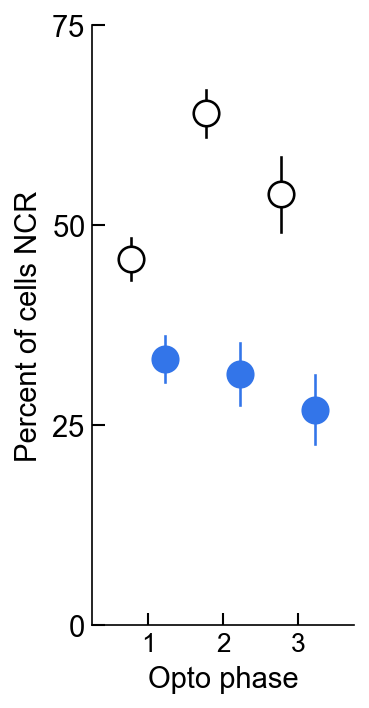

In [36]:
def add_axis_size(fig, ax_w, ax_h, left, bottom):
    fig_w, fig_h = fig.get_size_inches()
    ax = fig.add_axes([left/fig_w, bottom/fig_h, ax_w/fig_w, ax_h/fig_h])
    return ax

def make_axis_size(ax_w, ax_h, left=.3, bottom=.3, right=0, top=0):
    fig_w = (ax_w + left + right) * 1.05
    fig_h = (ax_h + bottom + top) * 1.05
    fig = plt.figure(figsize=(fig_w, fig_h))
    ax = add_axis_size(fig, ax_w, ax_h, left, bottom)
    return fig, ax

def statsbar(ax,barheight,xpoints,stemheights,text=None,lw=1):
    ymax = ax.get_ylim()[1]
    ymin = ax.get_ylim()[0]
    yrange = ymax-ymin
    ydist = 0.025*yrange
    
    ax.plot([xpoints[0]]*2,[stemheights[0]+ydist,barheight],lw=lw,color='k')
    ax.plot([xpoints[1]]*2,[stemheights[1]+ydist,barheight],lw=lw,color='k')
    ax.plot(xpoints,[barheight]*2,lw=lw,color='k')
    
    if not text is None:
        ax.text(np.mean(xpoints),barheight + ydist,text,horizontalalignment='center',verticalalignment='center')

fig,ax = make_axis_size(1.75, 4, left=.3, bottom=.3, right=0, top=0)
switch_offset = 0#0.1

################################################################################################################

wid = 0

offset=0.225
for idx,p in zip(range(6),[1,1,1]):
    
    ax.scatter([idx+wid+p*switch_offset-offset],(mean_pc_NCR_control[idx]),ec='k',fc='white',s=150,zorder=10,marker='o',lw=1.25)
    ax.plot([idx+wid+p*switch_offset-offset,idx+wid+p*switch_offset-offset],[(mean_pc_NCR_control[idx]-sem_pc_NCR_control[idx]),(mean_pc_NCR_control[idx]+sem_pc_NCR_control[idx])],color='k',lw=1.25,zorder=9)
    
    ax.scatter([idx+wid+p*switch_offset+offset],(mean_pc_NCR[idx]),c=LASER_COLOR,s=150,zorder=10,marker='o',lw=1.25)
    ax.plot([idx+wid+p*switch_offset+offset,idx+wid+p*switch_offset+offset],[(mean_pc_NCR[idx]-sem_pc_NCR[idx]),(mean_pc_NCR[idx]+sem_pc_NCR[idx])],color=LASER_COLOR,lw=1.25,zorder=9)
    
#ax.scatter([0,1,2,3,4,5],(mean_pc_NCR_passive)/100,fc='white',ec=GOOD_GREY,s=50,zorder=9,marker='o',lw=1)
# statsbar(ax,82,[1-wid-switch_offset,1+wid-switch_offset],stemheights=[passive_mean_pc_NCR[1]+passive_sem_pc_NCR[1] , mean_pc_NCR[1]+sem_pc_NCR[1]],text='*',lw=1)
# statsbar(ax,82,[4-wid+switch_offset,4+wid+switch_offset],stemheights=[passive_mean_pc_NCR[4]+passive_sem_pc_NCR[4] , mean_pc_NCR[4]+sem_pc_NCR[4]],text='****',lw=1)
# statsbar(ax,70,[5-wid+switch_offset,5+wid+switch_offset],stemheights=[passive_mean_pc_NCR[5]+passive_sem_pc_NCR[5] , mean_pc_NCR[5]+sem_pc_NCR[5]],text='****',lw=1)

################################################################################################################

labels = ['1','2','3']

ylab = ax.set_ylabel('Percent of cells NCR')
ax.set_ylim([0,75])
ax.set_yticks([0,25,50,75])
              
ax.set_xlim([-0.75-switch_offset,2.75+switch_offset])
ax.set_xticks([0-switch_offset,1-switch_offset,2-switch_offset])
ax.set_xticklabels(labels)
ax.set_xlabel('Opto phase')

# xtick_pos_pre = ax.get_xticks()[1]
# xtick_pos_post = ax.get_xticks()[4]
# Yval = ilep.getPrePostLabelYval(ax.get_ylim(),Yfrac=-2*stdyfrac)
# t1 = ax.text(xtick_pos_pre, Yval, 'Pre', ha='center', va='bottom', fontsize=stdfont,color='k')
# t2 = ax.text(xtick_pos_post, Yval, 'Post', ha='center', va='bottom',  fontsize=stdfont,color='k')
# ax.annotate('', xy=(0.03, -stdyfrac), xycoords='axes fraction', xytext=(0.49, -stdyfrac),arrowprops=dict(arrowstyle='-', color='black'))
# ax.annotate('', xy=(0.53, -stdyfrac), xycoords='axes fraction', xytext=(0.99, -stdyfrac),arrowprops=dict(arrowstyle='-', color='black'))

ax.tick_params(direction='in', length=6, width=1)

for item in ([ax.title, ax.xaxis.label, ax.yaxis.label] +
    ax.get_xticklabels() + ax.get_yticklabels()):
    item.set_fontsize(stdfont)
for item in (ax.get_xticklabels()):
    item.set_fontsize(stdfont*0.9)
    pass

# ax.scatter([], [], ec=PASSIVE_COLOR,fc='white', s=50,lw=1,marker='o',label='passive')
# ax.scatter([], [], ec=PASSIVE_COLOR,fc=PASSIVE_COLOR, s=50,lw=1,marker='o',label='behaving')
# ax.legend(frameon=False,loc=(0.5,0.1),fontsize=14)

### Log
# Y = 10**np.mean(np.log10(ax.get_ylim()))
# t = ax.text(2.5,Y,'Reversal',rotation=90,fontsize=stdfont,color=SWITCH_COLOR,horizontalalignment='center',verticalalignment='center')
# ax.plot([2.5]*2,[ax.get_ylim()[0],Y*0.45],lw=1,color=SWITCH_COLOR)
# ax.plot([2.5]*2,[ax.get_ylim()[1],Y/0.45],lw=1,color=SWITCH_COLOR)

### Linear
# Y = np.mean(ax.get_ylim())
# t = ax.text(2.5,Y,'Reversal',rotation=90,fontsize=stdfont,color=SWITCH_COLOR,horizontalalignment='center',verticalalignment='center')
# ax.plot([2.5]*2,[ax.get_ylim()[0],Y-np.ptp(ax.get_ylim())*0.125],lw=1,color=SWITCH_COLOR)
# ax.plot([2.5]*2,[ax.get_ylim()[1],Y+np.ptp(ax.get_ylim())*0.125],lw=1,color=SWITCH_COLOR)

artists = [ylab]
fig.savefig(os.path.join('D:\\\\Figures','Manuscript Figures','AC Opto percent NCR V'+str(current_version)+'.pdf'),transparent=False,facecolor="white",dpi=400, bbox_extra_artists=(artists), bbox_inches='tight')

In [37]:
Xs = [FR_postearly_animal,FR_postlate_animal,FR_postexpert_animal]
Ys = [FR_Control_postearly_animal,FR_Control_postlate_animal,FR_Control_postexpert_animal]

pvals = [np.nan]*3
for idx,(X,Y) in enumerate(zip(Xs,Ys)):
    pvals[idx] = ilep.bootstrap_pc_NCR_test(X,Y,B=250000,CR_NCR_thresh=[1.8,3.5])
    print(pvals[idx])
    
_,pvals_corr = pg.multicomp(pvals,method='fdr_bh')
print()
print(pvals_corr)

../..\InsanallyLabEphysTools\analysis.py:869: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  X = np.array(X)
../..\InsanallyLabEphysTools\analysis.py:873: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  Y = np.array(Y)


0.0011200000000000099
0.0
4.0000000000040004e-05

[1.12e-03 0.00e+00 6.00e-05]


In [49]:
opto_dist = hier_boot(FR_postexpert_animal,B=25000,CR_NCR_thresh=1.8)
sham_dist = hier_boot(FR_Control_postexpert_animal,B=25000,CR_NCR_thresh=3.5)

<ipython-input-33-93c93578f208>:94: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  X = np.array(X)


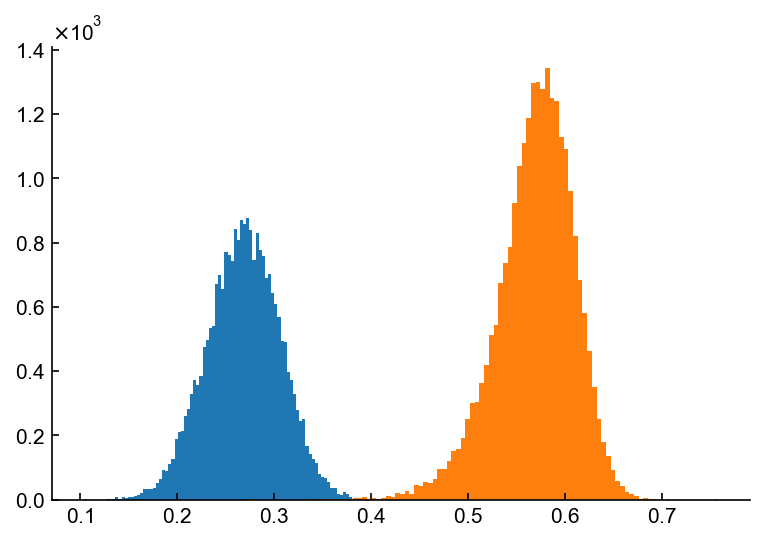

In [50]:
plt.hist(opto_dist,bins=100)
plt.hist(sham_dist,bins=100)
pass

In [51]:
mean_pc_NCR_control

[48.334722222222226, 63.343922651933696, 57.5527950310559]

In [ ]:
data_dec = SimpleNamespace()
data_dec.preearly = np.abs([0])
data_dec.prelate = np.abs([0])
data_dec.preexpert = np.abs([0])
data_dec.postearly = np.abs(FRmod_Ops_postearly)
data_dec.postlate = np.abs(FRmod_Ops_postlate)
data_dec.postexpert = np.abs(FRmod_Ops_postexpert)
ilep.nonparametricIndependentStatsCompareToPrevious(data_dec)
pass

In [330]:
data_dec = SimpleNamespace()
data_dec.preearly = np.abs([0])
data_dec.prelate = np.abs([0])
data_dec.preexpert = np.abs([0])
data_dec.postearly = np.abs(FRmod_Ops_postearly)
data_dec.postlate = np.abs(FRmod_Ops_postlate)
data_dec.postexpert = np.abs(FRmod_Ops_postexpert)
ilep.nonparametricIndependentStatsCompareToOwnEarly(data_dec)
pass

            Source             SS      DF         MS         F     p-unc  \
0            phase      95.910163     3.0  31.970054  0.428155  0.732847   
1          context       1.365956     1.0   1.365956  0.018293  0.892426   
2  phase * context      21.024859     3.0   7.008286  0.093858  0.963447   
3         Residual  146725.178864  1965.0  74.669302       NaN       NaN   

        np2  
0  0.000653  
1  0.000009  
2  0.000143  
3       NaN  

          phase         A             B     p-unc  p-corr    hedges
7   post-expert  baseline  experimental  0.806671     1.0  0.041312
8     post-late  baseline  experimental  0.848843     1.0 -0.027039
9    pre-expert  baseline  experimental  1.000000     1.0       NaN
10     pre-late  baseline  experimental  1.000000     1.0       NaN


C:\Users\insan\anaconda3\envs\EphysPlotting\lib\site-packages\pingouin\effsize.py:803: RuntimeWarning: invalid value encountered in double_scalars
  d = (x.mean() - y.mean()) / poolsd
C:\Users\insan\anaconda3\envs\EphysPlotting\lib\site-packages\numpy\core\_methods.py:262: RuntimeWarning: Degrees of freedom <= 0 for slice
  ret = _var(a, axis=axis, dtype=dtype, out=out, ddof=ddof,
C:\Users\insan\anaconda3\envs\EphysPlotting\lib\site-packages\numpy\core\_methods.py:254: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)


In [331]:
data_dec = SimpleNamespace()
data_dec.preearly = np.abs(FRmod_Ops_ON_postearly)
data_dec.prelate = np.abs(FRmod_Ops_ON_postlate)
data_dec.preexpert = np.abs(FRmod_Ops_ON_postexpert)
data_dec.postearly = np.abs(FRmod_Ops_OFF_postearly)
data_dec.postlate = np.abs(FRmod_Ops_OFF_postlate)
data_dec.postexpert = np.abs(FRmod_Ops_OFF_postexpert)
ilep.nonparametricIndependentStatsCompareToPrevious(data_dec)
pass

            Source             SS      DF          MS         F     p-unc  \
0            phase     820.138442     3.0  273.379481  3.483452  0.015219   
1          context       0.845654     1.0    0.845654  0.010775  0.917331   
2  phase * context      91.556863     3.0   30.518954  0.388878  0.761025   
3         Residual  229003.096797  2918.0   78.479471       NaN       NaN   

        np2  
0  0.003569  
1  0.000004  
2  0.000400  
3       NaN  

          phase         A             B     p-unc    p-corr    hedges
7   post-expert  baseline  experimental  0.722055  0.897463  0.075666
8     post-late  baseline  experimental  0.269289  0.897463 -0.004043
9    pre-expert  baseline  experimental  0.897463  0.897463  0.057709
10     pre-late  baseline  experimental  0.694071  0.897463 -0.048560


In [332]:
data_dec = SimpleNamespace()
data_dec.preearly = np.abs([0])
data_dec.prelate = np.abs([0])
data_dec.preexpert = np.abs([0])
data_dec.postearly = np.abs(FRmod_Ops_ON_postearly)
data_dec.postlate = np.abs(FRmod_Ops_ON_postlate)
data_dec.postexpert = np.abs(FRmod_Ops_ON_postexpert)

data_dec2 = SimpleNamespace()
data_dec2.preearly = np.abs([0])
data_dec2.prelate = np.abs([0])
data_dec2.preexpert = np.abs([0])
data_dec2.postearly = np.abs(FRmod_Ops_OFF_postearly)
data_dec2.postlate = np.abs(FRmod_Ops_OFF_postlate)
data_dec2.postexpert = np.abs(FRmod_Ops_OFF_postexpert)

ilep.nonparametricIndependentStatsCompareToOther(data_dec,data_dec2)
pass

            Source             SS      DF          MS         F     p-unc  \
0            phase     200.659171     5.0   40.131834  0.523944  0.758334   
1          context     577.983436     1.0  577.983436  7.545905  0.006061   
2  phase * context      26.543022     5.0    5.308604  0.069307  0.996671   
3         Residual  179693.365743  2346.0   76.595638       NaN       NaN   

        np2  
0  0.001115  
1  0.003206  
2  0.000148  
3       NaN  

          phase  A  B         p-unc    p-corr    hedges
16   post-early  A  B  3.824838e-07  0.000002  0.096849
17  post-expert  A  B  8.157882e-03  0.016316  0.195678
18    post-late  A  B  9.499780e-05  0.000285  0.137396
19    pre-early  A  B  1.000000e+00  1.000000       NaN
20   pre-expert  A  B  1.000000e+00  1.000000       NaN
21     pre-late  A  B  1.000000e+00  1.000000       NaN


C:\Users\insan\anaconda3\envs\EphysPlotting\lib\site-packages\pingouin\effsize.py:803: RuntimeWarning: invalid value encountered in double_scalars
  d = (x.mean() - y.mean()) / poolsd
C:\Users\insan\anaconda3\envs\EphysPlotting\lib\site-packages\numpy\core\_methods.py:262: RuntimeWarning: Degrees of freedom <= 0 for slice
  ret = _var(a, axis=axis, dtype=dtype, out=out, ddof=ddof,
C:\Users\insan\anaconda3\envs\EphysPlotting\lib\site-packages\numpy\core\_methods.py:254: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)


In [355]:
data_dec = SimpleNamespace()
data_dec.preearly = np.abs([0])
data_dec.prelate = np.abs([0])
data_dec.preexpert = np.abs([0])
data_dec.postearly = np.abs(FRmod_Ops_postearly)
data_dec.postlate = np.abs(FRmod_Ops_postlate)
data_dec.postexpert = np.abs(FRmod_Ops_postexpert)

data_dec2 = SimpleNamespace()
data_dec2.preearly = np.abs([0])
data_dec2.prelate = np.abs([0])
data_dec2.preexpert = np.abs([0])
data_dec2.postearly = np.abs(FRmod_postearly_Control)
data_dec2.postlate = np.abs(FRmod_postlate_Control)
data_dec2.postexpert = np.abs(FRmod_postexpert_Control)

ilep.nonparametricIndependentStatsCompareToOther(data_dec,data_dec2)
pass

            Source             SS      DF           MS          F     p-unc  \
0            phase    1113.054687     5.0   222.610937   2.568878  0.025183   
1          context    1331.465985     1.0  1331.465985  15.364807  0.000091   
2  phase * context    1268.574978     5.0   253.714996   2.927812  0.012223   
3         Residual  180766.216668  2086.0    86.656863        NaN       NaN   

        np2  
0  0.006120  
1  0.007312  
2  0.006969  
3       NaN  

          phase  A  B         p-unc    p-corr    hedges
16   post-early  A  B  7.753560e-07  0.000005 -0.314477
17  post-expert  A  B  4.140822e-01  0.845194 -0.082345
18    post-late  A  B  4.225972e-01  0.845194  0.041623
19    pre-early  A  B  1.000000e+00  1.000000       NaN
20   pre-expert  A  B  1.000000e+00  1.000000       NaN
21     pre-late  A  B  1.000000e+00  1.000000       NaN


C:\Users\insan\anaconda3\envs\EphysPlotting\lib\site-packages\pingouin\effsize.py:803: RuntimeWarning: invalid value encountered in double_scalars
  d = (x.mean() - y.mean()) / poolsd
C:\Users\insan\anaconda3\envs\EphysPlotting\lib\site-packages\numpy\core\_methods.py:262: RuntimeWarning: Degrees of freedom <= 0 for slice
  ret = _var(a, axis=axis, dtype=dtype, out=out, ddof=ddof,
C:\Users\insan\anaconda3\envs\EphysPlotting\lib\site-packages\numpy\core\_methods.py:254: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)


In [137]:
wilcoxon(FRmod_Ops_ON_postearly,FRmod_Ops_OFF_postearly)

WilcoxonResult(statistic=28289.0, pvalue=1.3868849500567667e-11)

In [138]:
wilcoxon(FRmod_Ops_ON_postlate,FRmod_Ops_OFF_postlate)

WilcoxonResult(statistic=1196.0, pvalue=3.9419699368227945e-07)

In [139]:
wilcoxon(FRmod_Ops_ON_postexpert,FRmod_Ops_OFF_postexpert)

WilcoxonResult(statistic=3517.0, pvalue=0.013195451540470988)

# Opsin Choice modulation

In [24]:
EnumSessionOps = []
EnumClustOps = []
sessions = os.listdir(ops_directory)
for session in tqdm(sessions):
    sessionfile = ilep.loadSessionCached(ops_directory,session)
    
    if sessionfile.meta.region != 'AC':
        continue
    if sessionfile.meta.task not in ['opto nonreversal','opto switch','opto reversal']:
        continue
        
    if sessionfile.meta.animal not in did_not_learn_animals:
        continue
        
    if hasattr(animalBehaviors[sessionfile.meta.animal],'cloudiness') and sessionfile.meta.day_of_training >= animalBehaviors[sessionfile.meta.animal].cloudiness:
        continue
    
    for clust in sessionfile.clusters.good:
        EnumSessionOps.append(session)
        EnumClustOps.append(clust)

100%|██████████| 147/147 [00:03<00:00, 45.61it/s]


In [25]:
EILphasesOps = np.full_like(EnumSessionOps,np.nan)
error_animals = []

for idx,session in enumerate(tqdm(EnumSessionOps)):
    sessionfile = ilep.loadSessionCached(ops_directory,session)
    
    try:
        animal = sessionfile.meta.animal
        day = sessionfile.meta.day_of_training
        
        day_after_reversal = day - animalBehaviors[animal].reversal
            
        if sessionfile.meta.task in ['switch','opto switch','tuning switch']:
            EILphasesOps[idx] = 'switch'

        elif sessionfile.meta.task in ['nonreversal','opto nonreversal','tuning nonreversal'] and day in learning_phases[animal].pre_early_days:
            EILphasesOps[idx] = 'pre early'
        elif sessionfile.meta.task in ['nonreversal','opto nonreversal','tuning nonreversal']  and day in learning_phases[animal].pre_late_days:
            EILphasesOps[idx] = 'pre late'
        elif sessionfile.meta.task in ['nonreversal','opto nonreversal','tuning nonreversal'] and day in learning_phases[animal].pre_expert_days:
            EILphasesOps[idx] = 'pre expert'

        elif sessionfile.meta.task in ['reversal','opto reversal','tuning reversal']  and day_after_reversal <= 2:#4:
            EILphasesOps[idx] = 'post early'
        elif sessionfile.meta.task in ['reversal','opto reversal','tuning reversal']  and day_after_reversal <= 4:#7:
            EILphasesOps[idx] = 'post late'
        elif sessionfile.meta.task in ['reversal','opto reversal','tuning reversal']  and day_after_reversal >= 5:#7:
            EILphasesOps[idx] = 'post expert'
    except Exception as e:
        #print(ilep.generateDateString(sessionfile))
        error_animals.append(sessionfile.meta.animal)
        pass
                             
error_animals = np.unique(error_animals)
print('errors for: '+str(error_animals))

100%|██████████| 902/902 [00:35<00:00, 25.11it/s] 

errors for: []


In [64]:
EnumSessionControl = []
EnumClustControl = []
sessions1 = os.listdir(act_directory)
sessions2 = os.listdir(ops_directory)
sessions = np.concatenate((sessions1,sessions2))
for session in tqdm(sessions):
    sessionfile = ilep.loadSessionCached([act_directory,ops_directory],session)
    
    if sessionfile.meta.region != 'AC':
        continue
    if sessionfile.meta.task not in ['nonreversal','switch','reversal','opto control nonreversal','opto control switch','opto control reversal']:
        continue
        
    if sessionfile.meta.animal not in opsin_control_animals:
        continue
    
    for clust in sessionfile.clusters.good:
        EnumSessionControl.append(session)
        EnumClustControl.append(clust)

100%|██████████| 907/907 [00:10<00:00, 83.35it/s] 


In [65]:
EILphasesControl = np.full_like(EnumSessionControl,np.nan)
error_animals = []

for idx,session in enumerate(tqdm(EnumSessionControl)):
#     sessionfile = ilep.loadSessionCached(act_directory,session)
    sessionfile = ilep.loadSessionCached([act_directory,ops_directory],session)
    
    try:
        animal = sessionfile.meta.animal
        day = sessionfile.meta.day_of_training
        
        if sessionfile.meta.task in ['switch','opto switch','tuning switch','opto control switch']:
            EILphasesControl[idx] = 'switch'

        elif sessionfile.meta.task in ['nonreversal','opto nonreversal','opto control nonreversal','tuning nonreversal'] and day in learning_phases[animal].pre_early_days:
            EILphasesControl[idx] = 'pre early'
        elif sessionfile.meta.task in ['nonreversal','opto nonreversal','opto control nonreversal','tuning nonreversal']  and day in learning_phases[animal].pre_late_days:
            EILphasesControl[idx] = 'pre late'
        elif sessionfile.meta.task in ['nonreversal','opto nonreversal','opto control nonreversal','tuning nonreversal'] and day in learning_phases[animal].pre_expert_days:
            EILphasesControl[idx] = 'pre expert'

        elif sessionfile.meta.task in ['reversal','opto reversal','opto control reversal','tuning reversal']  and day in learning_phases[animal].post_early_days:
            EILphasesControl[idx] = 'post early'
        elif sessionfile.meta.task in ['reversal','opto reversal','opto control reversal','tuning reversal']  and day in learning_phases[animal].post_late_days:
            EILphasesControl[idx] = 'post late'
        elif sessionfile.meta.task in ['reversal','opto reversal','opto control reversal','tuning reversal']  and day in learning_phases[animal].post_expert_days:
            EILphasesControl[idx] = 'post expert'
    except Exception as e:
        #print(ilep.generateDateString(sessionfile))
        error_animals.append(sessionfile.meta.animal)
        raise e
        pass
                             
error_animals = np.unique(error_animals)
print('errors for: '+str(error_animals))

100%|██████████| 1974/1974 [00:30<00:00, 64.24it/s] 

errors for: []


In [28]:
ChoiceMod_On_preearly = []
ChoiceMod_On_prelate = []
ChoiceMod_On_preexpert = []
ChoiceMod_On_postearly = []
ChoiceMod_On_postlate = []
ChoiceMod_On_postexpert = []

ChoiceMod_Off_preearly = []
ChoiceMod_Off_prelate = []
ChoiceMod_Off_preexpert = []
ChoiceMod_Off_postearly = []
ChoiceMod_Off_postlate = []
ChoiceMod_Off_postexpert = []

ChoiceMod_Control_preearly = []
ChoiceMod_Control_prelate = []
ChoiceMod_Control_preexpert = []
ChoiceMod_Control_postearly = []
ChoiceMod_Control_postlate = []
ChoiceMod_Control_postexpert = []

for idx,(session,clust) in tqdm(enumerate(zip(EnumSessionOps,EnumClustOps))):
    sessionfile = ilep.loadSessionCached(ops_directory,session)
    
#     if not is_TE_Ops[idx]:
#         continue
    
    if session == 'AE_287_2_opto_control_AC.pickle' and clust in [47,80,297,309]:
        continue
    if session == 'AE_287_3_opto_control_AC.pickle' and clust in [16,17,99,214,248]:
        continue
    if session == 'AE_287_4_opto_control_AC.pickle' and clust in [28,98]:
        continue
    if session == 'AE_287_8_opto_control_AC.pickle' and clust in [35,149]:
        continue
    if session == 'AE_287_9_opto_control_AC.pickle' and clust in [84]:
        continue
    if session == 'AE_287_10_opto_control_AC.pickle' and clust in [38]:
        continue
    
    if EILphasesOps[idx] not in ['pre expert','post expert'] and sessionfile.meta.animal in ['DS_15','DS_19']:
        continue
    
    try:
        ChoiceMod_on = sessionfile.responsiveness[clust]['laser_on'].FRmodulation_choice
        ChoiceMod_off = sessionfile.responsiveness[clust]['laser_off'].FRmodulation_choice
    except Exception as e:
        ChoiceMod_on = np.nan
        ChoiceMod_off = np.nan
        
    if EILphasesOps[idx] == 'pre early':
        ChoiceMod_On_preearly.append(ChoiceMod_on)
        ChoiceMod_Off_preearly.append(ChoiceMod_off)
    elif EILphasesOps[idx] == 'pre late':
        ChoiceMod_On_prelate.append(ChoiceMod_on)
        ChoiceMod_Off_prelate.append(ChoiceMod_off)
    elif EILphasesOps[idx] == 'pre expert':
        ChoiceMod_On_preexpert.append(ChoiceMod_on)
        ChoiceMod_Off_preexpert.append(ChoiceMod_off)
    elif EILphasesOps[idx] == 'post early':
        ChoiceMod_On_postearly.append(ChoiceMod_on)
        ChoiceMod_Off_postearly.append(ChoiceMod_off)
    elif EILphasesOps[idx] == 'post late':
        ChoiceMod_On_postlate.append(ChoiceMod_on)
        ChoiceMod_Off_postlate.append(ChoiceMod_off)
    elif EILphasesOps[idx] == 'post expert':
        ChoiceMod_On_postexpert.append(ChoiceMod_on)
        ChoiceMod_Off_postexpert.append(ChoiceMod_off)
        
        
for idx,(session,clust) in tqdm(enumerate(zip(EnumSessionControl,EnumClustControl))):
    sessionfile = ilep.loadSessionCached([act_directory,ops_directory],session)
    
#     if not is_TE_Control[idx]:
#         continue
    
    if session == 'AE_287_2_opto_control_AC.pickle' and clust in [47,80,297,309]:
        continue
    if session == 'AE_287_3_opto_control_AC.pickle' and clust in [16,17,99,214,248]:
        continue
    if session == 'AE_287_4_opto_control_AC.pickle' and clust in [28,98]:
        continue
    if session == 'AE_287_8_opto_control_AC.pickle' and clust in [35,149]:
        continue
    if session == 'AE_287_9_opto_control_AC.pickle' and clust in [84]:
        continue
    if session == 'AE_287_10_opto_control_AC.pickle' and clust in [38]:
        continue
        
    if EILphasesControl[idx] not in ['pre expert','post expert'] and sessionfile.meta.animal in ['DS_15','DS_19']:
        continue
        
    try:
        ChoiceMod = sessionfile.responsiveness[clust]['all_trials'].FRmodulation_choice
    except Exception as e:
        ChoiceMod = np.nan
    
    if EILphasesControl[idx] == 'pre early':
        ChoiceMod_Control_preearly.append(ChoiceMod)
    elif EILphasesControl[idx] == 'pre late':
        ChoiceMod_Control_prelate.append(ChoiceMod)
    elif EILphasesControl[idx] == 'pre expert':
        ChoiceMod_Control_preexpert.append(ChoiceMod)
    elif EILphasesControl[idx] == 'post early':
        ChoiceMod_Control_postearly.append(ChoiceMod)
    elif EILphasesControl[idx] == 'post late':
        ChoiceMod_Control_postlate.append(ChoiceMod)
    elif EILphasesControl[idx] == 'post expert':
        ChoiceMod_Control_postexpert.append(ChoiceMod)

ChoiceMod_On_preearly = np.array(ChoiceMod_On_preearly)
ChoiceMod_On_prelate = np.array(ChoiceMod_On_prelate)
ChoiceMod_On_preexpert = np.array(ChoiceMod_On_preexpert)
ChoiceMod_On_postearly = np.array(ChoiceMod_On_postearly)
ChoiceMod_On_postlate = np.array(ChoiceMod_On_postlate)
ChoiceMod_On_postexpert = np.array(ChoiceMod_On_postexpert)

ChoiceMod_Off_preearly = np.array(ChoiceMod_Off_preearly)
ChoiceMod_Off_prelate = np.array(ChoiceMod_Off_prelate)
ChoiceMod_Off_preexpert = np.array(ChoiceMod_Off_preexpert)
ChoiceMod_Off_postearly = np.array(ChoiceMod_Off_postearly)
ChoiceMod_Off_postlate = np.array(ChoiceMod_Off_postlate)
ChoiceMod_Off_postexpert = np.array(ChoiceMod_Off_postexpert)

ChoiceMod_Control_preearly = np.array(ChoiceMod_Control_preearly)
ChoiceMod_Control_prelate = np.array(ChoiceMod_Control_prelate)
ChoiceMod_Control_preexpert = np.array(ChoiceMod_Control_preexpert)
ChoiceMod_Control_postearly = np.array(ChoiceMod_Control_postearly)
ChoiceMod_Control_postlate = np.array(ChoiceMod_Control_postlate)
ChoiceMod_Control_postexpert = np.array(ChoiceMod_Control_postexpert)

902it [00:35, 25.72it/s] 
1830it [00:45, 39.98it/s] 


1.2424962377780202
1.3149212713222904
0.9802444441859488
1.3294937998339917
1.598191731798213
1.2044564852213315


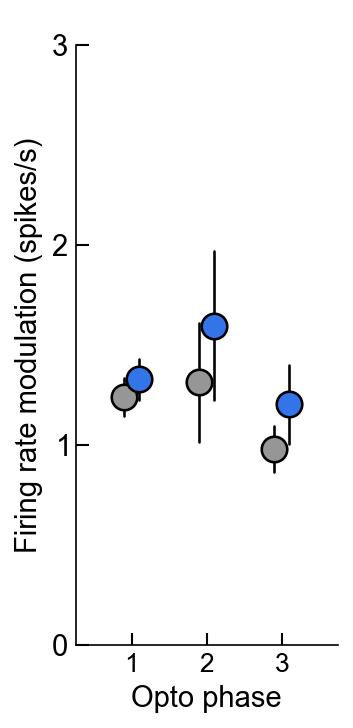

In [39]:
def add_axis_size(fig, ax_w, ax_h, left, bottom):
    fig_w, fig_h = fig.get_size_inches()
    ax = fig.add_axes([left/fig_w, bottom/fig_h, ax_w/fig_w, ax_h/fig_h])
    return ax

def make_axis_size(ax_w, ax_h, left=.3, bottom=.3, right=0, top=0):
    fig_w = (ax_w + left + right) * 1.05
    fig_h = (ax_h + bottom + top) * 1.05
    fig = plt.figure(figsize=(fig_w, fig_h))
    ax = add_axis_size(fig, ax_w, ax_h, left, bottom)
    return fig, ax

fig,ax = make_axis_size(1.75, 4, left=.3, bottom=.3, right=0, top=0)
switch_offset = 0

################################################################################################################

size = 20
summary_size=150
summary_width=1.25#0.75

mn = 3.5
spread = 2.5
    
###
    
FRmod_baseline_median = 3.5
# data = [FRmod_Ops_preearly,FRmod_Ops_prelate,FRmod_Ops_preexpert,FRmod_Ops_postearly,FRmod_Ops_postlate,FRmod_Ops_postexpert]
data = [ChoiceMod_On_postearly,ChoiceMod_On_postlate,ChoiceMod_On_postexpert]
data_control = [ChoiceMod_Control_postearly,ChoiceMod_Control_postlate,ChoiceMod_Control_postexpert]
data_control = [ChoiceMod_Off_postearly,ChoiceMod_Off_postlate,ChoiceMod_Off_postexpert]
labels = ['Early','Late','Expert']
numCon = len(data)

###
X = [np.ones(len(l))*idx + polarity*switch_offset for idx,(l,polarity) in enumerate(zip(data,[1,1,1]))]
_,Y = ilep.violin(np.concatenate(X),np.concatenate(data),width=0.75,minjitter=0.075)
X,_ = ilep.violin(np.concatenate(X),np.log10(np.concatenate(data)),width=0.75,minjitter=0.075)
colors = NCR_CR_cmap( (Y-(mn-spread/2))/ (spread) )

# ax.scatter(X, Y, s=size, ec=colors, fc='white', lw=1,zorder=-10,clip_on=False)
# ax.set_yscale('log',subs=[])

#Plot summary
offset=0.1
for idx,(column,polarity) in enumerate(zip(data_control,[1,1,1])):
    column = ilep.rmnan(column)
    percentCR = np.nanmean(np.greater(column,FRmod_baseline_median))*100
    
    eye_color= GOOD_GREY#NCR_CR_cmap((percentCR-40)/20)
    border_color = 'k'#NCR_CR_cmap((percentCR-40)/20)  
#     r,g,b = mpl.colors.to_rgb(eye_color)
#     h,l,s = colorsys.rgb_to_hls(r,g,b)
    
#     Q1, median, Q3 = (np.percentile(column, q) for q in [25, 50, 75])
    median = np.mean(column)
    Q1 = median - sem(column)
    Q3 = median + sem(column)

    print(median)
    
    ax.scatter([idx+polarity*switch_offset-offset], [median], ec=border_color,fc=eye_color, s=summary_size,lw=summary_width, zorder=10)
    ax.plot([idx+polarity*switch_offset-offset, idx+polarity*switch_offset-offset], [Q1, Q3], c=border_color, lw=summary_width, zorder=9, solid_capstyle='round')
    
for idx,(column,polarity) in enumerate(zip(data,[1,1,1])):
    column = ilep.rmnan(column)
    percentCR = np.nanmean(np.greater(column,FRmod_baseline_median))*100
    
    eye_color= LASER_COLOR#NCR_CR_cmap((percentCR-40)/20)
    border_color = 'k'#NCR_CR_cmap((percentCR-40)/20)  
#     r,g,b = mpl.colors.to_rgb(eye_color)
#     h,l,s = colorsys.rgb_to_hls(r,g,b)
    
#     Q1, median, Q3 = (np.percentile(column, q) for q in [25, 50, 75])
    median = np.mean(column)
    Q1 = median - sem(column)
    Q3 = median + sem(column)

    print(median)
    
    ax.scatter([idx+polarity*switch_offset+offset], [median], ec=border_color,fc=eye_color, s=summary_size,lw=summary_width, zorder=10)
    ax.plot([idx+polarity*switch_offset+offset, idx+polarity*switch_offset+offset], [Q1, Q3], c=border_color, lw=summary_width, zorder=9, solid_capstyle='round')


################################################################################################################
labels = ['1','2','3']

ax.set_ylim([0,3])
ax.set_yticks([0,1,2,3])
ylab = ax.set_ylabel('Firing rate modulation (spikes/s)')

ax.set_xlim([-0.75-switch_offset,2.75+switch_offset])
ax.set_xticks([0-switch_offset,1-switch_offset,2-switch_offset])
ax.set_xticklabels(labels)
ax.set_xlabel('Opto phase')
# xlab = ax.set_xlabel('Example X label')

# xtick_pos_pre = ax.get_xticks()[1]
# Yval = ilep.getPrePostLabelYval(ax.get_ylim(),Yfrac=-2*stdyfrac,log=True)
# t1 = ax.text(xtick_pos_pre, Yval, 'Post', ha='center', va='bottom', fontsize=stdfont,color='k')
# ax.annotate('', xy=(0.09, -stdyfrac), xycoords='axes fraction', xytext=(0.94, -stdyfrac),arrowprops=dict(arrowstyle='-', color='black'))

ax.tick_params(direction='in', length=6, width=1)

for item in ([ax.title, ax.xaxis.label, ax.yaxis.label] +
    ax.get_xticklabels() + ax.get_yticklabels()):
    item.set_fontsize(stdfont)
for item in (ax.get_xticklabels()):
    item.set_fontsize(stdfont*0.9)
    pass

# Y = np.mean(ax.get_ylim())
# Y = 10**np.mean(np.log10(ax.get_ylim()))
# t = ax.text(2.5,Y,'Reversal',rotation=90,fontsize=stdfont,color=SWITCH_COLOR,horizontalalignment='center',verticalalignment='center')
# ax.plot([2.5]*2,[ax.get_ylim()[0],Y*0.45],lw=1,color=SWITCH_COLOR)
# ax.plot([2.5]*2,[ax.get_ylim()[1],Y/0.45],lw=1,color=SWITCH_COLOR)

ax.fill_between(ax.get_xlim(),[ax.get_ylim()[0]]*2,[ax.get_ylim()[1]*2]*2,color='white',alpha=0.4,zorder=-5,clip_on=False)

ttl = ax.set_title(' ')
artists = [ylab]
fig.savefig(os.path.join('D:\\\\Figures','Manuscript Figures','AC Opto Mean of ChoiceModulation V'+str(current_version)+'.pdf'),transparent=False,facecolor="white",dpi=400, bbox_extra_artists=(artists), bbox_inches='tight')

In [40]:
data_dec = SimpleNamespace()
data_dec.early = np.abs(ChoiceMod_On_postearly)
data_dec.late = np.abs(ChoiceMod_On_postlate)
data_dec.expert = np.abs(ChoiceMod_On_postexpert)

data_dec2 = SimpleNamespace()
data_dec2.early = np.abs(ChoiceMod_Off_postearly)
data_dec2.late = np.abs(ChoiceMod_Off_postlate)
data_dec2.expert = np.abs(ChoiceMod_Off_postexpert)

ilep.nonparametricIndependentStatsCompareToOtherSmall(data_dec,data_dec2)
pass

            Source           SS      DF        MS         F     p-unc  \
0            phase    18.888712     2.0  9.444356  1.515571  0.220127   
1          context     8.223874     1.0  8.223874  1.319716  0.250885   
2  phase * context     2.094898     2.0  1.047449  0.168088  0.845300   
3         Residual  7066.575897  1134.0  6.231548       NaN       NaN   

        np2  
0  0.002666  
1  0.001162  
2  0.000296  
3       NaN  

    phase  A  B     p-unc    p-corr    hedges
4   early  A  B  0.600483  0.600483  0.052506
5  expert  A  B  0.477915  0.600483  0.115264
6    late  A  B  0.482757  0.600483  0.070775
key early has 286 and 286 non-nan elements
key late has 140 and 140 non-nan elements
key expert has 144 and 144 non-nan elements


1.363447581573825
1.6416057846372663
2.092314457839793
1.3294937998339917
1.598191731798213
1.2044564852213315


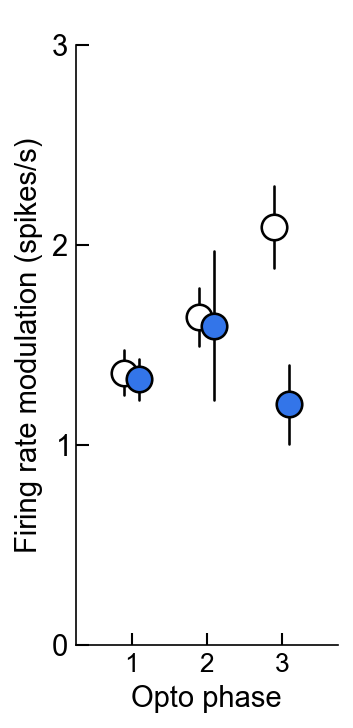

In [32]:
def add_axis_size(fig, ax_w, ax_h, left, bottom):
    fig_w, fig_h = fig.get_size_inches()
    ax = fig.add_axes([left/fig_w, bottom/fig_h, ax_w/fig_w, ax_h/fig_h])
    return ax

def make_axis_size(ax_w, ax_h, left=.3, bottom=.3, right=0, top=0):
    fig_w = (ax_w + left + right) * 1.05
    fig_h = (ax_h + bottom + top) * 1.05
    fig = plt.figure(figsize=(fig_w, fig_h))
    ax = add_axis_size(fig, ax_w, ax_h, left, bottom)
    return fig, ax

fig,ax = make_axis_size(1.75, 4, left=.3, bottom=.3, right=0, top=0)
switch_offset = 0

################################################################################################################

size = 20
summary_size=150
summary_width=1.25#0.75

mn = 3.5
spread = 2.5
    
###
    
FRmod_baseline_median = 3.5
# data = [FRmod_Ops_preearly,FRmod_Ops_prelate,FRmod_Ops_preexpert,FRmod_Ops_postearly,FRmod_Ops_postlate,FRmod_Ops_postexpert]
data = [ChoiceMod_On_postearly,ChoiceMod_On_postlate,ChoiceMod_On_postexpert]
data_control = [ChoiceMod_Control_postearly,ChoiceMod_Control_postlate,ChoiceMod_Control_postexpert]
# data_control = [ChoiceMod_Off_postearly,ChoiceMod_Off_postlate,ChoiceMod_Off_postexpert]
labels = ['Early','Late','Expert']
numCon = len(data)

###
X = [np.ones(len(l))*idx + polarity*switch_offset for idx,(l,polarity) in enumerate(zip(data,[1,1,1]))]
_,Y = ilep.violin(np.concatenate(X),np.concatenate(data),width=0.75,minjitter=0.075)
X,_ = ilep.violin(np.concatenate(X),np.log10(np.concatenate(data)),width=0.75,minjitter=0.075)
colors = NCR_CR_cmap( (Y-(mn-spread/2))/ (spread) )

# ax.scatter(X, Y, s=size, ec=colors, fc='white', lw=1,zorder=-10,clip_on=False)
# ax.set_yscale('log',subs=[])

#Plot summary
offset=0.1
for idx,(column,polarity) in enumerate(zip(data_control,[1,1,1])):
    column = ilep.rmnan(column)
    percentCR = np.nanmean(np.greater(column,FRmod_baseline_median))*100
    
    eye_color= 'white'#NCR_CR_cmap((percentCR-40)/20)
    border_color = 'k'#NCR_CR_cmap((percentCR-40)/20)  
#     r,g,b = mpl.colors.to_rgb(eye_color)
#     h,l,s = colorsys.rgb_to_hls(r,g,b)
    
#     Q1, median, Q3 = (np.percentile(column, q) for q in [25, 50, 75])
    median = np.mean(column)
    Q1 = median - sem(column)
    Q3 = median + sem(column)

    print(median)
    
    ax.scatter([idx+polarity*switch_offset-offset], [median], ec=border_color,fc=eye_color, s=summary_size,lw=summary_width, zorder=10)
    ax.plot([idx+polarity*switch_offset-offset, idx+polarity*switch_offset-offset], [Q1, Q3], c=border_color, lw=summary_width, zorder=9, solid_capstyle='round')
    
for idx,(column,polarity) in enumerate(zip(data,[1,1,1])):
    column = ilep.rmnan(column)
    percentCR = np.nanmean(np.greater(column,FRmod_baseline_median))*100
    
    eye_color= LASER_COLOR#NCR_CR_cmap((percentCR-40)/20)
    border_color = 'k'#NCR_CR_cmap((percentCR-40)/20)  
#     r,g,b = mpl.colors.to_rgb(eye_color)
#     h,l,s = colorsys.rgb_to_hls(r,g,b)
    
#     Q1, median, Q3 = (np.percentile(column, q) for q in [25, 50, 75])
    median = np.mean(column)
    Q1 = median - sem(column)
    Q3 = median + sem(column)

    print(median)
    
    ax.scatter([idx+polarity*switch_offset+offset], [median], ec=border_color,fc=eye_color, s=summary_size,lw=summary_width, zorder=10)
    ax.plot([idx+polarity*switch_offset+offset, idx+polarity*switch_offset+offset], [Q1, Q3], c=border_color, lw=summary_width, zorder=9, solid_capstyle='round')


################################################################################################################
labels = ['1','2','3']

# ax.set_ylim([0,3])
# ax.set_yticks([0,1,2,3])
# ylab = ax.set_ylabel('Firing rate modulation (spikes/s)')
ax.set_ylim([0,3])
ax.set_yticks([0,1,2,3])
ylab = ax.set_ylabel('Firing rate modulation (spikes/s)')

ax.set_xlim([-0.75-switch_offset,2.75+switch_offset])
ax.set_xticks([0-switch_offset,1-switch_offset,2-switch_offset])
ax.set_xticklabels(labels)
ax.set_xlabel('Opto phase')
# xlab = ax.set_xlabel('Example X label')

# xtick_pos_pre = ax.get_xticks()[1]
# Yval = ilep.getPrePostLabelYval(ax.get_ylim(),Yfrac=-2*stdyfrac,log=True)
# t1 = ax.text(xtick_pos_pre, Yval, 'Post', ha='center', va='bottom', fontsize=stdfont,color='k')
# ax.annotate('', xy=(0.09, -stdyfrac), xycoords='axes fraction', xytext=(0.94, -stdyfrac),arrowprops=dict(arrowstyle='-', color='black'))

ax.tick_params(direction='in', length=6, width=1)

for item in ([ax.title, ax.xaxis.label, ax.yaxis.label] +
    ax.get_xticklabels() + ax.get_yticklabels()):
    item.set_fontsize(stdfont)
for item in (ax.get_xticklabels()):
    item.set_fontsize(stdfont*0.9)
    pass

# Y = np.mean(ax.get_ylim())
# Y = 10**np.mean(np.log10(ax.get_ylim()))
# t = ax.text(2.5,Y,'Reversal',rotation=90,fontsize=stdfont,color=SWITCH_COLOR,horizontalalignment='center',verticalalignment='center')
# ax.plot([2.5]*2,[ax.get_ylim()[0],Y*0.45],lw=1,color=SWITCH_COLOR)
# ax.plot([2.5]*2,[ax.get_ylim()[1],Y/0.45],lw=1,color=SWITCH_COLOR)

ax.fill_between(ax.get_xlim(),[ax.get_ylim()[0]]*2,[ax.get_ylim()[1]*2]*2,color='white',alpha=0.4,zorder=-5,clip_on=False)

ttl = ax.set_title(' ')
artists = [ylab]
fig.savefig(os.path.join('D:\\\\Figures','Manuscript Figures','AC Opto Mean of ChoiceModulation vs control V'+str(current_version)+'.pdf'),transparent=False,facecolor="white",dpi=400, bbox_extra_artists=(artists), bbox_inches='tight')

In [30]:
data_dec = SimpleNamespace()
data_dec.early = np.abs(ChoiceMod_On_postearly)
data_dec.late = np.abs(ChoiceMod_On_postlate)
data_dec.expert = np.abs(ChoiceMod_On_postexpert)

data_dec2 = SimpleNamespace()
data_dec2.early = np.abs(ChoiceMod_Control_postearly)
data_dec2.late = np.abs(ChoiceMod_Control_postlate)
data_dec2.expert = np.abs(ChoiceMod_Control_postexpert)

ilep.nonparametricIndependentStatsCompareToOtherSmall(data_dec,data_dec2)
pass

            Source           SS      DF         MS         F     p-unc  \
0            phase    33.301352     2.0  16.650676  2.396843  0.091370   
1          context    22.442875     1.0  22.442875  3.230622  0.072484   
2  phase * context    46.522152     2.0  23.261076  3.348401  0.035416   
3         Residual  9947.990427  1432.0   6.946921       NaN       NaN   

        np2  
0  0.003336  
1  0.002251  
2  0.004655  
3       NaN  

    phase  A  B     p-unc    p-corr    hedges
4   early  A  B  0.526856  0.676884 -0.018403
5  expert  A  B  0.000062  0.000186 -0.318159
6    late  A  B  0.676884  0.676884 -0.013250
key early has 286 and 306 non-nan elements
key late has 140 and 342 non-nan elements
key expert has 144 and 220 non-nan elements


C:\Users\4thgr\anaconda3\envs\EphysAnalysis\Lib\site-packages\pingouin\pairwise.py:593: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  stats["Time"].fillna("-", inplace=True)


In [31]:
data_dec = SimpleNamespace()
data_dec.preearly = np.abs(ChoiceMod_On_postearly)
data_dec.prelate = np.abs(ChoiceMod_On_postlate)
data_dec.preexpert = np.abs(ChoiceMod_On_postexpert)
data_dec.postearly = np.abs(ChoiceMod_Off_postearly)
data_dec.postlate = np.abs(ChoiceMod_Off_postlate)
data_dec.postexpert = np.abs(ChoiceMod_Off_postexpert)

ilep.nonparametricIndependentStatsCompareToPrevious(data_dec)
pass

            Source            SS      DF        MS         F     p-unc  \
0            phase     15.171121     3.0  5.057040  0.621137  0.601356   
1          context      1.169597     1.0  1.169597  0.143657  0.704729   
2  phase * context     25.065205     3.0  8.355068  1.026222  0.379995   
3         Residual  11495.914975  1412.0  8.141583       NaN       NaN   

        np2  
0  0.001318  
1  0.000102  
2  0.002176  
3       NaN  

          phase         A             B     p-unc    p-corr    hedges
7   post-expert  baseline  experimental  0.188228  0.440218  0.124898
8     post-late  baseline  experimental  0.532257  0.709676 -0.030066
9    pre-expert  baseline  experimental  0.220109  0.440218  0.111596
10     pre-late  baseline  experimental  0.848187  0.848187 -0.092849
key preearly has 286 non-nan elements
key prelate has 140 non-nan elements
key preexpert has 144 non-nan elements
key postearly has 286 non-nan elements
key postlate has 140 non-nan elements
key postexpert ha

C:\Users\4thgr\anaconda3\envs\EphysAnalysis\Lib\site-packages\pingouin\pairwise.py:593: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  stats["Time"].fillna("-", inplace=True)


In [64]:
opsin_control_animals

array(['BS_40', 'BS_41', 'BS_42', 'BS_49', 'BS_50', 'BS_51', 'BS_56',
       'BS_59', 'BS_67', 'BS_70', 'BS_72', 'BS_87', 'BS_108', 'DS_15',
       'DS_19', 'AE_312'], dtype='<U6')

# Opto Choice

In [36]:
EnumSessionOps = []
EnumClustOps = []
sessions = os.listdir(ops_directory)
for session in tqdm(sessions):
    sessionfile = ilep.loadSessionCached(ops_directory,session)
    
    if sessionfile.meta.region != 'AC':
        continue
    if sessionfile.meta.task not in ['opto nonreversal','opto switch','opto reversal']:
        continue
        
    if sessionfile.meta.animal not in did_not_learn_animals:
        continue
        
    if hasattr(animalBehaviors[sessionfile.meta.animal],'cloudiness') and sessionfile.meta.day_of_training >= animalBehaviors[sessionfile.meta.animal].cloudiness:
        continue
    
    for clust in sessionfile.clusters.good:
        EnumSessionOps.append(session)
        EnumClustOps.append(clust)

100%|██████████| 167/167 [00:02<00:00, 56.97it/s]


In [37]:
EILphasesOps = np.full_like(EnumSessionOps,np.nan)
error_animals = []

for idx,session in enumerate(tqdm(EnumSessionOps)):
    sessionfile = ilep.loadSessionCached(ops_directory,session)
    
    try:
        animal = sessionfile.meta.animal
        day = sessionfile.meta.day_of_training
        
        day_after_reversal = day - animalBehaviors[animal].reversal
            
        if sessionfile.meta.task in ['switch','opto switch','tuning switch']:
            EILphasesOps[idx] = 'switch'

        elif sessionfile.meta.task in ['nonreversal','opto nonreversal','tuning nonreversal'] and day in learning_phases[animal].pre_early_days:
            EILphasesOps[idx] = 'pre early'
        elif sessionfile.meta.task in ['nonreversal','opto nonreversal','tuning nonreversal']  and day in learning_phases[animal].pre_late_days:
            EILphasesOps[idx] = 'pre late'
        elif sessionfile.meta.task in ['nonreversal','opto nonreversal','tuning nonreversal'] and day in learning_phases[animal].pre_expert_days:
            EILphasesOps[idx] = 'pre expert'

        elif sessionfile.meta.task in ['reversal','opto reversal','tuning reversal']  and day_after_reversal <= 2:
            EILphasesOps[idx] = 'post early'
        elif sessionfile.meta.task in ['reversal','opto reversal','tuning reversal']  and day_after_reversal <= 4:
            EILphasesOps[idx] = 'post late'
        elif sessionfile.meta.task in ['reversal','opto reversal','tuning reversal']  and day_after_reversal > 4:
            EILphasesOps[idx] = 'post expert'
    except Exception as e:
        #print(ilep.generateDateString(sessionfile))
        error_animals.append(sessionfile.meta.animal)
        pass
                             
error_animals = np.unique(error_animals)
print('errors for: '+str(error_animals))

100%|██████████| 902/902 [00:26<00:00, 34.02it/s] 

errors for: []


In [38]:
EnumSessionControl = []
EnumClustControl = []
sessions = os.listdir(act_directory)
# sessions = os.listdir(ops_directory)
for session in tqdm(sessions):
    sessionfile = ilep.loadSessionCached(act_directory,session)
#     sessionfile = ilep.loadSessionCached(ops_directory,session)
    
    if sessionfile.meta.region != 'AC':
        continue
    if sessionfile.meta.task not in ['nonreversal','switch','reversal','opto control nonreversal','opto control switch','opto control reversal']:
        continue
        
    if sessionfile.meta.animal not in opsin_control_animals:
        continue
    
    for clust in sessionfile.clusters.good:
        EnumSessionControl.append(session)
        EnumClustControl.append(clust)

100%|██████████| 740/740 [00:09<00:00, 75.59it/s] 


In [39]:
EILphasesControl = np.full_like(EnumSessionControl,np.nan)
error_animals = []

for idx,session in enumerate(tqdm(EnumSessionControl)):
    sessionfile = ilep.loadSessionCached(act_directory,session)
#     sessionfile = ilep.loadSessionCached(ops_directory,session)
    
    try:
        animal = sessionfile.meta.animal
        day = sessionfile.meta.day_of_training
        
        if sessionfile.meta.task in ['switch','opto switch','tuning switch','opto control switch']:
            EILphasesControl[idx] = 'switch'

        elif sessionfile.meta.task in ['nonreversal','opto nonreversal','opto control nonreversal','tuning nonreversal'] and day in learning_phases[animal].pre_early_days:
            EILphasesControl[idx] = 'pre early'
        elif sessionfile.meta.task in ['nonreversal','opto nonreversal','opto control nonreversal','tuning nonreversal']  and day in learning_phases[animal].pre_late_days:
            EILphasesControl[idx] = 'pre late'
        elif sessionfile.meta.task in ['nonreversal','opto nonreversal','opto control nonreversal','tuning nonreversal'] and day in learning_phases[animal].pre_expert_days:
            EILphasesControl[idx] = 'pre expert'

        elif sessionfile.meta.task in ['reversal','opto reversal','opto control reversal','tuning reversal']  and day in learning_phases[animal].post_early_days:
            EILphasesControl[idx] = 'post early'
        elif sessionfile.meta.task in ['reversal','opto reversal','opto control reversal','tuning reversal']  and day in learning_phases[animal].post_late_days:
            EILphasesControl[idx] = 'post late'
        elif sessionfile.meta.task in ['reversal','opto reversal','opto control reversal','tuning reversal']  and day in learning_phases[animal].post_expert_days:
            EILphasesControl[idx] = 'post expert'
    except Exception as e:
        #print(ilep.generateDateString(sessionfile))
        error_animals.append(sessionfile.meta.animal)
        raise e
        pass
                             
error_animals = np.unique(error_animals)
print('errors for: '+str(error_animals))

100%|██████████| 1829/1829 [00:33<00:00, 54.03it/s] 

errors for: []


In [40]:
ChoiceMod_preearly_Ops = []
ChoiceMod_prelate_Ops = []
ChoiceMod_preexpert_Ops = []
ChoiceMod_postearly_Ops = []
ChoiceMod_postlate_Ops = []
ChoiceMod_postexpert_Ops = []

preearly_animals_Ops = []
prelate_animals_Ops = []
preexpert_animals_Ops = []
postearly_animals_Ops = []
postlate_animals_Ops = []
postexpert_animals_Ops = []

cellstouseFR = 'all cells'
#cellstouseFR = 'task encoders'

for idx,(session,clust) in tqdm(enumerate(zip(EnumSessionOps,EnumClustOps))):
    sessionfile = ilep.loadSessionCached(ops_directory,session)
    
    if session == 'AE_287_2_opto_control_AC.pickle' and clust in [47,80,297,309]:
        continue
    if session == 'AE_287_3_opto_control_AC.pickle' and clust in [16,17,99,214,248]:
        continue
    if session == 'AE_287_4_opto_control_AC.pickle' and clust in [28,98]:
        continue
    if session == 'AE_287_8_opto_control_AC.pickle' and clust in [35,149]:
        continue
    if session == 'AE_287_9_opto_control_AC.pickle' and clust in [84]:
        continue
    if session == 'AE_287_10_opto_control_AC.pickle' and clust in [38]:
        continue
    
    #Currently not active as tuning curve animals have not been decoded
    if cellstouseFR == 'task encoders':
        if not np.isfinite(accuracies[idx]) or pvals[idx] > 0.05 or accuracies[idx] < task_encoder_threshold:
            continue
    
    if EILphasesOps[idx] not in ['pre expert','post expert'] and sessionfile.meta.animal in ['DS_15','DS_19']:
        continue
        
    try:
        ChoiceMod = sessionfile.responsiveness[clust]['laser_on'].FRmodulation_choice
    except Exception as e:
        ChoiceMod = np.nan
        
    if EILphasesOps[idx] == 'pre early':
        ChoiceMod_preearly_Ops.append(ChoiceMod)
    elif EILphasesOps[idx] == 'pre late':
        ChoiceMod_prelate_Ops.append(ChoiceMod)
    elif EILphasesOps[idx] == 'pre expert':
        ChoiceMod_preexpert_Ops.append(ChoiceMod)
    elif EILphasesOps[idx] == 'post early':
        ChoiceMod_postearly_Ops.append(ChoiceMod)
    elif EILphasesOps[idx] == 'post late':
        ChoiceMod_postlate_Ops.append(ChoiceMod)
    elif EILphasesOps[idx] == 'post expert':
        ChoiceMod_postexpert_Ops.append(ChoiceMod)

ChoiceMod_preearly_Ops = np.array(ChoiceMod_preearly_Ops)
ChoiceMod_prelate_Ops = np.array(ChoiceMod_prelate_Ops)
ChoiceMod_preexpert_Ops = np.array(ChoiceMod_preexpert_Ops)
ChoiceMod_postearly_Ops = np.array(ChoiceMod_postearly_Ops)
ChoiceMod_postlate_Ops = np.array(ChoiceMod_postlate_Ops)
ChoiceMod_postexpert_Ops = np.array(ChoiceMod_postexpert_Ops)

902it [00:27, 33.06it/s] 


In [41]:
5

5

1.3294937998339917
1.598191731798213
1.2044564852213315


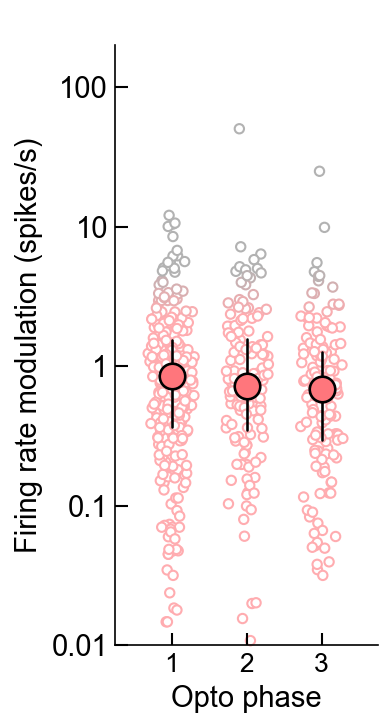

In [20]:
def add_axis_size(fig, ax_w, ax_h, left, bottom):
    fig_w, fig_h = fig.get_size_inches()
    ax = fig.add_axes([left/fig_w, bottom/fig_h, ax_w/fig_w, ax_h/fig_h])
    return ax

def make_axis_size(ax_w, ax_h, left=.3, bottom=.3, right=0, top=0):
    fig_w = (ax_w + left + right) * 1.05
    fig_h = (ax_h + bottom + top) * 1.05
    fig = plt.figure(figsize=(fig_w, fig_h))
    ax = add_axis_size(fig, ax_w, ax_h, left, bottom)
    return fig, ax

fig,ax = make_axis_size(1.75, 4, left=.3, bottom=.3, right=0, top=0)
switch_offset = 0

################################################################################################################

size = 20
summary_size=150
summary_width=1.25#0.75

mn = 3.5
spread = 2.5
    
###
    
FRmod_baseline_median = 3.5
# data = [FRmod_Ops_preearly,FRmod_Ops_prelate,FRmod_Ops_preexpert,FRmod_Ops_postearly,FRmod_Ops_postlate,FRmod_Ops_postexpert]
data = [ChoiceMod_postearly_Ops,ChoiceMod_postlate_Ops,ChoiceMod_postexpert_Ops]
labels = ['Early','Late','Expert']
numCon = len(data)

###
X = [np.ones(len(l))*idx + polarity*switch_offset for idx,(l,polarity) in enumerate(zip(data,[1,1,1]))]
_,Y = ilep.violin(np.concatenate(X),np.concatenate(data),width=0.75,minjitter=0.075)
X,_ = ilep.violin(np.concatenate(X),np.log10(np.concatenate(data)),width=0.75,minjitter=0.075)
colors = NCR_CR_cmap( (Y-(mn-spread/2))/ (spread) )

ax.scatter(X, Y, s=size, ec=colors, fc='white', lw=1,zorder=-10,clip_on=False)
ax.set_yscale('log',subs=[])

#Plot summary
for idx,(column,polarity) in enumerate(zip(data,[1,1,1])):
    try:
        column = ilep.rmnan(column)
        percentCR = np.nanmean(np.greater(column,FRmod_baseline_median))*100

        eye_color= NCR_CR_cmap((percentCR-40)/20)
        border_color = 'k'#NCR_CR_cmap((percentCR-40)/20)  
    #     r,g,b = mpl.colors.to_rgb(eye_color)
    #     h,l,s = colorsys.rgb_to_hls(r,g,b)

        Q1, median, Q3 = (np.percentile(column, q) for q in [25, 50, 75])
    #     median = np.mean(column)
    #     Q1 = median - sem(column)
    #     Q1 = median + sem(column)
#         print(median)
        print(np.mean(column))

        ax.scatter([idx+polarity*switch_offset], [median], ec=border_color,fc=eye_color, s=summary_size,lw=summary_width, zorder=10)
        ax.plot([idx+polarity*switch_offset, idx+polarity*switch_offset], [Q1, Q3], c=border_color, lw=summary_width, zorder=9, solid_capstyle='round')
    except:
        pass

################################################################################################################
labels = ['1','2','3']

ax.set_ylim([0.01,200])
ax.set_yticks([0.01,0.1,1,10,100])
ax.set_yticklabels(['0.01','0.1','1','10','100'])
ylab = ax.set_ylabel('Firing rate modulation (spikes/s)')

ax.set_xlim([-0.75-switch_offset,2.75+switch_offset])
ax.set_xticks([0-switch_offset,1-switch_offset,2-switch_offset])
ax.set_xticklabels(labels)
ax.set_xlabel('Opto phase')
# xlab = ax.set_xlabel('Example X label')

# xtick_pos_pre = ax.get_xticks()[1]
# Yval = ilep.getPrePostLabelYval(ax.get_ylim(),Yfrac=-2*stdyfrac,log=True)
# t1 = ax.text(xtick_pos_pre, Yval, 'Post', ha='center', va='bottom', fontsize=stdfont,color='k')
# ax.annotate('', xy=(0.09, -stdyfrac), xycoords='axes fraction', xytext=(0.94, -stdyfrac),arrowprops=dict(arrowstyle='-', color='black'))

ax.tick_params(direction='in', length=6, width=1)

for item in ([ax.title, ax.xaxis.label, ax.yaxis.label] +
    ax.get_xticklabels() + ax.get_yticklabels()):
    item.set_fontsize(stdfont)
for item in (ax.get_xticklabels()):
    item.set_fontsize(stdfont*0.9)
    pass

# Y = np.mean(ax.get_ylim())
# Y = 10**np.mean(np.log10(ax.get_ylim()))
# t = ax.text(2.5,Y,'Reversal',rotation=90,fontsize=stdfont,color=SWITCH_COLOR,horizontalalignment='center',verticalalignment='center')
# ax.plot([2.5]*2,[ax.get_ylim()[0],Y*0.45],lw=1,color=SWITCH_COLOR)
# ax.plot([2.5]*2,[ax.get_ylim()[1],Y/0.45],lw=1,color=SWITCH_COLOR)

ax.fill_between(ax.get_xlim(),[ax.get_ylim()[0]]*2,[ax.get_ylim()[1]*2]*2,color='white',alpha=0.4,zorder=-5,clip_on=False)

ttl = ax.set_title(' ')
artists = [ylab]
fig.savefig(os.path.join('D:\\\\Figures','Manuscript Figures','AC Opto choice FRmodulation all cells over learning V'+str(current_version)+'.pdf'),transparent=False,facecolor="white",dpi=400, bbox_extra_artists=(artists), bbox_inches='tight')
# fig.savefig(os.path.join('D:\\\\Figures','Manuscript Figures','AC Opto FRmodulation task encoders over learning V'+str(current_version)+'.pdf'),transparent=False,facecolor="white",dpi=400, bbox_extra_artists=(artists), bbox_inches='tight')

In [21]:
data_dec = SimpleNamespace()
data_dec.early = np.abs(ChoiceMod_postearly_Ops)
data_dec.late = np.abs(ChoiceMod_postlate_Ops)
data_dec.expert = np.abs(ChoiceMod_postexpert_Ops)

ilep.nonparametricIndependentStatsCompareToPreviousSmall(data_dec)
pass

            Source           SS     DF         MS         F     p-unc  \
0            phase     0.044011    1.0   0.044011  0.004420  0.947013   
1          context     0.044011    1.0   0.044011  0.004420  0.947013   
2  phase * context    17.746743    1.0  17.746743  1.782213  0.182308   
3         Residual  7030.135419  706.0   9.957699       NaN       NaN   

        np2  
0  0.000006  
1  0.000006  
2  0.002518  
3       NaN  

        phase         A             B     p-unc    p-corr    hedges
2  pre-expert  baseline  experimental  0.220109  0.440218  0.111596
3    pre-late  baseline  experimental  0.848187  0.848187 -0.092849
key early has 286 non-nan elements
key late has 140 non-nan elements
key expert has 144 non-nan elements


In [68]:
#Bootstrapped Mw and SEMw calculation adapted from Gatz & Smith (1993)
# THE STANDARD ERROR OF A WEIGHTED MEAN CONCENTRATION-I. BOOTSTRAPPING VS OTHER METHODS

def hier_boot_Mw_SEMw(FRmods,B=200,n_frac=1,CR_NCR_thresh=3.5):
    FRmods = np.array(FRmods)
    mask = np.greater([len(l) for l in FRmods],0)
    FRmods = FRmods[mask]
    
    Mw_list = []
    for idx_B in range(B):
        this_sample_animals = []
        N = len(FRmods)
        this_sample_animals = np.random.choice(FRmods,N)
        
        this_sample = []
        for this_FRmod_list in this_sample_animals:
            n = int(n_frac*len(this_FRmod_list))
            if n < 1:
                n=1
            sample = np.random.choice(this_FRmod_list,n)
            this_sample.append(sample)
        
        this_pcs = [np.mean(np.less(FRmod,CR_NCR_thresh)) for FRmod in this_sample]
        this_sizes = [len(l) for l in this_sample]
        Mw = np.average(this_pcs,weights=this_sizes)
        Mw_list.append(Mw)
        
    Mw_estimate = np.mean(Mw_list)*100
    SEMw_estimate = np.std(Mw_list)*100# / np.sqrt(B)
        
    return Mw_estimate,SEMw_estimate

def hier_boot_pc_NCR_test(X,Y,B=200,CR_NCR_thresh=3.5,alpha=0.05):
    #https://www.ncbi.nlm.nih.gov/pmc/articles/PMC7906290/
    #Application of the hierarchical bootstrap to multi-level data in neuroscience
    #Saravanan et al.
    
    #Testing against the null hypothesis that these two groups are the same
    X = np.array(X)
    mask = np.greater([len(l) for l in X],0)
    X = X[mask]
    
    Y = np.array(Y)
    mask = np.greater([len(l) for l in Y],0)
    Y = Y[mask]
    
    MwX_list = []
    for idx_B in range(B):
        this_sample_animals = []
        N = len(FRmods)
        this_sample_animals = np.random.choice(X,N)
        
        this_sample = []
        for this_list in this_sample_animals:
            n = len(this_list)
            sample = np.random.choice(this_list,n)
            this_sample.append(sample)
        
        this_pcs = [np.mean(np.less(X,CR_NCR_thresh)) for X in this_sample]
        this_sizes = [len(l) for l in this_sample]
        Mw = np.average(this_pcs,weights=this_sizes)
        MwX_list.append(Mw)
        
    MwY_list = []
    for idx_B in range(B):
        this_sample_animals = []
        N = len(FRmods)
        this_sample_animals = np.random.choice(Y,N)
        
        this_sample = []
        for this_list in this_sample_animals:
            n = len(this_list)
            sample = np.random.choice(this_list,n)
            this_sample.append(sample)
        
        this_pcs = [np.mean(np.less(Y,CR_NCR_thresh)) for Y in this_sample]
        this_sizes = [len(l) for l in this_sample]
        Mw = np.average(this_pcs,weights=this_sizes)
        MwY_list.append(Mw)
        
    #Two-sided test
    diffs = (np.array(MwY_list) - np.array(MwX_list))
    pY = 1 - np.mean(np.greater(diffs,0))
    pX = 1 - np.mean(np.less(diffs,0))
    pboot = min(pX,pY)*2
    return pboot

In [42]:
preearly_Ops_animal = []
prelate_Ops_animal = []
preexpert_Ops_animal = []
postearly_Ops_animal = []
postlate_Ops_animal = []
postexpert_Ops_animal = []

pre_early_session = []

percent_ncr_postearly_animal = []
percent_ncr_postlate_animal = []
percent_ncr_postexpert_animal = []
n_postearly_animal = []
n_postlate_animal = []
n_postexpert_animal = []
FR_postearly_animal = []
FR_postlate_animal = []
FR_postexpert_animal = []

for animal in animals:
    
    ChoiceMod_Ops_postearly_this_animal = []
    ChoiceMod_Ops_postlate_this_animal = []
    ChoiceMod_Ops_postexpert_this_animal = []
    n_postearly_this_animal = 0
    n_postlate_this_animal = 0
    n_postexpert_this_animal = 0
    
    for idx,(session,clust) in tqdm(enumerate(zip(EnumSessionOps,EnumClustOps))):

        sessionfile = ilep.loadSessionCached(ops_directory,session)
        rev_day = animalBehaviors[sessionfile.meta.animal].reversal
        day_relative_to_rev = sessionfile.meta.day_of_training - rev_day
        
        if session == 'AE_287_2_opto_control_AC.pickle' and clust in [47,80,297,309]:
            continue
        if session == 'AE_287_3_opto_control_AC.pickle' and clust in [16,17,99,214,248]:
            continue
        if session == 'AE_287_4_opto_control_AC.pickle' and clust in [28,98]:
            continue
        if session == 'AE_287_8_opto_control_AC.pickle' and clust in [35,149]:
            continue
        if session == 'AE_287_9_opto_control_AC.pickle' and clust in [84]:
            continue
        if session == 'AE_287_10_opto_control_AC.pickle' and clust in [38]:
            continue

        #Currently not active as tuning curve animals have not been decoded
        if cellstouseFR == 'task encoders':
            if not np.isfinite(accuracies[idx]) or pvals[idx] > 0.05 or accuracies[idx] < task_encoder_threshold:
                continue

        if EILphasesOps[idx] not in ['pre expert','post expert'] and sessionfile.meta.animal in ['DS_15','DS_19']:
            continue
        
        if sessionfile.meta.animal != animal:
            continue

        if day_relative_to_rev < 1:
            continue
            
        if hasattr(animalBehaviors[sessionfile.meta.animal],'cloudiness') and sessionfile.meta.day_of_training >= animalBehaviors[sessionfile.meta.animal].cloudiness:
            continue

        try:
            ChoiceMod = sessionfile.responsiveness[clust]['laser_on'].FRmodulation_choice
        except Exception as e:
            print(f"{session} cluster {clust} has error: {e}")
            ChoiceMod = np.nan

    #     #1,2,3,4
    #     #5,6
    #     #7,8

        #9,10,11,12
        if day_relative_to_rev in [1,2]:#[1,2,3,4]:
            ChoiceMod_Ops_postearly_this_animal.append(ChoiceMod)
            n_postearly_this_animal += 1
#             FRmod_Ops_ON_postearly.append(FRmod_on)
#             FRmod_Ops_OFF_postearly.append(FRmod_off)
            postearly_Ops_animal.append(sessionfile.meta.animal)

        #13,14,15
        if day_relative_to_rev in [3,4]:#[5,6,7]:
            ChoiceMod_Ops_postlate_this_animal.append(ChoiceMod)
            n_postlate_this_animal += 1
#             FRmod_Ops_ON_postlate.append(FRmod_on)
#             FRmod_Ops_OFF_postlate.append(FRmod_off)
#             postlate_session_num.append(sessionfile.meta.files)
            postlate_Ops_animal.append(sessionfile.meta.animal)

        #16,17,18,19,20,21
        if day_relative_to_rev >= 5:#8:
            ChoiceMod_Ops_postexpert_this_animal.append(ChoiceMod)
            n_postexpert_this_animal += 1
#             FRmod_Ops_ON_postexpert.append(FRmod_on)
#             FRmod_Ops_OFF_postexpert.append(FRmod_off)
#             postexpert_session_num.append(sessionfile.meta.files)
            postexpert_Ops_animal.append(sessionfile.meta.animal)
    
    #Remove nans
    ChoiceMod_Ops_postearly_this_animal = ilep.rmnan(ChoiceMod_Ops_postearly_this_animal)
    ChoiceMod_Ops_postlate_this_animal = ilep.rmnan(ChoiceMod_Ops_postlate_this_animal)
    ChoiceMod_Ops_postexpert_this_animal = ilep.rmnan(ChoiceMod_Ops_postexpert_this_animal)
    n_postearly_this_animal = len(ChoiceMod_Ops_postearly_this_animal)
    n_postlate_this_animal = len(ChoiceMod_Ops_postlate_this_animal)
    n_postexpert_this_animal = len(ChoiceMod_Ops_postexpert_this_animal)

    FR_postearly_animal.append(ChoiceMod_Ops_postearly_this_animal)
    FR_postlate_animal.append(ChoiceMod_Ops_postlate_this_animal)
    FR_postexpert_animal.append(ChoiceMod_Ops_postexpert_this_animal)
    percent_ncr_postearly_animal.append(np.mean(np.less(ChoiceMod_Ops_postearly_this_animal,0.8308610286728099)))
    percent_ncr_postlate_animal.append(np.mean(np.less(ChoiceMod_Ops_postlate_this_animal,0.8308610286728099)))
    percent_ncr_postexpert_animal.append(np.mean(np.less(ChoiceMod_Ops_postexpert_this_animal,0.8308610286728099)))
    n_postearly_animal.append(n_postearly_this_animal)
    n_postlate_animal.append(n_postlate_this_animal)
    n_postexpert_animal.append(n_postexpert_this_animal)

902it [00:25, 34.88it/s] 
902it [00:25, 34.94it/s] 
C:\Users\insan\anaconda3\envs\EphysPlotting\lib\site-packages\numpy\core\fromnumeric.py:3440: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
C:\Users\insan\anaconda3\envs\EphysPlotting\lib\site-packages\numpy\core\_methods.py:189: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
902it [00:25, 34.77it/s] 
902it [00:26, 34.65it/s] 
902it [00:26, 34.47it/s] 
902it [00:26, 33.92it/s] 
902it [00:26, 34.26it/s] 
902it [00:26, 34.52it/s] 


In [43]:
preearly_Control_animal = []
prelate_Control_animal = []
preexpert_Control_animal = []
postearly_Control_animal = []
postlate_Control_animal = []
postexpert_Control_animal = []

pre_early_session = []

percent_ncr_postearly_control_animal = []
percent_ncr_postlate_control_animal = []
percent_ncr_postexpert_control_animal = []
n_postearly_control_animal = []
n_postlate_control_animal = []
n_postexpert_control_animal = []
FR_postearly_control_animal = []
FR_postlate_control_animal = []
FR_postexpert_control_animal = []

for animal in opsin_control_animals:
    
    FRmod_Control_postearly_this_animal = []
    FRmod_Control_postlate_this_animal = []
    FRmod_Control_postexpert_this_animal = []
    n_postearly_control_this_animal = 0
    n_postlate_control_this_animal = 0
    n_postexpert_control_this_animal = 0
    
    for idx,(session,clust) in tqdm(enumerate(zip(EnumSessionControl,EnumClustControl))):

        sessionfile = ilep.loadSessionCached([act_directory,ops_directory],session)
#         sessionfile = ilep.loadSessionCached(ops_directory,session)
        
        if session == 'AE_287_2_opto_control_AC.pickle' and clust in [47,80,297,309]:
            continue
        if session == 'AE_287_3_opto_control_AC.pickle' and clust in [16,17,99,214,248]:
            continue
        if session == 'AE_287_4_opto_control_AC.pickle' and clust in [28,98]:
            continue
        if session == 'AE_287_8_opto_control_AC.pickle' and clust in [35,149]:
            continue
        if session == 'AE_287_9_opto_control_AC.pickle' and clust in [84]:
            continue
        if session == 'AE_287_10_opto_control_AC.pickle' and clust in [38]:
            continue

        #Currently not active as tuning curve animals have not been decoded
        if cellstouseFR == 'task encoders':
            if not np.isfinite(accuracies[idx]) or pvals[idx] > 0.05 or accuracies[idx] < task_encoder_threshold:
                continue

        if EILphasesControl[idx] not in ['pre expert','post expert'] and sessionfile.meta.animal in ['DS_15','DS_19']:
            continue
    
        rev_day = animalBehaviors[sessionfile.meta.animal].reversal
        day_relative_to_rev = sessionfile.meta.day_of_training - rev_day
        
        if sessionfile.meta.animal != animal:
            continue

        if day_relative_to_rev < 1:
            continue

        try:
            FRmod = sessionfile.responsiveness[clust]['all_trials'].FRmodulation_choice
#             FRmod = sessionfile.responsiveness[clust]['laser_on'].FRmodulation
        except Exception as e:
            print(f"{session} cluster {clust} has error: {e}")
            FRmod = np.nan

    #     #1,2,3,4
    #     #5,6
    #     #7,8

        #9,10,11,12
        if EILphasesControl[idx] == 'post early':
            FRmod_Control_postearly_this_animal.append(FRmod)
            n_postearly_control_this_animal += 1
#             FRmod_Ops_ON_postearly.append(FRmod_on)
#             FRmod_Ops_OFF_postearly.append(FRmod_off)
            postearly_Control_animal.append(sessionfile.meta.animal)

        #13,14,15
        if EILphasesControl[idx] == 'post late':
            FRmod_Control_postlate_this_animal.append(FRmod)
            n_postlate_control_this_animal += 1
#             FRmod_Ops_ON_postlate.append(FRmod_on)
#             FRmod_Ops_OFF_postlate.append(FRmod_off)
#             postlate_session_num.append(sessionfile.meta.files)
            postlate_Control_animal.append(sessionfile.meta.animal)

        #16,17,18,19,20,21
        if EILphasesControl[idx] == 'post expert':
            FRmod_Control_postexpert_this_animal.append(FRmod)
            n_postexpert_control_this_animal += 1
#             FRmod_Ops_ON_postexpert.append(FRmod_on)
#             FRmod_Ops_OFF_postexpert.append(FRmod_off)
#             postexpert_session_num.append(sessionfile.meta.files)
            postexpert_Control_animal.append(sessionfile.meta.animal)

    #Remove nans
    FRmod_Control_postearly_this_animal = ilep.rmnan(FRmod_Control_postearly_this_animal)
    FRmod_Control_postlate_this_animal = ilep.rmnan(FRmod_Control_postlate_this_animal)
    FRmod_Control_postexpert_this_animal = ilep.rmnan(FRmod_Control_postexpert_this_animal)
    n_postearly_control_this_animal = len(FRmod_Control_postearly_this_animal)
    n_postlate_control_this_animal = len(FRmod_Control_postlate_this_animal)
    n_postexpert_control_this_animal = len(FRmod_Control_postexpert_this_animal)
    
    FR_postearly_control_animal.append(FRmod_Control_postearly_this_animal)
    FR_postlate_control_animal.append(FRmod_Control_postlate_this_animal)
    FR_postexpert_control_animal.append(FRmod_Control_postexpert_this_animal)
    percent_ncr_postearly_control_animal.append(np.mean(np.less(FRmod_Control_postearly_this_animal,0.8308610286728099)))
    percent_ncr_postlate_control_animal.append(np.mean(np.less(FRmod_Control_postlate_this_animal,0.8308610286728099)))
    percent_ncr_postexpert_control_animal.append(np.mean(np.less(FRmod_Control_postexpert_this_animal,0.8308610286728099)))
    n_postearly_control_animal.append(n_postearly_control_this_animal)
    n_postlate_control_animal.append(n_postlate_control_this_animal)
    n_postexpert_control_animal.append(n_postexpert_control_this_animal)

1829it [00:33, 53.96it/s] 
1829it [00:33, 54.67it/s] 
1829it [00:33, 54.87it/s] 
1829it [00:33, 54.74it/s] 
1829it [00:29, 62.82it/s] 
1829it [00:28, 64.12it/s] 
1829it [00:28, 64.03it/s] 
1829it [00:28, 63.23it/s] 
1829it [00:28, 63.54it/s] 
1829it [00:29, 62.84it/s] 
1829it [00:29, 61.73it/s] 
1829it [00:30, 59.46it/s] 
1829it [00:30, 59.94it/s] 
1396it [00:22, 62.46it/s] 

DS_15_15_AC.pickle cluster 0 has error: 'types.SimpleNamespace' object has no attribute 'FRmodulation_choice'
DS_15_15_AC.pickle cluster 6 has error: 'types.SimpleNamespace' object has no attribute 'FRmodulation_choice'
DS_15_15_AC.pickle cluster 7 has error: 'types.SimpleNamespace' object has no attribute 'FRmodulation_choice'
DS_15_15_AC.pickle cluster 10 has error: 'types.SimpleNamespace' object has no attribute 'FRmodulation_choice'
DS_15_15_AC.pickle cluster 12 has error: 'types.SimpleNamespace' object has no attribute 'FRmodulation_choice'
DS_15_15_AC.pickle cluster 19 has error: 'types.SimpleNamespace' object has no attribute 'FRmodulation_choice'
DS_15_15_AC.pickle cluster 28 has error: 'types.SimpleNamespace' object has no attribute 'FRmodulation_choice'
DS_15_15_AC.pickle cluster 29 has error: 'types.SimpleNamespace' object has no attribute 'FRmodulation_choice'
DS_15_15_AC.pickle cluster 36 has error: 'types.SimpleNamespace' object has no attribute 'FRmodulation_choice'
DS_1

1405it [00:22, 68.15it/s]

DS_15_15_AC.pickle cluster 81 has error: 'types.SimpleNamespace' object has no attribute 'FRmodulation_choice'
DS_15_15_AC.pickle cluster 86 has error: 'types.SimpleNamespace' object has no attribute 'FRmodulation_choice'
DS_15_15_AC.pickle cluster 88 has error: 'types.SimpleNamespace' object has no attribute 'FRmodulation_choice'
DS_15_15_AC.pickle cluster 91 has error: 'types.SimpleNamespace' object has no attribute 'FRmodulation_choice'
DS_15_15_AC.pickle cluster 101 has error: 'types.SimpleNamespace' object has no attribute 'FRmodulation_choice'
DS_15_15_AC.pickle cluster 111 has error: 'types.SimpleNamespace' object has no attribute 'FRmodulation_choice'
DS_15_15_AC.pickle cluster 113 has error: 'types.SimpleNamespace' object has no attribute 'FRmodulation_choice'
DS_15_15_AC.pickle cluster 114 has error: 'types.SimpleNamespace' object has no attribute 'FRmodulation_choice'
DS_15_15_AC.pickle cluster 122 has error: 'types.SimpleNamespace' object has no attribute 'FRmodulation_choi

1423it [00:22, 69.62it/s]

DS_15_15_AC.pickle cluster 134 has error: 'types.SimpleNamespace' object has no attribute 'FRmodulation_choice'


1829it [00:29, 62.65it/s] 
1829it [00:29, 62.35it/s] 
1829it [00:29, 63.04it/s] 


In [44]:
print(opsin_control_animals)

['BS_40' 'BS_41' 'BS_42' 'BS_49' 'BS_50' 'BS_51' 'BS_56' 'BS_59' 'BS_67'
 'BS_70' 'BS_72' 'BS_87' 'BS_108' 'DS_15' 'DS_19' 'AE_312']


In [63]:
# mean_pc_NCR = np.array([np.nansum(np.array(d1)*np.array(d2))/np.nansum(d2) for d1,d2 in zip([percent_ncr_postearly_animal,percent_ncr_postlate_animal,percent_ncr_postexpert_animal],[n_postearly_animal,n_postlate_animal,n_postexpert_animal])])*100
# sem_pc_NCR = np.array([sem(ilep.rmnan(d)) for d in [percent_ncr_postearly_animal,percent_ncr_postlate_animal,percent_ncr_postexpert_animal]])*100

mean_pc_NCR = []
sem_pc_NCR = []
for FRmods in [FR_postearly_animal,FR_postlate_animal,FR_postexpert_animal]:
    Mw,SEMw = ilep.bootstrap_Mw_SEMw(FRmods,CR_NCR_thresh=[0.81])#0.8308610286728099)
    mean_pc_NCR.append(Mw)
    sem_pc_NCR.append(SEMw)

In [64]:
# mean_pc_NCR_control = np.array([np.nansum(np.array(d1)*np.array(d2))/np.nansum(d2) for d1,d2 in zip([percent_ncr_postearly_control_animal,percent_ncr_postlate_control_animal,percent_ncr_postexpert_control_animal],[n_postearly_control_animal,n_postlate_control_animal,n_postexpert_control_animal])])*100
# sem_pc_NCR_control = np.array([sem(ilep.rmnan(d)) for d in [percent_ncr_postearly_control_animal,percent_ncr_postlate_control_animal,percent_ncr_postexpert_control_animal]])*100

mean_pc_NCR_control = []
sem_pc_NCR_control = []
for FRmods in [FR_postearly_control_animal,FR_postlate_control_animal,FR_postexpert_control_animal]:
    Mw,SEMw = ilep.bootstrap_Mw_SEMw(FRmods,CR_NCR_thresh=0.8308610286728099)
    mean_pc_NCR_control.append(Mw)
    sem_pc_NCR_control.append(SEMw)

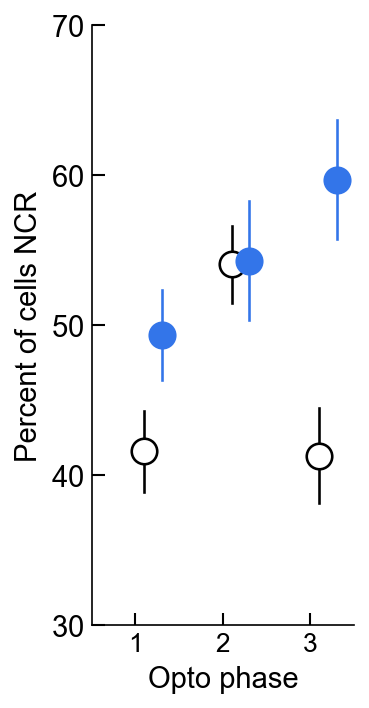

In [67]:
def add_axis_size(fig, ax_w, ax_h, left, bottom):
    fig_w, fig_h = fig.get_size_inches()
    ax = fig.add_axes([left/fig_w, bottom/fig_h, ax_w/fig_w, ax_h/fig_h])
    return ax

def make_axis_size(ax_w, ax_h, left=.3, bottom=.3, right=0, top=0):
    fig_w = (ax_w + left + right) * 1.05
    fig_h = (ax_h + bottom + top) * 1.05
    fig = plt.figure(figsize=(fig_w, fig_h))
    ax = add_axis_size(fig, ax_w, ax_h, left, bottom)
    return fig, ax

def statsbar(ax,barheight,xpoints,stemheights,text=None,lw=1):
    ymax = ax.get_ylim()[1]
    ymin = ax.get_ylim()[0]
    yrange = ymax-ymin
    ydist = 0.025*yrange
    
    ax.plot([xpoints[0]]*2,[stemheights[0]+ydist,barheight],lw=lw,color='k')
    ax.plot([xpoints[1]]*2,[stemheights[1]+ydist,barheight],lw=lw,color='k')
    ax.plot(xpoints,[barheight]*2,lw=lw,color='k')
    
    if not text is None:
        ax.text(np.mean(xpoints),barheight + ydist,text,horizontalalignment='center',verticalalignment='center')

fig,ax = make_axis_size(1.75, 4, left=.3, bottom=.3, right=0, top=0)
switch_offset = 0#0.1

################################################################################################################

wid = 0.2

offset=0.1
for idx,p in zip(range(6),[1,1,1]):
    
    ax.scatter([idx+wid+p*switch_offset-offset],(mean_pc_NCR_control[idx]),ec='k',fc='white',s=150,zorder=10,marker='o',lw=1.25)
    ax.plot([idx+wid+p*switch_offset-offset,idx+wid+p*switch_offset-offset],[(mean_pc_NCR_control[idx]-sem_pc_NCR_control[idx]),(mean_pc_NCR_control[idx]+sem_pc_NCR_control[idx])],color='k',lw=1.25,zorder=9)
    
    ax.scatter([idx+wid+p*switch_offset+offset],(mean_pc_NCR[idx]),c=LASER_COLOR,s=150,zorder=10,marker='o',lw=1.25)
    ax.plot([idx+wid+p*switch_offset+offset,idx+wid+p*switch_offset+offset],[(mean_pc_NCR[idx]-sem_pc_NCR[idx]),(mean_pc_NCR[idx]+sem_pc_NCR[idx])],color=LASER_COLOR,lw=1.25,zorder=9)
    
#ax.scatter([0,1,2,3,4,5],(mean_pc_NCR_passive)/100,fc='white',ec=GOOD_GREY,s=50,zorder=9,marker='o',lw=1)
# statsbar(ax,82,[1-wid-switch_offset,1+wid-switch_offset],stemheights=[passive_mean_pc_NCR[1]+passive_sem_pc_NCR[1] , mean_pc_NCR[1]+sem_pc_NCR[1]],text='*',lw=1)
# statsbar(ax,82,[4-wid+switch_offset,4+wid+switch_offset],stemheights=[passive_mean_pc_NCR[4]+passive_sem_pc_NCR[4] , mean_pc_NCR[4]+sem_pc_NCR[4]],text='****',lw=1)
# statsbar(ax,70,[5-wid+switch_offset,5+wid+switch_offset],stemheights=[passive_mean_pc_NCR[5]+passive_sem_pc_NCR[5] , mean_pc_NCR[5]+sem_pc_NCR[5]],text='****',lw=1)

################################################################################################################

labels = ['1','2','3']

ylab = ax.set_ylabel('Percent of cells NCR')
ax.set_ylim([30,70])
ax.set_yticks([30,40,50,60,70])
              
ax.set_xlim([-0.5-switch_offset,2.5+switch_offset])
ax.set_xticks([0-switch_offset,1-switch_offset,2-switch_offset])
ax.set_xticklabels(labels)
ax.set_xlabel('Opto phase')

# xtick_pos_pre = ax.get_xticks()[1]
# xtick_pos_post = ax.get_xticks()[4]
# Yval = ilep.getPrePostLabelYval(ax.get_ylim(),Yfrac=-2*stdyfrac)
# t1 = ax.text(xtick_pos_pre, Yval, 'Pre', ha='center', va='bottom', fontsize=stdfont,color='k')
# t2 = ax.text(xtick_pos_post, Yval, 'Post', ha='center', va='bottom',  fontsize=stdfont,color='k')
# ax.annotate('', xy=(0.03, -stdyfrac), xycoords='axes fraction', xytext=(0.49, -stdyfrac),arrowprops=dict(arrowstyle='-', color='black'))
# ax.annotate('', xy=(0.53, -stdyfrac), xycoords='axes fraction', xytext=(0.99, -stdyfrac),arrowprops=dict(arrowstyle='-', color='black'))

ax.tick_params(direction='in', length=6, width=1)

for item in ([ax.title, ax.xaxis.label, ax.yaxis.label] +
    ax.get_xticklabels() + ax.get_yticklabels()):
    item.set_fontsize(stdfont)
for item in (ax.get_xticklabels()):
    item.set_fontsize(stdfont*0.9)
    pass

# ax.scatter([], [], ec=PASSIVE_COLOR,fc='white', s=50,lw=1,marker='o',label='passive')
# ax.scatter([], [], ec=PASSIVE_COLOR,fc=PASSIVE_COLOR, s=50,lw=1,marker='o',label='behaving')
# ax.legend(frameon=False,loc=(0.5,0.1),fontsize=14)

### Log
# Y = 10**np.mean(np.log10(ax.get_ylim()))
# t = ax.text(2.5,Y,'Reversal',rotation=90,fontsize=stdfont,color=SWITCH_COLOR,horizontalalignment='center',verticalalignment='center')
# ax.plot([2.5]*2,[ax.get_ylim()[0],Y*0.45],lw=1,color=SWITCH_COLOR)
# ax.plot([2.5]*2,[ax.get_ylim()[1],Y/0.45],lw=1,color=SWITCH_COLOR)

### Linear
# Y = np.mean(ax.get_ylim())
# t = ax.text(2.5,Y,'Reversal',rotation=90,fontsize=stdfont,color=SWITCH_COLOR,horizontalalignment='center',verticalalignment='center')
# ax.plot([2.5]*2,[ax.get_ylim()[0],Y-np.ptp(ax.get_ylim())*0.125],lw=1,color=SWITCH_COLOR)
# ax.plot([2.5]*2,[ax.get_ylim()[1],Y+np.ptp(ax.get_ylim())*0.125],lw=1,color=SWITCH_COLOR)

artists = [ylab]
fig.savefig(os.path.join('D:\\\\Figures','Manuscript Figures','AC Opto choice percent NCR V'+str(current_version)+'.pdf'),transparent=False,facecolor="white",dpi=400, bbox_extra_artists=(artists), bbox_inches='tight')

In [68]:
Xs = [FR_postearly_animal,FR_postlate_animal,FR_postexpert_animal]
Ys = [FR_postearly_control_animal,FR_postlate_control_animal,FR_postexpert_control_animal]

pvals = [np.nan]*3
for idx,(X,Y) in enumerate(zip(Xs,Ys)):
    pvals[idx] = ilep.bootstrap_pc_NCR_test(X,Y,B=250000,CR_NCR_thresh=[0.81,0.8308610286728099])
    print(pvals[idx])
    
_,pvals_corr = pg.multicomp(pvals,method='fdr_bh')
print()
print(pvals_corr)

0.053239999999999954
0.97288
0.00043999999999999595

[0.07986 0.97288 0.00132]


In [69]:
5

5

In [52]:
data_dec = SimpleNamespace()
data_dec.early = np.abs(ChoiceMod_postearly_Ops)
data_dec.late = np.abs(ChoiceMod_postlate_Ops)
data_dec.expert = np.abs(ChoiceMod_postexpert_Ops)

ilep.nonparametricIndependentStatsCompareToPreviousSmall(data_dec)
pass

            Source           SS     DF         MS         F     p-unc  \
0            phase     0.044011    1.0   0.044011  0.004420  0.947013   
1          context     0.044011    1.0   0.044011  0.004420  0.947013   
2  phase * context    17.746743    1.0  17.746743  1.782213  0.182308   
3         Residual  7030.135419  706.0   9.957699       NaN       NaN   

        np2  
0  0.000006  
1  0.000006  
2  0.002518  
3       NaN  

        phase         A             B     p-unc    p-corr    hedges
2  pre-expert  baseline  experimental  0.220109  0.440218  0.111596
3    pre-late  baseline  experimental  0.848187  0.848187 -0.092849
key early has 286 non-nan elements
key late has 140 non-nan elements
key expert has 144 non-nan elements


C:\Users\4thgr\anaconda3\envs\EphysAnalysis\Lib\site-packages\pingouin\pairwise.py:593: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  stats["Time"].fillna("-", inplace=True)


In [39]:
data_dec = SimpleNamespace()
data_dec.early = np.abs(ChoiceMod_Control_postearly)
data_dec.late = np.abs(ChoiceMod_Control_postlate)
data_dec.expert = np.abs(ChoiceMod_Control_postexpert)

data_dec2 = SimpleNamespace()
data_dec2.early = np.abs(ChoiceMod_postearly_Ops)
data_dec2.late = np.abs(ChoiceMod_postlate_Ops)
data_dec2.expert = np.abs(ChoiceMod_postexpert_Ops)

ilep.nonparametricIndependentStatsCompareToOtherSmall(data_dec,data_dec2)
pass

NameError: name 'ChoiceMod_postearly_Ops' is not defined

# Testing Control Laser Modulation Latency

In [53]:
FRmod_delta_abs = []
FRmod_delta_pc_baseline = []
FRmod_delta_pc = []
FRmod_delta_pc_target = []
FRmod_delta_pc_nontarget = []
FRmod_on = []
FRmod_off = []
FRmod_on_target = []
FRmod_off_target = []
FRmod_on_nontarget = []
FRmod_off_nontarget = []
latency_on = []

for idx,(session,clust) in tqdm(enumerate(zip(EnumSessionOps,EnumClustOps))):
    sessionfile = ilep.loadSessionCached(ops_directory,session)
    
    if sessionfile.meta.animal not in did_not_learn_animals:
        continue
    
    if sessionfile.meta.day_of_training >= animalBehaviors[sessionfile.meta.animal].cloudiness:
        continue
        
    if not sessionfile.meta.task == 'opto reversal':
        continue

    on = sessionfile.responsiveness[clust]['laser_on'].FRmodulation
    off = sessionfile.responsiveness[clust]['laser_off'].FRmodulation
    ontarget = sessionfile.responsiveness[clust]['laser_on_target'].FRmodulation
    offtarget = sessionfile.responsiveness[clust]['laser_off_target'].FRmodulation
    onnontarget = sessionfile.responsiveness[clust]['laser_on_nontarget'].FRmodulation
    offnontarget = sessionfile.responsiveness[clust]['laser_off_nontarget'].FRmodulation
    offbaseline = sessionfile.responsiveness[clust]['laser_off'].FRbaseline
    latency = ilep.calculate_latency(sessionfile,clust,cond='laser_on')

    try:
        FRmod_on.append(on)
        FRmod_off.append(off)
        FRmod_on_target.append(ontarget)
        FRmod_off_target.append(offtarget)
        FRmod_on_nontarget.append(onnontarget)
        FRmod_off_nontarget.append(offnontarget)
        FRmod_delta_abs.append( (on-off) )
        FRmod_delta_pc_baseline.append( (on-off)/offbaseline*100 )
        FRmod_delta_pc.append( (on-off)/off*100 )
        FRmod_delta_pc_target.append( (ontarget-offtarget)/offtarget*100 )
        FRmod_delta_pc_nontarget.append( (onnontarget-offnontarget)/offnontarget*100 )
        latency_on.append(latency)
    except Exception as e:
        print(session + ': '+ str(e))
        
FRmod_on = np.array(FRmod_on)
FRmod_off = np.array(FRmod_off)
FRmod_off_target = np.array(FRmod_off_target)
FRmod_off_nontarget = np.array(FRmod_off_nontarget)
FRmod_delta_pc = np.array(FRmod_delta_pc)
FRmod_delta_pc_target = np.array(FRmod_delta_pc_target)
FRmod_delta_pc_nontarget = np.array(FRmod_delta_pc_nontarget)
latency_on = np.array(latency_on)

379it [00:54,  5.40it/s]<ipython-input-53-a0ef957c393b>:43: RuntimeWarning: divide by zero encountered in double_scalars
  FRmod_delta_pc_baseline.append( (on-off)/offbaseline*100 )
902it [02:58,  5.06it/s]


In [55]:
FRmod_control_delta_abs = []
FRmod_control_delta_pc = []
FRmod_control_delta_pc_baseline = []
FRmod_control_on = []
FRmod_control_off = []
latency_control_on = []

for idx,(session,clust) in tqdm(enumerate(zip(EnumSessionControl,EnumClustControl))):
    sessionfile = ilep.loadSessionCached(ops_directory,session)
    
    if sessionfile.meta.animal not in opsin_control_animals:
        continue
#     if sessionfile.meta.animal in ['AE_301']:
#         continue
    
#     if sessionfile.meta.day_of_training >= animalBehaviors[sessionfile.meta.animal].cloudiness:
#         continue
        
    if not sessionfile.meta.task == 'opto control reversal':
        continue

    try:
        on = sessionfile.responsiveness[clust]['laser_on'].FRmodulation
        off = sessionfile.responsiveness[clust]['laser_off'].FRmodulation
        offbaseline = sessionfile.responsiveness[clust]['laser_off'].FRbaseline
        latency = ilep.calculate_latency(sessionfile,clust,cond='laser_on')
    except:
        continue

    try:
        FRmod_control_on.append(on)
        FRmod_control_off.append(off)
        FRmod_control_delta_abs.append( (on-off) )
        FRmod_control_delta_pc.append( (on-off)/off*100 )
        FRmod_control_delta_pc_baseline.append( (on-off)/offbaseline*100 )
        latency_control_on.append(latency)
    except Exception as e:
        print(session + ': '+ str(e))
        
FRmod_control_on = np.array(FRmod_control_on)
FRmod_control_off = np.array(FRmod_control_off)
FRmod_control_delta_pc = np.array(FRmod_control_delta_pc)
latency_control_on = np.array(latency_control_on)

288it [01:30,  3.18it/s]


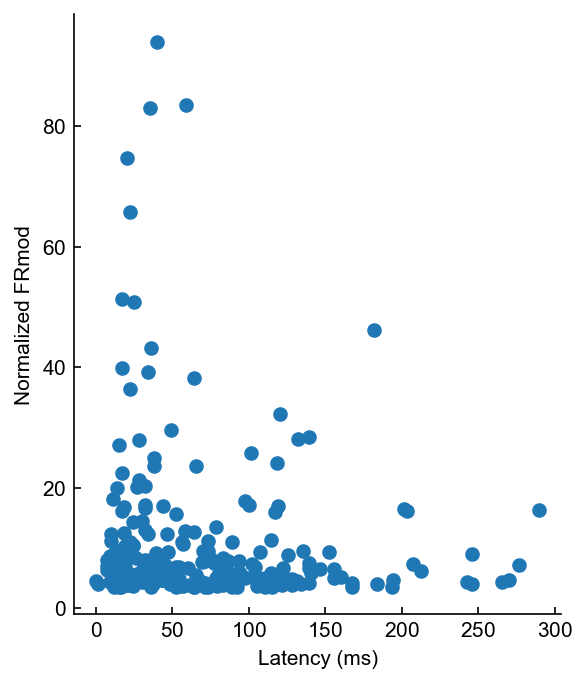

In [56]:
def add_axis_size(fig, ax_w, ax_h, left, bottom):
    fig_w, fig_h = fig.get_size_inches()
    ax = fig.add_axes([left/fig_w, bottom/fig_h, ax_w/fig_w, ax_h/fig_h])
    return ax
def make_axis_size(ax_w, ax_h, left=.3, bottom=.3, right=0, top=0):
    fig_w = (ax_w + left + right) * 1.05
    fig_h = (ax_h + bottom + top) * 1.05
    fig = plt.figure(figsize=(fig_w, fig_h))
    ax = add_axis_size(fig, ax_w, ax_h, left, bottom)
    return fig, ax
fig,ax = make_axis_size(3.25, 4, left=.3, bottom=.3, right=0, top=0)

mask_CR = np.greater_equal(FRmod_off,3.5)
mask_NCR = np.less(FRmod_off,3.5)
mask_ON_CR = np.greater_equal(FRmod_on,3.5)
mask = np.logical_and(mask_ON_CR,mask_CR)
# mask = mask_NCR
plt.scatter(latency_on[mask_ON_CR],FRmod_on[mask_ON_CR])

xlab = ax.set_xlabel('Latency (ms)')
ylab = ax.set_ylabel('Normalized FRmod')
artists = [xlab,ylab]

# fig.savefig(os.path.join('D:\\\\Figures','Manuscript Figures','Opsin modulation latency CR V'+str(current_version)+'.pdf'),transparent=False,facecolor="white", bbox_extra_artists=(artists), bbox_inches='tight')

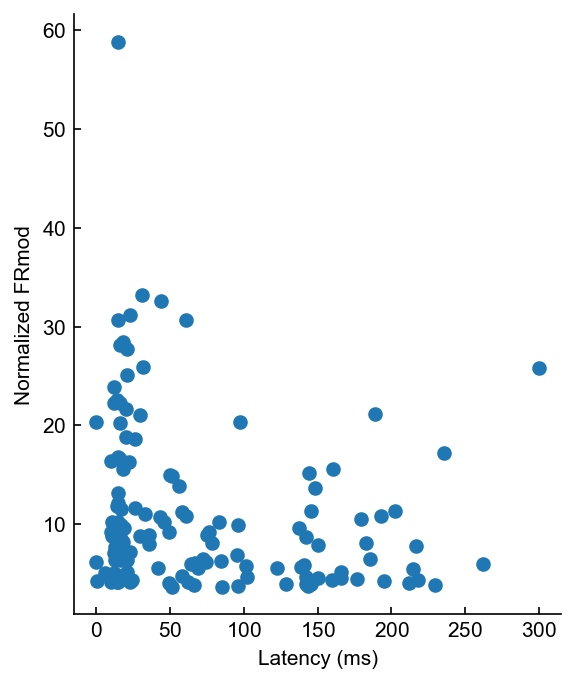

In [57]:
def add_axis_size(fig, ax_w, ax_h, left, bottom):
    fig_w, fig_h = fig.get_size_inches()
    ax = fig.add_axes([left/fig_w, bottom/fig_h, ax_w/fig_w, ax_h/fig_h])
    return ax
def make_axis_size(ax_w, ax_h, left=.3, bottom=.3, right=0, top=0):
    fig_w = (ax_w + left + right) * 1.05
    fig_h = (ax_h + bottom + top) * 1.05
    fig = plt.figure(figsize=(fig_w, fig_h))
    ax = add_axis_size(fig, ax_w, ax_h, left, bottom)
    return fig, ax
fig,ax = make_axis_size(3.25, 4, left=.3, bottom=.3, right=0, top=0)

mask_CR = np.greater_equal(FRmod_control_off,3.5)
mask_NCR = np.less(FRmod_control_off,3.5)
mask_ON_CR = np.greater_equal(FRmod_control_on,3.5)
mask = np.logical_and(mask_ON_CR,mask_CR)
# mask = mask_NCR
plt.scatter(latency_control_on[mask_ON_CR],FRmod_control_on[mask_ON_CR])

xlab = ax.set_xlabel('Latency (ms)')
ylab = ax.set_ylabel('Normalized FRmod')
artists = [xlab,ylab]

# fig.savefig(os.path.join('D:\\\\Figures','Manuscript Figures','Opsin modulation latency CR V'+str(current_version)+'.pdf'),transparent=False,facecolor="white", bbox_extra_artists=(artists), bbox_inches='tight')

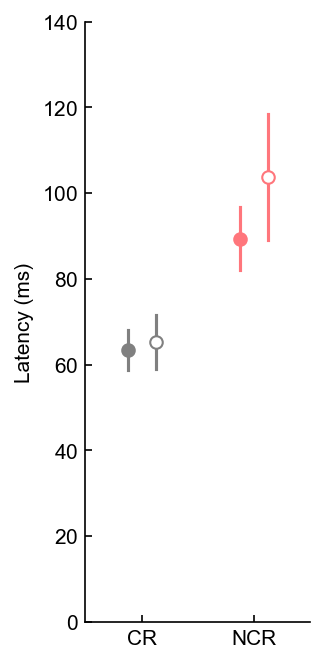

In [73]:
def add_axis_size(fig, ax_w, ax_h, left, bottom):
    fig_w, fig_h = fig.get_size_inches()
    ax = fig.add_axes([left/fig_w, bottom/fig_h, ax_w/fig_w, ax_h/fig_h])
    return ax
def make_axis_size(ax_w, ax_h, left=.3, bottom=.3, right=0, top=0):
    fig_w = (ax_w + left + right) * 1.05
    fig_h = (ax_h + bottom + top) * 1.05
    fig = plt.figure(figsize=(fig_w, fig_h))
    ax = add_axis_size(fig, ax_w, ax_h, left, bottom)
    return fig, ax
fig,ax = make_axis_size(1.5, 4, left=.3, bottom=.3, right=0, top=0)

mask_CR = np.greater_equal(FRmod_off,3.5)
mask_NCR = np.less(FRmod_off,3.5)
mask_ON_CR = np.greater_equal(FRmod_on,3.5)

mask1 = np.logical_and(mask_ON_CR,mask_CR)
dist1 = latency_on[mask1]
mean1 = np.mean(dist1)
sem1 = sem(dist1)
ax.scatter(0-0.125,mean1,c=CR_COLOR)
ax.plot([0-0.125]*2,[mean1-sem1,mean1+sem1],c=CR_COLOR)

mask2 = np.logical_and(mask_ON_CR,mask_NCR)
dist2 = latency_on[mask2]
mean2 = np.mean(dist2)
sem2 = sem(dist2)
ax.scatter(1-0.125,mean2,c=NCR_COLOR)
ax.plot([1-0.125]*2,[mean2-sem2,mean2+sem2],c=NCR_COLOR)




mask_control_CR = np.greater_equal(FRmod_control_off,3.5)
mask_control_NCR = np.less(FRmod_control_off,3.5)
mask_control_ON_CR = np.greater_equal(FRmod_control_on,3.5)

mask1c = np.logical_and(mask_control_ON_CR,mask_control_CR)
dist1c = latency_control_on[mask1c]
mean1c = np.mean(dist1c)
sem1c = sem(dist1c)
ax.scatter(0+0.125,mean1c,ec=CR_COLOR,fc='white',zorder=10)
ax.plot([0+0.125]*2,[mean1c-sem1c,mean1c+sem1c],c=CR_COLOR)

mask2c = np.logical_and(mask_control_ON_CR,mask_control_NCR)
dist2c = latency_control_on[mask2c]
mean2c = np.mean(dist2c)
sem2c = sem(dist2c)
ax.scatter(1+0.125,mean2c,ec=NCR_COLOR,fc='white',zorder=10)
ax.plot([1+0.125]*2,[mean2c-sem2c,mean2c+sem2c],c=NCR_COLOR)




ax.set_xticks([0,1])
ax.set_xticklabels(['CR','NCR'])
ylab = ax.set_ylabel('Latency (ms)')
artists = [ylab]

ax.set_xlim([-0.5,1.5])
ax.set_ylim([0,140])

fig.savefig(os.path.join('D:\\\\Figures','Manuscript Figures','Opsin modulation latency CR NCR V'+str(current_version)+'.pdf'),transparent=False,facecolor="white", bbox_extra_artists=(artists), bbox_inches='tight')

In [67]:
mannwhitneyu(dist1,dist2)

MannwhitneyuResult(statistic=3778.0, pvalue=0.0005900329111065044)

In [68]:
mannwhitneyu(dist1c,dist2c)

MannwhitneyuResult(statistic=702.5, pvalue=0.0034623742299367388)

In [69]:
mannwhitneyu(dist1,dist1c)

MannwhitneyuResult(statistic=9643.5, pvalue=0.15065449387852206)

In [70]:
mannwhitneyu(dist2,dist2c)

MannwhitneyuResult(statistic=634.5, pvalue=0.42100031477051847)

In [41]:
len(EnumOpsSession)

854

In [42]:
len(EnumSessionOps)

902

In [30]:
animals = ephys_animals
samp_animals = np.random.choice(animals,6,replace=False)
print(samp_animals)

['BS_42' 'BS_108' 'BS_56' 'BS_72' 'BS_70' 'BS_87']


In [61]:
animals = ['BS_42','BS_108','BS_56','BS_72','BS_70','BS_87']

In [33]:
sessionfile = ilep.loadSessionCached(ops_directory,'BS_131_5_opto_AC.pickle')

In [34]:
sessionfile.clusters.good

array([29, 30, 41, 42, 44, 47, 49, 50, 51, 53], dtype=int64)

In [35]:
len(sessionfile.clusters.good)

10

In [27]:
sessionfile = ilep.loadSessionCached(ops_directory,'BS_128_7_opto_AC.pickle')

In [29]:
sessionfile.clusters.good

array([ 0, 10, 16, 18, 21, 26, 31, 33, 35, 50, 52, 55, 69, 76, 78, 79, 80,
       81, 82, 83, 86, 87], dtype=int64)

In [30]:
len(sessionfile.clusters.good)

22

In [32]:
sessionfile.meta.date

'6/2/2022'